# Extracting audio from video

In [ ]:
#@title <font size="5">← ឵឵<i>Upgrade FFmpeg to v4.2.2</font> { vertical-output: true }
from IPython.display import clear_output
import os, urllib.request
HOME = os.path.expanduser("~")
pathDoneCMD = f'{HOME}/doneCMD.sh'
if not os.path.exists(f"{HOME}/.ipython/ttmg.py"):
    hCode = "https://raw.githubusercontent.com/yunooooo/gcct/master/res/ttmg.py"
    urllib.request.urlretrieve(hCode, f"{HOME}/.ipython/ttmg.py")

from ttmg import (
    loadingAn,
    textAn,
)

loadingAn(name="lds")
textAn("Installing Dependencies...", ty='twg')
os.system('pip install git+git://github.com/AWConant/jikanpy.git')
os.system('add-apt-repository -y ppa:jonathonf/ffmpeg-4')
os.system('apt-get update')
os.system('apt install mediainfo')
os.system('apt-get install ffmpeg')
clear_output()
print('Installation finished.')

Installation finished.


## Converting video to audio

In [ ]:
import os
import re
import sys
import subprocess

In [ ]:
def convert_video_to_audio(video_file, output_path,output_ext="wav"):
    print(video_file)
    filename, ext = os.path.splitext(video_file)
    output_path = output_path+'/'
    file_name = filename.split('/')[-1]
    dir_name= output_path+file_name+"_audio"
    # if not os.path.exists(dir_name):
    #   os.makedirs(dir_name)
    subprocess.call(["ffmpeg", "-y", "-i", video_file, f"{file_name}.{output_ext}"],
                    stdout=subprocess.DEVNULL,
                    stderr=subprocess.STDOUT)

In [ ]:
output_path = "./"

In [ ]:
audio_file = convert_video_to_audio("birthdayvid.mp4", output_path,output_ext="wav")
audio_file

birthdayvid.mp4


In [ ]:
pip install -U openai-whisper

# Importing AfriSpeech 200

In [ ]:
from datasets import load_dataset

afrispeech = load_dataset("tobiolatunji/afrispeech-200", "all")


# Setting up Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/Capstone

/content/drive/MyDrive/Capstone


In [ ]:
!ls "/content/drive/My Drive/Capstone"

'1_Unit 3 session 2 part 2.json'
'1_Unit 3 session 2 part 2openai_transcription.json'
'1_Unit 8 - Session 2 - Koya Biyu - Multiple Orange Slices II_gstt_transcription.json'
'1_Unit 8 - Session 2 - Koya Biyu - Multiple Orange Slices II_openai_transcription.json'
'2_Shifts in Voice, Mood, Tense and Number Part A (1)_gstt_transcription.json'
'2_Tutorial #2_nemo_transcription.json'
'2_Unit 5 - Session 3D - Koya Uku - Body Temperature (1)_gstt_transcription.json'
'2_WORKSHOP - Concept Map and the Systems Thinking Approach to Solution Design -  How Might We_gstt_transcriptions.json'
'2_WORKSHOP - Concept Map and the Systems Thinking Approach to Solution Design -  How Might We_transcription.json'
'2_WORKSHOP - Theoretical background to ideation Techniques & Rules_gstt_transcriptions.json'
'2_WORKSHOP - Theoretical background to ideation Techniques & Rules_transcription.json'
'3_Basic Punctuation Marks - Part D_gstt_transcriptions.json'
'3_Basic Punctuation Marks - Part D_transcription.json'
'

# Importing libraries

In [ ]:
import os
import json



In [ ]:
import shutil

# Visualizing dataset

In [ ]:
pip install librosa matplotlib numpy ipython

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.2 MB/s eta 0:00:00


In [ ]:
import librosa
import matplotlib.pyplot as plt

# for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test"):
#   for dir in dirs:
#     for audio_file in audio_files:
#       if audio_file.endswith(".mp3") or audio_file.endswith(".wav"):
#         #if audio_file.endswith(".mp3") or audio_file.endswith(".wav"):
#         audio_file_path = os.path.join(subdir, dir, audio_file)
#         print(f"Audio file path is: {audio_file_path}")
        # Load an audio file
        # audio_path = '/content/drive/My Drive/Capstone/test'
        # y, sr = librosa.load(audio_file_path, sr=None)
audio_path = '/content/drive/My Drive/Capstone/test/1_3/1_1_3.wav'
y, sr = librosa.load(audio_path, sr=None)

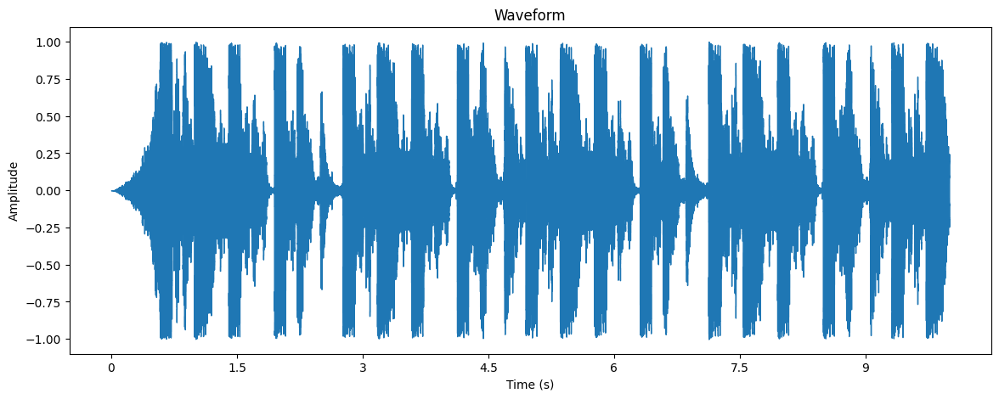

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()


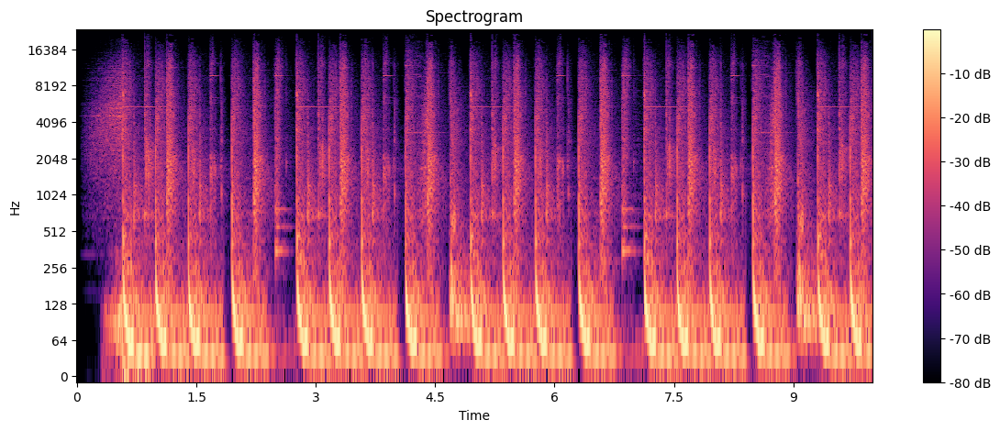

In [ ]:
import numpy as np
import librosa.display

# Compute the Short-Time Fourier Transform (STFT)
D = np.abs(librosa.stft(y))

# Convert to decibels
DB = librosa.amplitude_to_db(D, ref=np.max)

# Plot the spectrogram
plt.figure(figsize=(14, 5))
librosa.display.specshow(DB, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.show()


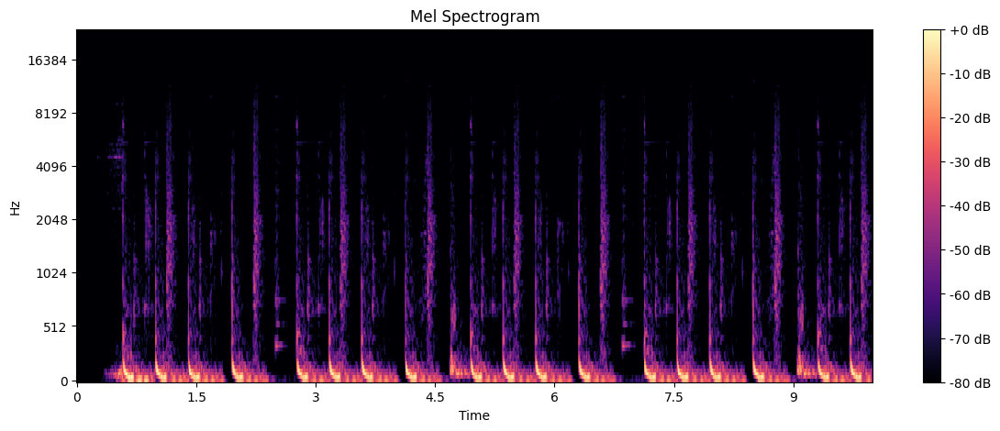

In [ ]:
# Compute the Mel spectrogram
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)

# Convert to decibels
S_DB = librosa.amplitude_to_db(S, ref=np.max)

# Plot the Mel spectrogram
plt.figure(figsize=(14, 5))
librosa.display.specshow(S_DB, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram')
plt.show()


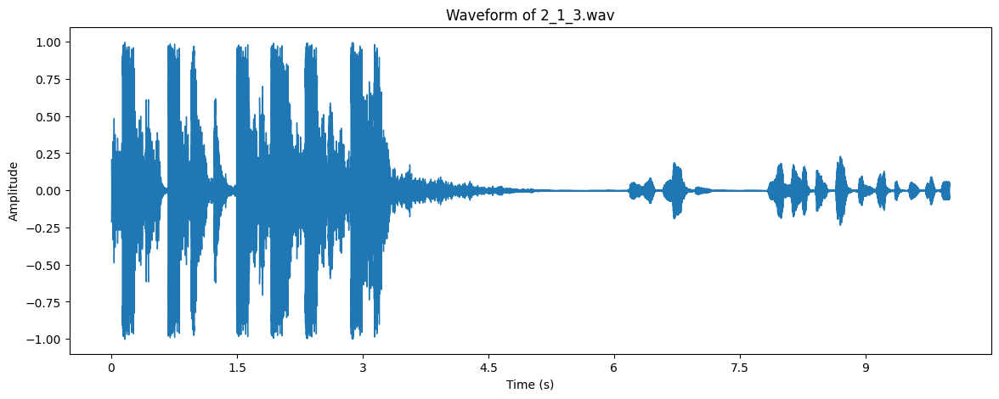

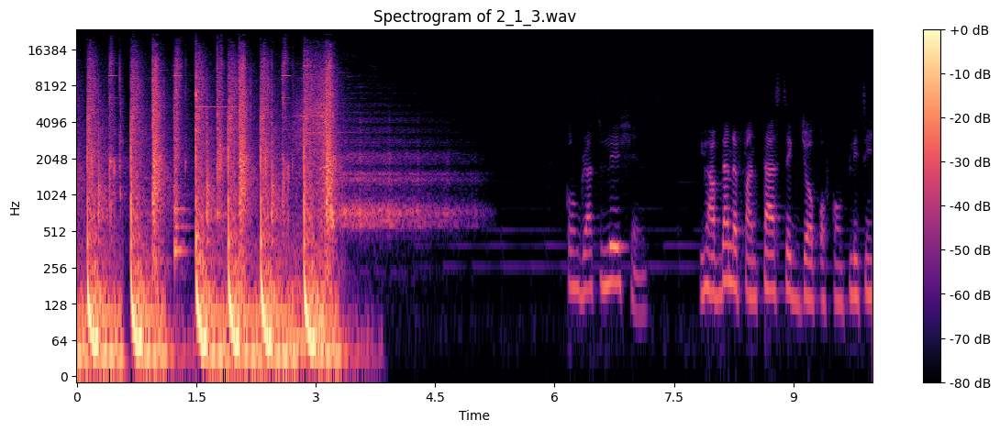

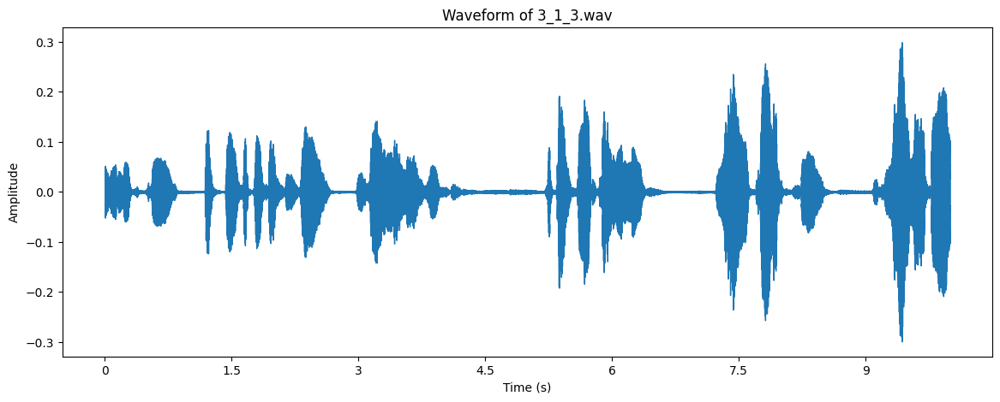

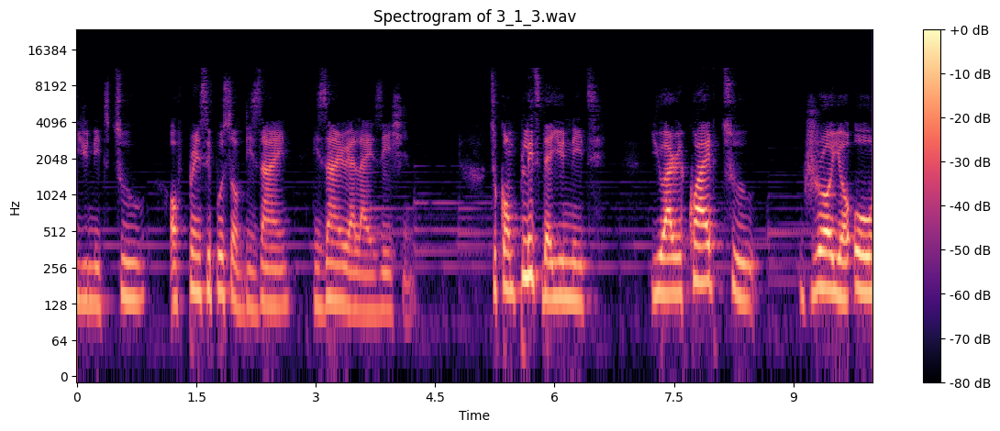

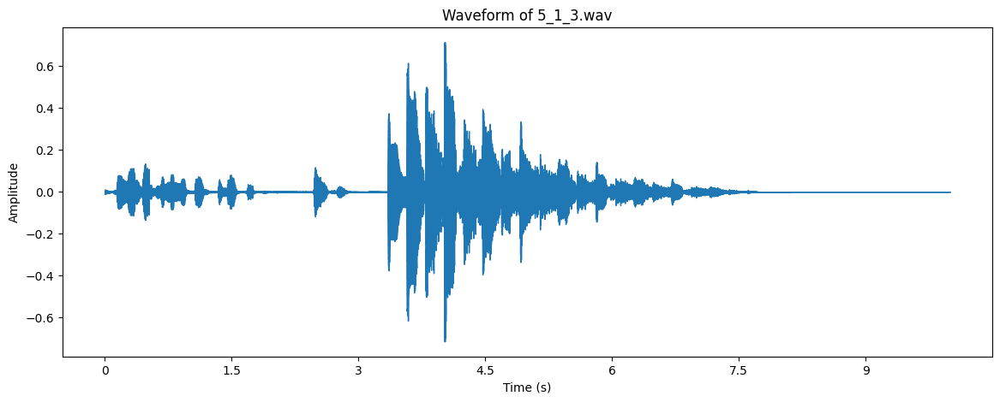

...

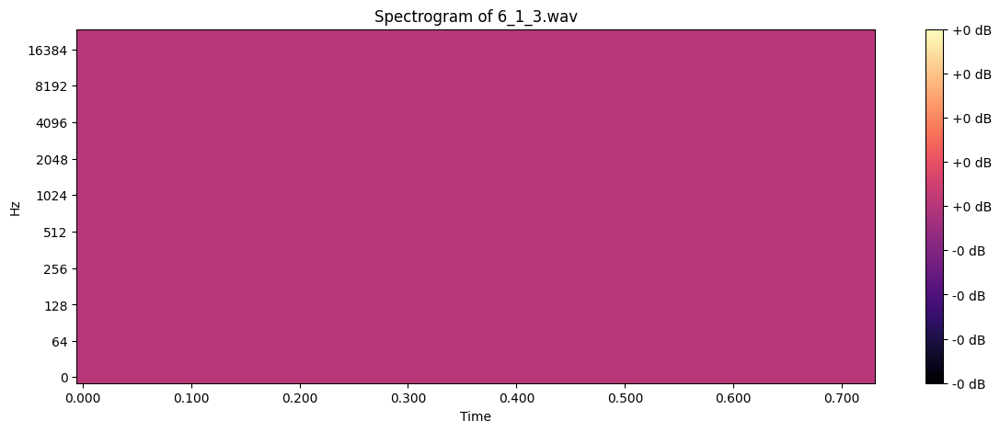

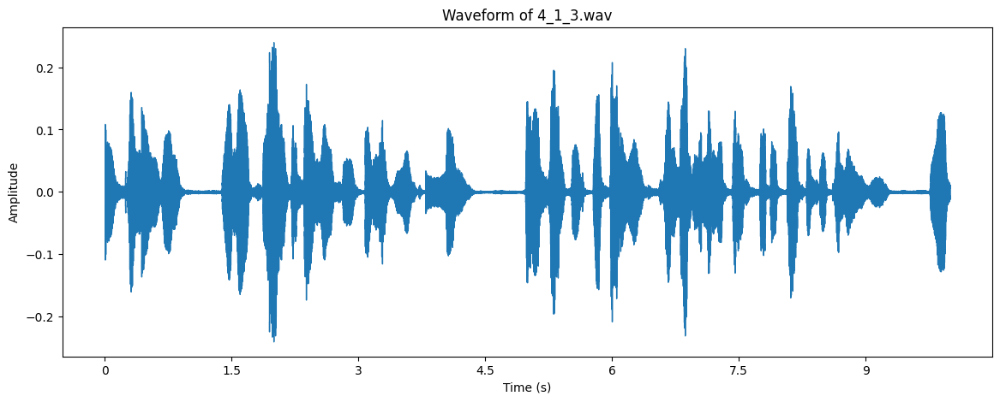

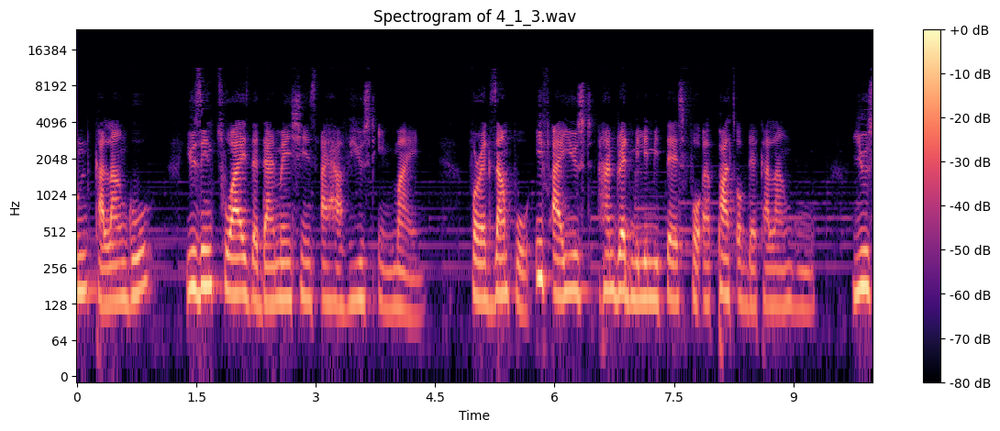

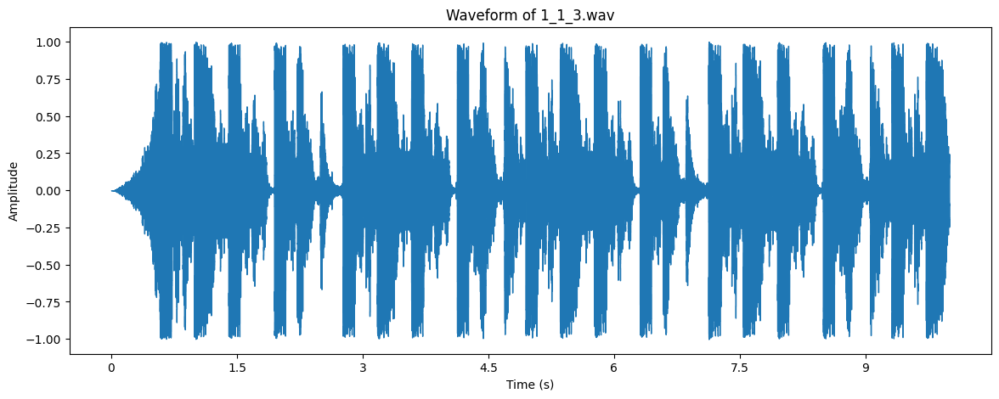

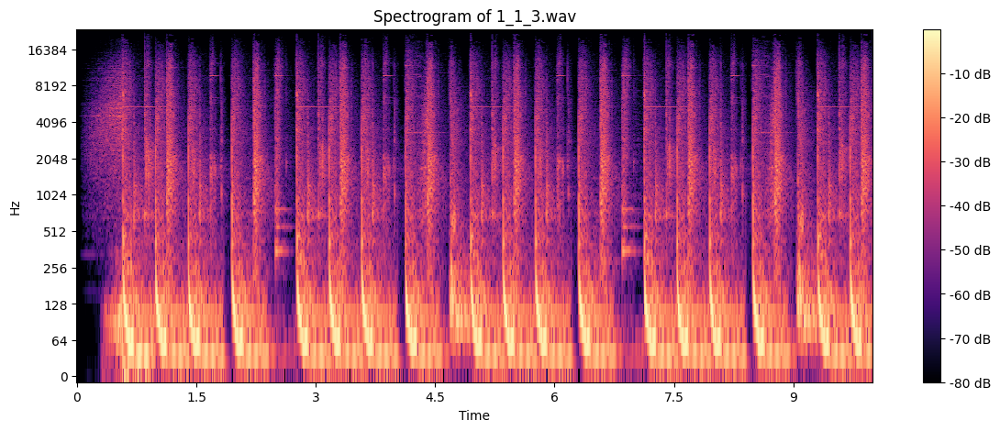

In [ ]:
import os

# Path to your dataset
dataset_path = '/content/drive/My Drive/Capstone/test/1_3'


# Iterate through each audio file in the dataset
for audio_file in os.listdir(dataset_path):
    if audio_file.endswith('.wav'):
        audio_path = os.path.join(dataset_path, audio_file)
        y, sr = librosa.load(audio_path, sr=None)

        # Plot waveform
        plt.figure(figsize=(14, 5))
        librosa.display.waveshow(y, sr=sr)
        plt.title(f'Waveform of {audio_file}')
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        plt.show()

        # Plot spectrogram
        D = np.abs(librosa.stft(y))
        DB = librosa.amplitude_to_db(D, ref=np.max)
        plt.figure(figsize=(14, 5))
        librosa.display.specshow(DB, sr=sr, x_axis='time', y_axis='log')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Spectrogram of {audio_file}')
        plt.show()


In [ ]:
import os

# Path to your dataset
dataset_path = 'path/to/your/audio/dataset'

for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test"):
  for dir in dirs:
# Iterate through each audio file in the dataset
    for audio_file in audio_files:
    # for audio_file in os.listdir(dataset_path):
        if audio_file.endswith('.wav'):
            audio_path = os.path.join(dataset_path, audio_file)
            y, sr = librosa.load(audio_path, sr=None)

            # Plot waveform
            plt.figure(figsize=(14, 5))
            librosa.display.waveshow(y, sr=sr)
            plt.title(f'Waveform of {audio_file}')
            plt.xlabel('Time (s)')
            plt.ylabel('Amplitude')
            plt.show()

            # Plot spectrogram
            D = np.abs(librosa.stft(y))
            DB = librosa.amplitude_to_db(D, ref=np.max)
            plt.figure(figsize=(14, 5))
            librosa.display.specshow(DB, sr=sr, x_axis='time', y_axis='log')
            plt.colorbar(format='%+2.0f dB')
            plt.title(f'Spectrogram of {audio_file}')
            plt.show()


# AUDIO TRANSCRIPTION

## Using OpenAI Whisper

### Installing Whisper

In [ ]:
pip install -U openai-whisper

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.6/798.6 kB 16.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cuspa

In [ ]:
import whisper


In [ ]:
#@title Using Whisper Model to transcribe
def asr_pipeline_local(audio_folder: str) -> str:
    """
    This function takes in a folder containing
    audio files locally and transcribes them using the
    whisper model. The transcriptions are then
    stored in a json file and returned.

    Parameters:
    - audio_folder (str): The path to the folder containing audio files.

    Returns:
    - json_file (str): The path to the generated json file containing the transcriptions.
    """
    model = whisper.load_model("medium.en")
    # Get the list of audio files in the folder
    audio_files = os.listdir(audio_folder)

    # Create a dictionary to store the transcriptions
    transcriptions = {}

    # Loop through the audio files and transcribe them
    for audio_file in audio_files:

        if audio_file.endswith(".mp3") or audio_file.endswith(".wav") or audio_file.endswith(".m4a"):
            # Get the audio file path
            audio_file_path = os.path.join(audio_folder, audio_file)

            # Transcribe the audio file
            transcription = model.transcribe(audio_file_path)

            # Store the transcription in the dictionary
            transcriptions[audio_file] = transcription["text"]

    print(transcriptions)

    # Convert the dictionary to a json file
    json_file = "new_openai_transcription.json"
    with open(json_file, "w") as json_file:
        print(json.dump(transcriptions, json_file, indent=4))
        # os.rename(str(json_file), os.path.join(audio_folder, "openai_transcription.json"))

    # os.rename(str(json_file), os.path.join(audio_folder, "transcription.json"))

    return json_file

### Testing audios on Whisper

In [ ]:
#@title trial
# for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test/3_Tutorial #4"):
#   for audio_file in audio_files:
#     if audio_file.endswith(".mp3") or audio_file.endswith(".wav"):
#       audio_file_path = os.path.join(subdir, audio_file)
#       asr_pipeline_local(audio_file_path)


In [ ]:
#@title Rename and relocate transcriptions
def rename_and_relocate_transcription(json_file_path, dest_folder):

  #renaming folder
  with open(json_file, "r") as json_file:

    os.rename(str(json_file_path), os.path.join("", json_file_path))

  #Creating folder if it does not exist
  if not os.path.exists(dest_folder):
    os.makedirs(dest_folder)
  dest_path = os.path.join(dest_folder, os.path.basename(json_file_path))
  shutil.move(json_file_path, dest_folder)
  print(f"File moved from src path {json_file_path} to destination folder {dest_folder}")

  return json_file_path

#### Minutes trial

In [ ]:
asr_pipeline_local("/content/drive/My Drive/Capstone/sample folder/mins")

100%|█████████████████████████████████████| 1.42G/1.42G [12:56<00:00, 1.97MiB/s]


{'mins.m4a': " Okay, so the president should be the main point of contact for the choir with George. So any information must pass through the president to us. Any updates must pass through the president to George. And I believe the president should handle all general communications to the main group. Like, okay, we are planning this, we need your input, this and this and that. Because all that is internal. Life has to do with communication outside of the group. That's when the public relations can't come in. So within the group, the president is in charge of communicating with George and communicating with the team. And taking lead on all formal planning. Okay, sorry. I'm also recording. I'm also recording. So just taking lead on all planning. And planning. So executive meetings. If they come and need to call an emergency meeting, it's in the hands of the president. Exactly. And yeah, so this is what I think. Is there anything else that you guys think we need to add? The president shou

<_io.TextIOWrapper name='openai_transcription.json' mode='w' encoding='UTF-8'>

In [ ]:
json_file = "/content/drive/My Drive/Capstone/openai_transcription.json"
with open(json_file, "r") as json_file:
  data = json.load(json_file)
  print(data)


{'mins.m4a': " Okay, so the president should be the main point of contact for the choir with George. So any information must pass through the president to us. Any updates must pass through the president to George. And I believe the president should handle all general communications to the main group. Like, okay, we are planning this, we need your input, this and this and that. Because all that is internal. Life has to do with communication outside of the group. That's when the public relations can't come in. So within the group, the president is in charge of communicating with George and communicating with the team. And taking lead on all formal planning. Okay, sorry. I'm also recording. I'm also recording. So just taking lead on all planning. And planning. So executive meetings. If they come and need to call an emergency meeting, it's in the hands of the president. Exactly. And yeah, so this is what I think. Is there anything else that you guys think we need to add? The president shou

In [ ]:
with open("mins.txt", 'w') as file:
  for key, value in data.items():
    file.write(f"{key}: {value}\n")

In [ ]:
shutil.move("mins.txt", "/content/drive/My Drive/Capstone/sample folder/mins")

'/content/drive/My Drive/Capstone/sample folder/mins/mins.txt'

In [ ]:
!ls "/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions"

'/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions'


In [ ]:
asr_pipeline_local("/content/drive/My Drive/Capstone/test/1_1. Faculty Introduction (Kwabena)")

100%|█████████████████████████████████████| 1.42G/1.42G [00:42<00:00, 35.8MiB/s]


{'1_1_1. Faculty Introduction (Kwabena).wav': ' Music', '3_1_1. Faculty Introduction (Kwabena).wav': ' bound for computer science faculty at a Sherston University, a private not-for-profit university located right here in Accra, Ghana. To date, I have thought of', '4_1_1. Faculty Introduction (Kwabena).wav': " over 300 students both in person and online. I'm very excited to be your instructor on this course. I have a bachelor's degree and master's degree.", '6_1_1. Faculty Introduction (Kwabena).wav': " video games. On that note, I can't wait to get started with you. See you soon. Bye.", '5_1_1. Faculty Introduction (Kwabena).wav': " both in computer science. I love teaching, mostly in computing and especially to undergraduates. When I'm not teaching, you'll find me watching football or playing.", '2_1_1. Faculty Introduction (Kwabena).wav': " Hello, and welcome to the World's Best Technology Module.", '7_1_1. Faculty Introduction (Kwabena).wav': ' you'}
None


<_io.TextIOWrapper name='new_openai_transcription.json' mode='w' encoding='UTF-8'>

In [ ]:
os.rename("/content/drive/My Drive/Capstone/new_openai_transcription.json", "/content/drive/My Drive/Capstone/1_1. Faculty Introduction (Kwabena)_openai_transcription.json")


In [ ]:
shutil.move("/content/drive/My Drive/Capstone/1_1. Faculty Introduction (Kwabena)_openai_transcription.json", "/content/drive/My Drive/Capstone/sample folder/transcriptions/openai_transcriptions")

'/content/drive/My Drive/Capstone/sample folder/transcriptions/openai_transcriptions/1_1. Faculty Introduction (Kwabena)_openai_transcription.json'

In [ ]:
shutil.move("/content/drive/My Drive/Capstone/1_1. Faculty Introduction (Kwabena)_openai_transcription.json", "/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions")

'/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/1_1. Faculty Introduction (Kwabena)_openai_transcription.json'

In [ ]:
#@title Transcribing entire folder
for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test"):
  for dir in dirs:
    #if audio_file.endswith(".mp3") or audio_file.endswith(".wav"):
    audio_file_path = os.path.join(subdir, dir)
    print(f"Audio file path is: {audio_file_path}")
    # print(os.listdir(audio_file_path))
    asr_pipeline_local(audio_file_path)
    new_name = dir + "_openai_transcription.json"
    # rename_and_relocate_transcription(audio_file_path, "openai_transcriptions")
    os.rename("/content/drive/My Drive/Capstone/new_openai_transcription.json", new_name)
    shutil.move(new_name, "/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions")


Audio file path is: /content/drive/My Drive/Capstone/test/1_1. Faculty Introduction (Kwabena)
{'1_1_1. Faculty Introduction (Kwabena).wav': ' Music', '3_1_1. Faculty Introduction (Kwabena).wav': ' bound for computer science faculty at a Sherston University, a private not-for-profit university located right here in Accra, Ghana. To date, I have thought of', '4_1_1. Faculty Introduction (Kwabena).wav': " over 300 students both in person and online. I'm very excited to be your instructor on this course. I have a bachelor's degree and master's degree.", '6_1_1. Faculty Introduction (Kwabena).wav': " video games. On that note, I can't wait to get started with you. See you soon. Bye.", '5_1_1. Faculty Introduction (Kwabena).wav': " both in computer science. I love teaching, mostly in computing and especially to undergraduates. When I'm not teaching, you'll find me watching football or playing.", '2_1_1. Faculty Introduction (Kwabena).wav': " Hello, and welcome to the World's Best Technology 

Error: Destination path '/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/1_Unit 8 - Session 2 - Koya Biyu - Multiple Orange Slices II_openai_transcription.json' already exists

### Checking frame rate

In [ ]:
import wave

In [ ]:
# def frame_rate_channel(audio_file_name):
#     print(audio_file_name)
#     with wave.open(audio_file_name, "rb") as wave_file:
#         frame_rate = wave_file.getframerate()
#         channels = wave_file.getnchannels()
#         return frame_rate,channels

### Sorting the transcriptions in the files

In [ ]:
def sort_json_content(json_file_path):
    # Read the JSON file
    with open(json_file_path, 'r') as file:
        data = json.load(file)

    # Create a list of tuples containing the extracted numbers and the lines
    lines_with_numbers = [(int(key.split('_')[0]), key, value) for key, value in data.items()]

    # Sort the list of tuples based on the extracted numbers
    sorted_lines = sorted(lines_with_numbers, key=lambda x: x[0])

    # Create a new dictionary with sorted contents
    sorted_data = {f"{index}_{key.split('_')[1]}_{json_file_path}": value for index, key, value in sorted_lines}

    # Write the sorted data back to the JSON file
    with open(json_file_path, 'w') as file:
        json.dump(sorted_data, file, indent=4)


In [ ]:
#@title Resorting files
import json
import re

def transform_json(data):
    """Transforms the JSON data by creating a new dictionary with the desired keys."""

    new_data = {}
    for key, value in data.items():
        # match = re.match(r"(\d+)_.*/([^/\\]+)\.json$", key)
        match = re.match(r"(\d+)_.*/([^/\\]+)_openai_transcription\.json$", key)
        if match:
            number, filename = match.groups()
            filename = filename.replace("Copy of ", "")
            new_key = f"{number}_{filename}.wav"
            new_data[new_key] = value
        else:
            print(f"Warning: Unexpected key format: {key}")
    print(new_data)
    return new_data




In [ ]:
#@title Sorting all files in the folder
for root, dirs, files in os.walk("/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions"):
  for file in files:
    # if file.endswith(".json"):
    file_path = os.path.join(root, file)
    sort_json_content(file_path)

In [ ]:
#@title Resorting all files 3.0
for root, dirs, files in os.walk("/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions"):
  for file in files:
    # if file.endswith(".json"):
    file_path = os.path.join(root, file)
    with open(file_path, 'r') as file:
      data = json.load(file)
    sorted_data=transform_json(data)
    # print(sorted_data)
    with open(file_path, 'w') as file:
      json.dump(sorted_data, file, indent=4)

{'1_1_1. Faculty Introduction (Kwabena).wav': ' Music', '2_1_1. Faculty Introduction (Kwabena).wav': " Hello, and welcome to the World's Best Technology Module.", '3_1_1. Faculty Introduction (Kwabena).wav': ' bound for computer science faculty at a Sherston University, a private not-for-profit university located right here in Accra, Ghana. To date, I have thought of', '4_1_1. Faculty Introduction (Kwabena).wav': " over 300 students both in person and online. I'm very excited to be your instructor on this course. I have a bachelor's degree and master's degree.", '5_1_1. Faculty Introduction (Kwabena).wav': " both in computer science. I love teaching, mostly in computing and especially to undergraduates. When I'm not teaching, you'll find me watching football or playing.", '6_1_1. Faculty Introduction (Kwabena).wav': " video games. On that note, I can't wait to get started with you. See you soon. Bye.", '7_1_1. Faculty Introduction (Kwabena).wav': ' you'}
{'1_1_Arguments and the Aural M

###Data cleaning

In [ ]:
def clean_data(file_path):
  with open(file_path, "r") as file:
    data = json.load(file)
    # lines = file.readlines()

  previous_word = None

  for key, value in data.items():
    indices = key[0]
    # prev_repetition = value[1]

    #Getting rid of word "music" (replacing with empty space)
    if "Music" in value:
        data[key] = value.replace("Music", "")

    value_words = value.split()

    #Removing duplicate words
    if previous_word:
      current_word = value_words[0] if value_words else None

      if current_word:
        print(f"Comparing '{previous_word}' from previous iteration with '{current_word}' in current iteration")
        # Add your comparison logic here
        if previous_word == current_word:
            print(f"Match found: '{previous_word}' is the same as '{current_word}'")
        else:
            print(f"No match: '{previous_word}' is different from '{current_word}'")

    # Update previous_word for the next iteration
    # Here we are using the last word of the current value
    previous_word = words[-1] if words else None

    if value_words[-1] == value[-2]:
      value[-1] = value[-1].replace(value, "")
    # if value[index] = value[index-1]
    #   replace(value[index], "")

  # Create a list of tuples containing the extracted numbers and the lines
  # number_and_transcription = [(int(key.split(':')[0]), key, value) for key, value in data.items()]
  # print(number_and_transcription)

  # Sort the list of tuples based on the extracted numbers
  # sorted_lines = sorted(lines_with_numbers, key=lambda x: x[0])

    # Write the sorted data back to the JSON file
  # with open(file_path, 'w') as file:
  #   json.dump(sorted_data, file, indent=4)

In [ ]:
#Removing duplicate words


## Using Google Cloud's API

In [ ]:
#@title Install Google Cloud's Speech Library

!pip install -q google-cloud-speech
from google.cloud import speech

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.4/289.4 kB 2.4 MB/s eta 0:00:00


In [ ]:
import io

In [ ]:

#@title Authenticate with Google Cloud and your project ID

from google.colab import auth

gcp_project_id = 'enter project id' # @param {type: "string"}

auth.authenticate_user(project_id=gcp_project_id)

In [ ]:
#@title [Run once per project] Enable the Google Cloud speech-to-text API

!gcloud services enable speech.googleapis.com

In [ ]:
#@title Setup
from google.cloud import speech


def speech_to_text(
    config: speech.RecognitionConfig,
    audio: speech.RecognitionAudio,
) -> speech.RecognizeResponse:
    client = speech.SpeechClient()

    # Synchronous speech recognition request
    response = client.recognize(config=config, audio=audio)

    return response


def print_response(response: speech.RecognizeResponse):
    for result in response.results:
        print_result(result)


def print_result(result: speech.SpeechRecognitionResult):
    best_alternative = result.alternatives[0]
    print("-" * 80)
    print(f"language_code: {result.language_code}")
    print(f"transcript:    {best_alternative.transcript}")
    print(f"confidence:    {best_alternative.confidence:.0%}")


In [ ]:
#@title Transcribe audio
from google.cloud.speech_v2 import SpeechClient
from google.cloud.speech_v2.types import cloud_speech
from google.cloud import speech_v1p1beta1 as speech
# import json

def gstt_pipeline_local(audio_folder: str) -> str:
    """
    This function takes in a folder containing
    audio files locally and transcribes them using the
    Google Speech-to-Text API. The transcriptions are then
    stored in a json file and returned.

    Parameters:
    - audio_folder (str): The path to the folder containing audio files.

    Returns:
    - json_file (str): The path to the generated json file containing the transcriptions.
    """
    # Initialize Google Speech-to-Text client
    client = speech.SpeechClient()

    # Get the list of audio files in the folder
    audio_files = os.listdir(audio_folder)

    # Create a dictionary to store the transcriptions
    transcriptions = {}

    # Loop through the audio files and transcribe them
    for audio_file in audio_files:
        if audio_file.endswith(".wav")or audio_file.endswith(".mp3"):
            # Get the audio file path
            audio_file_path = os.path.join(audio_folder, audio_file)

            # Read the audio file
            with io.open(audio_file_path, "rb") as audio_file:
                content = audio_file.read()

            # Configure the audio input
            audio = speech.RecognitionAudio(content=content)
            config = speech.RecognitionConfig(
                audio_channel_count = 2,
                encoding=speech.RecognitionConfig.AudioEncoding.LINEAR16,
                language_code="en-US",
            )

            # Perform the transcription
            response = client.recognize(config=config, audio=audio)

            # Store the transcription in the dictionary
            transcription = ""
            for result in response.results:
                transcription += result.alternatives[0].transcript
                # print(transcription)
            transcriptions[str(audio_file)] = transcription
            print(transcriptions)

    # Convert the dictionary to a json file
    json_file = "gstt_transcription.json"
    with open(json_file, "w") as json_file:
        json.dump(transcriptions, json_file, indent=4)

    return json_file


### Testing audios on GSTT

In [ ]:
import os
import json

In [ ]:
for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test"):
  for dir in dirs:
    #if audio_file.endswith(".mp3") or audio_file.endswith(".wav"):
    audio_file_path = os.path.join(subdir, dir)
    print(f"Audio file path is: {audio_file_path}")

Audio file path is: /content/drive/My Drive/Capstone/test/1_5
Audio file path is: /content/drive/My Drive/Capstone/test/1_1. Faculty Introduction (Kwabena)
Audio file path is: /content/drive/My Drive/Capstone/test/1_3
Audio file path is: /content/drive/My Drive/Capstone/test/1_Adding New Functions that take Arguments
Audio file path is: /content/drive/My Drive/Capstone/test/1_Arguments and the Aural Mode
Audio file path is: /content/drive/My Drive/Capstone/test/1_Aspirations Engineering-Examples
Audio file path is: /content/drive/My Drive/Capstone/test/1_Basic Punctuation Marks - Part D
Audio file path is: /content/drive/My Drive/Capstone/test/1_Basic Punctuation Marks Part B
Audio file path is: /content/drive/My Drive/Capstone/test/1_Built-In Functions
Audio file path is: /content/drive/My Drive/Capstone/test/1_Conclusion
Audio file path is: /content/drive/My Drive/Capstone/test/1_Design-Build Challenge #1 Debrief
Audio file path is: /content/drive/My Drive/Capstone/test/1_Design-Buil

KeyboardInterrupt: 

In [ ]:
#@title Transcribing entire folder
for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test/transcribe"):
  for dir in dirs:
    #if audio_file.endswith(".mp3") or audio_file.endswith(".wav"):
    audio_file_path = os.path.join(subdir, dir)
    print(f"Audio file path is: {audio_file_path}")
    # print(os.listdir(audio_file_path))
    gstt_pipeline_local(audio_file_path)
    new_name = dir + "_gstt_transcription.json"
    # rename_and_relocate_transcription(audio_file_path, "openai_transcriptions")
    os.rename("/content/drive/My Drive/Capstone/gstt_transcription.json", new_name)
    shutil.move(new_name, "/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/new")


Audio file path is: /content/drive/My Drive/Capstone/test/transcribe/1_session6 A
{"<_io.BufferedReader name='/content/drive/My Drive/Capstone/test/transcribe/1_session6 A/11_1_session6 A.wav'>": "in this expression we don't have brackets we don't have the off and we don't have division but we have multiplication so we can"}
{"<_io.BufferedReader name='/content/drive/My Drive/Capstone/test/transcribe/1_session6 A/11_1_session6 A.wav'>": "in this expression we don't have brackets we don't have the off and we don't have division but we have multiplication so we can", "<_io.BufferedReader name='/content/drive/My Drive/Capstone/test/transcribe/1_session6 A/12_1_session6 A.wav'>": 'go with M so we have multiplication first Then followed by addition Then followed by subtraction so'}
{"<_io.BufferedReader name='/content/drive/My Drive/Capstone/test/transcribe/1_session6 A/11_1_session6 A.wav'>": "in this expression we don't have brackets we don't have the off and we don't have division but we

InvalidArgument: 400 Must use single channel (mono) audio, but WAV header indicates 1 channels.

In [ ]:
#@title Convert to mono channel 2
!pip install pydub

import wave
from pydub import AudioSegment

def convert_to_mono2(audio_folder):
    for file_name in os.listdir(audio_folder):
        if file_name.endswith(".wav") or file_name.endswith(".mp3") or file_name.endswith(".m4a"):
            audio_path = os.path.join(audio_folder, file_name)
            audio = AudioSegment.from_file(audio_path)
            mono_audio = audio.set_channels(1)
            mono_audio.export(audio_path, format="wav")
            print(f"Converted {file_name} to mono.")

In [ ]:
shutil.move("/content/drive/My Drive/Capstone/1_3_gstt_transcription.json", "/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/transcriptions_test/sorted")


'/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/transcriptions_test/sorted/1_3_gstt_transcription.json'

In [ ]:
import re

def clean_keys(data):
    cleaned_data = {}
    for key, value in data.items():
        # Remove unwanted parts from the key
        cleaned_key = re.sub(r"<_io\.BufferedReader name='(.*)'>", r"\1", key)
        cleaned_data[cleaned_key] = value
    return cleaned_data

In [ ]:
#@title extract general
def extract_number(key):
    key_name =key.split('/')[-1]
    key_number = key_name.split('_')[0]
    extracted_key = key_number.split(':')[-1]
    return extracted_key

In [ ]:
#@title Sorting
def sort_json_content(json_file_path):
    # Read the JSON file
    with open(json_file_path, 'r') as file:
      data = json.load(file)

    # Clean the keys
    # cleaned_data = clean_keys(data)
    # print(cleaned_data)

    tuple_of_indices = []
    indices = []

    for key, value in data.items():
      index = extract_number(key)
      # print(index)
      indices.append(index)
      tuple_of_indices.append((int(index), value))
      # print(tuple_of_indices)
    # print(indices)
    # print(tuple_of_indices)

    # Sort the list of tuples based on the extracted numbers
    sorted_lines = sorted(tuple_of_indices, key=lambda x: x[0])
    print(sorted_lines)

    # Create a new dictionary with sorted contents
    # sorted_data = {f"{index}{json_file_path}": value for index, value in sorted_lines}
    sorted_data = {f"{index}_{key.split('/')[-1]}": value for index, value in sorted_lines}
    print(sorted_data)

    # Write the sorted data back to the JSON file
    # with open(json_file_path, 'w') as file:
    #   for key in sorted_data.keys():
    #     if "(1)" in key:
    #       new_key = key.replace("(1)", "")
    #       json.dump(sorted_data[new_key], file, indent=4)
    #     json.dump(sorted_data, file, indent=4)
    with open(json_file_path, 'w') as file:
      json.dump(sorted_data, file, indent=4)



In [ ]:
#@title Sorting with cleaning
def sort_and_clean_json_content(json_file_path):
    # Read the JSON file
    with open(json_file_path, 'r') as file:
      data = json.load(file)

    # Clean the keys
    cleaned_data = clean_keys(data)
    print(cleaned_data)

    tuple_of_indices = []
    indices = []

    for key, value in cleaned_data.items():
      index = extract_number(key)
      # print(index)
      indices.append(index)
      tuple_of_indices.append((int(index), value))
      # print(tuple_of_indices)
    # print(indices)
    # print(tuple_of_indices)

    # Sort the list of tuples based on the extracted numbers
    sorted_lines = sorted(tuple_of_indices, key=lambda x: x[0])
    print(sorted_lines)

    # Create a new dictionary with sorted contents
    # sorted_data = {f"{index}{json_file_path}": value for index, value in sorted_lines}
    sorted_data = {f"{index}_{key.split('/')[-1][2:]}": value for index, value in sorted_lines}
    print(sorted_data)

    # Write the sorted data back to the JSON file
    # with open(json_file_path, 'w') as file:
    #   for key in sorted_data.keys():
    #     if "(1)" in key:
    #       new_key = key.replace("(1)", "")
    #       json.dump(sorted_data[new_key], file, indent=4)
    #     json.dump(sorted_data, file, indent=4)
    with open(json_file_path, 'w') as file:
      json.dump(sorted_data, file, indent=4)



In [ ]:
#@title Sorting files
def sorting_files(json_file_path):
  with open(json_file_path, 'r') as file:
    data = json.load(file)

  # Clean the keys
  cleaned_data = clean_keys(data)
  tuple_of_indices = []
  indices = []

  for key, value in cleaned_data.items():
    # Create a list of tuples containing the extracted numbers and the lines
    index = extract_number(key)
    # print(index)
    indices.append(index)
    tuple_of_indices.append((int(index), value))
    # print(tuple_of_indices)

  #Sorting indices in transcriptions
  sorted_lines = sorted(tuple_of_indices, key=lambda x: x[0])
  # print(sorted_lines)

  # Create a new dictionary with sorted contents
  sorted_data = {f"{index}_{key.split('/')[-1][2:]}": value for index, value in sorted_lines}
  print(sorted_data)

  # Write the sorted data back to the JSON file
  with open(json_file_path, 'w') as file:
      json.dump(sorted_data, file, indent=4)



In [ ]:
 #@title Sorting all files in the transcriptions_test folder
for root, dirs, files in os.walk("/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/transcriptions_transcriptions"):
  for file in files:
    # if file.endswith(".json"):

    file_path = os.path.join(root, file)
    print(file_path)
    sort_and_clean_json_content(file_path)

/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/transcriptions_transcriptions/1_WORKSHOP - The Essence of AU Goals for Africa's Development_PART A_gstt_transcription.json
{'<_io.BufferedReader name="/content/drive/My Drive/Capstone/test/1_WORKSHOP - The Essence of AU Goals for Africa\'s Development_PART A/10_1_WORKSHOP - The Essence of AU Goals for Africa\'s Development_PART A.wav">': 'there was this consideration for growth so economic growth varies greatly from country to Country and subsaharienne', '<_io.BufferedReader name="/content/drive/My Drive/Capstone/test/1_WORKSHOP - The Essence of AU Goals for Africa\'s Development_PART A/12_1_WORKSHOP - The Essence of AU Goals for Africa\'s Development_PART A.wav">': 'export resources are at the top 6% Africa is referred to as the continent of the future this is because of young people who are', '<_io.BufferedReader name="/content/drive/My Drive/Capstone/test/1_WORKSHOP - The Essence of AU Goals for Africa\'s Developmen

In [ ]:
#@title Sorting all files in the folder
for root, dirs, files in os.walk("/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/new"):
  for file in files:
    # if file.endswith(".json"):

    file_path = os.path.join(root, file)
    sorting_files(file_path)

{'1_1_session6 A.wav': '', '2_1_session6 A.wav': 'welcome to my brake unit', '3_1_session6 A.wav': '1 Section 6 we will look at the order of operations not the objective for the unit we look at the use of the', '4_1_session6 A.wav': 'notion of the bodmas rule to evaluate arithmetic expressions the order of operations', '5_1_session6 A.wav': "now let's evaluate 5 + 6 * 2 in your head and record the results use your calculator to verify your answer", '6_1_session6 A.wav': 'what operations are involved in this problem in what order do you or your calculator performed', '7_1_session6 A.wav': "machines to obtain the answer let's consider example 1 where we evaluate 10", '8_1_session6 A.wav': '-2 * 4 + 7 now we will use the board Master rule now the botman says that the B starts for', '9_1_session6 A.wav': 'Market the old stand for off the distance for the vision M for multiplication a for addition and as for subtraction', '10_1_session6 A.wav': "So based on this rule let's see how we apply 

In [ ]:
#@title Sorting all files in the folder
for root, dirs, files in os.walk("/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions"):
  for file in files:
    # if file.endswith(".json"):
    file_path = os.path.join(root, file)
    sort_json_content(file_path)

### get word timestamps

In [ ]:
def print_result(result: speech.SpeechRecognitionResult):
    best_alternative = result.alternatives[0]
    print("-" * 80)
    print(f"language_code: {result.language_code}")
    print(f"transcript:    {best_alternative.transcript}")
    print(f"confidence:    {best_alternative.confidence:.0%}")
    print("-" * 80)
    for word in best_alternative.words:
        start_s = word.start_time.total_seconds()
        end_s = word.end_time.total_seconds()
        print(f"{start_s:>7.3f} | {end_s:>7.3f} | {word.word}")


In [ ]:
config = speech.RecognitionConfig(
    language_code="en",
    enable_automatic_punctuation=True,
    enable_word_time_offsets=True,
)
audio = speech.RecognitionAudio(
    uri="gs://cloud-samples-data/speech/brooklyn_bridge.flac",
)

response = speech_to_text(config, audio)
print_response(response)

### diff langs

In [ ]:
config = speech.RecognitionConfig(
    language_code="fr",
    enable_automatic_punctuation=True,
    enable_word_time_offsets=True,
)
audio = speech.RecognitionAudio(
    uri="gs://cloud-samples-data/speech/corbeau_renard.flac",
)

response = speech_to_text(config, audio)
print_response(response)

## Using NVIDIA Nemo

In [ ]:
"""
You can run either this notebook locally (if you have all the dependencies and a GPU) or on Google Colab.

Instructions for setting up Colab are as follows:
1. Open a new Python 3 notebook.
2. Import this notebook from GitHub (File -> Upload Notebook -> "GITHUB" tab -> copy/paste GitHub URL)
3. Connect to an instance with a GPU (Runtime -> Change runtime type -> select "GPU" for hardware accelerator)
4. Run this cell to set up dependencies.
5. Restart the runtime (Runtime -> Restart Runtime) for any upgraded packages to take effect


NOTE: User is responsible for checking the content of datasets and the applicable licenses and determining if suitable for the intended use.
"""
# If you're using Google Colab and not running locally, run this cell.

## Install dependencies
!pip install wget
!apt-get install sox libsndfile1 ffmpeg
!pip install text-unidecode
!pip install matplotlib>=3.3.2

## Install NeMo
BRANCH = 'r2.0.0rc0'
!python -m pip install git+https://github.com/NVIDIA/NeMo.git@$BRANCH#egg=nemo_toolkit[all]

"""
Remember to restart the runtime for the kernel to pick up any upgraded packages (e.g. matplotlib)!
Alternatively, you can uncomment the exit() below to crash and restart the kernel, in the case
that you want to use the "Run All Cells" (or similar) option.
"""
# exit()

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=2b5d14402141482763126e9748d6ba1a37fe9c08eb87516a312623e57990e38f
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libsndfile1 is already the newest version (1.0.31-2ubuntu0.1).
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
The following additional packages will be installed:
  libopencore-amrnb0 libopencore-amrwb0 libsox-fmt-alsa libsox-fmt-base libsox3 libwavpack1
Suggested packages:
  libsox-fmt-all
The following NEW packages will be installed:
  libopencore-amrnb0 libopencore-amrwb0 libsox-fmt-alsa libsox-fmt-base libsox3 libwavpack1 sox
0 upgraded, 7 newly installed, 0 to remove and 45 not upgraded.
Need to get 617 kB of archives.
After this operation, 1,764 kB of additi

'\nRemember to restart the runtime for the kernel to pick up any upgraded packages (e.g. matplotlib)!\nAlternatively, you can uncomment the exit() below to crash and restart the kernel, in the case\nthat you want to use the "Run All Cells" (or similar) option.\n'

In [ ]:
# NeMo's "core" package
import nemo
# NeMo's ASR collection - this collections contains complete ASR models and
# building blocks (modules) for ASR
import nemo.collections.asr as nemo_asr

In [ ]:
# This line will download pre-trained QuartzNet15x5 model from NVIDIA's NGC cloud and instantiate it for you
quartznet = nemo_asr.models.EncDecCTCModel.from_pretrained(model_name="QuartzNet15x5Base-En")

[NeMo I 2024-07-28 20:12:06 cloud:68] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemospeechmodels/versions/1.0.0a5/files/QuartzNet15x5Base-En.nemo to /root/.cache/torch/NeMo/NeMo_2.0.0rc0/QuartzNet15x5Base-En/2b066be39e9294d7100fb176ec817722/QuartzNet15x5Base-En.nemo
[NeMo I 2024-07-28 20:12:08 common:815] Instantiating model from pre-trained checkpoint
[NeMo I 2024-07-28 20:12:10 features:305] PADDING: 16
[NeMo I 2024-07-28 20:12:12 save_restore_connector:263] Model EncDecCTCModel was successfully restored from /root/.cache/torch/NeMo/NeMo_2.0.0rc0/QuartzNet15x5Base-En/2b066be39e9294d7100fb176ec817722/QuartzNet15x5Base-En.nemo.


In [ ]:
#@title Using NeMo Model to transcribe
def nemo_pipeline_local(audio_folder: str) -> str:
    """
    This function takes in a folder containing
    audio files locally and transcribes them using the
    nemo model. The transcriptions are then
    stored in a json file and returned.

    Parameters:
    - audio_folder (str): The path to the folder containing audio files.

    Returns:
    - json_file (str): The path to the generated json file containing the transcriptions.
    """
    # Get the list of audio files in the folder
    audio_files = os.listdir(audio_folder)

    # Create a dictionary to store the transcriptions
    transcriptions = {}

    # Loop through the audio files and transcribe them
    for audio_file in audio_files:

        if audio_file.endswith(".mp3") or audio_file.endswith(".wav") or audio_file.endswith(".m4a"):
            # Get the audio file path
            audio_file_path = os.path.join(audio_folder, audio_file)

            # Transcribe the audio file
            transcription = quartznet.transcribe(audio_file_path)
            transcription = transcription[0]
            print(transcription)

            # Store the transcription in the dictionary
            transcriptions[audio_file] = transcription

    print(transcriptions)

    # Convert the dictionary to a json file
    json_file = "nemo_transcription.json"
    with open(json_file, "w") as json_file:
        print(json.dump(transcriptions, json_file, indent=4))
        # os.rename(str(json_file), os.path.join(audio_folder, "openai_transcription.json"))

    # os.rename(str(json_file), os.path.join(audio_folder, "transcription.json"))

    return json_file

In [ ]:
#@title Convert to mono channel 2
# !pip install pydub

import wave
from pydub import AudioSegment

def convert_to_mono3(audio_folder):
    for file_name in os.listdir(audio_folder):
        if file_name.endswith(".wav") or file_name.endswith(".mp3") or file_name.endswith(".m4a"):
            audio_path = os.path.join(audio_folder, file_name)
            audio = AudioSegment.from_file(audio_path)
            mono_audio = audio.set_channels(1)
            mono_audio.export(audio_path, format="wav")
            print(f"Converted {file_name} to mono.")

In [ ]:
# files = [os.path.join(data_dir, 'an4/wav/an4_clstk/mgah/cen2-mgah-b.wav')]
# for fname, transcription in zip(files, quartznet.transcribe(audio=files)):
#   print(f"Audio in {fname} was recognized as: {transcription}")

In [ ]:
# 1_Unit 3 - Session 0 - Sankofa - Introduction
convert_to_mono3("/content/drive/My Drive/Capstone/test/1_Unit 3 - Session 0 - Sankofa - Introduction")
nemo_pipeline_local("/content/drive/My Drive/Capstone/test/1_Unit 3 - Session 0 - Sankofa - Introduction")
os.rename("/content/drive/My Drive/Capstone/nemo_transcription.json", "/content/drive/My Drive/Capstone/test/1_Unit 3 - Session 0 - Sankofa - Introduction_nemo_transcription.json")
shutil.move("/content/drive/My Drive/Capstone/test/1_Unit 3 - Session 0 - Sankofa - Introduction_nemo_transcription.json", "/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions")


Converted 10_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 11_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 12_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 13_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 16_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 18_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 17_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 14_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 1_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 2_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 15_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 6_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 3_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mono.
Converted 5_1_Unit 3 - Session 0 - Sankofa - Introduction.wav to mon

Transcribing: 100%|██████████| 1/1 [00:13<00:00, 13.90s/it]


farm boundary and this oherpea formulate cadaticts using linear foxes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.45it/s]


we shall observe find my farm size and this is wher we shall usesn to fucttue


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.61it/s]


carrazex in the fifth iteam is malenth is unknown where which are find roots of a givin cadrotic


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.30it/s]


using fortuization and finally which i look at find my own known with the formula


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.45it/s]


language and an assetd the more of it you know the better chances of success


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]


RuntimeError: Argument #4: Padding size should be less than the corresponding input dimension, but got: padding (256, 256) at dimension 2 of input [1, 1, 80]

In [ ]:
# 1_Unit 3 - Session 0 - Sankofa - Introduction
convert_to_mono3("/content/drive/My Drive/Capstone/test/1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A)")
nemo_pipeline_local("/content/drive/My Drive/Capstone/test/1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A)")
os.rename("/content/drive/My Drive/Capstone/nemo_transcription.json", "/content/drive/My Drive/Capstone/test/1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A)_nemo_transcription.json")
shutil.move("/content/drive/My Drive/Capstone/test/1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A)_nemo_transcription.json", "/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions")


Converted 10_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 11_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 12_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 16_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 15_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 17_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 14_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 13_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 19_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 18_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 21_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 1_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 4_1_Unit 3 - Sessio

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.31it/s]


the exadecinal number system is b sistin numbring system


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.66it/s]


 digits used to represent numbers in the system en of the of them arnemeric values


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.82it/s]


these are the numeic values of probably alredgy huses in the dismar number system that's from sevote nine


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.63it/s]


heris a table that shows the marking between the dismal values and e correspondent hicks


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.71it/s]


map out to the ballens ten eleven four thirteen fourteen and fifteen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.03it/s]


values as wehave already said zero to nige is astee in tissemon in hegadismon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.50it/s]


are represented by a b peinms


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.67it/s]


these had the same values as they drew in the decimal systeme were mandige


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.02it/s]


from a foonert in thesone


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.63it/s]


however from ten to fifteen there are differences vehixadismol they are presented by the letters of the alphabet


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.72it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.32it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.85it/s]


we introduce the hexadecima numbering system in the previous session he looked at the desman numbering system which is based in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.31it/s]


m system is and how it differs from the dismal and binary system


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.03it/s]


into heaps and a small valume


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.95it/s]


en the binarene numbrer system which is based to at the end of this session you'll understand what the hecks of this mon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.92it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.00it/s]


in the world of electronics and programming it's important to understand how heck spreat because in many cases


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.85it/s]


it makes more sense to represent numbers in base sisting than with binerine or deman and find out why


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.92it/s]


except this male also known as hecs along with the bimary system is one of the most common numbering systems


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.44it/s]


hello what contiunit three poa incupie a exadesima in this session
{'10_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav': 'the exadecinal number system is b sistin numbring system', '11_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav': ' digits used to represent numbers in the system en of the of them arnemeric values', '12_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav': "these are the numeic values of probably alredgy huses in the dismar number system that's from sevote nine", '16_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav': 'heris a table that shows the marking between the dismal values and e correspondent hicks', '15_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav': 'map out to the ballens ten eleven four thirteen fourteen and fifteen', '17_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav': 'values as wehave already said zero to nige is astee in tissemon in hegadismon', '14_1_Unit 3 - Session 3A - Koya Uku - Hex

'/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A)_nemo_transcription.json'

In [ ]:
#@title Transcribing entire folder
for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test"):
  for dir in dirs:
    #if audio_file.endswith(".mp3") or audio_file.endswith(".wav"):
    audio_file_path = os.path.join(subdir, dir)
    print(f"Audio file path is: {audio_file_path}")
    # print(os.listdir(audio_file_path))
    convert_to_mono3(audio_file_path)
    nemo_pipeline_local(audio_file_path)
    new_name = dir + "_nemo_transcription.json"
    # rename_and_relocate_transcription(audio_file_path, "openai_transcriptions")
    os.rename("/content/drive/My Drive/Capstone/nemo_transcription.json", new_name)
    shutil.move(new_name, "/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions")


Audio file path is: /content/drive/My Drive/Capstone/test/1_1. Faculty Introduction (Kwabena)
Converted 1_1_1. Faculty Introduction (Kwabena).wav to mono.
Converted 3_1_1. Faculty Introduction (Kwabena).wav to mono.
Converted 4_1_1. Faculty Introduction (Kwabena).wav to mono.
Converted 5_1_1. Faculty Introduction (Kwabena).wav to mono.
Converted 6_1_1. Faculty Introduction (Kwabena).wav to mono.
Converted 2_1_1. Faculty Introduction (Kwabena).wav to mono.
Converted 7_1_1. Faculty Introduction (Kwabena).wav to mono.


Transcribing: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.19it/s]


abaundfu computer science faculty at a shesse university a private not for profit university located righchi in akragana two datesafter


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.99it/s]


thethree under students both in person and online are very excited to be you instructor on this course i have a batanes's degree in master's degree


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.51it/s]


both in computer science i love teacher mostly incomputin and especially to undergraduates when i'm not teaching you'll find me watching football or playing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.19it/s]


video games on that note i can't wait to get started with you see you soon bye


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.55it/s]


hello i'm welcome to the world's best technology module


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.91it/s]



{'1_1_1. Faculty Introduction (Kwabena).wav': '', '3_1_1. Faculty Introduction (Kwabena).wav': 'abaundfu computer science faculty at a shesse university a private not for profit university located righchi in akragana two datesafter', '4_1_1. Faculty Introduction (Kwabena).wav': "thethree under students both in person and online are very excited to be you instructor on this course i have a batanes's degree in master's degree", '5_1_1. Faculty Introduction (Kwabena).wav': "both in computer science i love teacher mostly incomputin and especially to undergraduates when i'm not teaching you'll find me watching football or playing", '6_1_1. Faculty Introduction (Kwabena).wav': "video games on that note i can't wait to get started with you see you soon bye", '2_1_1. Faculty Introduction (Kwabena).wav': "hello i'm welcome to the world's best technology module", '7_1_1. Faculty Introduction (Kwabena).wav': ''}
None
Audio file path is: /content/drive/My Drive/Capstone/test/1_3
Converted 2_1_3.w

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.61it/s]


congratulations you have done a fantastic job of completelin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.72it/s]


you needs two of principles of design designalization to complete the unitds you are required to draw your own


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.87it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.07it/s]


kalangu using twice the dimensions i have used in mine for example if i used hundred millimetres for a part of the kalanu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.19it/s]


two hundred millimetre punuppaes thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.56it/s]


 
{'2_1_3.wav': 'congratulations you have done a fantastic job of completelin', '3_1_3.wav': 'you needs two of principles of design designalization to complete the unitds you are required to draw your own', '6_1_3.wav': '', '4_1_3.wav': 'kalangu using twice the dimensions i have used in mine for example if i used hundred millimetres for a part of the kalanu', '5_1_3.wav': 'two hundred millimetre punuppaes thank you', '1_1_3.wav': ' '}
None
Audio file path is: /content/drive/My Drive/Capstone/test/1_5
Converted 2_1_5.wav to mono.
Converted 1_1_5.wav to mono.
Converted 3_1_5.wav to mono.
Converted 6_1_5.wav to mono.
Converted 4_1_5.wav to mono.
Converted 5_1_5.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.43it/s]


congratulations you have completed you need three of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.81it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.31it/s]


desiralization principles of design now it is time to show you have really learned something there are three things you are going to do first


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.84it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.54it/s]


moder as they're using your own dimensions after thats model the african pohon order attensebey using your own dimensions as well


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.82it/s]


after which you're going to model the led light burb using my dimensions thank you
{'2_1_5.wav': 'congratulations you have completed you need three of', '1_1_5.wav': ' ', '3_1_5.wav': 'desiralization principles of design now it is time to show you have really learned something there are three things you are going to do first', '6_1_5.wav': '', '4_1_5.wav': "moder as they're using your own dimensions after thats model the african pohon order attensebey using your own dimensions as well", '5_1_5.wav': "after which you're going to model the led light burb using my dimensions thank you"}
None
Audio file path is: /content/drive/My Drive/Capstone/test/1_Adding New Functions that take Arguments
Converted 10_1_Adding New Functions that take Arguments.wav to mono.
Converted 11_1_Adding New Functions that take Arguments.wav to mono.
Converted 13_1_Adding New Functions that take Arguments.wav to mono.
Converted 12_1_Adding New Functions that take Arguments.wav to mono.
Converted 16_1_Adding New F

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.45it/s]


we have defined a function called print and them staat with the one parameter country this allows us to build a more


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.33it/s]


general function i can deal with mortabolk on trees rather than have a function for every country for this function the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.29it/s]


define function print on themstads buy its name and paets an argument such as garna and you guess what to be displayed in our


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.93it/s]


ending on the country argument the funchion receives the function will display a specific message we can call her you said


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.17it/s]


splade in the console section for any other inputs the third branch is executed and you should see the message country is not supportedo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.45it/s]


onsol when we executes this block of cord that's right god bless aurhomlangarna will appear in the consule area


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.84it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.67it/s]


afterwards try with another argument this time england this time around you should see god save the kin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.06it/s]


 that brings us to the end of this session in the next session wi'll assess the relevance of functions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.18it/s]


tothen ticin b


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.22it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.79it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.61it/s]


in this session were built on the previous session by learning how to develop programs using usordivine defined functions that take arguments


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.03it/s]


welcome back to the information technology module this is unit eight kuoabia other new functions that take arguments


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.96it/s]


 he value provided to a function when the function is calld an the example code on your screen a string a chessi university


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.57it/s]


is an argument for the print function this tells the prince vancin what to display a parameter is a name


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.70it/s]


used inside of function definition to refer to the value past us an argument parameters can be thought of as place orders


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 22.09it/s]


rargument values that will be provided when the function is called in the example on your screen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.83it/s]


python allows us to create more general functions to the concept of parameters and arguments an argue
{'10_1_Adding New Functions that take Arguments.wav': 'we have defined a function called print and them staat with the one parameter country this allows us to build a more', '11_1_Adding New Functions that take Arguments.wav': 'general function i can deal with mortabolk on trees rather than have a function for every country for this function the', '13_1_Adding New Functions that take Arguments.wav': 'define function print on themstads buy its name and paets an argument such as garna and you guess what to be displayed in our', '12_1_Adding New Functions that take Arguments.wav': 'ending on the country argument the funchion receives the function will display a specific message we can call her you said', '16_1_Adding New Functions that take Arguments.wav': 'splade in the console section for any other inputs the third branch is executed and you should see the message country is not support

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.65it/s]


between hearing a pie's statement versus reading of piesus statement is meant to draw your attention to the fact that in speaking you have different means of the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.69it/s]


ilable to you to get your ideas across you can incorporate jokes levity call on audience participation understand


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.42it/s]


how the space relates to your audience members and keep in mind full well that when you are speaking your thesi statements within the frame of a debate


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.95it/s]


that you are addressing an audience all at once not individual readers as you might do in the space of a written fhesis tate so taking into considering


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.49it/s]


cross your ideas forcefully and effectively i something that we should always take stock of so as you prepare for


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.95it/s]


debates and engage in your research as a part of that be aware of the fact that speaking and reading are two different experiences


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.05it/s]


these differences in medium and mode that give you the author and speaker a variety of different tools at you disposal to put


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.86it/s]


thank you and good luck


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.79it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.60it/s]


within which you will be having your debate and be aware of the motion that you are debating and what side of that motion you find yourself


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.84it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.85it/s]


two different operations that involve two different types of tasks and activities be mindful of your audience be mindful of the space


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.03it/s]


hallo and welcome to our unit on thebate


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.57it/s]


preparation and research this unit reflects and relates to some of the concepts that we engaged with in our unit on thesis tates


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.81it/s]


when it comes to debate preparation and research a not small portion of that entails understanding who your audience is and 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.30it/s]


reading a thesus statement is a very different experience from hearing it out loud in the written form the author has the time to cra


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.24it/s]


who it is that your arguing against as well as having a very clear understanding of the motion and what side of the motion you find yourself on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 22.23it/s]


specific aspects of the concepts and arguments that they're making using different diction using different words sentence structure and lengt


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 22.11it/s]


to put forward their ideas in a situation where you are listening to somebody speak or say at phese' statement the tone


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.30it/s]


words and even nature and body language of that particular speech will be different the point of this comparison di
{'10_1_Arguments and the Aural Mode.wav': "between hearing a pie's statement versus reading of piesus statement is meant to draw your attention to the fact that in speaking you have different means of the", '11_1_Arguments and the Aural Mode.wav': 'ilable to you to get your ideas across you can incorporate jokes levity call on audience participation understand', '12_1_Arguments and the Aural Mode.wav': 'how the space relates to your audience members and keep in mind full well that when you are speaking your thesi statements within the frame of a debate', '13_1_Arguments and the Aural Mode.wav': 'that you are addressing an audience all at once not individual readers as you might do in the space of a written fhesis tate so taking into considering', '15_1_Arguments and the Aural Mode.wav': 'cross your ideas forcefully and effectively i something that we should always take st

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.13it/s]


so the use design thinking to really engineer their aspiration and they came up with is piob statement that students needed an interactive digital platform that is


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.95it/s]


possible and that integrates textbooks and pass questions together so that they can realize the dream of having a large volume of learning resorces


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.17it/s]


and dadia caught them convenienc wit now this picture really speaks a lot because aspiration engineering is gest


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.79it/s]


teashape thinking can help you understand aspirations create aspirations and also help you awaking aspirations so what is aspiricon interndeal


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.09it/s]


going or getting into the minds of your user to design something innovative for them so imagine you had a product that you can put into or put on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.13it/s]


consumers hits and you can get to know exactly what theu are thinking and how they are feeling that is how aspiration engineering works so design thinking af nographic research


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.28it/s]


tea ship thinking helps you implement abductive logic in identify aspirations and also eliminating


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.21it/s]


key constraints can help you achieve those aspirations and also the development of point ofview statements can help you develop an innovative


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.20it/s]


 so in conclusion africa is poised to power the next pase of global growth multi nationals are conducting aspiration engineers


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.62it/s]


and with now or little data and also one were africa company's entrepreneurs do howwol they respond


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.45it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.26it/s]


in the previous video i spoke about aspiration engineering an this video weare going to look at how um companies


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.25it/s]


engineered aspirations and this as an example on your screen right now of am a community in india that needed a refrigerating


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.69it/s]


emma wherever they go so this company actually used design taking to understand a these people and they came up with this refitrer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.16it/s]


is them that was cheaper and postable to carry another example is the gviska and there was a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.80it/s]


them to cool off their water or whatever they had and their dream was t they were aspiring to have chill refreshment i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.90it/s]


insights that was gottin from some researchers of indian doghters and how they couldn't afford ultrasound machines but were very converse


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.47it/s]


sound with smart folds fo the p o b they came up with was doctors needed a healm evaluation system that is small portable and affordable so that they can realize that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.24it/s]


dream of being able to do some real time diagnosis so the dream was being able to do real time diagnoses and that was their aspiration


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.23it/s]


 example is the ribuls island and the researchers came up with e insight of how secondary school students needed to pass their exam tey were spiring to pass tyet
{'10_1_Aspirations Engineering-Examples.wav': 'so the use design thinking to really engineer their aspiration and they came up with is piob statement that students needed an interactive digital platform that is', '11_1_Aspirations Engineering-Examples.wav': 'possible and that integrates textbooks and pass questions together so that they can realize the dream of having a large volume of learning resorces', '12_1_Aspirations Engineering-Examples.wav': 'and dadia caught them convenienc wit now this picture really speaks a lot because aspiration engineering is gest', '15_1_Aspirations Engineering-Examples.wav': 'teashape thinking can help you understand aspirations create aspirations and also help you awaking aspirations so what is aspiricon interndeal', '13_1_Aspirations Engineering-Examples.wav': 'going or getting into the minds

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.80it/s]


coulon i mean semi colon i was fatin semicolons also separate items in a list when comments are not strong enough to do so


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.00it/s]


sometimes we use some equilens especially these lists are independent of each other right so you can we can look at this example that says i bought fruitso


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.67it/s]


appo oranges and bananes semicoulone meets such as chicken and pork semi colone and tobe such a yam kasaa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.14it/s]


right so if this list is iquasoure like ther are multiple closes or sentences that have been put together into one big sentence rhere to show a list of things


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.16it/s]


potatoes ride to hear the are three list categories and all of these are separated by semequoorites and this is this is one sai col on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.84it/s]


can be used i separate items and a lists en commerts are a strong enough soluso if we used commence in this sentence it would would read to 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.53it/s]


long it would seem quite you know of a bearing in a sense right because we have apposed orange a bananas


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.63it/s]


meeds such a chicken and fo coma and it seems like we are trying to put too much together but that colon gives us a more clear sepritioniel


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.11it/s]


ask us to pause a little bit longer pride ensues that there are different lists or their different categories of lists that have been put together in one senix


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.29it/s]


go to dashes a no sometimes we will confuse dashes for hiphfinds they're noticing things that little perform the see function soah


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.81it/s]


a 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.18it/s]


is more of the longer stroke when the hyphen is the chota troop a dashis the longer stroke and dashes indicates a full stop they indicates a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.46it/s]


quints of a sentence so for example in tha sentence i cannot write without dashes we could pose that that could really just be a sentence on its own


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.22it/s]


indicates a strong posce an issues that these sentences probably separateases on theehand setl


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.32it/s]


but then you can continue after the dash by saying i sprinkle them like salt and pepper in my pruose brides with a dash in that sense


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.01it/s]


strong pause in the sequence of a sentence right so that's how to think about the function of dashes they they indicate a very strong pause in the cea


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.86it/s]


impositives rite so parathesical expressions so instead of using brackets sometimes we use dashes to to show that thereis a desalasiget


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.56it/s]


thee's an eposiitis something that he wants to add on to the knowledge of the reader but it does not necessarily take a way or is it doesn't necessarily take away from the sentence


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.93it/s]


if it wasn't present right so basically the the statement or the clause that comes within that set of dashes ih t


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.02it/s]


atecal use of thedashes does not necessarily take a week from the sentence if it was obsente so it caun be red without even an that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.87it/s]


that clotse being present in the sentence so for example les take the sentence my mother tash a university administrator dash


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.80it/s]


coky let's move onto semi colons and look at some examples so semmi co


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.57it/s]


sentence right and it's just more in terms of an addition it issues an addition to the sentence so semicolones connects independent closes in a bo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.48it/s]


ncessarily have anything to do with hour brother being sixteen these are independent courses but if we put them together in one sentence and we do not want to use a contunctive


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.65it/s]


connects independent clauses in a both and relationship so like we said sanicolos did not show strong relationships between the two hous e this


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.89it/s]


that's yere i was thilteen right here assa micoloigne is fine right because you bei infay ne


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.02it/s]


where like end wrighes we can use the ca the semichulo ritets because it connects the independent cources and shows that the relationship is still addited


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.54it/s]


and relationship they can b essentially replaced by the way endso my brother let's take an example my brother was sixteen years old


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.87it/s]


aged me to take my classes my freshman year right so heare the dashes are being used as a parethestical expression rigt


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.51it/s]


so my brother was sixteen years old that year and i was stiltinng cand be replaced with my brother a sixteen ye s oldhar the year
{'10_1_Basic Punctuation Marks - Part D.wav': 'coulon i mean semi colon i was fatin semicolons also separate items in a list when comments are not strong enough to do so', '12_1_Basic Punctuation Marks - Part D.wav': 'sometimes we use some equilens especially these lists are independent of each other right so you can we can look at this example that says i bought fruitso', '13_1_Basic Punctuation Marks - Part D.wav': 'appo oranges and bananes semicoulone meets such as chicken and pork semi colone and tobe such a yam kasaa', '11_1_Basic Punctuation Marks - Part D.wav': 'right so if this list is iquasoure like ther are multiple closes or sentences that have been put together into one big sentence rhere to show a list of things', '14_1_Basic Punctuation Marks - Part D.wav': 'potatoes ride to hear the are three list categories and all of these are separated by s

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.88it/s]


one of the subjects of the sentence and is put in bipheica and frees that is in brackets so you have to avoid overusing pir


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.22it/s]


disease and acodemic rights ang there are so many other devices that actually allow you to speak more and write more formerly and parenthesis so when you use byanthisis


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.01it/s]


it should be very sparse in your rights and a very relevant otherwise there's no point  eason using it so we are moving on to apostrophes now s


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.98it/s]


postrophis crate contractions right so we we are pretty much familiar with this how words like do not become


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.06it/s]


dones cannots become cunnns will not become wounds but its apostrophis and create contractions supostrophes are like


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.32it/s]


indekay's possession so in a sentence for contractions an example can be in a sentence i don't like him very much so you see that the waye do not


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.95it/s]


the aninvanted commarads its just a comma that is taken to the top bright and it alder creates contractions foed


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.64it/s]


been contracted to don's rights and do you see that am between the end and e tea and the wed don't ther is anaphostrophe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.05it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.89it/s]


it shows that therte wer that is following or the object of of the weight butnow that is following m


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.87it/s]


any any subject or any other now is possessed by that now let me let me give you an example to make madam saying clara my sister's job


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.67it/s]


is better than all my brothers jobs put together so in this sentence you see that sister has an apostrophe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.95it/s]


symbu pathua that weigh is a contraction of the phrase do not apostrophes also indicates possession right so


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.81it/s]


so my sister's joe right to apostrophy shows us that a job is the systess bred is better and all my brood


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.71it/s]


and then an esfollu in it tat shows that the way that comes after that that that sister is ispond or is possessed by the si


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.39it/s]


thes jobs put together and here you cansee that the apostrophe is put after brothers to show that this the the other


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.42it/s]


job studies in this sentence is possessed by all the other brothirs right so my sister's job is better than all my brother's jobs put together


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.61it/s]


so here you consider that the writer of the author is comparind an hal or his sister's job to hale his brother's jokes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.02it/s]

do not use an apostrophy to form a purol this is very important and it's one of the common mistakes that a lots of people make when they are riting especially when



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.30it/s]


and the apostrophy helps us understand this by indicating that there is a possessive relationship between the jobs and the subjects of that sentence


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.35it/s]


pople am use m abbreviations right and they wants to to show a plural of their abbrevation sometimes they forget and they use an apostra bu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.36it/s]


parenthesis also known by some people at brackets


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.28it/s]


that she didn't be so and apostrophe does just two things which is to create a contraction or to indicate possession it does not shoo or form a plural of a ld


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.47it/s]


rides are also useful quotations to useful devices in the english language so paratheutical phrases and clauses need the fit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.21it/s]


the grammar of the whole sentence if you put em a freezer clause in embracket to he pienteces in the middle of a centence hin needs tho fa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.68it/s]

and i was jealous right ther priothesis comes and then within that you see that the riserse i was a college freshman bat year



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.06it/s]


with a gramma with the logic and the flew of that sentence otherwise it is off and should not detet so for example in a sentence vampa was driae


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.55it/s]


and fits logically within the fluw of the sentence because it allows us to understand who the eye in that sentence to a jealous is so bampawr was dry


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.17it/s]


 and i was jealous so that i was the college freshman earlier so i was a qualisi freshman ayer and it gives us more information about spair


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.48it/s]


so that that sensins or that close or that phrase in the parenteses a birothetical freese rit provides more understanding
{'10_1_Basic Punctuation Marks Part B.wav': 'one of the subjects of the sentence and is put in bipheica and frees that is in brackets so you have to avoid overusing pir', '11_1_Basic Punctuation Marks Part B.wav': 'disease and acodemic rights ang there are so many other devices that actually allow you to speak more and write more formerly and parenthesis so when you use byanthisis', '12_1_Basic Punctuation Marks Part B.wav': "it should be very sparse in your rights and a very relevant otherwise there's no point  eason using it so we are moving on to apostrophes now s", '13_1_Basic Punctuation Marks Part B.wav': 'postrophis crate contractions right so we we are pretty much familiar with this how words like do not become', '14_1_Basic Punctuation Marks Part B.wav': 'dones cannots become cunnns will not become wounds but its apostrophis and create contractions supostro

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.28it/s]


the min function gives us the smallest value in a list of values notice once again hat we represent this list of values as com


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.24it/s]


seprated values again in this instance the min function gives us the value of negative five because it is the small est value in the list


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.46it/s]


the round function function rounds a number to a specific decimal plays and gives us a flouting point number


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.72it/s]


ounded asperr specifications it takes two arguments the number we want around in the number of discimal placeso


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.44it/s]


given us fourteen point seven nine the upper function converts all the laachess characters in a given string so upr


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.12it/s]


case characters in this instance the upper function gives us the value of africa or with al the letters in upper case


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.05it/s]


thevalugana but with all the letters in lower case another common built in function is the len function


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.14it/s]


this function tells us how many items are in its given argument n the example above where the given argument is a string


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.97it/s]


the second argument is optional in this instance we can round the number fourteen point seven eight seven three to two dismall places


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.84it/s]


the lawer function convents all the upper case characters in a given string to lower case characters in this instance the law of funhien give


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.29it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.91it/s]


and so len gives us five congratulations are making ess in the end of this session in the next session we'll continue to look iu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.78it/s]

the lend function tells us how many characters are in the strink in this instance we have five characters on the string



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.10it/s]


welcome back to the information technology module this is unit eight coyabiou built in functions this


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.30it/s]


some essential built in functions used to change the type of values so you soon take care by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.88it/s]


the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.55it/s]


 will see other functions reewreturn and package as part of the python programming language oh learn how to develop simple proros


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.41it/s]


with a pyton programming language we refair to these functions as piritin or more popularly built in functions the 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.28it/s]


rms that make use of these built in functions there are couple of functions that come bundletogether


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.22it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.07it/s]


atus of python wrote these functions to solve some common problems and included them in the language for everyone to use aren't they wonderful


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.74it/s]


the mar function gives us the largest value in a list of values notice that we represent this list of values as commese


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.83it/s]


separates their values in this instance the mark's function gives us the value o ten because it is the largest value in the lists
{'10_1_Built-In Functions.wav': 'the min function gives us the smallest value in a list of values notice once again hat we represent this list of values as com', '11_1_Built-In Functions.wav': 'seprated values again in this instance the min function gives us the value of negative five because it is the small est value in the list', '12_1_Built-In Functions.wav': 'the round function function rounds a number to a specific decimal plays and gives us a flouting point number', '13_1_Built-In Functions.wav': 'ounded asperr specifications it takes two arguments the number we want around in the number of discimal placeso', '15_1_Built-In Functions.wav': 'given us fourteen point seven nine the upper function converts all the laachess characters in a given string so upr', '16_1_Built-In Functions.wav': 'case characters in this instance the upper function gives us the 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]


the fairt ection is known as the summary this is where you restateo thesis using fresh outweids so that is is statemen that be ruots right  others


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.51it/s]


parts and understand the different senctions and sentences and what they should all be doing so a conclusion can be divided into three sections


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.49it/s]


how do you write conclusions then you may ask like with the introduction and body paragraphs you already knew the drill hey're going to take that concluding partgraph up


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.63it/s]


beginning of the people in the introduction right that is the statement that captures the argument the primary argument that controles all of your ssa you take that an 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.61it/s]


stated again using fresh awats right what you are trying to do that they are trying to remind your read up what your overatin stance orposition is why you hold that posite


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.53it/s]


uanswer the sowward's question you can make a great argument but the the question is always oky so what's right why should we careih


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]


and the evidence that you have provided to support those views writ you have to let them understand that you have proven beyond reasonable doubts that the positit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.00it/s]


you have the view that you have the opinion that you have is the corrages view the next session section rather is the significance of your argument this is


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.70it/s]


one care about the topic and your opinion on it and what are the implications of not carring about your topic you need to tell yorida this in about one or two sentences


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.82it/s]


and then finally after you have done that you close your conclusion with a kicker or lingering thoughts this is like a mydrope momenrihw


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


al fantacize about you know to live in a great speech and then haven like that moment where you dropped the mike and everybody just stands up in cluus for you that is what you'rl trainh


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.41it/s]


 with he last sentence of the conclusion is usually called a kicker this sentence shares similar characteristics with a hook and may also be known as a cold toaction


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.69it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.54it/s]


malla approaches it can be a quortz it can be approved it can be a wise siner it can be an announcement or aboad and challenging statements


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.57it/s]


this is where you garbanize your bele your new believers into action since it shares the same characteristics as the book it can be constructed using the seme


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.74it/s]


i said just imagined a moment at the end of t a speech where you drop your min you know you close your speech and everybody gives you a stand ar novation


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.28it/s]


that is the summary of the thesis restated the significance of your arguments ind the final widdo kicker you have a conclusion i o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.25it/s]


that is what you are trying to achieve with these sentence so craft a kicker that could get you that sort of reaction and so by combining these three things ig n


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.74it/s]


 simple i know you are nod in your head and saying wow why did i ever struggle with writing conclusions don't worry this is the last das


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.63it/s]


my guys we are almost at the end of our series on the composition of i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.91it/s]


ever struggled that is awful conclusions and that also brings us quite sadly to the end of the composition of ess series


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.88it/s]


confidence if you put all that we studied in supprartise you will never struggle with producing good quality as as anymore to make certain of this ow


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.42it/s]


a strick up my sleeve that's what i'll be teaching you in the next session this isn't a technique persy but rather a way to create better habitsor


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.47it/s]


we are going to be study in the final section or paragraph of an essey which is commonly known as the conclusion i know some people who


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.00it/s]

decease we have taken apart the first two sections of an sse and land new techniques for draptin introductory end body paragraphs to day



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.81it/s]


potence your conclusion is your chance to have the last wed on the subject a conclusion allows you to have the finalcy on the issues you have raised in your paper


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.39it/s]


test conclusions and don't see the point of them like the street says were you not following however conclusions are veryum


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.52it/s]


to synthesize your thoughts to demonstrate the importance of your ideas and to propel your reader to a new view of the subject


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.42it/s]


it is also the opportunity to make a good final impression and to end on a positive notes the conclusion is like a highlights view of all


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.31it/s]


major things discusing the people some even say the hack to thinking about conclusions is to take ou fese statement and restateid buckwards in the paste
{'12_1_Conclusion.wav': 'the fairt ection is known as the summary this is where you restateo thesis using fresh outweids so that is is statemen that be ruots right  others', '11_1_Conclusion.wav': 'parts and understand the different senctions and sentences and what they should all be doing so a conclusion can be divided into three sections', '10_1_Conclusion.wav': "how do you write conclusions then you may ask like with the introduction and body paragraphs you already knew the drill hey're going to take that concluding partgraph up", '13_1_Conclusion.wav': 'beginning of the people in the introduction right that is the statement that captures the argument the primary argument that controles all of your ssa you take that an ', '14_1_Conclusion.wav': 'stated again using fresh awats right what you are trying to do that they are trying to r

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.73it/s]


problems i know that when i initially presented this challenge you probably thought it was impossible to hold something as heavy as bananas with something as thin and light as a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.35it/s]


that you have the ability to solve really challenging problems if you use design thinking design principles and team work you can actually solve almost everye


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.75it/s]


will let you face in the course of doing this activity you have actually already experienced and used so many principles of design


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.69it/s]


four sheets but all of you have succeeded in doing it so i want you to take this lesson with you as you move through the course as you move on in university and even in life


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.31it/s]


one of them is what we call rapid prototyping the fact that you only had twenty minutes to do this meant that you were forced to quickly come out with your idea


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.09it/s]


to employ to succeed in design congratulations once again on your first successful physical design builld challenge i look for at


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.58it/s]


and make them into reality rapid prototyping is something that we promote in design it's better to quickly bring your idea to life


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.13it/s]


see what works improve on it rather than hold your idea and try to get all the details figured out in your head so keep rapid prototyping with you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.33it/s]


ciple that you carry forward over the coming units in the course will keep breaking down more and more principles like rapid prototyping for you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.68it/s]


toseeing what else you do in the coming units


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.63it/s]


let's talk about what worked and what didn't work i'm sure in the course of doing the challenge you realise a number of things that helped your structure be more stable


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.02it/s]


the mere way in which you place the bananas on the structure and making sure they're evenly distributed also is important in helping the structured


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]


you may have also noticed that if you pay attention to how the centre of gravity falls within the structure that helps the stability as well also


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.99it/s]


for example you probably realize that if you have a stronger base that helps a lot with keeping the structure able to hold more bananas


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.39it/s]


congratulations on successfully finishing your first design bild challenge i trust you were able to get your structure to stand and hold many many bananas


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.38it/s]


successful in solving the problem i hope that one thing you've taken away from this activity is that you have the ability to solve seemingly impossible


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.21it/s]


to stand one of the beautiful things about design is that there is diversity in design creativity leads to diverse manifestation


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.83it/s]


sort of platform approach for your structure all of those are fine and it's great that those different diverse solutions can all be s


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.38it/s]


fsolutions some of you used a tower approach for your structure some of you used a funnel and some of you may have um also used
{'10_1_Design-Build Challenge #1 Debrief.wav': 'problems i know that when i initially presented this challenge you probably thought it was impossible to hold something as heavy as bananas with something as thin and light as a', '12_1_Design-Build Challenge #1 Debrief.wav': 'that you have the ability to solve really challenging problems if you use design thinking design principles and team work you can actually solve almost everye', '13_1_Design-Build Challenge #1 Debrief.wav': 'will let you face in the course of doing this activity you have actually already experienced and used so many principles of design', '11_1_Design-Build Challenge #1 Debrief.wav': 'four sheets but all of you have succeeded in doing it so i want you to take this lesson with you as you move through the course as you move on in university and even in life', '14_1_Design-Build Challenge #1 D

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.91it/s]


must be intact for it to qualify for a consideration as the winner it must be intact while it's holding the weights it shouldn't have collapsed or broken


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.27it/s]


start making your bridge don't forget to eetrates you will definitely learn as your going so itrate and improve on your design within the time your bri


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.77it/s]


before the weight is counted and you may not touch or hold the bridge while is holding the weight it must stand on its own to be qualified


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.84it/s]


please notes that for standardization we are asking that every team creaate a twenty five centimeter gap that the bridge spans across


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.34it/s]


you can bring two tables together or any other objects at the same heights and create a twenty five centimetere gap that your bridge will be placed across


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.54it/s]


please apply progressively more weights add the coins one by one and then make sure you're taking videos or pictures such that we can see


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.56it/s]


the final points at which the bridge is able to hold the weight before it breaks take note of the maximum number of coins that your bridge is able to hole


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.86it/s]


lowed either a short video maximum ten seconds or at least two images to help us see a three sixty view of what you have made and men


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.54it/s]


at that point as always you have twenty minutes to work with your team to design and build your bridge and don't forget to take an ol


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.55it/s]


 comment of how many coins you were able to hold in the end good luck all the best with your final design bill challenge


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.63it/s]


welcome to your third and final design bill challenge for principles of design if you're watching this video it means you've read the instruction


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.50it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.22it/s]


build a bridge your bridge must hold the most weight possible whichever group holds the most weight will be the winner in the class


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.34it/s]


 you've gathered the materials and right nowo're together with your team let's get started the final challenge for you guys is to design


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.08it/s]


the materials you have available are ten pieces of straws a pair of scissors sellow tape forty centimeters long and waits wis


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.13it/s]


your weight's in remember the framework we shared in the last design bild challenge ask plan build and iterates


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.46it/s]


suggest you use twenty pessea coins or if you have any other coin or any other standardized weight available feel free to use that and finally a cup to hold


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.29it/s]


our ideas on paper and then come to a consensus on which design you want to try building first then get your straws and your tape together and


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.50it/s]


recommend you use this framework again so to start ask yourselves amongst your team what do you know about bridges what kinds of designs of bridgis


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.34it/s]


have you seen and which aspects of those designs do you think may help the most in making your own design for this challenge then plan scetche
{'11_1_Design-Build Challenge #3 Instructions_1 (1).wav': "must be intact for it to qualify for a consideration as the winner it must be intact while it's holding the weights it shouldn't have collapsed or broken", '10_1_Design-Build Challenge #3 Instructions_1 (1).wav': "start making your bridge don't forget to eetrates you will definitely learn as your going so itrate and improve on your design within the time your bri", '12_1_Design-Build Challenge #3 Instructions_1 (1).wav': 'before the weight is counted and you may not touch or hold the bridge while is holding the weight it must stand on its own to be qualified', '13_1_Design-Build Challenge #3 Instructions_1 (1).wav': 'please notes that for standardization we are asking that every team creaate a twenty five centimeter gap that the bridge spans across', '14_1_Design-Build Challenge #3 Instr

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.76it/s]


feedback and itrate in over the design process now ly you have seen the process we go through to come up withs activities at this time


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.95it/s]


to look as randomly selected outcomes of the process and also see how we format our activities our activities take differentiat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.70it/s]


help lene's identify numbers and their symbols we also have fun games that could involve leones using the bowling game to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.67it/s]


sand foolds they could be as simple as using broomsticks and pebbles to compare numbers or using the bingo game to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.76it/s]


add also tracnambes or using a deck of cards to perform arithmetic operations on fractions lenes are also aer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.57it/s]


painting to learn about perimeters leoners also get the chance to have fun and try their luck with activities such as this one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.51it/s]


ourage to keep in touch with their artistic sites with activities such as using macticks to design roman rumerals or shad in m


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.64it/s]


 all the activities we create are documented in the same format each activity comes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.87it/s]


that involves spinning your will to select a random number for you to multiply and most importantly we try to maintain a connection


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.24it/s]


our culsteral heritage we have activities of the likes of the owary game which learners can play to apply the concept of placewane


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.13it/s]


i am guessing by now you have a long list of faults you discovered while reviewing this activity we'll look at some of them and then discuss


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.51it/s]


with an activity name followed by a topic from the curriculum an a graphical illustration of how the activity should be carried out


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.48it/s]


we thenlist the materials needed to carry out this activity and these materials are mostly locale and readily available


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.81it/s]


then we clearly state the objective of the activity this is then followed by a step by step predurefor


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.15it/s]


teach ar to follow in order to carry out this activity the latter part of our activity documentation include the observation and theory


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.76it/s]


followed by subject specific practices and co competences subject specific practices and co competences armostly from the g


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.24it/s]


discusted previously non that youve learnt about practical education its werk our design process and have seen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.14it/s]


es curriculum you can pause the video at this point to look at two simple activities we selected that' follow the form


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.13it/s]


of our sample activities are there any creative ideas you have in mind that you want to bring to life to create impact in the lives of student


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.25it/s]


if yeyes go to our website www dot practical education network dot com where you can get in touch with


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.23it/s]


as we email or connect with us on various social media platforms thank you for watching this video and i hope you enjoy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.50it/s]


the format of our activities after designing this activity we reviewed it internally and realized that we did not have enough ene


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.09it/s]


learning about practical education nextweek and seeing how the design process is applied in an educational context thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.20it/s]


mbas on our human number line we also decided it wasn't a good idea to have a stakinote on the face of elena having effected these


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.67it/s]

changes we tested this activity with our uses and they drew our attention to the fact that the number line looks flipped from the pae



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.89it/s]


that the students with the numbers on them will not participate in this activity with their feed back we then decided


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.24it/s]


perspective of all other laners but the one who has the sticking roots on them we revised the activity based on these feedback resolt


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.40it/s]


in the image on their rights we then presented this activity to students in the principles of design class and theym


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.93it/s]


secrete an activity that involves all the litines in the class resulting in a more engaging number line where eachlena


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.64it/s]


presents one number on the number line reflect on the series of transitions this activity has gone thrugh to see the importance of
{'10_1_Hands-On Math Activity Design - Part 3.wav': 'feedback and itrate in over the design process now ly you have seen the process we go through to come up withs activities at this time', '11_1_Hands-On Math Activity Design - Part 3.wav': 'to look as randomly selected outcomes of the process and also see how we format our activities our activities take differentiat', '13_1_Hands-On Math Activity Design - Part 3.wav': "help lene's identify numbers and their symbols we also have fun games that could involve leones using the bowling game to", '12_1_Hands-On Math Activity Design - Part 3.wav': 'sand foolds they could be as simple as using broomsticks and pebbles to compare numbers or using the bingo game to', '14_1_Hands-On Math Activity Design - Part 3.wav': 'add also tracnambes or using a deck of cards to perform arithmetic operations on fractions lenes are

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.02it/s]


so many highly innovative projects like eutopia an the demos tips were aln


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.32it/s]


and perception went designing so you realised that the corporative design and then the design signs were looking at how people


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.17it/s]


designers play the role of fascinitators of guides with everyone co designing and playing apart in any form of design


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.50it/s]


and rosrittl came up with a concept's wicked problems in nineteen seventy two he championed the importance of human experience


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.00it/s]


evelope from the cooporative design in the nineteen seventy three there was a man called host rittle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.80it/s]


to the perception of designing from nineteen eighty to the nineteen nineties a second wave of design thinking was burnt and the focus was solely


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.42it/s]


were involved with design and using expectant design but with with hoseritto he was looking at human experience and getting in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.79it/s]


investigated design methodology so he says we all plan for something new to happen whether that might be a new ta


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.52it/s]


sing of a recipe whether you are trying to buy a new furniture all involves design so design thinking is something inherent with hummi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.40it/s]


on what it was that set highly creative people apart from everyone else so in nineteen eighty two there was another man caghle nido cross an


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.55it/s]


uncognition so it's in our thinking it's a key part of what makes us humor from the nineteen nineties to t two thousand five he detene


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.99it/s]

human centre design revolution is causing us to rethink o the design process so she was saying we need to tap into thet imagination



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.32it/s]


hello everyone welcome another session of the principles of design course in this session will be looking at the history of design here


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]


ing its scope so it expanded beyond producing tangible atephat to focusing intently on interactions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.01it/s]


cience and dreams not only of designers but also of everyday people now we move to the kelly brates some of you have head about


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.46it/s]


and services in nineteen ninety nine miss sundes she was the founder of mik toos and she was saying that then


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.69it/s]


of them they are the founders of idea which is a design fan and they came up with the concept of or the idea that every


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.32it/s]


every one is creative the only thing is sometimes our creativity is blocked and we have to create something novel or something new to bror


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.50it/s]


keout of this block to staring up your creativity now we move to the kelly brothars some of you have heard about them they are the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.32it/s]


founders of idea which is a design fair and they are saying that every one is creative the only issue is sometimes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.57it/s]


we had the design americas and then the designed scandinavia in the sixties the sixteen america


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.57it/s]


tnew so we have a diagram i've takin you through the sixties america we spoke about hotrittle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.20it/s]

came up with a concept called design signs and this was spearheaded by backmistar fula and m i t and he created design



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.40it/s]


to go on a history roller coasta so please stay with me from the nineteen sixties to the nineteen eightiesdein


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.83it/s]


teage to tackle systematic failues so he was looking at how to create systematic methods to evaluate design an


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.92it/s]


was able to redefy not only what it was but what it could be applied to and this brought about two approaches to design across the globe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.16it/s]


soft problems with the scandinanian school of thoughts they came up with a concept called cooperative design and with this school of thoughts it was atr


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.43it/s]


our creativity can be blocked and the only solution is to unblock that creativity in order to stat up your imagination to create e


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.97it/s]


invites every one to be involved in the discussion of design so with this method orver this school of thoughts


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.02it/s]


counter to what fulat spoke about about using expects in projects or design unlike that method the scandinivia
{'11_1_History of Design.wav': 'so many highly innovative projects like eutopia an the demos tips were aln', '14_1_History of Design.wav': 'and perception went designing so you realised that the corporative design and then the design signs were looking at how people', '10_1_History of Design.wav': 'designers play the role of fascinitators of guides with everyone co designing and playing apart in any form of design', '13_1_History of Design.wav': "and rosrittl came up with a concept's wicked problems in nineteen seventy two he championed the importance of human experience", '12_1_History of Design.wav': 'evelope from the cooporative design in the nineteen seventy three there was a man called host rittle', '16_1_History of Design.wav': 'to the perception of designing from nineteen eighty to the nineteen nineties a second wave of design thinking was burnt and the focus was solely

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.91it/s]


x things fall apart a chabber's own lived experience with racial divides the intercession and intervention of this 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.38it/s]


manifest in these texts take for example one of the most prominent african authors of all time gina a cheb in his


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.32it/s]


ideas from the west specifically through christianity conflict and interact with local customs and beliefs his own


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.50it/s]


shebbard's own lived experiences manifest or i expressed in the text that he writes so a good example of how


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.63it/s]


should avoid the key thing you should avoid when analyzing identity in the text is focusing on a character description noting


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.66it/s]


experiences being educated both on the continent and broad find themselves in a conversation in the text in this way


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.82it/s]


specific features of a character's behavior dialogue conflicts both internal and external and interactions with other characters is


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.01it/s]

author's lived experience and their identity can present itself in a work of fiction or non fiction is chinua a chebez



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.62it/s]


only half the job it is your requirement it is your task as an author providing an analysis of the content


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.05it/s]


s fall apart lastly we will just give you a pointer concerning identity and when analyzing this concept some things that yuu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.78it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.10it/s]


and dynamics of a character's identity to show how that identity is influenced by these interactions with other cars


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.82it/s]


dialogue feme genre and setting and not simply observe or describe them to note how they change


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.65it/s]


and interact and are influenced by these factors will provide your reader with a holistic example of why identity matters


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.65it/s]


ow it appears and how it changes throughout the text so to recap as part of the tosk requirement in this unit you have read three


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.47it/s]


excerpts from nediocor o for she deals with themes concerning identity gender and african themes in these excerpts and we are invised


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.20it/s]


you to give an analysis of how her position and opinion about these three areas changes from excerpt to excerpt


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.54it/s]


make their way into the text and be represented in the narrative whether fiction or non fiction we've also pointed out that something toole


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.46it/s]


we've also covered how chinua a chebers things fall apart is a particularly good example of how an author's lived experiences can


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.95it/s]


avoid as authors and scholars is to provide a simple overview or cursory examination of a character without describing how


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.81it/s]


hello in this video we will focus on three ats


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.52it/s]


characters actions motivations and identity are influenced by factors such as dialogue genre setting conflicts


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.58it/s]


both internal and external and interactions with other charanters thankyou very much and good luck


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.71it/s]


well also take into consideration some general examples and who give one or two pointers about things to avoid when you pursue your time


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.69it/s]


epects of the issues and debates concerning identity that you've been looking at so far the first is to consider the task that you've been given in this uint


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.63it/s]


the first pertains to the task at hant you have read three excerpts from the author netie o'corofor for this unit as a parto


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.72it/s]


this tosk requirement we will ask you to analyze these three excerpts and pay particular attention to how or choropor addresses issues really


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.27it/s]


relative to these three areas there are a variety of authors from the continent and elsewhere that show


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.55it/s]


to identity gender and african themes pay special attention to how her opinion may change or remain the same


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]


that identity as reflected in written work can change or you get equal examples of where identity is m
{'11_1_How Identity Changes.wav': "x things fall apart a chabber's own lived experience with racial divides the intercession and intervention of this ", '10_1_How Identity Changes.wav': 'manifest in these texts take for example one of the most prominent african authors of all time gina a cheb in his', '12_1_How Identity Changes.wav': 'ideas from the west specifically through christianity conflict and interact with local customs and beliefs his own', '14_1_How Identity Changes.wav': "shebbard's own lived experiences manifest or i expressed in the text that he writes so a good example of how", '17_1_How Identity Changes.wav': 'should avoid the key thing you should avoid when analyzing identity in the text is focusing on a character description noting', '13_1_How Identity Changes.wav': 'experiences being educated both on the continent and broad find themselves in a conversation in the te

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.74it/s]


usually a center that expresses ideas for perhaps a series of points or seven related ideas these ideas need


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.24it/s]


are usually limes in a plane that that are the same distance af part usually pointing towards the same direction but never in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.52it/s]


sissected so you find that there is somewhat of a similar idea being explortioer in english the idea of inoam


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.70it/s]


same direction same structure that is being carried over in in this explorationof palo structuresnow


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.73it/s]


in english palo structures denote the balance of ideas and forme withthin a given sentence or plause when you write a sentence


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.16it/s]


states eleinor rulsevel great minds discuss ideas average wind to discuss events small mines


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.54it/s]


dramatical balance and thise were we are describing as parlo structure not let's look at this example from the former lady of the uniten


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.48it/s]


a subject vere object structurege mind as the subject takes on the verb


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.76it/s]


discuss and the object ideas the followings in the following structure we have outracd minds as subject discuss as


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.53it/s]


discuss people and in this example we find that the speaker maintains a constant grammatical structure so we hav


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s]


right um now let's look at a example of a faulty parallel in our preceding units we discuss oder


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.98it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.37it/s]

or pormission of words or ideas in a sentence modifies whether they are addetives adverbs or purposes



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.98it/s]


fires and observed how misplaced dangling and squintin modifies poker as a result of particular misplacement


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.60it/s]


vrb with events as objects sae with small minds as subject discussed as verb and people as objects


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.77it/s]


run one mile the word only based on its location in the sentence is something that you should pay attention to e


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.60it/s]


ceding units ane modifiers can occur within a sentence structure in sentence initial sentence medial and sentence final position


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.40it/s]


freezes or clauses performing a mortifying function needs to be placed close to the words they modify thus in the example


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.78it/s]


we have here i only run one mile not p pay attention to the the highlighted word only i only


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.17it/s]


only here is performing a mortifying role d and so they can be quite troublesome and quite problematic because like we discussed in the inoffice


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.60it/s]


basiely they can ah move around in a sentence structure and so we need to be cautious how how we place them now in this example i only runo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.86it/s]


hello everyone and welcome to another english


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.41it/s]


 in a sentence and how important it is to place or organize them appropriately in a sentence let's begin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.45it/s]


one miuth only based on this location in the sentence modifies the verb ran right so i only ran


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.79it/s]


know what parlor lines are from mathematics thankfully his is ot mathematics you' realize as you go long in this las


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.75it/s]


spread lesson in this lesson we will explore the exciting worldofparalelure


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.42it/s]


in that this follows logically from what we've been discussing throughout the module on knowing what roled different word classes berfore


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.00it/s]


with a quick description of how harlow structures function in english parlo structures involves putting together


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.72it/s]


mathematics and how this is an idea that we can um relate to in thein interfield of mathematics the pot that parallie


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.90it/s]


elements of similar grammatical structure so to achieve balance not to balance is the goal now earlier i allude ed to
{'14_1_Introduction to Parallel Structures.wav': 'usually a center that expresses ideas for perhaps a series of points or seven related ideas these ideas need', '10_1_Introduction to Parallel Structures.wav': 'are usually limes in a plane that that are the same distance af part usually pointing towards the same direction but never in', '11_1_Introduction to Parallel Structures.wav': 'sissected so you find that there is somewhat of a similar idea being explortioer in english the idea of inoam', '12_1_Introduction to Parallel Structures.wav': 'same direction same structure that is being carried over in in this explorationof palo structuresnow', '13_1_Introduction to Parallel Structures.wav': 'in english palo structures denote the balance of ideas and forme withthin a given sentence or plause when you write a sentence', '16_1_Introduction to Parallel Structures.wav': 'stat

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.01it/s]


just like a recipe an essay is made up of a variety of different parts or ingredients in a variety of different proportions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.86it/s]

oll measures so if you're making jolloff rice for example you will have your oil your spices the rice itself



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.29it/s]


gredients in an essay it sets the tempo the tone and describes the topic that you'll be analysing for your reak


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.22it/s]


with an essay you bring together a variety of different elements in a variety of different proportions and in the correct sequet


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.59it/s]


so take the time to think of thessa statements as a key ingredient in the formulation of an extended


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.44it/s]


quence or structure to produce a meaningful piece of work remember also that your thesal statement should appear at the beginning of your paper


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.26it/s]


which retreat and bring together in a set way in a set sequence in order to produce joe loff rice similarly


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.23it/s]

to produce a clear concise and effective analysis or argument a thesis statement is one of the key in



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.41it/s]


who must you include your featul statement alongside sound research explicit clear and concise writing together in the correct cee


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.53it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.11it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.54it/s]


igkly in your introductory paragraph and at the end of that introductory paragraph thank you very much and good luck


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.57it/s]


piece of writing just as you would have key ingredients brought together in a correct sequence and in the correct proportions to make jolloff rice so 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.49it/s]


hullo i'm welcome to the unit on thesis staen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.92it/s]


hud it appear in its most basic ford a thecis statement is an indication of what it is that your essay is about t


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.35it/s]


piecef statements are extremely important when it comes to your own written work this is because these statements perform a vital function


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.03it/s]

in terms of contextualizing your argument or analysis and orienting you reda as they make their way through it but what is it thesa statementandw



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.89it/s]


you reader something about your topic it tells your reader something about your areas of focus related to that topic and it tells you reader some


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.30it/s]


thing about the structure of your argument typically thesar statements come in the introductory paragraph and typically at the end


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.78it/s]


of the introductory paragraph after you've taken some time to briefly set up the topic that you'll be analyzing or discussing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.66it/s]


the best way to think of a thesus statement is as a key ingredient in the manufacture of a paper or analysis
{'10_1_Introduction to Thesis Statements.wav': 'just like a recipe an essay is made up of a variety of different parts or ingredients in a variety of different proportions', '11_1_Introduction to Thesis Statements.wav': "oll measures so if you're making jolloff rice for example you will have your oil your spices the rice itself", '15_1_Introduction to Thesis Statements.wav': "gredients in an essay it sets the tempo the tone and describes the topic that you'll be analysing for your reak", '13_1_Introduction to Thesis Statements.wav': 'with an essay you bring together a variety of different elements in a variety of different proportions and in the correct sequet', '16_1_Introduction to Thesis Statements.wav': 'so take the time to think of thessa statements as a key ingredient in the formulation of an extended', '19_1_Introduction to Thesis Statements.wav': 'quence or structure to 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.46it/s]


thisclass in the hi tech version where you will be doing software version of design realization specifically a cat software called fusion three sixty


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.92it/s]


what is shared also their design realization tutorials will be available in two forms you can either choose to take the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.42it/s]


or you can choose to take this course in the lo tech version where you will learn design realization tutoriels to work on paper pencil


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.78it/s]

and clay forms of realizing your designs finally let me reiterate that for the design bille challenges this is a team activity



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.73it/s]


and you need to actually gather a few materials together before you do the activity a full list of the materials has been provided for you at the beginning


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.36it/s]


the course and then forty per cent for your final project the sixty per cent in the beginning or throughout the duration of the course is broken up across a number


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.40it/s]


six assignments one for each of the design realization tutoriels you will be working on and please remember that you will be raiting your peers


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.88it/s]


of this course there are assessments that are being done throughout the course sixty percent of your grade goes to the assessments you'll be doing through


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.33it/s]


of things you'll be working on three design bill challenges in your teams two reflection papers or podcasts three presentations and


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.22it/s]


for all assessments you must mark your peers in order for your own submission to also be counted i hope that gives you an idea


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.62it/s]


now let's look at the format and logistical side of the course in terms of this sequence just as with all of the courses in collunge you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.08it/s]


of what to expect for principles of design in terms of the learning outcomes and in terms of the format of the course now we like to hear from you please 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.99it/s]


link on the screen and tell us in one word what is your expectation for principles of design in one word type it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.50it/s]


us and then click on the second link to see a word cloud of all the responses that you and your peers have puts


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.70it/s]


welcome to the course and we wish you all the best in this journey of design


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.20it/s]


veeight units that you'll be going through each unit should take you about thirty minutes to watch or read the material for and then we expect you'll spend another two an n


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.61it/s]


nabout twenty four hours going through this course on the slide you see the topics that you'll be going through in each unit will start with introducing design


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.36it/s]


in general look at design on the continent here in africa then we will look at a number of different aspects of design ranging from tearing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.32it/s]


half hours outside of consuming the content to actually work on the activities and do the assignments for each unit so in totalyou should se


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.10it/s]


 products to understand the details of what goes into the physical items we see around us to even things like story telling and how we can apply design


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.37it/s]


on colungu will be available to you either in video or podcast form and for each video a transcript will be produced so ye can read the script of exactly


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.19it/s]


to improve education even in h teaching of math will culminate the class with a final project where you get to choose a topic of interest to you and apply


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.85it/s]


all that youhave learned to creates a solution to that a few more notes on the format for this course all of the content for this cot
{'11_1_Introduction to the course (Part 2, Logistics)_1.wav': 'thisclass in the hi tech version where you will be doing software version of design realization specifically a cat software called fusion three sixty', '10_1_Introduction to the course (Part 2, Logistics)_1.wav': 'what is shared also their design realization tutorials will be available in two forms you can either choose to take the', '12_1_Introduction to the course (Part 2, Logistics)_1.wav': 'or you can choose to take this course in the lo tech version where you will learn design realization tutoriels to work on paper pencil', '13_1_Introduction to the course (Part 2, Logistics)_1.wav': 'and clay forms of realizing your designs finally let me reiterate that for the design bille challenges this is a team activity', '14_1_Introduction to the course (Part 2, Logistics)_1.wav': 'and you need to

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.46it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.86it/s]


hi welcome to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.93it/s]


restiration and detaritioalization this is uit six introduction the theme for this unit is epitace


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.63it/s]


with thousand wits in this unit we are going to cover the topics ditavish


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.99it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.21it/s]


this is the end of unit sex introduction and remember pictures speak where werts feel


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.54it/s]


thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.37it/s]


astion and estiblishing and data visualization as an ath
{'1_1_Introduction.wav': '  ', '2_1_Introduction.wav': 'hi welcome to', '3_1_Introduction.wav': 'restiration and detaritioalization this is uit six introduction the theme for this unit is epitace', '4_1_Introduction.wav': 'with thousand wits in this unit we are going to cover the topics ditavish', '8_1_Introduction.wav': '', '6_1_Introduction.wav': 'this is the end of unit sex introduction and remember pictures speak where werts feel', '7_1_Introduction.wav': 'thank you', '5_1_Introduction.wav': 'astion and estiblishing and data visualization as an ath'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/1_Introduction_1
Converted 3_1_Introduction_1.wav to mono.
Converted 1_1_Introduction_1.wav to mono.
Converted 2_1_Introduction_1.wav to mono.
Converted 4_1_Introduction_1.wav to mono.
Converted 7_1_Introduction_1.wav to mono.
Converted 5_1_Introduction_1.wav to mono.
Converted 6_1_Introduction_1.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.62it/s]


theorophiliposarium and argent faculty at ashessi with her business administration department my passing is to create an environment where people thrive


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.62it/s]


either we're the teaching team for principles of design we'd like to introduce ourselves mining this heather beam i'm a lecture in mechanical engineering at a chess universey


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.25it/s]


cityi'm originally from the u s but i've been living in gunap for a few years now you can also call me ac on sunday borning at my local name right my name is


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.98it/s]


and one thing you should know is i love to sing but i can't dance so if i play music i can't move my bony but at least i can create some melody he


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.30it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.46it/s]


my name is nicholas koblatali i am senior love coordinatawith engineering departments at ashesi i love to teach others how to build machines


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.70it/s]


and different systems i can also be called nicfurious welcome the principles of design enjoy the course
{'3_1_Introduction_1.wav': 'theorophiliposarium and argent faculty at ashessi with her business administration department my passing is to create an environment where people thrive', '1_1_Introduction_1.wav': "either we're the teaching team for principles of design we'd like to introduce ourselves mining this heather beam i'm a lecture in mechanical engineering at a chess universey", '2_1_Introduction_1.wav': "cityi'm originally from the u s but i've been living in gunap for a few years now you can also call me ac on sunday borning at my local name right my name is", '4_1_Introduction_1.wav': "and one thing you should know is i love to sing but i can't dance so if i play music i can't move my bony but at least i can create some melody he", '7_1_Introduction_1.wav': '', '5_1_Introduction_1.wav': 'my name is nicholas koblatali i am senior love coordinatawith engineering departments at 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.29it/s]


from the daagram you realize that this line have a negative slooe tellng you that as your temperature is increasing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.06it/s]


the amount of dissolved oxygen is also decreasing


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.70it/s]


the practical meanning of it in six we are asked to find or tell what is the equestion of the line which you already have and seven we o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.26it/s]


use information in the opening paragraph of the activity and also of the linea modo to approxmite the monon temperature at which the fish can survive


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.68it/s]


go through questing five and stix and seven as well in cuest ti five you ar ased to find the interce and give a point outhem


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]


graph our incercept is eleven point four eight and it occurs when t e omputer  hi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.36it/s]


arzedegrees socials now we confined equistion of the tmiter linear model as d


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.52it/s]


is for the temperature now the maximum temperature for the fish to survive is therty degrees socials


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.32it/s]


this value is obtained from the patit of the prygraph that we read


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.73it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.98it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.79it/s]


itwas negative thir point one eight three plus eleven point four eight wher d is for the dissorved oxygen and t


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.88it/s]


welcome to margarart


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.59it/s]


inuni six section one b we will do a conserration of solvin questionthre and four remember costing prar athlus to find the line of prespet


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.16it/s]


andquesting four ask us to estimate the slope and also to give a practical meaning of the sloop remember the focus is on fishes inno


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.45it/s]


 near oxygeno survive


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.83it/s]


we have the line of beastfits which is obtained from the two pointsm


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.14it/s]


find a question of the line given as the line of bestpath now what is the practical meaning of thi sloop it eis


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.30it/s]


that for one degree rise in temperature the dissolved oxygen decreases by zero point one eight ppm which is part pamelion


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.67it/s]

to point we were able to estimate a slop which was nicative zero point one pet and based on the slope and one of the points we wile ahble to


{'10_1_MB unit 6 session 1B.wav': 'from the daagram you realize that this line have a negative slooe tellng you that as your temperature is increasing', '11_1_MB unit 6 session 1B.wav': 'the amount of dissolved oxygen is also decreasing', '13_1_MB unit 6 session 1B.wav': 'the practical meanning of it in six we are asked to find or tell what is the equestion of the line which you already have and seven we o', '14_1_MB unit 6 session 1B.wav': 'use information in the opening paragraph of the activity and also of the linea modo to approxmite the monon temperature at which the fish can survive', '12_1_MB unit 6 session 1B.wav': 'go through questing five and stix and seven as well in cuest ti five you ar ased to find the interce and give a point outhem', '15_1_MB unit 6 session 1B.wav': 'graph our incercept is eleven point four eight and it occurs when t e omputer  hi', '16_1_MB unit 6 session 1B.wav': 'arzedegrees socials now we confined equistion of the tmiter linear model as d', '18_1_MB 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.64it/s]


where wt is the number of years since nineteen seventy seven and p t is a crrponr


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.61it/s]


now in plotsingtem we realize that we have in nineteen seventy seven t is ecoto zero that is the starting yer we're given


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.99it/s]


population in millions here we are asked to plot teto datapoint and draw a line through them


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.98it/s]


heu should label the orizonta acciss from zero to ten and the blatka exist from ther hundred fifty two fir seventy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.71it/s]


and in timet equoto ten that's where we have nineteen eighty seven we have the population to be four hundred and sixty none


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.10it/s]


in millions tecnote of ther labels for the horizontal and vatica axis as well as the title


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.06it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.67it/s]


one we will look at how to write dinniar funtions in slop into seft form and too we will learn how to interpret the sloop


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.90it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.47it/s]


and e wine arseped of a linear function in the contest of a situation and three we will use the slop impacept form of alinar equation to real life public


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.94it/s]


what ol to marbrate


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.94it/s]


in unit eight section one a we will look at projecting population using linearfunsies pulling objectives for the unit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.77it/s]


after reading you realize that according to the wordbunk


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.76it/s]


in activity eight point one whene we look at projecting the population can ny spend some of your time to readthrough the following


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.70it/s]


in nineteen eighty seven we are asked to write the data as order pace of the form even here which is tea comma pee of tea rucket cluehs


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.75it/s]


orthe population of some sahara africa was approximately three hundred fifty two million in nineteen seventy seven and four and sixty nine millions
{'10_1_MB unit 8 session 1A.wav': 'where wt is the number of years since nineteen seventy seven and p t is a crrponr', '13_1_MB unit 8 session 1A.wav': "now in plotsingtem we realize that we have in nineteen seventy seven t is ecoto zero that is the starting yer we're given", '11_1_MB unit 8 session 1A.wav': 'population in millions here we are asked to plot teto datapoint and draw a line through them', '12_1_MB unit 8 session 1A.wav': 'heu should label the orizonta acciss from zero to ten and the blatka exist from ther hundred fifty two fir seventy', '14_1_MB unit 8 session 1A.wav': "and in timet equoto ten that's where we have nineteen eighty seven we have the population to be four hundred and sixty none", '15_1_MB unit 8 session 1A.wav': 'in millions tecnote of ther labels for the horizontal and vatica axis as well as the title', '16_1_MB

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.02it/s]


hi everyone im justice ganme a patty


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.62it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]


past five years poss here a hundred causes like corage ogebra computer program for computer science engineering


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.38it/s]


you instructor bor mar bridge for engineer imn aeahr


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.98it/s]


prer caculus anddiscrites matamatis by training i a a mathematician what in the pasti beeni


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.06it/s]


have a wonderful time in this popice


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.68it/s]


bod of computing trying to develo algorinames for systems in the fiod of ai and hell i look forward to having you guys and
{'2_1_MBE - Dr. Appati.wav': 'hi everyone im justice ganme a patty', '1_1_MBE - Dr. Appati.wav': '', '4_1_MBE - Dr. Appati.wav': 'past five years poss here a hundred causes like corage ogebra computer program for computer science engineering', '3_1_MBE - Dr. Appati.wav': 'you instructor bor mar bridge for engineer imn aeahr', '5_1_MBE - Dr. Appati.wav': 'prer caculus anddiscrites matamatis by training i a a mathematician what in the pasti beeni', '7_1_MBE - Dr. Appati.wav': 'have a wonderful time in this popice', '6_1_MBE - Dr. Appati.wav': 'bod of computing trying to develo algorinames for systems in the fiod of ai and hell i look forward to having you guys and'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/1_National Coordinator, Environmental Protection Agency (EPA)
Converted 10_1_National Coordinator, Environmental Protection Agency (EPA).wav 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.56it/s]


i themanufacturing industries and large miningsectors the mission of the epa is to coordinates manage protect and enhancen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.68it/s]


the country's environmental as well as see common solutions to global environmental problem our country is vulnerable to climate change


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.14it/s]


whe makes it as posed and sensitive to floods rise in sea levels and oultrenties to root for parties these negative outcomes of the cap


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.91it/s]


change causes adverse systemic and exponential risk to our wata emtrosystem agricultural use and livelying public health


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.06it/s]


hubinfrastructure in investment and economy the kingdom of aksu is stil confronted in serious and complex enrolmental challing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.16it/s]


despite the various intervention by the environmental protection over the last fifteen years we are so confronted with serious and complex ens


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.02it/s]


environmental challenges despite the various interventions these challenges include west management illegal mining


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.53it/s]


deforestation and air watter pollution i believe that if the agency collabrate to the public and private secta institution to implement these projects ecim


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.61it/s]


situation in the country would improve


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.37it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.80it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.23it/s]


ead in public body for protecting and improving their environment it is our job to make sure that er london and water are looked after by everyone to day sothat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.65it/s]


to morst generation inherited cleana an healthier world we have officers currying our government policy inspecton and regulating businesses


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.61it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.38it/s]


my name is grisdamal the national coordinator of the eremental protection agency here at te candle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.02it/s]


of axsum over the past six years i have been working towards a cleaner and healthier environment for our people the enrolmental protection agency is that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.88it/s]


adreactin when there is an emergency such as the pollution incidents my wet here at the apa is to coordinate activities that would livd to wed


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.79it/s]


eleting the environmental and ensuring the implementation of government policies on their environment over the years i have coordinated the activity


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.96it/s]


forprojects like the zoophon flaxship programme of the agency that aimed at promots in environmental and compliance and the adoption of best practices
{'10_1_National Coordinator, Environmental Protection Agency (EPA).wav': 'i themanufacturing industries and large miningsectors the mission of the epa is to coordinates manage protect and enhancen', '11_1_National Coordinator, Environmental Protection Agency (EPA).wav': "the country's environmental as well as see common solutions to global environmental problem our country is vulnerable to climate change", '12_1_National Coordinator, Environmental Protection Agency (EPA).wav': 'whe makes it as posed and sensitive to floods rise in sea levels and oultrenties to root for parties these negative outcomes of the cap', '13_1_National Coordinator, Environmental Protection Agency (EPA).wav': 'change causes adverse systemic and exponential risk to our wata emtrosystem agricultural use and livelying public health', '14_1_National Coordinator, Envi

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.78it/s]


brood and work ass nases there oneseron tefai working on asclena subwort rather than working asnerses and i shall lect some of the factors bat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.17it/s]


sometimes lessus want to leave the profession and most time some of them pay agans to be able to look for opportunities for them to travel out


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.05it/s]


am affective atention of merses in the hospital include things like a blackoerb goodworking condition or maybe manysh man


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.39it/s]


or apetability of intentives another thing that um i think the hospital can dois to create training programs fom the becausemoss


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.61it/s]


stis of training programs only cogt commin rendera emergentiels like wen cope nineteen hafo but i feel like more training programs are ibalabo for nesesto develope


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.30it/s]


themselve and should grow they'll be able to better serve patients andas sinas seving people is what makes me fulfilld thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.71it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.75it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.64it/s]


main his current teloty i work a sinav ate ketching hospital i fain


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.11it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.73it/s]


of people who are sick and westor them back to helt my profession is rided by an oat of surveys and calwoter service ob allows me


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.80it/s]


say they are not feeling wall and i have to watch the picture of them even going to very leek at night and sometimes people come to the hospital and they are not woll but the lac


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.56it/s]


sad working as tha nurse in twenty fifteen after graduation from nursing training college and as song as i feel like it's my responsibility to take care


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.32it/s]


so go out of my way to perform veriti despite challenges of constraints that i might be facing so for example sometimes people call me up very leep at night


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.42it/s]


supported some of these resources and i feel like one of the challenges that we fase um adactitian hospital is retention of nerses


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.99it/s]


financial resources to beable to pake care of themselves was aable to provide a podia hospital bill and sometimes i have to step in to provide
{'11_1_Nurse.wav': 'brood and work ass nases there oneseron tefai working on asclena subwort rather than working asnerses and i shall lect some of the factors bat', '10_1_Nurse.wav': 'sometimes lessus want to leave the profession and most time some of them pay agans to be able to look for opportunities for them to travel out', '12_1_Nurse.wav': 'am affective atention of merses in the hospital include things like a blackoerb goodworking condition or maybe manysh man', '13_1_Nurse.wav': 'or apetability of intentives another thing that um i think the hospital can dois to create training programs fom the becausemoss', '14_1_Nurse.wav': 'stis of training programs only cogt commin rendera emergentiels like wen cope nineteen hafo but i feel like more training programs are ibalabo for nesesto develope', '15_1_Nurse.wav': "themselve and should grow they'

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.51it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.06it/s]


to assembo de kalangu i need a number of spapers


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.07it/s]


i have my three dee printed heels from here i have my two shafts with already three dprinted versions of the hrill on it and then i have


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.00it/s]


the four bodied parts of my calangu these are going to be the site


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.25it/s]


of the calangu i have created some slots here conveniently so that i can sloch the bottom of the car and the top of thei car


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.82it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.48it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.88it/s]


right into the body i'll then use their glue to put them together


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.86it/s]



{'1_1_POD 12.wav': '', '2_1_POD 12.wav': 'to assembo de kalangu i need a number of spapers', '3_1_POD 12.wav': 'i have my three dee printed heels from here i have my two shafts with already three dprinted versions of the hrill on it and then i have', '4_1_POD 12.wav': 'the four bodied parts of my calangu these are going to be the site', '5_1_POD 12.wav': 'of the calangu i have created some slots here conveniently so that i can sloch the bottom of the car and the top of thei car', '9_1_POD 12.wav': '', '7_1_POD 12.wav': '', '6_1_POD 12.wav': "right into the body i'll then use their glue to put them together", '8_1_POD 12.wav': ''}
None
Audio file path is: /content/drive/My Drive/Capstone/test/1_PROLOGUE
Converted 10_1_PROLOGUE.wav to mono.
Converted 13_1_PROLOGUE.wav to mono.
Converted 11_1_PROLOGUE.wav to mono.
Converted 12_1_PROLOGUE.wav to mono.
Converted 14_1_PROLOGUE.wav to mono.
Converted 15_1_PROLOGUE.wav to mono.
Converted 1_1_PROLOGUE.wav to mono.
Converted 2_1_PROLOGUE.wav to

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.48it/s]


the presente of phastics and politizes is two hundred percent higher than it was a hundred years ago


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.82it/s]


e o  e


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.94it/s]


 incampala uganda bao


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.70it/s]


destroying our heavica


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.72it/s]


i no ma i consented africa stand in between time


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.43it/s]


and watch them old i knew that altogether would hey begining to see africa from being lost to timei


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.72it/s]


to to to tink o toto


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.18it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.49it/s]


africa the origin and the crado


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.51it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.49it/s]


ca willa ever be able to make it as an engineer my community really needs that hospital ucumassalgana


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.43it/s]


f humanity what har passed what a present but would there be a future this is the question


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.44it/s]


the fews or five are asking themselvesna


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]


na i am sower io where i went so hard selling my way inlugo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.46it/s]


a ucomn once again there is another poss of travellers being willid an doe game pet si no guffy andto a piece of sic


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.06it/s]


this country in hawari inbabli
{'10_1_PROLOGUE.wav': 'the presente of phastics and politizes is two hundred percent higher than it was a hundred years ago', '13_1_PROLOGUE.wav': 'e o  e', '11_1_PROLOGUE.wav': ' incampala uganda bao', '12_1_PROLOGUE.wav': 'destroying our heavica', '14_1_PROLOGUE.wav': 'i no ma i consented africa stand in between time', '15_1_PROLOGUE.wav': 'and watch them old i knew that altogether would hey begining to see africa from being lost to timei', '1_1_PROLOGUE.wav': 'to to to tink o toto', '2_1_PROLOGUE.wav': '', '3_1_PROLOGUE.wav': 'africa the origin and the crado', '16_1_PROLOGUE.wav': '', '6_1_PROLOGUE.wav': 'ca willa ever be able to make it as an engineer my community really needs that hospital ucumassalgana', '4_1_PROLOGUE.wav': 'f humanity what har passed what a present but would there be a future this is the question', '5_1_PROLOGUE.wav': 'the fews or five are asking themselvesna', '7_1_PROLOGUE.wav': 'na i am sower io where i went so hard selling my w

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.68it/s]


that you otherwise would not have noticed just looking at it at the seffish the point of view is also very important because once you are able to reframe your problem


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.75it/s]


toolswe geing to use to generate these ideas is data visualization data visualization is important because it allows you to identify patterns in the day


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.95it/s]


v for your problem and also do a reflection on what it takes to synthesize the data that you have generated


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.38it/s]


you have a clear idea of the type of solution that you need to be generated at the end of this unit you do a short quiz generate and an upload appeal


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.08it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.16it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.62it/s]


just to african development in the last unit you learn all about ethnographic research and the importance of drawing the user into the centre of the resan


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.63it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.57it/s]


ye also learn very crucially that all these design thinking methods are not evaluative they actually generative i in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.49it/s]


walcom my name is david hatchwal and i'll be taking you through the rest of the units for creative appoath


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.89it/s]


he doing this allows you to generate a harh movements that can help you generate really great ideas and solutions for the future


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.81it/s]


ainout of it and as part of the process will also generate a point of view and this is a jumping off point from where you can begin to generate ideas one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.22it/s]


 how to use different ethnographic ah research methods that range from experiments in debth interviews observational shadow an participatory resen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.81it/s]


in this unit we're going to look at how to synthesize all the data that you have collected how do you make sense of it what is they telling you what arethe insides 
{'11_1_Recap & Introduction to Synthesizing.wav': 'that you otherwise would not have noticed just looking at it at the seffish the point of view is also very important because once you are able to reframe your problem', '10_1_Recap & Introduction to Synthesizing.wav': 'toolswe geing to use to generate these ideas is data visualization data visualization is important because it allows you to identify patterns in the day', '13_1_Recap & Introduction to Synthesizing.wav': 'v for your problem and also do a reflection on what it takes to synthesize the data that you have generated', '12_1_Recap & Introduction to Synthesizing.wav': 'you have a clear idea of the type of solution that you need to be generated at the end of this unit you do a short quiz generate and an upload appeal', '14_1_Recap & Introduction to Synthesizing.wav':

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.28it/s]


on some condition usually a program will flow from beginning to end line by line with conditionon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.40it/s]


statesmeant we can skip certain lines depending on whether a condition is true or olsp ok


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.01it/s]


bag congratulations on making it to the end of this unit in the next unit well begin to discover what punctions are in the context of programming


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.00it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.14it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.07it/s]


and to then take you boo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.64it/s]


type of expression whose value is either true or formse whe specify that true and fauls are not straings


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.85it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.14it/s]


bocconback this is the information technology module unit sevan koyakashi arica n thisa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.16it/s]


we rek up on ketigois from this unit thas starts with a bullion expression we defined t e bullin expression


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.51it/s]


the logical operator refers to one of the operatores that is used in combin ing bullien expressions there are three types of logiccallacerites


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.68it/s]


n see they do not have quotation marks around them instead they are of entire bull a special type of value


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.49it/s]


finally a conditional statement is a type of statement that controls the floor of execution dependin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]


 and all and not all three their amenions and usage are very similar to that of english
{'10_1_Recap.wav': 'on some condition usually a program will flow from beginning to end line by line with conditionon', '11_1_Recap.wav': 'statesmeant we can skip certain lines depending on whether a condition is true or olsp ok', '12_1_Recap.wav': 'bag congratulations on making it to the end of this unit in the next unit well begin to discover what punctions are in the context of programming', '14_1_Recap.wav': '', '2_1_Recap.wav': '', '13_1_Recap.wav': 'and to then take you boo', '5_1_Recap.wav': 'type of expression whose value is either true or formse whe specify that true and fauls are not straings', '1_1_Recap.wav': ' ', '3_1_Recap.wav': 'bocconback this is the information technology module unit sevan koyakashi arica n thisa', '4_1_Recap.wav': 'we rek up on ketigois from this unit thas starts with a bullion expression we defined t e bullin expression', '7_1_Recap.wav': 'the logical operator ref

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.88it/s]


structure of the languigor this means that they impact um um or they can alter what word claus a particular word belongs to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.76it/s]


now amorphime on the other hand is described as the smallest meaningful unit in the language now morphimes are related to the meaning end


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.31it/s]


 of what the differences are between morphemes and phonees now we say that amorphime is as small ast mean in fall fo emphasis om meal


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.98it/s]


infor meaningful units in a language whereas a forenime is the smallest contrasting unit of sound in a languao a fhorneme cannot make sense on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.24it/s]


so a word can be amorphiend but not all morphemds are words i it helps to remember this so thiis a table that sort of gives us a brick a break down


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.71it/s]


n they are not meaningful structures right they are sound theire s theia sounds that make up um words now phonine should not be confused with


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.31it/s]


letters um that's another conversation but we're going to come back to that a bit later a amorphine can be a single word like


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.64it/s]


the word advanted into several sound units rit um if you take ad van and tidg these are different sounds that a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.49it/s]


realized and in infonetic transcriptions we are able to realize the phonenimes and how they work now morphemes are studied in morthology fhor nemes out


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.71it/s]


consider is made up of several phonimes and soforinsacef o take o hum a wordlike advantage right and we can break


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.42it/s]

lei mentioned earlier not allmorphemes are mak ar meaningful words and a word is made up of several phonimes any word in english that you

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.12it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.78it/s]


studied in phenology so if wo take any english dictionary you find that there is a kind of u sound transcription that helps you to realize how apaticle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.90it/s]


a word is pronounced a highe particular word is um realized and phonetics and phronology is essentially the branch that helps us to realize this


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.08it/s]


morphemes are related to the menion and structure of the language phonimes are related to the sounds and pronunciation of a language


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.06it/s]


so in linguistics we distinguish between free and bound morphine so in the example you see on your screen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.13it/s]


and the word unkindness right and the prefix on the rootword kind and the suffix nest nowthe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.30it/s]


sophix mess from the the word we have in miscenes or we have unkind and kind is an additive right so ness by taking out thes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.28it/s]


the prefics and the suffix are what weill describe as bound morphines right m they are meaningful structures what so wor me say that they are meaningful structire


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.26it/s]

okg at and now now not an attitude so what is a word a word is a single distinct meaningful elements of speechor



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.46it/s]


suffixness we change or alter the word class but once we include the mess suffix too unkind and becomes unkindness wer essention


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.71it/s]


 means that they can potentially alter the word claus of the wor we are seen on our screen right um so for instance if we were to take out the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.43it/s]


of exciting lessons in english bridge in today's lesson we sentially be looking at how the english language works i will start with a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.81it/s]


hallo everyone and welcome to the first in a seo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.73it/s]


bit of an inquiry into human languages in general and look at how languages are composed so in linguistics we learned that u


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.59it/s]


languages are composed o of phonemes morphimes words and sentences so essentially what ye have is that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.36it/s]


rs and then sentences so a mofaphonium is described as the smallest contrasted unit in the sound system of a language now the idea is


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.80it/s]

um for human languages it starts with the learning of sound you first need to learn sounds then we work towards more themes and then wore



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.28it/s]


and what sounds um compose or make up um words so that's essentially what four names are they represent sounds


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.58it/s]


sthat um babies or children um first learn sounds when they are learning any human language right and so it helps to know
{'11_1_Sankofa Parts of Speech.wav': 'structure of the languigor this means that they impact um um or they can alter what word claus a particular word belongs to', '10_1_Sankofa Parts of Speech.wav': 'now amorphime on the other hand is described as the smallest meaningful unit in the language now morphimes are related to the meaning end', '13_1_Sankofa Parts of Speech.wav': ' of what the differences are between morphemes and phonees now we say that amorphime is as small ast mean in fall fo emphasis om meal', '14_1_Sankofa Parts of Speech.wav': 'infor meaningful units in a language whereas a forenime is the smallest contrasting unit of sound in a languao a fhorneme cannot make sense on', '12_1_Sankofa Parts of Speech.wav': 'so a word can be amorphiend but not all morphemds are words i it helps to remember this so thiis a table that sort of gives us a brick a break do

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.10it/s]


maybe we should ask looking like people i am surprised they haven't chirred or jodus a prise of spirits


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.14it/s]

 we just popping up out of thin art just i that nor to worry the prota technology makes sure that i look like



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.53it/s]


abbig people from the time wind up poo don't thinks toso much about a mechanics you have a real opportunity and not to ritnize the pact


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.78it/s]


to interruct with it mane from it to take back what you learn to the present to make it better and canyo change thei past


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.26it/s]


time is tricky changing the past is dingerous try not to interfere with anything speak little


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.04it/s]


we all know that war ad te hosioa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.02it/s]


and keep your eyes and earstob kina pleas what was it like there before time


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.21it/s]


we come to bring each other to the duskr


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.13it/s]

but of grassland and played cat fish light high mountains of ark



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.21it/s]


think of the tales of the wise ones that owe the boy who spoke of a lonnot abard artmark tagget cragk deathfensan


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.44it/s]


i sigh an til peautiful tess i see the oneder got incodren ykinye and i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.71it/s]


arshirt glettered on the level as stone ca premier venemis external in mali in tenaliasiste sons


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.69it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.49it/s]


valleys of walnut help and halled upround gently by the breeze shaking the over orbonins to the ground


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.22it/s]


in hand hooms paradize othink to leve be like that again my child


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.44it/s]


do


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.58it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.53it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.90it/s]


this is what the ell is before my father's father always spoke of the changing of the worldo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.02it/s]


how this is wat to you man asked the wise ones this wmark ba


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s]


wise if he also asks this question because the world is almost changing and in order to survive and thrive mofty sitene


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.59it/s]


they see the wold che


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.01it/s]


this is theli colin the fifteenth ruelof e wuni dynasty why are they aln


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.18it/s]


rests for a time before getcing up and changing again one must know what it did to expire what it would do
{'10_1_THE DISTANT PAST.wav': "maybe we should ask looking like people i am surprised they haven't chirred or jodus a prise of spirits", '11_1_THE DISTANT PAST.wav': ' we just popping up out of thin art just i that nor to worry the prota technology makes sure that i look like', '12_1_THE DISTANT PAST.wav': "abbig people from the time wind up poo don't thinks toso much about a mechanics you have a real opportunity and not to ritnize the pact", '13_1_THE DISTANT PAST.wav': 'to interruct with it mane from it to take back what you learn to the present to make it better and canyo change thei past', '14_1_THE DISTANT PAST.wav': 'time is tricky changing the past is dingerous try not to interfere with anything speak little', '16_1_THE DISTANT PAST.wav': 'we all know that war ad te hosioa', '15_1_THE DISTANT PAST.wav': 'and keep your eyes and earstob kina pleas what was it like there befor

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.36it/s]


o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.43it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.56it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.87it/s]


with no pession please


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.28it/s]


stand for all time think a bitl like that we are speaking to themotions across time thank you again peace


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.10it/s]


wat it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.91it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.18it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.90it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.86it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.39it/s]


i tablizer is o li


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.50it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.56it/s]


and posee i only just as trance ot thes and i reach consento


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.68it/s]


no at what's going on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.86it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.67it/s]


nder eto our time i need footeseconds of e seminass to fix a atohen become a star in tiekihunger


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.64it/s]



{'10_1_THE NEAR PAST (1).wav': 'o', '11_1_THE NEAR PAST (1).wav': '', '12_1_THE NEAR PAST (1).wav': '', '13_1_THE NEAR PAST (1).wav': 'with no pession please', '14_1_THE NEAR PAST (1).wav': 'stand for all time think a bitl like that we are speaking to themotions across time thank you again peace', '17_1_THE NEAR PAST (1).wav': 'wat it', '15_1_THE NEAR PAST (1).wav': '', '16_1_THE NEAR PAST (1).wav': '', '1_1_THE NEAR PAST (1).wav': ' ', '2_1_THE NEAR PAST (1).wav': '', '4_1_THE NEAR PAST (1).wav': 'i tablizer is o li', '8_1_THE NEAR PAST (1).wav': '', '6_1_THE NEAR PAST (1).wav': 'and posee i only just as trance ot thes and i reach consento', '3_1_THE NEAR PAST (1).wav': "no at what's going on", '7_1_THE NEAR PAST (1).wav': '', '5_1_THE NEAR PAST (1).wav': 'nder eto our time i need footeseconds of e seminass to fix a atohen become a star in tiekihunger', '9_1_THE NEAR PAST (1).wav': ''}
None
Audio file path is: /content/drive/My Drive/Capstone/test/1_Thesis Statement Mechanics - Part 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.03it/s]


say for example my thesis or argument was about books i would indicate to my reader that my chosen topic is books


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.19it/s]


and three i must indicate to my reader the general structure or shape of my argument to follow so let's backtrack and take the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.34it/s]


written in the sixteenth century in england and in doing these two things i've indicated step one the topic step too the areas of focus


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.71it/s]


the second stage of this three step technique would be to indicate to my reader what about books i will be analyzing or focusing on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.20it/s]


example of books if i was going to write an essay on books my piecis statement might be something as follows this paper will examine


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.57it/s]


in my essay so i might state that this essay will conduct an argument concerning books it will focus on books


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.88it/s]


saing print making techniques that existed in south london during this period it will then move on to discuss the level of literacy of the common


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.75it/s]

he topic of books in particular it will focus on books written in the sixteenth century in england it will begin by contextualizing



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.71it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.68it/s]


individual in south london in the period of sixteen hundred to sixteen fifty and will then conclude with an analysis of key tex


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.59it/s]


that experienced a surge of popularity making the argument that literacy and printing techniques of books led to an increat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.16it/s]


literacy throughout the kingdom i've done the three things that the three step process defines in producing a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.29it/s]


nd concise thesistic i've outlined my topic books i've given you an area or areas of focus books sixteen hundred


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.23it/s]


in what sequence so to recap a successful thesus statement does three things states your topic outlineds your areas of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.79it/s]


in england and i've given you some shape or indication as to how my argument might unfold what areas it will touch and in once


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.26it/s]


effective clear and concise pieca statements in your own work good luck and thank


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.27it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.50it/s]

focus and give some indication as to the structure of your paper remember these three points and you will be able to cre



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.09it/s]


hullo and welcome to our second video on peces day


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.01it/s]


in this video we're going to focus on the mechanics of these estates the term mechanics here might be a little bit frightening but i show


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.69it/s]


it's quite simple by mechanics we simply mean how do you go about writing an effective besisting to help hou achieve thes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.51it/s]


gall for any piece of writing regardless of type or length we advise a three step process or a three step technique


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.41it/s]


good effective piece of statement is that you must give some indication of the structure of your argument as i will unfold


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.06it/s]


outline your topic the second thing that a successful piesof statement must do is to delineate the areas of folk


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]


in order to have a clear concise and effective tiesis statement it must do three things the first it was clearly and explicitly


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.74it/s]


that your paper will be examining relevant to your topic and the third and more often a not forgotten aspect of 
{'10_1_Thesis Statement Mechanics - Part A.wav': 'say for example my thesis or argument was about books i would indicate to my reader that my chosen topic is books', '14_1_Thesis Statement Mechanics - Part A.wav': "and three i must indicate to my reader the general structure or shape of my argument to follow so let's backtrack and take the", '13_1_Thesis Statement Mechanics - Part A.wav': "written in the sixteenth century in england and in doing these two things i've indicated step one the topic step too the areas of focus", '11_1_Thesis Statement Mechanics - Part A.wav': 'the second stage of this three step technique would be to indicate to my reader what about books i will be analyzing or focusing on', '15_1_Thesis Statement Mechanics - Part A.wav': 'example of books if i was going to write an essay on books my piecis statement might be something as follows this paper will

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.15it/s]


written piece of work is about the second element is the delineation of focus this is where you tell your reader what it is about your topict


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.15it/s]


three elements the first is the delineation of your topic this way you allow you reader to understand and know what it is that they essay


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.13it/s]


interested in analysing or exploring and the third an extremely important element that people typically overlook is detailing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.83it/s]


the flow or structure of your peace this way you reader knows exactly how your argument will unfold and has something of a frame of reference int


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.38it/s]


of what it is that they can expect from your paper we're now going to turn to a group of respondents to interpret this idea of a thesus statement


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.11it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.78it/s]


hello welcome to our calongu w p s


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.87it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.59it/s]


being like a recipe will turn to them and see their opinions which should help you understand piea statements more generally thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.37it/s]


mc unit on thesi statelents in this particular unit we're going to explore what goes into constructing a clear concise fiesa statement


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.15it/s]


and how these elements relate to other features of a strong clear and concise introductory paragraph ultimately an introductory powergern


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.62it/s]


regardless of the nature of the assignment that you have does typically two things the first is it offers your reader some contextual information as to your


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.77it/s]


oi or your approach to that topic the second thing that a strong clear concise introductory paragraph does is provide a solid visa statement


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.27it/s]


wee gon no focus on the second of these two elements a constructive way of thinking ogathisu statement and its role within the framework of your paper


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.29it/s]


the desired result the same or similar approach is true of thesas tings typically a strong clear and concise thesal statement comprise s thi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.45it/s]


is to think of it like a recipe typically recipes are a list of ingredients and proportions put together in a correct sequence to produce
{'11_1_Thesis Statements as a recipe.wav': 'written piece of work is about the second element is the delineation of focus this is where you tell your reader what it is about your topict', '10_1_Thesis Statements as a recipe.wav': 'three elements the first is the delineation of your topic this way you allow you reader to understand and know what it is that they essay', '12_1_Thesis Statements as a recipe.wav': 'interested in analysing or exploring and the third an extremely important element that people typically overlook is detailing', '13_1_Thesis Statements as a recipe.wav': 'the flow or structure of your peace this way you reader knows exactly how your argument will unfold and has something of a frame of reference int', '14_1_Thesis Statements as a recipe.wav': "of what it is that they can expect from your paper we're now going to turn to a group 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.30it/s]


the goal is to project this construction lines above this so that i can get the ventags of the pyramids


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.86it/s]

o to dagunas using construction lines across the square



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.71it/s]


i' now create an offset plane one hundred and eiht milimetres above the initiala


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.72it/s]


i have drown


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.09it/s]


ketch on the new plane have created a select project and i'll choose that two constraction lines i do da


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.41it/s]


to the point i have created


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.20it/s]


above the gremetric shiep looks like


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.88it/s]


ularly across the square so now the two lines have been projected above my squareaowselecti


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.63it/s]


change ther appearance so oul press on e the shortgut or appearance and an our selad stone followed by granite


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.30it/s]


and put it at a middle of the two crossing flines i now loah the pease of the pyramid


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.53it/s]


hi well come again to you need four session for of principles of design in the previous session we learntd how to use something


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.18it/s]


using fushin tracistea let us now draw the calumu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.33it/s]


i'll begin by clicking on creates new skete followed by the bottom plane


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.58it/s]


i'll then draw a circle of dimete hundred belimeters and a outlick of finishe sketch or now creed an ofs


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.33it/s]


and allow choose granite red


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.43it/s]


expla two hundred twenty millimetres apav the initiall circle i dewis h


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.78it/s]


an arpli concretes new sketch in an osselat the new plane of dron in an outdrow aodacercle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.28it/s]


of diameta eighty seven millimetres so i use the damein two too


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.51it/s]


the dimension of this cicle a click ofphinis cage in an otlick on constract


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.49it/s]


reeds new skitch an outdranoda cicle of diameta fifty millimentis in an outclick of finish sketch


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.48it/s]


eanother ofset blame twenty blimetres apove the second circle and o'w click on that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]


and how we can use them in atodiscutionessty we are going to do two different modelling activities the first one is we are going to mo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.19it/s]


rdefeagaes to realize our designs we learnt how to use that sweep too there sphere too the cylinder too as well as


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.40it/s]


so this is how the threesakers are lying above each other the gool is to loft the bottome


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]


e gazapyamit as well as dhe calangu i hope by this lesson to show you how to use construction planes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.88it/s]


the revolved too we also did three different modeling activities in this session we are going to learn more three defeatuts


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.83it/s]


how to loft to a point how to loft to a two d gometry how to use secula and rectangula patterns ono


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.85it/s]


switch to oto deskfishin tre is tea so that we can go through the activities i have outlined to model the pyramid


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.39it/s]


which i woll draw a square of dimensions two hundred milimeteres by two hundred millimeteres


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.83it/s]


o'r start by clicking on creys's cetche and anourelent deboton plain
{'11_1_Tutorial #4.wav': 'the goal is to project this construction lines above this so that i can get the ventags of the pyramids', '10_1_Tutorial #4.wav': 'o to dagunas using construction lines across the square', '12_1_Tutorial #4.wav': "i' now create an offset plane one hundred and eiht milimetres above the initiala", '13_1_Tutorial #4.wav': 'i have drown', '15_1_Tutorial #4.wav': "ketch on the new plane have created a select project and i'll choose that two constraction lines i do da", '18_1_Tutorial #4.wav': 'to the point i have created', '14_1_Tutorial #4.wav': 'above the gremetric shiep looks like', '16_1_Tutorial #4.wav': 'ularly across the square so now the two lines have been projected above my squareaowselecti', '19_1_Tutorial #4.wav': 'change ther appearance so oul press on e the shortgut or appearance and an our selad stone followed by granite', '17_1_Tutorial #4.wav': 'and put it at a middle of the two c

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.34it/s]


i'm going to stick one of their components to the campas so that thow become grounded and every adentin would be assembled to it so


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.42it/s]


save orcapture its original position announcsees that means that i have grounded the war the wold will not be able to move by every aetn


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.19it/s]


 ground the wall soo to do that out clin right click on the wall in an outli on ground and then to ask me if i want you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.34it/s]


bto move out now statchs the assembly its highly recommended as ouzumin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.53it/s]


and i'll select this point and i want these point to come and join with this line soolicosmapin an no


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.17it/s]


 you can see everything very clearly before you decide to create the joints so to create the joints our press on assemble followed by joy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.73it/s]


select theslin o vagia you notice the window moving from where it is to come in its map to that point and then the lesting i want to do is too


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.97it/s]


mochin which is the nomal way the window opens you can have ha slider mochine you can also have a cylinder carbon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s]


and he cohave the pin lot bushing as well as the plina mochine


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.90it/s]


ball motion but because i am creating the window i'll go with a revolute motiontoanemit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.55it/s]


establish the verious machines between the joints as i said earlier there are different types of wosshies that you can't create you can have the revenueo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.83it/s]


in an ourselet tist line over here i' move this a little to decide and th n i'l use the opit to to rotates


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.87it/s]


i won't worry too much about limiting the mution atd the joint so this is how to assemble the first window on the door


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]


yourself you can click on this to animate how the motion is going to be since this is our faires task with assemblies


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.57it/s]


i would now like to assemble the second window to do that our cliccon assemble once more followed by joints


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.63it/s]


a notice the window is now assembled to that interfice in an otlicod oki


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.43it/s]


i welcome again two assemblies in principles of desins


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.26it/s]


the house soon i can see this parts clearly


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.24it/s]


outder zoom in and then clikonselects and then selecttes in tarwi


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.50it/s]


the nest thing i want to do is to assembl a door it is similar to what we did for the window so watch our es are once againo


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  7.59it/s]


clikon axembu followed by joints an annouw select this line and then ol selects thi linus were


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.20it/s]


who create a copy of the window and put it ove here and we are going to move the door into the doorway and we should bemove coopin the doors and hen close


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.86it/s]


e doors but before we start i would like to explain the concept of bodies and components to you before we can assem o in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.26it/s]


we are now ready to put our housegether we will put that roof on p of this and then we're going to position this window right


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.99it/s]


and e notice that the door has now been assembled win efcompress on cokee


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.67it/s]


fishing trasis tea we need to convet all the bodies we have created into components this is because the door righ now is tuckdy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.00it/s]


geometry it cannot move it doesn't know its way around onl it noses it is a serting distance from this origin so we need to convert this to go


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.67it/s]


wode to be able to move them around easily and create an assembly using the components we are going to create to do that aly


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.42it/s]


and i can also move the walls around easily and i can also move their roof as well as the window around easily the less than i'm going to do i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.26it/s]


is to wride click on bodies and a iflict of great components from bodies after doing that you notice that i can move that door around
{'10_1_Tutorial #5b.wav': "i'm going to stick one of their components to the campas so that thow become grounded and every adentin would be assembled to it so", '12_1_Tutorial #5b.wav': 'save orcapture its original position announcsees that means that i have grounded the war the wold will not be able to move by every aetn', '11_1_Tutorial #5b.wav': ' ground the wall soo to do that out clin right click on the wall in an outli on ground and then to ask me if i want you', '13_1_Tutorial #5b.wav': 'bto move out now statchs the assembly its highly recommended as ouzumin', '15_1_Tutorial #5b.wav': "and i'll select this point and i want these point to come and join with this line soolicosmapin an no", '14_1_Tutorial #5b.wav': ' you can see everything very clearly before you decide to create the joints so to create the joints our press on assemble followed by jo

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.35it/s]


grums what gives you one atigono it is on once ti sarven cannot see this respective noless


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.86it/s]


pull this data into a tabel ofphone whic should give you the following table so you have the weight with its corresponding values


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.46it/s]


enda mount wit its corresponding values which was obtained from the elements above now if we ded tooe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.18it/s]


s from the table you'll get a fllowing cloth from the graph we see that a pointlife close the street line


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.02it/s]


furthermore we can deduce that there must be a simple relation between costs and that of the wast


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]


this relation is what to call elinia relation and in this case the coust of the rabbits is directly popore


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.37it/s]


italso increases in addition if we double the wights of the rabbits we double the cost for the rabbits


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.18it/s]


 to the weight of the rabbits meaning as the weight of the rabbits increases the cost of thei rubn


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.49it/s]


and if it tripled the weight of arabits we end up tripling the coust of the rabbits as war and this is the trend you observe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.47it/s]


this then brings us the end of need one sexond one a wel hope to see you in the next section in which you will focus on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.51it/s]


viliation in the form of uninvous proposteity the language


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.83it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.76it/s]


and an anseed the more of it you know the better y ur chances of success thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.50it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.61it/s]


en walkan toqua daia offinitan who talks about health and good nutrition


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.94it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.01it/s]


you got fifty grums after fieting thise rabbits for a wee you'v got hundred gromsw iwer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.65it/s]


at the end of the section we expect it to have a good understander of linea relation in the form of dared poste


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.52it/s]


to check his wit in checking the wits of the rabbit which was soght to you after the trann jana cidies


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.01it/s]


now jimmi went out to pitch the rabbit and upon getting home he decided to pick up is 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.49it/s]


sixty seven dana cities two weeks later you wear the rabbit again and got one fifty groumds


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.52it/s]

bos could go for undred ganacides the third and fourth week recorded two hundred and two fifthiefs
{'10_1_Unit 1 - Session 1A - Koya Daya - Good Health.wav': 'grums what gives you one atigono it is on once ti sarven cannot see this respective noless', '11_1_Unit 1 - Session 1A - Koya Daya - Good Health.wav': 'pull this data into a tabel ofphone whic should give you the following table so you have the weight with its corresponding values', '12_1_Unit 1 - Session 1A - Koya Daya - Good Health.wav': 'enda mount wit its corresponding values which was obtained from the elements above now if we ded tooe', '13_1_Unit 1 - Session 1A - Koya Daya - Good Health.wav': "s from the table you'll get a fllowing cloth from the graph we see that a pointlife close the street line", '14_1_Unit 1 - Session 1A - Koya Daya - Good Health.wav': 'furthermore we can deduce that there must be a simple relation between costs and that of the wast', '15_1_Unit 1 - Session 1A - Koya Daya - Good Health.wav': 'this rela

None
Audio file path is: /content/drive/My Drive/Capstone/test/1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price
Converted 11_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav to mono.
Converted 10_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav to mono.
Converted 12_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav to mono.
Converted 13_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav to mono.
Converted 14_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav to mono.
Converted 15_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav to mono.
Converted 16_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav to mono.
Converted 19_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav to mono.
Converted 17_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav to mono.
Converted 18_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav to mono.
Converted 1_1_Unit 1 - Session 2B - Koy

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]


none doetav we arranged the inequality we can then represent the two expressions on the number line arsh


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.71it/s]


othe inequality making its neggative to hencex or al to minet


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.56it/s]


here so we hade the first one being the ext less than or equal to one which includes the od


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.80it/s]


n has the need to use the solid bullet


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.67it/s]


 the line goes we less unfir of one ey h x lutadan or equal to manaster


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.63it/s]


manestu is also included hence again the solid stacl consequentlyin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.37it/s]


the line also goes to the right haund of the miners too so this then bring us to the end or the fare pa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.07it/s]


between minus to and one so that is aregio we are going to construct our algebric


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.23it/s]


 we don't proceed on the second part doespresent tis ogto


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.28it/s]


 we may first check the regin an wuith book inequalityn a balid and as o can see that is eoriginal


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.87it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.13it/s]


equitionr when representing intervac ofcln and there are two


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.12it/s]


is the ferst limit must always be smaller than the second limit therefore wet we pulled them together


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.42it/s]


to get x is blitter don or equal to minustune alesdan or equal to one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.57it/s]


representing the inequaity manis two less than x less than one which is red as


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.83it/s]


in this these are the second parts of the question been asked forig


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.99it/s]

a  is getter don oilward to manag to less than one



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.90it/s]


n touxing to be we hope to see you in the next unut whit you talk about how to identify variables


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.94it/s]


the better itencis of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.57it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.59it/s]


giing an equition don't forget math is the language and an aset the more way you know


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.67it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.52it/s]


en walcome the second part of queabil ofpinitan which again talks about daily commudity prize


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.19it/s]


in this section we'll sow one is downpour together non aquestion suppose that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.28it/s]


x tatisfy the two inequalities acts less than oilcor to one and


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.08it/s]

intervar ojubicalli to here is the question non te solution may horder to storve a

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.22it/s]

showe this on a number line we first need to rearrange the second inequality to get x is gretter down or eqor to manisi



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.49it/s]


in case you are wondering how you bot her we simply moves the positive too to the right handside


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.24it/s]


plus twou guita dan oi ko zerop show on a number line the intervar for x and ride dis
{'11_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav': 'none doetav we arranged the inequality we can then represent the two expressions on the number line arsh', '10_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav': 'othe inequality making its neggative to hencex or al to minet', '12_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav': 'here so we hade the first one being the ext less than or equal to one which includes the od', '13_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav': 'n has the need to use the solid bullet', '14_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav': ' the line goes we less unfir of one ey h x lutadan or equal to manaster', '15_1_Unit 1 - Session 2B - Koya Biyu - Daily Commodity Price.wav': 'manestu is also included hence again the solid stacl consequentlyin', '16_1_Unit 1 - Session 2B - Koya Biyu - Daily Com

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.77it/s]


to function computer hardware can be classified as internal or external as well as input or out


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.40it/s]

onencs officom in other tumes the part ou can patch and see is required for the computer



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.41it/s]

 and thei ferpor on peter hardwar is an umbrellat tym than refers to the fiscar con



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.42it/s]

intukis meanwhile extennal hardware components prefer to hardware parts that are externally connected to the compent



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.06it/s]


intera hardware components refer to hardware parts that are found inside the councy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.91it/s]


or farther precest this data can be in a form of text images or sound meanwhil


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.87it/s]


inplut devices are hardware complonents that can be used to send wardy to computer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.80it/s]


en out prist that's that what heybo a keyboard is one of the primary input devices i usedto


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.38it/s]


x images and sound as well in the following session we look at examples of eo


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.50it/s]


divised our hardware components aconveyt information to human readable form and this can be in the form of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.74it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.61it/s]


point select move and click on items that can be seen on the screen a cora is an input device used to capture imagens


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.82it/s]


input information into a computer such as letters numbers and symbols a moush as an input device used to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.49it/s]


or video microphone as anequal derice used to translate sound vibrations into electronic signals


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.26it/s]


it is an alternative to amounte c


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.62it/s]


other computer a touchpot is an impul device used to point elect moves or cliccon elitems that can be seen on the scremn


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.49it/s]


monita is an outputd device that displays information that can be possessed by the computer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.13it/s]


e printer is an arqu devihat generates a hart copy of any information sored on the computer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.47it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.54it/s]


a speaker is an outwald vice used to generate output in the form of soundisbrg


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.14it/s]


of ascission in an excission wel look at the storage devices and atar key hardware companyt


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]


you should be able to explain some computing terms and provide examples of impotent ot prices let's try it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.95it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  7.49it/s]


and well come back to the information technology module this is kuoaiku e adware companent at the end of this session


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.46it/s]


faston formers so that it's easy to communicate to a tax suport when you need support it makes it easier to diie


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.44it/s]


said the following fish i do we need to know the basic and hardware timese


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.37it/s]


specify the kind of computer we need if we want o upgrade sertain component of our computer it would also be geiat to know his gone


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.76it/s]


and think about it okay there are so many reasons why we should know them who would discuss a fel


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.10it/s]


an issue we are facing with a computer when we are looking to purchase a computer it makes it easier to describe in
{'12_1_Unit 1 - Session 3 - Koya Uku - Hardware Components Part A.wav': 'to function computer hardware can be classified as internal or external as well as input or out', '11_1_Unit 1 - Session 3 - Koya Uku - Hardware Components Part A.wav': 'onencs officom in other tumes the part ou can patch and see is required for the computer', '10_1_Unit 1 - Session 3 - Koya Uku - Hardware Components Part A.wav': ' and thei ferpor on peter hardwar is an umbrellat tym than refers to the fiscar con', '14_1_Unit 1 - Session 3 - Koya Uku - Hardware Components Part A.wav': 'intukis meanwhile extennal hardware components prefer to hardware parts that are externally connected to the compent', '13_1_Unit 1 - Session 3 - Koya Uku - Hardware Components Part A.wav': 'intera hardware components refer to hardware parts that are found inside the councy', '16_1_Unit 1 - Session 3 - Koya Uku - Hardw

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.54it/s]


wence nine you got again thrip point two kilograms and finally at one point one you got a three pwent seven


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.47it/s]

best identifier dependents and independent derbos this exmple sinc the wito



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.33it/s]


 kilograms in tubleting this you should get a following table to gape this


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.77it/s]


box depairs on the tirepent pilinde box we can use a time as the independent variable


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.44it/s]


which as the dependent variable hence if you obtaine the following grafh


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.95it/s]


we can conclude that there is a constant steepiness or gredientsno the question is


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.56it/s]


how do you refind this gredients for a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.29it/s]


it should be clear from bot a table anegroundh thet the time value increases an equal step of zero point two


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.54it/s]


what dhe wit value increases an equal step of zeo poin fire from its observation


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.58it/s]


wel hope to see you in the next session to look at how to estimate the gredients of a street line


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.87it/s]


always remember math is the language and an asset the more of it you know the better your chances


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.51it/s]


teea a a can in an a e hen thet


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.98it/s]


osucess


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.06it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.20it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.55it/s]


hi and walcome to the fairest parts of kua udu ofinicon we talks about parking


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.45it/s]


and on parking the box at the end of this section we expect you to be able to draw a strigt line graph


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.66it/s]


itar specific time intervals a tea equas one you got the open two kilograms


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.26it/s]


we star this section by looking at these diagrams carefully give it an empty box


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.64it/s]


at time in a scale your tax is to fill the box with as much content as possible and wer i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.50it/s]


ag equa the pointthree you got one point seven klogra f t equa zero point five


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.80it/s]


two point two kilograms at te equas  point seven you got two point seven kilograms
{'10_1_Unit 1 - Session 4A - Koya Hudu - Packing & Unpacking the Box.wav': 'wence nine you got again thrip point two kilograms and finally at one point one you got a three pwent seven', '12_1_Unit 1 - Session 4A - Koya Hudu - Packing & Unpacking the Box.wav': 'best identifier dependents and independent derbos this exmple sinc the wito', '11_1_Unit 1 - Session 4A - Koya Hudu - Packing & Unpacking the Box.wav': ' kilograms in tubleting this you should get a following table to gape this', '13_1_Unit 1 - Session 4A - Koya Hudu - Packing & Unpacking the Box.wav': 'box depairs on the tirepent pilinde box we can use a time as the independent variable', '14_1_Unit 1 - Session 4A - Koya Hudu - Packing & Unpacking the Box.wav': 'which as the dependent variable hence if you obtaine the following grafh', '17_1_Unit 1 - Session 4A - Koya Hudu - Packing & Unpacking the Box.wav': 'we can conclude that there is a consta

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.00it/s]


acoustic modens they were called diala connic dilapnetwick technology allowed personal computers


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.44it/s]

over the advanced research projects agency network oponit in nineteen sixty nine



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.76it/s]


ovenment computer network at that time initially when the internet was introduced people connected to the internet usin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.47it/s]


or anything else likewise if someone wast on the call you ould you would have to weit for a call to end before getting assessed


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]


to the internet today we have bordbank which is widely available to mini and do min people also


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]


was very slow and fruzzy moreover if the line was being used for data transfer for example it could not be used


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.55it/s]


in other literic devices connectmoot networks over standard telephone lines thisconei


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.34it/s]


popletion then the idea for creating an online centr came about but everyone could acsise


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.37it/s]


originally for email and for transferen fauts there werein many other things than network o do


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.03it/s]


intellet frequently via iasmatfu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.13it/s]


european council for nuclear research san project in nineteen eighty nine in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.29it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.92it/s]


documents images and other resources this was led by bernili ohis


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.14it/s]


just between his projecteam members the public were eventually wanted access to the project which became known an


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.22it/s]


ic in the nineteen nineties niqueu theganyan professor was the guna professor and web pioneer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.15it/s]


li hust brasa h mosiq was released in nineteen ninete three


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.34it/s]


mold wide wip today the web allows us to assist information to the webbrowsere


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.81it/s]


aid epivotal role in the introduction and development of internati africa on nearly decade


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]


and his colleague's pioneered the establishment of internet in africa throug trainin and government advocacies anafrican


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.94it/s]


he did not do the seroun but due to his immense contribution he was given the title africa's fahed off intoi he


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.29it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.34it/s]


hi and well come back to the information technology module this is puabia the intee


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]


who playd a major role in increasing that internet natural penetratian africa was edel aplugan a flugan hel


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.22it/s]


set a more effective connections in his home country of togo and went on to further assist in definance the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.01it/s]


 you should be able to discuss the invention of the internet humans have ways communicated in one form or the other


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.18it/s]


also between communities then personal computers arrived but there were no way who used them to communicate


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.68it/s]


in other times in africa drums were used to send infomy messages and information between people and a community


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.12it/s]

with others this was when the idea of the internet imobi



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.77it/s]


as a global system of interconnected network that brings about communication between devices essentially the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.94it/s]


it can be defined as a metwic of networksthe firstmessae wasset
{'12_1_Unit 1 - Session 5 - Koya Biyar - The Internet.wav': 'acoustic modens they were called diala connic dilapnetwick technology allowed personal computers', '10_1_Unit 1 - Session 5 - Koya Biyar - The Internet.wav': 'over the advanced research projects agency network oponit in nineteen sixty nine', '11_1_Unit 1 - Session 5 - Koya Biyar - The Internet.wav': 'ovenment computer network at that time initially when the internet was introduced people connected to the internet usin', '15_1_Unit 1 - Session 5 - Koya Biyar - The Internet.wav': 'or anything else likewise if someone wast on the call you ould you would have to weit for a call to end before getting assessed', '16_1_Unit 1 - Session 5 - Koya Biyar - The Internet.wav': 'to the internet today we have bordbank which is widely available to mini and do min people also', '14_1_Unit 1 - Session 5 - Koya Biyar - The Internet.wav': 'was very slow and fruzzy moreover if the li

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.77it/s]


a importance the arnoges symbols they have values the number one is about funity


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.08it/s]

pan africanism is about unity they use thas number one at the assembol thenama three



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.71it/s]


importance in some cultera setors it could mean strength and i want you to think about this i pesor


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.01it/s]

in ares i hasum meaning the holy trity um the



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.01it/s]

are in your traditional in area or n your culture are in some areas when active is being installed he sits on it



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.76it/s]


thrown three times it shows that the noma three has some significance we have other mumbers that are also important


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.55it/s]


fa an we're going to present facts accurately they must be


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.80it/s]


and the has signifcant values in some cutra setins can you think about one in your armyoursettit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.40it/s]


afrika numbers all serious reason and informed issues of eporters to africans must be growdedin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.99it/s]

potentoos for presenting facts accuraty about africa



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.05it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.12it/s]


let's yesas oursves what is their population of african now what wol be the population of africa in twenty fifty


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.56it/s]


can you estimate um the ance sma te population of africao as imate the proporation of africanan tr


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.98it/s]


and then how many africans are literate now these five questions that we have


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.75it/s]


how many people in africa live in the cities what are the mega cities in africa can you name three of them


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.21it/s]


 estimate the number of people in africa were living in their cities then brites about three ba


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.09it/s]


in africa and how many africans are ytic jest estimate to them when you finish the activitys that you willn't watch the video


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.43it/s]


are the resourcation called africa numbers and compare the answers that you get in the video with your estimates


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.61it/s]


opay them and let's see how good your estimates are


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.27it/s]


hi welcome the qantitune


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.16it/s]

how can we make sense out of these office confusen numbers how do we present them so that'sn



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.82it/s]


will come out we will git the answers as we progress with session one point


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.44it/s]


two but this is the end of session one point one of ou nieds one and remember numbess rule daily


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.16it/s]


favourite number at the end of this session you should be able to use numbers in flexible wayeto


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.25it/s]


big judgments thas a fare objective and a second objetive is thats you should also know busic facts about africa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.65it/s]


mission and itavisialization you need one session one points one and the uni theme is number sens what is your


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.16it/s]


actually in one point one what is your favourite number all the single most important ama to you wrightsn


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.76it/s]


it could be about any trest you have your family the biggest issue you care about in your country ar your favorite cause


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.23it/s]

africa why does the namamater to you put your asseys on the discussion balls and as ube



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.76it/s]


can views son numess and what they mean to others now what is your favourite number m we don't now
{'10_1_Unit 1 session 1.1.wav': 'a importance the arnoges symbols they have values the number one is about funity', '11_1_Unit 1 session 1.1.wav': 'pan africanism is about unity they use thas number one at the assembol thenama three', '13_1_Unit 1 session 1.1.wav': 'importance in some cultera setors it could mean strength and i want you to think about this i pesor', '12_1_Unit 1 session 1.1.wav': 'in ares i hasum meaning the holy trity um the', '14_1_Unit 1 session 1.1.wav': 'are in your traditional in area or n your culture are in some areas when active is being installed he sits on it', '15_1_Unit 1 session 1.1.wav': 'thrown three times it shows that the noma three has some significance we have other mumbers that are also important', '18_1_Unit 1 session 1.1.wav': "fa an we're going to present facts accurately they must be", '16_1_Unit 1 session 1.1.wav': 'and the has signifcant values 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.96it/s]


we want t gethe chicken population of a village or a country um


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.91it/s]


f gay computed um the chicken population in sohbaffican countries usedin estimating techniques


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.10it/s]

is one point five seven for central african republic ros one point zerosixla



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.86it/s]


for example our thing how many ciking ainte arm in the village that mes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.59it/s]


fifty five point nine million and so on as their slight provide he was able to do this research you sa


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.44it/s]


in fact he was able to compute that in cameron the ratio of village chicken population into village uman population


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.41it/s]


two point four four for kenya zero point eight four and sonn and then the really chicken populaton


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.37it/s]


the method of exhibition or the technique of estimation that is why doesn't need to go through these techniques so that we can applyit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.97it/s]


in our det to de li now this is a skill in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.13it/s]


imedias for cameron is eleven point two million central african republic two point two million ethiopia


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.46it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.54it/s]


matmathics that is quantituous tin is a fundamental skill in mathematics most questions reevented to this grou a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.72it/s]


technics ofm exhibation becomes very useful if ats mainy top companies use questions based on extimation


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.37it/s]


tellinggis i not unsed with the exact valus or precise lamers


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.17it/s]


techniques to test appricans abilities to think on their fit during interviews that is a more reason why we


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.69it/s]


have to um get used to the concept of estimation and hetectings of estination exhibition


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.89it/s]


its very useful in our daily lives in fact it's a klife low skill


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.53it/s]


that has been used over and over in our traditional setes let's look at the two pictures on the light the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.82it/s]


spetech out on their left estimating in ther kitchen we can see two african women cooking let out ourselves how


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.51it/s]


e cook without skills at zoll they use the concept of estimation all the measurements that they do too


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.40it/s]


hi welcome yo contite


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.17it/s]


come out with a good food is based on a concept of exhibition on the right we can see estimation in the marketplace attyicafica


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.39it/s]


i in the village at the end of this session you should be able to appreciate the concept


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.00it/s]


market their pepet the tumantos and there other things vegetables that we can see in a pitere that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.33it/s]


esmition and detavisiolization this is uning to one session two point one and the unique theme is how many to kin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.05it/s]


what is quantitative estimation estimation is a powerful quantity reasoning stratic


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.86it/s]


quantity vestination anm also unathiqk busic quantitive estimations


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  6.97it/s]


that increases our undertanding of the world effect questions which on the sufface appear too complicated or beyond the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.39it/s]


aility to viscal counts our mejur can be tackled usein eshibition that is why the method of constituous


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.63it/s]


ision has become very useful where we cannot get the exact vilue we have to use the estimation
{'11_1_Unit 1 session 2.1.wav': 'we want t gethe chicken population of a village or a country um', '12_1_Unit 1 session 2.1.wav': 'f gay computed um the chicken population in sohbaffican countries usedin estimating techniques', '14_1_Unit 1 session 2.1.wav': 'is one point five seven for central african republic ros one point zerosixla', '10_1_Unit 1 session 2.1.wav': 'for example our thing how many ciking ainte arm in the village that mes', '17_1_Unit 1 session 2.1.wav': 'fifty five point nine million and so on as their slight provide he was able to do this research you sa', '13_1_Unit 1 session 2.1.wav': 'in fact he was able to compute that in cameron the ratio of village chicken population into village uman population', '15_1_Unit 1 session 2.1.wav': 'two point four four for kenya zero point eight four and sonn and then the really chicken populaton', '18_1_Unit 1 session 2.1.wav': "the meth

Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.61it/s]

what is the height of what is the weight of what is it an area of what is the volume of if you are to estimate that then



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.55it/s]


ence or the mobile phone in his or her lifetime or in a semiter or in a day that's is anesimation base


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.39it/s]


estimation based on measurements example another example is estimating that the amount of time that they are college students


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.28it/s]


no problems for example fifty eight by sixty two if you don't have a calculator or a computer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.91it/s]


on measurements another form of is computationa estimation here we estimate ascess to competon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]


show to choose your safe values you have to practice it comes through practicing you pret


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.97it/s]


push you to sixy and you get fixty by sixty that is three thousand six hundred it may interest you to know that the exact fantory is three thousand five onons


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.51it/s]


then you have to use what we call safe values to come by a good estimation fifty eighth pushy to sixty sixty two


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.88it/s]


ninety six wekes are just four points shot of three thousand six so if you are going to take a decision bear


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.43it/s]


on your um exhibited value of three thousand six hundred it may not be too far from a decision based on the exacty


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.23it/s]


and practice and you can easily get um values that when you use asevalus you' get


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.32it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.95it/s]


good estimations right no another example to tread by seven to tree by som


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.74it/s]


 we used two ten as my save points so two ten by seven stety i have aif


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.05it/s]


france of eighteen eighteen by seven i'm going to get two point something so that i can easily say that my estime


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.03it/s]


 is an adjustment that i use if i use taxi to it is just one point short of the exact varue of te


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.07it/s]


um a statitude that is two to eight rided by seveniu thirty two i'm ther eighteen of us


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.12it/s]


a calculator to get your exact value you have to check if the exact viue is right


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.61it/s]


hree hocky so computational estimation for you to give to your safe point you have to practice he aso pratis


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.64it/s]


s why always ar exhimited asagod you usee to verify the exac vr


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.11it/s]


and it is always good to rely on your skills in computtionis nations because even if you use arm


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]


 estimation and data vitualization this is unit one session two point two and ther you may


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.33it/s]


hi walk on to qwent


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.02it/s]


how many chicken are in the village at the end of thes session you should be able to distinguish


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.23it/s]


goo that way the last esmision um method of form is what its called estimation in ucha


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.09it/s]


continuo vision the fars form is estimating the numbers inset of distinct objects


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.66it/s]


between different forms of quantitative estimation wtare


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.18it/s]


in session two point one this an estimation based on accounts another example he says


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.65it/s]


that's an xi based on accounts an example is excibating the number of chicking in the village as we discussed


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.53it/s]


base on measurement such as height waghts and area it's also called measurement estimation
{'10_1_Unit 1 session 2.2.wav': 'what is the height of what is the weight of what is it an area of what is the volume of if you are to estimate that then', '12_1_Unit 1 session 2.2.wav': "ence or the mobile phone in his or her lifetime or in a semiter or in a day that's is anesimation base", '11_1_Unit 1 session 2.2.wav': 'estimation based on measurements example another example is estimating that the amount of time that they are college students', '14_1_Unit 1 session 2.2.wav': "no problems for example fifty eight by sixty two if you don't have a calculator or a computer", '13_1_Unit 1 session 2.2.wav': 'on measurements another form of is computationa estimation here we estimate ascess to competon', '19_1_Unit 1 session 2.2.wav': 'show to choose your safe values you have to practice it comes through practicing you pret', '16_1_Unit 1 session 2.2.wav': 'push you to sixy and you get fixty by sixty

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.64it/s]


therefore the tota chicken pobplation is going to be nine times hundred and that is nine hundred so we have combines


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.16it/s]


and existing facts and then um our experience to come out with this conservative


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.45it/s]


in the village either from a sentols data or sovey deta let assume that we have a hundred households in their villy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.85it/s]


ame fact can we get a number of households in the village yes if we can get a number of househo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.19it/s]


then from experience we realize that we have a nine chicken in every household


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.76it/s]


of nine hundred a rough estimates is soften good


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.80it/s]


if necessary you always have to refine your estimates if necessary if you make your own estimates or bake youo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.23it/s]


if you know more then you can improve on your exhibition you always have to refine your aisme


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.43it/s]


a raw estimates is often good but the more you know the better you estimate because you are using your experience as well


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.03it/s]

they should not be too far from each other right so these are the steps in conducting quantity retin make your owne



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.96it/s]


mition you sen exestane facts and the experience arounds you than two independent estimates should be similar


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.65it/s]


get will be similar hope that you will apply this um ses incm


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.39it/s]


ambra exanes ofin goods the more you know the better your esrate refined you estimative necessary and then that will be if ou o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.71it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.26it/s]


throug all this m if you have difference um people making the estimates then thevae thato


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.66it/s]


hi walk om to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.28it/s]


againt dult underexhibits the rhitm of ancesis thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.11it/s]

out with your own estimates to improve on your skills in estimation this is the end of during twine session two point three



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.35it/s]


tedoestimation and detavisialization this is unit one session two point three and this session is


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.66it/s]

in thei village at the end of the session you should be able to and that



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.03it/s]


take various steps in conducting quantitative estilihing what are thesas inconductingretiution


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s]


continuation of sessions two point one and two point two therefore the theme is so hawminychicken i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.56it/s]


and you can make yorn n oll estimates by using anexisting fact and then your experience


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.83it/s]

in conducting contid estivation your fare service you make your own estimate



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.52it/s]


existing facts in your experience for example how many chickeme are in the village
{'13_1_Unit 1 session 2.3.wav': 'therefore the tota chicken pobplation is going to be nine times hundred and that is nine hundred so we have combines', '14_1_Unit 1 session 2.3.wav': 'and existing facts and then um our experience to come out with this conservative', '11_1_Unit 1 session 2.3.wav': 'in the village either from a sentols data or sovey deta let assume that we have a hundred households in their villy', '10_1_Unit 1 session 2.3.wav': 'ame fact can we get a number of households in the village yes if we can get a number of househo', '12_1_Unit 1 session 2.3.wav': 'then from experience we realize that we have a nine chicken in every household', '15_1_Unit 1 session 2.3.wav': 'of nine hundred a rough estimates is soften good', '18_1_Unit 1 session 2.3.wav': 'if necessary you always have to refine your estimates if necessary if you make your own estimates or bake youo', '17_1_Unit 1 session 2.3.wav'

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.22it/s]


tiis five point two series one gallon is three point seven nine letes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.50it/s]


five forty kilometre so you can see that the information we have we are relating what we have to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.81it/s]

eight miles is one gallon one point six is one mile and then one trip is one



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.17it/s]


weare convlicing to wyne nater assay denoinater five point n ganaciris that enorat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.29it/s]


one gallow is equal to three point seven laye canven rita twenty eight twentyeght miles o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.01it/s]


delops see that the gallanmy said nobreter and we can can' sow them out at the end of it al we wan to see


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.68it/s]


guana cidispair trip lita castles litche galoncastle callon mas cascl mao


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.77it/s]


that is about two hundred forty ganasis that should be the bigeat for the roundry from acra to cumaci


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.67it/s]


ilojackanse skilobita so wegat ganasitis pa trip i'm doing their cancellations towards the right so and of vey


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.67it/s]


w can see that we are able to have two three seven point five five ganacities patrid


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.48it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.63it/s]


so this is how we approach a question when we are using uni analysis


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.43it/s]


twenty eighths mile is one gallow one places culimitates one mile one trip is five forticulametres


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.45it/s]


a sefor arquestion how many troops how many times can you expect to fill up your tongue


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.79it/s]


on the drive trog and from mercy same way twen five gallows is one tack


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.31it/s]


so we need tankpair trip an if we do that as we can see


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.55it/s]


one point two tenspare trip so you mad me to fill


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.96it/s]


we get five hundre forty tons over twenty five times tree eighth times one point six strips and that giv


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.72it/s]


before we can bake up the trip


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.87it/s]


auatang one point to types of petrol


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.98it/s]


session three point one thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.29it/s]


and in this session we are going to discuss the topic unit analysis with a thine what would you do for


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.36it/s]


hi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.25it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.06it/s]


this is quantative estimation and detablisholization unead one section three point one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.71it/s]


one million dalis at the end of this session you should be able to comfee


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.70it/s]


i large n amess from one quantity to anather and then you should os


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.55it/s]


if we are useing day you need anaysous approach


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.26it/s]


shoul be able to apply the concept of uniaalysis in solvinn produms


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.64it/s]


to answer the question with one sundle capulition
{'10_1_Unit 1 session 3.3.wav': 'tiis five point two series one gallon is three point seven nine letes', '12_1_Unit 1 session 3.3.wav': 'five forty kilometre so you can see that the information we have we are relating what we have to', '11_1_Unit 1 session 3.3.wav': 'eight miles is one gallon one point six is one mile and then one trip is one', '13_1_Unit 1 session 3.3.wav': 'weare convlicing to wyne nater assay denoinater five point n ganaciris that enorat', '14_1_Unit 1 session 3.3.wav': 'one gallow is equal to three point seven laye canven rita twenty eight twentyeght miles o', '15_1_Unit 1 session 3.3.wav': "delops see that the gallanmy said nobreter and we can can' sow them out at the end of it al we wan to see", '16_1_Unit 1 session 3.3.wav': 'guana cidispair trip lita castles litche galoncastle callon mas cascl mao', '19_1_Unit 1 session 3.3.wav': 'that is about two hundred forty ganasis that should be the bigeat for the roundry 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.83it/s]


e digital future challenges of aprenting in a digital would of skills and computing profession


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.57it/s]


at the end of this unit youwill be able to discuss the emergence of the digital word discusse the challenges of the digital world


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.28it/s]


there are five sessions in this unit megins of the digital roun brens shipn


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]


intente of globalization wer use to be introduced to various imputint profession


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.71it/s]


e used agenda twenty sixty three goals thank you for staaing til the end asuin an astition


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.23it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.89it/s]


an astang globalization and outsaurcin understand the sobskills needed ose any profession and be able to ident


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.72it/s]


information systems by ralssded and nordrinons and information from the african union website on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.60it/s]


tify comenting professions and their roles the main reference for this unit are fundamental


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.97it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.29it/s]


of the innit the sisions covered in the unit competencies and skills should acquire at the end of the unit and finally the unit reference


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.74it/s]


the african proveb there is no distance that has no end perfectly summarizes this unit no matter halfa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.97it/s]


hi well cometiuit too everything is online great job on our progress you've already completed unit one en he asked 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.07it/s]


nother init this is the introduction session for units too in this introduction session wo'll go orer the en


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.26it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.05it/s]


we something seems there is an end to it beat the distance between individuals the distance between us and our goals or the distance


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.32it/s]


between the africa we see and the africa we want to see there's an end and we just need to take the steps now to get to 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.59it/s]


 destination the aim of this unit is for you to appreciate the emergence of the digital world and the impact i
{'12_1_Unit 2 - Session 0 - Sankofa - Introduction.wav': 'e digital future challenges of aprenting in a digital would of skills and computing profession', '13_1_Unit 2 - Session 0 - Sankofa - Introduction.wav': 'at the end of this unit youwill be able to discuss the emergence of the digital word discusse the challenges of the digital world', '11_1_Unit 2 - Session 0 - Sankofa - Introduction.wav': 'there are five sessions in this unit megins of the digital roun brens shipn', '10_1_Unit 2 - Session 0 - Sankofa - Introduction.wav': 'intente of globalization wer use to be introduced to various imputint profession', '17_1_Unit 2 - Session 0 - Sankofa - Introduction.wav': 'e used agenda twenty sixty three goals thank you for staaing til the end asuin an astition', '18_1_Unit 2 - Session 0 - Sankofa - Introduction.wav': '', '14_1_Unit 2 - Session 0 - Sankofa - Introduction.wav': 'an 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.82it/s]


which requires that you exchange two fifty cds for one sity five ni o iuplod his dath on the grafh


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.05it/s]


change two hundred cidies for one tenty two nir finally in your last day you got some gost from a tax feshol


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.83it/s]


we heard a following with a line going through the point zezer clearly if you decide not to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.33it/s]


change your cities you have no nara aswar and the grafh will go to the pointzerzero known as the origin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.72it/s]


n he on the graff in one varable c n for nea i guess another saij forganacides


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.24it/s]


happens to be a straigt line through the origin than varables are said to be directly proportional


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.02it/s]


we can write this exppression as n it quas mtimesj where m is called the constanc of opportunity


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.79it/s]


an important propety or directly proportional variable is that if one variable is multiplied by the number cm


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.66it/s]


what you be callin we can write the following n proprton where the sign in between the two viriables means propoion


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.66it/s]


true hez n is proportional toje sildiedrafh is a straght line to the origin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.66it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.06it/s]


then the orde is also mustiplied by the samem this provides a useful means to sow problems


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.70it/s]


so the summer is that if two verables are direct proportional then when one variable is multiplied by a number


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.63it/s]


the oder is multiplied by the same number the key wed here is the same the risuo of the two variables happin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.28it/s]

be a constant and a gluft of the variable is a straigt line throug the origin this then bring us the end



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.89it/s]


of is two quab we hoph to see you in the next session to talk more about inves proportioniti


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.86it/s]


high and walcome to quabiu of unit tone whi talks about currency exchange


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.18it/s]


 e e    a e o 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.81it/s]


always remember mauth is the language and an asset the more of it you know the better


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.61it/s]


cences of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.36it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.93it/s]


at the end of the section we aspere to to be able to reocognize variables that are directly proportional


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.06it/s]


now let's consider the for a scenario as a ganyan you had to visit nangeria but unfortunately


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.17it/s]


we don't have the occurrency hence they need to convey some of the gynacides intodarro in the first week


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.05it/s]


you have to exchange fifty cidies fortty three nir the second week you have to escange again hune


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.72it/s]


and this requires that you exchange one fifty cities for ninety nine i yenr a fourth week yeu went ahead tos


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.61it/s]


is foti sixth however in your third week you happen to youable to go on at tour
{'11_1_Unit 2 - Session 2 - Koya Biyu - Currency Exchange.wav': 'which requires that you exchange two fifty cds for one sity five ni o iuplod his dath on the grafh', '10_1_Unit 2 - Session 2 - Koya Biyu - Currency Exchange.wav': 'change two hundred cidies for one tenty two nir finally in your last day you got some gost from a tax feshol', '12_1_Unit 2 - Session 2 - Koya Biyu - Currency Exchange.wav': 'we heard a following with a line going through the point zezer clearly if you decide not to', '13_1_Unit 2 - Session 2 - Koya Biyu - Currency Exchange.wav': 'change your cities you have no nara aswar and the grafh will go to the pointzerzero known as the origin', '14_1_Unit 2 - Session 2 - Koya Biyu - Currency Exchange.wav': 'n he on the graff in one varable c n for nea i guess another saij forganacides', '15_1_Unit 2 - Session 2 - Koya Biyu - Currency Exchange.wav': 'happens to be a straigt line through the o

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.98it/s]


and we define as the ability to share ideas effectivelyl


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.26it/s]


listening is also a major part of being a good communitato


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.88it/s]


or just a team member it is critical is a critical skill needed by all profession


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]


clearly clearly articulatin your thoughts and objectives either writing or oraling is important


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.16it/s]


essay's in presentation be able to do all these is critical for amy profession


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.83it/s]


ad finally obeloki apron oe all professions have vided solutions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.07it/s]


some problems and while you are working or pursuing that career or profession there are also challenges that you would face right


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.98it/s]


 in this case we are looking at e able to write reports ben able to report on information reportd on activities


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.43it/s]


oful decision a see in the excession a wo look at te wero's computer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.04it/s]


tes in mind beig able to come up with solutions as problems and obstacles er is very critical


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.82it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.97it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.18it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.99it/s]


hi welcome to bua uder ofskil in this session we'll be loking


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.17it/s]


adsome sofnals that arnedera cost in profit and at the end of this session you should be able to identify the importance of teamword


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.80it/s]


communication writin and problems solvin sobscale the force of stl wo focus on art


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.14it/s]


in wort communication britin and problem olen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.63it/s]


seem like the ability to work in a team is very important ingwa can be defined as working with elevon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.36it/s]


greati work about collaboration to create better approaching than yield bet a results whether you are the team


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]


 to achieve an objective oil core timwik is no dividing attacks and wacking intendently to gainst them done faster
{'11_1_Unit 2 - Session 4 - Koya Hudu - Soft Skills.wav': 'and we define as the ability to share ideas effectivelyl', '13_1_Unit 2 - Session 4 - Koya Hudu - Soft Skills.wav': 'listening is also a major part of being a good communitato', '10_1_Unit 2 - Session 4 - Koya Hudu - Soft Skills.wav': 'or just a team member it is critical is a critical skill needed by all profession', '12_1_Unit 2 - Session 4 - Koya Hudu - Soft Skills.wav': 'clearly clearly articulatin your thoughts and objectives either writing or oraling is important', '15_1_Unit 2 - Session 4 - Koya Hudu - Soft Skills.wav': "essay's in presentation be able to do all these is critical for amy profession", '16_1_Unit 2 - Session 4 - Koya Hudu - Soft Skills.wav': 'ad finally obeloki apron oe all professions have vided solutions', '17_1_Unit 2 - Session 4 - Koya Hudu - Soft Skills.wav': 'some problems and while you 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.80it/s]


quantitive estimation and data visualization this is unique to introduction and a theme for this uin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.64it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.89it/s]


is from atto to exa atomi stan to the pal negative eiten and eximine ten to the pile postive acing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.30it/s]


hi walk 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.76it/s]


this represents from the smalless to the ligest from atu to exa and we are going to use this expression


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.03it/s]


to explain the concept of skill and accuracy going to cover


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.97it/s]


inumber picks to hang things on and drowning in plastics


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.73it/s]


remember if we query numbers they'll confess to anything isi introduction


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.88it/s]


thank you
{'3_1_Unit 2 introduction.wav': 'quantitive estimation and data visualization this is unique to introduction and a theme for this uin', '10_1_Unit 2 introduction.wav': '', '1_1_Unit 2 introduction.wav': '  ', '4_1_Unit 2 introduction.wav': 'is from atto to exa atomi stan to the pal negative eiten and eximine ten to the pile postive acing', '2_1_Unit 2 introduction.wav': 'hi walk ', '5_1_Unit 2 introduction.wav': 'this represents from the smalless to the ligest from atu to exa and we are going to use this expression', '6_1_Unit 2 introduction.wav': 'to explain the concept of skill and accuracy going to cover', '7_1_Unit 2 introduction.wav': 'inumber picks to hang things on and drowning in plastics', '8_1_Unit 2 introduction.wav': "remember if we query numbers they'll confess to anything isi introduction", '9_1_Unit 2 introduction.wav': 'thank you'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/1_Unit 3 - Session 0 - Sankofa - Introduction
Converted 10_1_Unit 3

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.98it/s]


farm boundary and this oherpea formulate cadaticts using linear foxes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.35it/s]


we shall observe find my farm size and this is wher we shall usesn to fucttue


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.10it/s]


carrazex in the fifth iteam is malenth is unknown where which are find roots of a givin cadrotic


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.43it/s]


using fortuization and finally which i look at find my own known with the formula


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.29it/s]


language and an assetd the more of it you know the better chances of success


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]


RuntimeError: Argument #4: Padding size should be less than the corresponding input dimension, but got: padding (256, 256) at dimension 2 of input [1, 1, 80]

In [ ]:
#@title Transcribing entire folder
for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test"):
  for dir in dirs:
    #if audio_file.endswith(".mp3") or audio_file.endswith(".wav"):
    audio_file_path = os.path.join(subdir, dir)
    print(f"Audio file path is: {audio_file_path}")
    # print(os.listdir(audio_file_path))
    convert_to_mono3(audio_file_path)
    nemo_pipeline_local(audio_file_path)
    new_name = dir + "_nemo_transcription.json"
    # rename_and_relocate_transcription(audio_file_path, "openai_transcriptions")
    os.rename("/content/drive/My Drive/Capstone/nemo_transcription.json", new_name)
    shutil.move(new_name, "/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions")


In [ ]:
#@title Start from specific folder
for subdir, dirs, files in os.walk("/content/drive/My Drive/Capstone/sample folder/2_Tutorial #2"):
  print(subdir)
  print(dirs)

  print(files)
  # nemo_pipeline_local(root)

/content/drive/My Drive/Capstone/sample folder/2_Tutorial #2
[]
['meta_data.json', 'transcription_file.txt', '10_2_Tutorial #2.wav', '14_2_Tutorial #2.wav', '13_2_Tutorial #2.wav', '15_2_Tutorial #2.wav', '12_2_Tutorial #2.wav', '11_2_Tutorial #2.wav', '16_2_Tutorial #2.wav', '17_2_Tutorial #2.wav', '18_2_Tutorial #2.wav', '1_2_Tutorial #2.wav', '19_2_Tutorial #2.wav', '21_2_Tutorial #2.wav', '20_2_Tutorial #2.wav', '22_2_Tutorial #2.wav', '23_2_Tutorial #2.wav', '24_2_Tutorial #2.wav', '26_2_Tutorial #2.wav', '25_2_Tutorial #2.wav', '27_2_Tutorial #2.wav', '28_2_Tutorial #2.wav', '29_2_Tutorial #2.wav', '4_2_Tutorial #2.wav', '5_2_Tutorial #2.wav', '3_2_Tutorial #2.wav', '2_2_Tutorial #2.wav', '30_2_Tutorial #2.wav', '6_2_Tutorial #2.wav', '7_2_Tutorial #2.wav', '8_2_Tutorial #2.wav', '9_2_Tutorial #2.wav']


In [ ]:
# start_folder = "/content/drive/My Drive/Capstone/sample folder/2_Tutorial #2"
main_folder = "/content/drive/My Drive/Capstone/test"
start_index = 62
subfolders = [os.path.join(main_folder, f) for f in os.listdir(main_folder) if os.path.isdir(os.path.join(main_folder, f))]
# print(subfolders)
sorted_subfolders = sorted(subfolders)
# print(sorted_subfolders)
subfolders_to_process = sorted_subfolders[start_index:]
# print(subfolders_to_process)
for subfolder in subfolders_to_process:
  print(f"Audio file path is: {subfolder}")
  # process_folder(subfolder)
  convert_to_mono3(subfolder)
  nemo_pipeline_local(subfolder)
  new_name = str(subfolder) + "_nemo_transcription.json"
  # rename_and_relocate_transcription(audio_file_path, "openai_transcriptions")
  os.rename("/content/drive/My Drive/Capstone/nemo_transcription.json", new_name)
  shutil.move(new_name, "/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions")
  # print(subfolder)



Audio file path is: /content/drive/My Drive/Capstone/test/1_Unit 4 - Session 3 - Koya Kashe - Recap
Converted 10_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 11_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 12_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 13_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 15_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 16_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 14_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 19_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 17_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 18_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 20_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 1_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 21_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav to mono.
Converted 23_1_Un

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.24it/s]


which was the maximum value of the coddasic known as the peak and the minimum valley audiocodrasic


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.92it/s]


aske the truth from there we looked at the farmlawn scenario where were able to forlatcadoxecs when given


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 22.01it/s]


toxes from there we went on to look at fatrization method forcootixs and how to get a fult


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.48it/s]


xti and estimate the roots of a giving contractseck whist there we noted that we could also solve the same problem


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.87it/s]


was given by x equosmnesb plas or minus the roots of bisquat manisfor es


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.68it/s]


over to a and this will help as estimate the rootes of a cadotic you also stated that this function or e


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.71it/s]


given that the quefficient ai b and c are not and that let ase formula approach and fores


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 22.04it/s]


in these powers are organized in descending order of text we mentione a few times such a degree


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.06it/s]


formela was generated from unamitted code completing the squar consequently


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.27it/s]


we looked at pollnomios which we defined as any expression involving the power of eg which are positive integent


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.21it/s]


which was defined as the larges power or carrying an a giving expression we also look at some special names deing to ol


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.21it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 22.03it/s]


omios based on their degree such as linear cadratic qubic quatsek


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.10it/s]


the cevyhap janges sign finally we spoke about finding the root of podomio byusing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.94it/s]


as the pulnomiu we also spoke about the point of inflection which is a prente on a smooth plane


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.33it/s]


mla itritionmeted as we said the aim of this method is to fine a function gine of eggs


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.65it/s]


 value is or and the art here save as a solution to the function of x ecuoting


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.02it/s]


temponomia seelindex session to discuss exponential functions before you move ono the next unit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.09it/s]


 fx is nothing but the original functionn estimaton we'll hope you've enjoyd these two units on cootexts


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.41it/s]


you have a test onlly traie and four you ae encouraged to go back an review the content before taking the test


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.68it/s]


so that by continually using the formula atreatively which arrive at the point where xneo is the same as excore


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.24it/s]


wish you he best but don't forget math is the language and an asset the more of it you know


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.24it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.63it/s]


and walk om to kuyakashi often its fori


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.22it/s]


kitikawa some instray and four now so far we have discussed the concept of kadratec and pooo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.04it/s]

ti the form ie it quasaxqud plusdx placi where the variables is



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.11it/s]


omeos at full length this journey was started by first looking at the closic law which we said


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.73it/s]


noted tat the point at which it cales the exances sayves as the root or dissolution two other properties were discussed


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.93it/s]


the grufh of a carbotic and how to use that to estimate the roots of the contractit from the draft


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.55it/s]


 nd c were known as the coefficient of the contructed we don't want ahead to look at hato ski
{'10_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav': 'which was the maximum value of the coddasic known as the peak and the minimum valley audiocodrasic', '11_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav': 'aske the truth from there we looked at the farmlawn scenario where were able to forlatcadoxecs when given', '12_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav': 'toxes from there we went on to look at fatrization method forcootixs and how to get a fult', '13_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav': 'xti and estimate the roots of a giving contractseck whist there we noted that we could also solve the same problem', '15_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav': 'was given by x equosmnesb plas or minus the roots of bisquat manisfor es', '16_1_Unit 4 - Session 3 - Koya Kashe - Recap.wav': 'over to a and this will help as estimate the rootes of a cadotic you also stated that this fu

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.75it/s]


es to fine information system the main component is their input processing units


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.18it/s]


who will be in an investigrading system where allmarks for quises assignments exams and pojets are acollecte


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.00it/s]


and outward and then the outfu is then sed back to this feedback mechanism


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


that goes back into the inpetet's look at the input


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.39it/s]


input is the activity of gathering encapturing raw data for example to determine unemployee's weekly wage


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.08it/s]


montly wage the number of hours of the employee the number of ouwys the employee wont needs to be collected anaxam


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.06it/s]


an soonas it can be entered into the system so that we can determine the overall weight of students


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.75it/s]


volh making calculations comparing data taking alternative actions also storing data for futureuse


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.37it/s]


posisson pecessin neans converting or transforming the data intouse for outputnd aly


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.70it/s]


youknow that these outpots would be what is known as information when you process data it convenses into information soproses


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.77it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.02it/s]


processin can be done manually or with computer assistance but for example


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.90it/s]


this can be easily done with computer assistance output involves producing usefulmion


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.19it/s]


final exam the cuizes and calculating them with their weighted average as to how they all contribute to the finalgrade


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.12it/s]


usually in a form of either document or report bo for example by the end of e semester a course will need


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.08it/s]


in order to obtain the student's fine outgread you need to consider the weight of each section b it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.86it/s]


a e orseen and so on for the feedback mechanism


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.89it/s]


a report of all students greeds to show the percentage as to the namadigods


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.62it/s]


input or change in the prencess let's look at this in some ome to an example is in alan isinelly


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.80it/s]


to make changes to the input or the processin activity to for example erso problems might require a change in the disnt


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.55it/s]


controlin and correcting issues and an information system peed back here is information from the system that is due


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.94it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.89it/s]


nnd management system when entering the marks for students instead of entering eighty percent if one inters eight hundred percent


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.78it/s]


i welcomed to unit for koauku a information systems in the previous session we looked at the 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.60it/s]


of information and wi look at the characteristics that make information valuable in this session weavl be looking at whot and information system 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.79it/s]


at the end of the session you should be able to define information system and discuss the components of an information system


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.51it/s]


what is an information system an information system is a set of components that collect


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.60it/s]


maniplate damins process store and disseminate data and


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.72it/s]


buck mecanise here is a compliment that helps the organisation achieve their goals such as increasing profits or improving customemy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.35it/s]


formation all also provided a corrective reaction that is a feedback mechanism to meet some objectiveheet
{'10_1_Unit 4 - Session 3 - Koya Uku - Information Systems.wav': 'es to fine information system the main component is their input processing units', '15_1_Unit 4 - Session 3 - Koya Uku - Information Systems.wav': 'who will be in an investigrading system where allmarks for quises assignments exams and pojets are acollecte', '11_1_Unit 4 - Session 3 - Koya Uku - Information Systems.wav': 'and outward and then the outfu is then sed back to this feedback mechanism', '12_1_Unit 4 - Session 3 - Koya Uku - Information Systems.wav': "that goes back into the inpetet's look at the input", '13_1_Unit 4 - Session 3 - Koya Uku - Information Systems.wav': "input is the activity of gathering encapturing raw data for example to determine unemployee's weekly wage", '14_1_Unit 4 - Session 3 - Koya Uku - Information Systems.wav': 'montly wage the number of hours of the employee the number of ouwys th

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.41it/s]


been a reduction in getting offices in every location let's look at that admission forn


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.25it/s]


esty such as a chesi can you just imagine the number of admission forms that the investor would have to print in a year


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.88it/s]


online admission applications have reduced printing costs for investing such as asshesi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.61it/s]


thas if they did not have their online admission application process so information systems such us


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.57it/s]


have enhanced product and services information can be easily accessible now and customers get better services from institutions than


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.07it/s]


so the keys before online bunking and other bunking systems were implemented companie and now


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.60it/s]


lement information system for example not having to go to a bank every time you want to check your account balance and ths


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.59it/s]


partnerships due to information systems anfarme a health service provider for example artners worth pharmacies and don


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.52it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.60it/s]


which many consumes online woldot having a fiscal presence at every location and then finally their ability to leve i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.70it/s]


and this is possible because of the information system they have in placenow let's cut some of the challenges


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.16it/s]


with all these benefits there are still some challenges i'll be looking at just true of them last one is infrastructure


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.64it/s]


there are infrastructure challenges such as the lack of electricity and por internet that are affectant information system


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.86it/s]


imagine going to tha bunk for example for money or going to an agent for cash out for mobile money and not be able to ascess these


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.17it/s]


services because the network is down due to  lack of electricity or due toban internet these are


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.86it/s]


impact in their use and also affecting the benefits of information systems that we could all enjoy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.88it/s]


the second chalindalukinat is the digital divide this is another big challenge


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.87it/s]


n fallin behind what technological use this could be because of other generations who are not competent with technology


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.14it/s]


what is a digital divide you may be wondering this is where we have om or some genraions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.94it/s]


or some people with disabilities who are being left out of the use of technology because they are t they are no accessible technologies for them


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.05it/s]


again illiteracy for example people who do not know how to read or write i haven't issue tha


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.64it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.09it/s]


ssent technology and this is part of what is creating a digital divide while we have people who are 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.26it/s]


hi welcome to units for queahuodu benefits and challenges of information systems in the previous sessions we talked aboutit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.83it/s]


information systems now we know what an information system is as well as its components in this session as the title suggests


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.80it/s]


information system and some of these benefits have been reducing cost


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.23it/s]


be looking at the benefits and challenges of information systems at the end of the session you should be able to discuss the benefits and challenges of f


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.49it/s]


conformation systems so there have been benefits of the evolution of information systems especially with computerizen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.11it/s]


cost reduction for many companies that have implemented computerized information system it has eiter been due to having to hire


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.74it/s]


less people to complete task reducing their labor cost or reduction from printing and transportation and for some it has
{'10_1_Unit 4 - Session 4 - Koya Hudu - Benefits and Challenges of Information Systems.wav': "been a reduction in getting offices in every location let's look at that admission forn", '11_1_Unit 4 - Session 4 - Koya Hudu - Benefits and Challenges of Information Systems.wav': 'esty such as a chesi can you just imagine the number of admission forms that the investor would have to print in a year', '13_1_Unit 4 - Session 4 - Koya Hudu - Benefits and Challenges of Information Systems.wav': 'online admission applications have reduced printing costs for investing such as asshesi', '12_1_Unit 4 - Session 4 - Koya Hudu - Benefits and Challenges of Information Systems.wav': 'thas if they did not have their online admission application process so information systems such us', '14_1_Unit 4 - Session 4 - Koya Hudu - Benefits and Challenges of Information Systems.wav': 'have enha

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.12it/s]


liness and verifiability next we moved on to talk about e information system


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.68it/s]


wi defined information systems as a set of components decollect such as dor an disseminate data and formation


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.29it/s]


roviding the corrective reaction that is a feedback mechanism to meet some objective


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.85it/s]


information systems include reduced cost enhanced products and services and ability to leverage on partnerships


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.86it/s]


some of the challenges we discussed include infrastructural challenges in the form of lack of electricity


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.66it/s]


consequently we introduced the aquonym papa in discise the edica concerns the acronym stands for


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.54it/s]


computind and we said incomputing is the practice of using computirg resources more efficiently to reduce environmental impact


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.11it/s]


privacy vericin propeting and accessibility finally we ended a unit talking about gein


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.98it/s]


internate in the digital divide why we have people proficient in technology and others less proficient


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.29it/s]


and that that brings us to the end of the session you've been amazing so far you're already halfway through the coast


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.96it/s]


in the second half of this mornune who shift jaz and delve into the programmin aspect of comfusion


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.37it/s]


as ee


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.78it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.57it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.11it/s]


information can be useful to support a specific taxt or reach a decision nexteoe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.69it/s]


in this unit we learne about information and knowledge we defined information as a collection al


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.53it/s]


fats organized ampreces so that he have additional value beyond the value of the individual fact


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.58it/s]


i welcome to recaltation of unit for the only constanttun life is changed wreat job yo've completed unit for


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.11it/s]


we spoke of haven knowledge as having the awareness and understanding of a set of information in the ways that done


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.60it/s]


the characteristis that make information valurable yo mention accessibility accuracy that errfree


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.92it/s]


ponomical flexibility relevance reliability prestworthiness security
{'10_1_Unit 4 - Session 7 - Koya Karshe -Recap.wav': 'liness and verifiability next we moved on to talk about e information system', '11_1_Unit 4 - Session 7 - Koya Karshe -Recap.wav': 'wi defined information systems as a set of components decollect such as dor an disseminate data and formation', '12_1_Unit 4 - Session 7 - Koya Karshe -Recap.wav': 'roviding the corrective reaction that is a feedback mechanism to meet some objective', '13_1_Unit 4 - Session 7 - Koya Karshe -Recap.wav': 'information systems include reduced cost enhanced products and services and ability to leverage on partnerships', '14_1_Unit 4 - Session 7 - Koya Karshe -Recap.wav': 'some of the challenges we discussed include infrastructural challenges in the form of lack of electricity', '16_1_Unit 4 - Session 7 - Koya Karshe -Recap.wav': 'consequently we introduced the aquonym papa in discise the edica concerns the acronym stands for', '18_1_Unit 4 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.73it/s]


this is italian's we may have to find out what's pecaptein compessg


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.08it/s]


cate in com orabiquopc i measures the average income eaned by person in a giving area


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.22it/s]


quets the target of real pe capta income will be acted more than twenty titeen levels


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.37it/s]


it could be a sity a regin or a country in a specified year it is calculated by devive


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.30it/s]


the value of the economic output of a country plus income end from other countries bercut


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.25it/s]


the areas tota income by its wark force gross national income g and i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.92it/s]


is into today's dallis this is a bit of economics now let's go to howey


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.88it/s]


in come of at country uses gn i divided by the total population we have to know that 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.64it/s]


can do destination ar wear to esimate um dhe levels


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.19it/s]


pflichin reduces the value of money over time so we'al pack up ter income requires conveyinpicie from pass


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.29it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.48it/s]


then after twenty teighty level we have to see how close we are to their targets oum let's


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.20it/s]


compared to the twenty tety levels right now take twenty dity levels multiply by one ted


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.45it/s]


take the twenty nineteen as an example so that in our activity we will used at twenty twenty level


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.63it/s]


point two one plain suit this is how we exhimits the targets


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.10it/s]


now the twenty tinteen level is eighteen fifty so whereve you bog to ply by a wont tet and afto it we


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.72it/s]


two thousand fine sixty three that twenty nineteen level is twenty two twenty so wher we devise


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.12it/s]


eight twenty two twenty by eighteen shifty we gets one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.75it/s]


twenty twenty two oh we do that twenty twenty twenty thwee to one twenty tweety two and compare


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.08it/s]


less to get job opportunities will be available to at least one in four places looking for a job


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.07it/s]


hi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.34it/s]


e ugos this session is a continuation of units four sessionone


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.12it/s]


welcome to quantetsi vestivation and datavisualization this is u nitd four session two estimate


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.83it/s]


to deep tarred dot well bunk these am sight can iveu see not information we have


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.34it/s]


if you want to fight unemployment rates am lesouav statisticadotcom yount ow eemploymentry


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.32it/s]


where we spoke about the eiugos an adenat twenty sixty three


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.90it/s]


the end of this session you should be able to usage engines to identify sources of data


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.86it/s]


on a ugos and also be able to estimate your own numbers on the 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.72it/s]


girls using their faming factracks it wil sae your numbers of the a go weep remain


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.10it/s]


thei targets the key indicators and the targets for the air ugils less
{'11_1_Unit 4 session 2.wav': "this is italian's we may have to find out what's pecaptein compessg", '12_1_Unit 4 session 2.wav': 'cate in com orabiquopc i measures the average income eaned by person in a giving area', '10_1_Unit 4 session 2.wav': 'quets the target of real pe capta income will be acted more than twenty titeen levels', '13_1_Unit 4 session 2.wav': 'it could be a sity a regin or a country in a specified year it is calculated by devive', '15_1_Unit 4 session 2.wav': 'the value of the economic output of a country plus income end from other countries bercut', '14_1_Unit 4 session 2.wav': 'the areas tota income by its wark force gross national income g and i', '18_1_Unit 4 session 2.wav': "is into today's dallis this is a bit of economics now let's go to howey", '16_1_Unit 4 session 2.wav': 'in come of at country uses gn i divided by the total population we have to know that ', '19_1_Unit 4 session 2.wav'

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.15it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.18it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.79it/s]


tebete echanses of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.62it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.13it/s]


 and walcom to sankofo of in it five we talks about our social lifeand


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.98it/s]


 from he most point of view this wild introduce you to exponentia functions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.84it/s]


which wild help us explore functions and finally the rabbit's population and this wil focus on sr


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.55it/s]


faci functions thank you for staying to the end and i'll see you in the next section to introduce you to exponentia


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.08it/s]


the numbers game pretalks about the index loss followed by the body temperature


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.16it/s]

be covered ah the scrub dealer which would introduce you to exponential functionsnext



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.94it/s]


functions always remember math is the language and an asset the moreof it you know
{'11_1_Unit 5 - Session 0 - Sankofa - Introduction.wav': '', '2_1_Unit 5 - Session 0 - Sankofa - Introduction.wav': '', '10_1_Unit 5 - Session 0 - Sankofa - Introduction.wav': 'tebete echanses of success', '1_1_Unit 5 - Session 0 - Sankofa - Introduction.wav': '', '3_1_Unit 5 - Session 0 - Sankofa - Introduction.wav': ' and walcom to sankofo of in it five we talks about our social lifeand', '4_1_Unit 5 - Session 0 - Sankofa - Introduction.wav': ' from he most point of view this wild introduce you to exponentia functions', '7_1_Unit 5 - Session 0 - Sankofa - Introduction.wav': "which wild help us explore functions and finally the rabbit's population and this wil focus on sr", '8_1_Unit 5 - Session 0 - Sankofa - Introduction.wav': "faci functions thank you for staying to the end and i'll see you in the next section to introduce you to exponentia", '6_1_Unit 5 - Session 0 - Sankofa - Introduction.wav': 'the

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.94it/s]


the check  te recycling unit and abi wait for payments when an item of mass seys they open one tlooground


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.00it/s]


its weight it takes ze point three seconds for it to settle on the scale duilg daysor


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.45it/s]


masses like zoopwin to zheopen three the open four and opens five kilograms the folling table


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.35it/s]


is obtained from this table use the veriable ta and m to represent the mast


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.08it/s]


and the period respectibely here the puriti represents our dependent variable


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.01it/s]


and the mast end represents o independence variable not take a moment toplod his data on a drafh


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.65it/s]


did you obtain something like this if yes they are on ha right truck but take note of wher to plase up


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.74it/s]


erate tea and where to place the mass ten in this introduction would not spend time to discurs


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.61it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.80it/s]


how t is related to m however the rule is disqu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.82it/s]


swam point two m the future section whi h shall learn how to derive these rules


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.13it/s]


t a equals the square route of one point two  m it's important to note that the square routs epetied


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.33it/s]


subject from this equation in doing so three representations are obtained the first one is


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.32it/s]


wede x is a variable and the a is a constant which is called a base or the function given that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.15it/s]


ten a houf or ze points five with this information in mind we can have the other two forms


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.97it/s]


which ar t equars one point two eight m or intebracket to he power one over two


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.46it/s]


al the same expression a titime round the pab is the pinfive


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.06it/s]


examples of expontia functionsax


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.34it/s]


section one a we hope to see you in the next session to consider a few examples


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.56it/s]


math is the language and an asset the more of it you know the better chances of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.00it/s]


a is greater than zer defianes anexponena


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.93it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.27it/s]


e  


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.14it/s]


hi end walcom to the first part of quia dya often its fife wich talks about discumun


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.76it/s]


at the end of the section we expect you to be able to identify exponential functions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.30it/s]

rpoint of view pakigen is very keyn nfortunately these packages are left in the whispin



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.26it/s]


africas today are advocating for the need to reduce importation por focusing on indutualization


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.97it/s]


in newest kees they are thrown on the street to litter our communitytisis mpl ofteeta


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.64it/s]


whit is being dumped on the betta crappy aps delights of these crops move from a community to the other


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.51it/s]


er dhemn for recycling purposes and this in effect will keep ou community clean
{'10_1_Unit 5 - Session 1A - Koya Daya - The Scrap Dealer.wav': 'the check  te recycling unit and abi wait for payments when an item of mass seys they open one tlooground', '11_1_Unit 5 - Session 1A - Koya Daya - The Scrap Dealer.wav': 'its weight it takes ze point three seconds for it to settle on the scale duilg daysor', '12_1_Unit 5 - Session 1A - Koya Daya - The Scrap Dealer.wav': 'masses like zoopwin to zheopen three the open four and opens five kilograms the folling table', '13_1_Unit 5 - Session 1A - Koya Daya - The Scrap Dealer.wav': 'is obtained from this table use the veriable ta and m to represent the mast', '14_1_Unit 5 - Session 1A - Koya Daya - The Scrap Dealer.wav': 'and the period respectibely here the puriti represents our dependent variable', '15_1_Unit 5 - Session 1A - Koya Daya - The Scrap Dealer.wav': 'and the mast end represents o independence variable not take a moment toplod his data

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.38it/s]


and software developers are some of the most well paid professionals into they society if not the most well paid


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.94it/s]


involve some very challinge and task but not just in motional rewards mone itr ones too programmis soft wanges


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.88it/s]


anyone can learn ta probrem programming has no barriers to entry as compared to say becoming a lawyer or a doctor


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.29it/s]


any one can do this and at any age it's really an activity for the people no matter what field you find yourself then


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.28it/s]


program increases your value and puts your ahead of your competition programming is an essential life skill buch you will more certainly need at some point


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.91it/s]


your career with this skill and there's two saids you're one step ahead of every one else so are theyi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.54it/s]


a meedin member of the very popular musical group blackeyed peas he is also a grammy award winner wallace quarter a sene


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.88it/s]


i want to cord and execute what's in my head and maybe i will take eight years but i'll still be pretty young in eight years so i want to start now


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.42it/s]


i'm certain with people and i just have these ideas the translation of the ideaas firstas been able to do it i just want to be able to do it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.92it/s]


aou people that lern out to write programs or yes and quite a number of them but wi'll tell you just about a few well i am mister foundon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.19it/s]


modeld to sign an exclusive runway contract with calavin cline between modelland for prestigious fashion houses like gucchi prada and victory


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.83it/s]


 big advocates for programming lindcey scott is an american model software developer actress linsey was the first africanm


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.47it/s]


hrice bosh former professional basketball player for the miami heats antorntorates and also an m ba champion also lent out o court and is a far


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.27it/s]


is a very popular comedian and host of the ladnige talk show but to nightshore jimmyis also a programmer and in fact that e computer signs at the univese


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.88it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.67it/s]


compuer programming and also inspiring young women to court jami falon so jimmie followed


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.55it/s]


semreats plinsey writes mobile labs for iowa's devices w ach she has been credited for challenging the stereotypes about models ad


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.67it/s]


 if immy was not a comedian he would be a computer programmer old time and finally ashton kurcher


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.41it/s]


the next session will talk about programming languages what they are and some examples of them and then we talk more about our choice of programming language


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.55it/s]


stinstart an films like dude was my car and the very popular tv series two and a half men ashton croche's a very popular person was lends of prob


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.23it/s]


in fact he is a very very big advocate for programming amongst the youth all right congratulations or making it to the end of the session


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.39it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.29it/s]


riy there i'm welcome back to the information technology modue this is units five quoa dae why you should lend the rite programs


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.47it/s]


which wol this motu see you soon b


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.21it/s]


in this session wehav all assesse the relevance of learning to create your own programmes so why should anyone bother themselves we learnin to right po


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]


come across when you program there's a certain thrill you feer whenever you come up with a solution to a difficult task and programming canno


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.91it/s]


from industrial production to one based on information and computerization we live in a world where information ir kin 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.05it/s]


grams or first we live on the information age hich according to wikipedia is a period in human history characterized by the shift


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.21it/s]


few you find yourself in you will sooner need to come into contact with the computer so it's extremely useful to know how to prophom but


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.33it/s]


people don't realize it but programming is an activity that involves a whole lot of creativity you need to be creative an how you solve the problems you
{'11_1_Unit 5 - Session 1A - Koya Daya - Why You Should Learn To Program.wav': 'and software developers are some of the most well paid professionals into they society if not the most well paid', '10_1_Unit 5 - Session 1A - Koya Daya - Why You Should Learn To Program.wav': 'involve some very challinge and task but not just in motional rewards mone itr ones too programmis soft wanges', '12_1_Unit 5 - Session 1A - Koya Daya - Why You Should Learn To Program.wav': 'anyone can learn ta probrem programming has no barriers to entry as compared to say becoming a lawyer or a doctor', '13_1_Unit 5 - Session 1A - Koya Daya - Why You Should Learn To Program.wav': "any one can do this and at any age it's really an activity for the people no matter what field you find yourself then", '14_1_Unit 5 - Session 1A - Koya Daya - Why You Should Learn To Pr

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.15it/s]


iequo to e ovaki plastenot to the powerfol which again is also obtained by making ti theple


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.17it/s]


tru by ky on both sides epaw for


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.34it/s]


by finding the antfrugts with the fourfoot of both side of the oquationla


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.28it/s]


e uwake plati not to the par for close blackets to e powr one forth and thiss


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.92it/s]


for the subject finally we should get a quitioni t across the opien blacket


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.09it/s]


in general if a t the power  it's ogot to be the we half a ben


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.81it/s]


or the envious popession and how to evalute such aspration is the full cause of this unit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.77it/s]


interesting to note that the law which relays fructional negative powers is what you call the index law


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.74it/s]


ovarti with zero point two five this process of endoing a positive power is hosico


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.36it/s]


to be to the power one n or one over en and that introduce rs to the fuctin au


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.71it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.05it/s]


pa alternatively when a is equal to one over b an that bed the power en


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.21it/s]


we shall obtain it is equal to be the power minus and tanthis also introduce us to the negative


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.53it/s]


pa disrepresentation restored on the previous light became very useful especially in scieence and engineering


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.51it/s]


where very large or small number quantities are espraised in compex form example of such quantities a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.36it/s]


as five points nine eight then stand the power twenty four kilogram and this represents the mass


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.83it/s]


otea in tens of protons which ae gait one point six seven tines ten to tepowar mia twenty seve


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.89it/s]


this compex form is for retain the scientific lotation or the standard indusiect


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.31it/s]


the mass of the eigth which is given by his longest pression and also the mast of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.27it/s]


foton which is also given by this long expression representing this quantity in compast form


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.48it/s]


hi enwalcon to the second part of quia daya often its five which again talks about


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.09it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.52it/s]


form details of how to constract distur form would discussed the subsequent session thisem


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.44it/s]


after the end of i  fivt section one b we hope to see you in the next session to talk more about some key


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.09it/s]


escrom dilla nolet's take anonteeexample that is e equa kd into blacket tieto the pare


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.47it/s]


 min las tee not to the powerful and see if you'll be able to find tea by yourself


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.23it/s]


is what you call the stephon law in jakaa crossed this equation a a number of times in your career as engineers


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.40it/s]


now pose this video for two minutes than so forsee all right soled you together


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.72it/s]


ovaq equas ttotepofor molestinot rpowerful and this is obtained by thevin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.84it/s]

and compare your answers to what yo are going to have over here for the first tep you should get this expression
{'11_1_Unit 5 - Session 1B - Koya Daya - The Scrap Dealer.wav': 'iequo to e ovaki plastenot to the powerfol which again is also obtained by making ti theple', '10_1_Unit 5 - Session 1B - Koya Daya - The Scrap Dealer.wav': 'tru by ky on both sides epaw for', '14_1_Unit 5 - Session 1B - Koya Daya - The Scrap Dealer.wav': 'by finding the antfrugts with the fourfoot of both side of the oquationla', '13_1_Unit 5 - Session 1B - Koya Daya - The Scrap Dealer.wav': 'e uwake plati not to the par for close blackets to e powr one forth and thiss', '12_1_Unit 5 - Session 1B - Koya Daya - The Scrap Dealer.wav': 'for the subject finally we should get a quitioni t across the opien blacket', '18_1_Unit 5 - Session 1B - Koya Daya - The Scrap Dealer.wav': "in general if a t the power  it's ogot to be the we half a ben", '16_1_Unit 5 - Session 1B - Koya Daya - The Scrap Dealer.wav': 'or the env

Audio file path is: /content/drive/My Drive/Capstone/test/1_Unit 5 - Session 2 - Koya Biyu - Programming Languages
Converted 10_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav to mono.
Converted 11_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav to mono.
Converted 12_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav to mono.
Converted 15_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav to mono.
Converted 13_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav to mono.
Converted 17_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav to mono.
Converted 14_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav to mono.
Converted 16_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav to mono.
Converted 20_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav to mono.
Converted 19_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav to mono.
Converted 18_1_Unit 5 - Session 2 - Koya Biyu - Program

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.54it/s]


 ruby is also a probomana language mainly used on web service or as a more general perpose language


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.85it/s]


on your squeen you will see what cord and moby looks like some applications built use in ruby include ap nd b yethub


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.14it/s]


sound cloud  shopify and on swift is a programming language introduced by apple


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.39it/s]


twitter and finally we look at python which is just like gruby also used mainly on web service or as a general pan


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.31it/s]


it is a language used to create iphone applications and in general all programs that run on apple hardware you can see what cold and swift looks like or


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.68it/s]


some popular applications built used in pyton include googo andthe grand rock box and even cora and your application could be next no


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.35it/s]


screen some popular applications built user swift include slack kanakadami watdza medium


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.01it/s]


aposlanovich pyton is also very well known in the data science community and machine landing community


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.97it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.46it/s]


see you soon by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.52it/s]


onthis list oky that's the end of this session in the next session we talk about our choice of programming language for this module


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.80it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.70it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.09it/s]


hello anwelcome back to the information technology module this is units five fbu programming languages


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.71it/s]


in the session we all identify some programan languages and discuss the relevance of programing languages in general so what is a programm in language


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.18it/s]


 we can even create our own programing language at first let's look at some of the existint propemy languages javasquipt


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.59it/s]


javascript is the main language of the web it's the only language that web browsers can execute inside webpages


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.97it/s]


programming language in fact is a way for programmes to communicate with computers that's it there are many different programming language


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.30it/s]


screamed you will see what a cord and javascriptur looks like some very popular applications built use in javascripts include net plagks


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.92it/s]


handy crash the very popular facebook olbar and linden which as a professional porter for communicates and amongs profession
{'10_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav': ' ruby is also a probomana language mainly used on web service or as a more general perpose language', '11_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav': 'on your squeen you will see what cord and moby looks like some applications built use in ruby include ap nd b yethub', '12_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav': 'sound cloud  shopify and on swift is a programming language introduced by apple', '15_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav': 'twitter and finally we look at python which is just like gruby also used mainly on web service or as a general pan', '13_1_Unit 5 - Session 2 - Koya Biyu - Programming Languages.wav': 'it is a language used to create iphone applications and in general all programs that run on apple hardware you can

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.93it/s]


define as if equajan of temp so clearly we can see that f its a function


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.45it/s]

we will first have to compute m as a function of sed and then f as a function of m



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.24it/s]


into brakis se such a combination is what you call the composite function


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.26it/s]


of m wiot intens is also a function of sce so to compete for f for any giving value of sce


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.29it/s]


reation is expressed by replacing the virable m with ff c to give us jan into bracket


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.92it/s]


the function of a function an espression we have just defined hi hread as ife


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.35it/s]


of f of c i repeat the final expression is pronounced as f


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.74it/s]


to do so we plugged in the actual expression of ff c which was ninete er


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.55it/s]


it was j of f of in addition if you are given f and em


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.20it/s]


being defined over here we can always compute our composes function if  of f of scene


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.47it/s]


to get if it was jen into bracket ninety over five don't forget the nicee of fire


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.07it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.78it/s]


the same as our am which is defined as f f c finally to evolute g of m


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.10it/s]


we know that gofm is m plate to and you also know doesm is nice sea about five


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.10it/s]


which happens to be the original equation we started with this ten bring us the end of session five


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.49it/s]


therefore the am platit two simply resoure in ninety over five plasler


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.49it/s]


ofte need too we hope to see you in the next session to discuss the investfunctionemre


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.48it/s]


mouth is the language and an asset the more of it you know the better your chances of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.74it/s]


 e o e o 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.62it/s]


pature at the end of thi section we expect you to be able to understand and also compute composite functions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.81it/s]


and walcome to the second part of koa uku often its five which again talks about body


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.31it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.35it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.88it/s]


functions let's consider the temperature function once again which was definied as if it was nice see


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.43it/s]

as a function of sce and this is defined as m iquas ffc in doing so



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.43it/s]


n now many functions you're going to encounter in engineering and in science are usually  of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.72it/s]


over five plus therty two from this equation we can represent the expression ninete over five


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.80it/s]


the equation reduces to f equs m plaster two which now gives us a function of em
{'10_1_Unit 5 - Session 3B - Koya Uku - Body Temperature.wav': 'define as if equajan of temp so clearly we can see that f its a function', '12_1_Unit 5 - Session 3B - Koya Uku - Body Temperature.wav': 'we will first have to compute m as a function of sed and then f as a function of m', '14_1_Unit 5 - Session 3B - Koya Uku - Body Temperature.wav': 'into brakis se such a combination is what you call the composite function', '11_1_Unit 5 - Session 3B - Koya Uku - Body Temperature.wav': 'of m wiot intens is also a function of sce so to compete for f for any giving value of sce', '13_1_Unit 5 - Session 3B - Koya Uku - Body Temperature.wav': 'reation is expressed by replacing the virable m with ff c to give us jan into bracket', '15_1_Unit 5 - Session 3B - Koya Uku - Body Temperature.wav': 'the function of a function an espression we have just defined hi hread as ife', '16_1_Unit 5 - Session 3B - Koya Uku - Body

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.14it/s]


is between zero to infinity in this session wel see how the graph of specer functions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.75it/s]


however for a steady growth we have abinces to one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.23it/s]


dmain for the indepedavability is between manys infinity to infinitytat of the range


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.33it/s]


estimated values of why when t if was minus fur my naster manage true ol the way to faol


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.02it/s]


 to do so listed our a to two and see how to plot


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.83it/s]


remember a can be ana positive integer if an only if want a model growe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.67it/s]


dysfunction wide it cas tos the poer ty by the fun and intervar for minus for to forl


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.18it/s]


when don you shaull observe something like this


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.52it/s]


of a straight lane grow but easily computing the rasue and he increase inwile over the increase


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.58it/s]

in doing so we obtaine a flowing tablea mme antry plotting this values on the graph



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.39it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.98it/s]


 is no straightforward to compute ingredient or the rates of change fot is giving function


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.82it/s]


anty thas what the previous sessions we see the chink in wide over the change in tea but since it's a caretogra


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.47it/s]


how we do so to answer this question we draw a straight line at the point of interest that tauches only one point


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.32it/s]


on the graff a shon her and that's why youare drawing is what you call the tungent


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.63it/s]


 it was one and hy it qos to and this resorces in a slope of one point four


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.49it/s]


e conten define ingradients or the graph based on the slope of these tangents from this grape the tangent is going to the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.80it/s]


forget this is an appossmate volume unfortunately the approach is inappropriate


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.05it/s]


and i will be exploring more apopos agebic technique for computing disgredients


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.50it/s]

 is inappropriate orbecause one point is given and you must figure out the adult point to computer sloop



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.53it/s]


and this can give you varying values this thembring us the end of in his fife


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.86it/s]


you all know that the other point you have to till the tangent how sloopy the tunent is determines the grilns are sor


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.49it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.61it/s]


sketch teagraphs now every year the population of every country is expected to grow


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.52it/s]


hi and walkon toquya hudu offin its fife we talks about population


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.07it/s]


namic at the end of the section wear expected to be able to define esfonecia functions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]


or to decline these dynamics can be exprased as if it was ato tepoaty we


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.14it/s]


constant n t is a time


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.15it/s]


tumecritzadan on waway dicki suspected to be in the interval of zero and one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.97it/s]

xpetd the size of a huge rock to reduce in size over time i moling grove a is expected
{'12_1_Unit 5 - Session 4 - Koya Hudu - Population Dynamics.wav': 'is between zero to infinity in this session wel see how the graph of specer functions', '10_1_Unit 5 - Session 4 - Koya Hudu - Population Dynamics.wav': 'however for a steady growth we have abinces to one', '11_1_Unit 5 - Session 4 - Koya Hudu - Population Dynamics.wav': 'dmain for the indepedavability is between manys infinity to infinitytat of the range', '16_1_Unit 5 - Session 4 - Koya Hudu - Population Dynamics.wav': 'estimated values of why when t if was minus fur my naster manage true ol the way to faol', '13_1_Unit 5 - Session 4 - Koya Hudu - Population Dynamics.wav': ' to do so listed our a to two and see how to plot', '15_1_Unit 5 - Session 4 - Koya Hudu - Population Dynamics.wav': 'remember a can be ana positive integer if an only if want a model growe', '14_1_Unit 5 - Session 4 - Koya Hudu - Population Dynamics.wav': 'dysfu

Audio file path is: /content/drive/My Drive/Capstone/test/1_Unit 5 - Session 4 - Koya Karshe - Recap
Converted 10_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav to mono.
Converted 1_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav to mono.
Converted 2_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav to mono.
Converted 4_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav to mono.
Converted 5_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav to mono.
Converted 3_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav to mono.
Converted 6_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav to mono.
Converted 7_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav to mono.
Converted 9_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav to mono.
Converted 8_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.63it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.18it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.10it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.08it/s]


we will reak up the keytakekeways from this limit first programming is an essential skill to land inthe information inch


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.72it/s]


a programming language is how we communicates with a computer computers do not understand languages like english or spanish


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.15it/s]


welcome back to the information technology modue this is units fine koakashi wecup in this session


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.66it/s]


instead we communicate with them to programming languages bat python will be or swift python is one of the best broker elan


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.25it/s]


which is to learn as your first program in language and hopefully not your last python is versatile begin or ir friendly and in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.25it/s]


itle to the me see you soon take yare by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.00it/s]


vary i demand intothese job markets ok as the end of the session and the next unit will begin to learn the fundamentals of the
{'10_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav': '', '1_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav': ' ', '2_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav': '', '4_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav': 'we will reak up the keytakekeways from this limit first programming is an essential skill to land inthe information inch', '5_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav': 'a programming language is how we communicates with a computer computers do not understand languages like english or spanish', '3_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav': 'welcome back to the information technology modue this is units fine koakashi wecup in this session', '6_1_Unit 5 - Session 4 - Koya Karshe - Recap.wav': 'instead we communicate with them to programming languages bat python will be or swift python is one of the best broker elan', '7_1_Unit 5 - 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.75it/s]


so actibiy five point one about your household as in tink of fifteen members of your household parents guardians


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.02it/s]

granperients siblings cousins aunties et cetera and fewl the table below with their details so you can't do this in your notebook



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.14it/s]


oh on a computer so the peson's face name pasients estimated each and yers a pesonce estimated


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.56it/s]


make sure he or she takes part in this activity since the information ar generatin here would be used in unit sex


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.84it/s]


thirteen units five session one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.90it/s]


heights embites estimated wits kilograms gender the highest level of educationoner


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s]


individual ina favorite music of bat in the vidow so please make sure you are true with this activity before


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.45it/s]

meets inunit five session one where we take a book andthe types of variables thank you



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.93it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.22it/s]

welcome oquencdative estimation and data visualization unitds five introduction the theme for these units



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.24it/s]


hisbit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.46it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.94it/s]


is kabatawa labari which means introduction to data in the houser dialects


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.14it/s]


in these units we locats the types of variables data types and ten


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.38it/s]


levels of measurement woul then look at some basin vocabilari instatistics and conclu by looking at the ground


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.74it/s]


and chants appropriate for each data type plus organizing data


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.18it/s]


before we end with a unit introduction and starts with session one i woll like you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.86it/s]


to go through this activity activity five point one about your household each and every one of you shouwd
{'11_1_Unit 5 Introduction.wav': 'so actibiy five point one about your household as in tink of fifteen members of your household parents guardians', '12_1_Unit 5 Introduction.wav': "granperients siblings cousins aunties et cetera and fewl the table below with their details so you can't do this in your notebook", '13_1_Unit 5 Introduction.wav': "oh on a computer so the peson's face name pasients estimated each and yers a pesonce estimated", '10_1_Unit 5 Introduction.wav': 'make sure he or she takes part in this activity since the information ar generatin here would be used in unit sex', '16_1_Unit 5 Introduction.wav': 'thirteen units five session one', '14_1_Unit 5 Introduction.wav': 'heights embites estimated wits kilograms gender the highest level of educationoner', '15_1_Unit 5 Introduction.wav': 'individual ina favorite music of bat in the vidow so please make sure you are true 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.45it/s]


common examples of visuals that we can use to reveal characteristics about the ship virability


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.63it/s]


 is byconstructing statistica chats and grophs there are many different types ofcic


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.06it/s]


and graphs and each one has a specific purpils when you have category cardeta the bagraph and piechats ane


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.86it/s]


cetera etcetera im dedi tasetz s face we look at the bargraph say a buggraph represents the data by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s]

 showing the black pipe of nume oespondso bloodgroup



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.66it/s]

la b bascupu and blacko abe an you have t a frequency on the left side



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.57it/s]


using vetcala horizontal bas whose heighes or lans represent the frequences of the data so as you can see we have a biography


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.24it/s]


teach in each category so that's an example of apiechats


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.29it/s]


the pichants as a apiechat is a cycle that is divided into sections or wedges according to the peent


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.89it/s]


the side by side bachats ar seein a usewhu would visually display the pattens that may exist between frue catago


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.80it/s]


but when want to stuady the pattern between two categorica variables you use sideby side backgrop so theres an example


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.53it/s]


recavariabus is the use of the side by side magrav so the pie charge the bagraph is for single categorcavorabs


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.90it/s]


where the resecra is comparing the meritha that was in nineteen ninety four and twenty twouve so the legend hear a blue


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.54it/s]


so o this is an example of a side by sie bargraph


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.66it/s]


bass represents the merithasty tosts of individuals in nineteen eighty four and the orange bar represents marita stepos intres


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.77it/s]


s boats we come to the end of unit five session four


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.73it/s]


the face of two paths let's meet again in session for art troo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.36it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.86it/s]


hi stodent


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.39it/s]


welcome to one stati estimation and datavitualization u needs five session fourf


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.25it/s]


adadeta for the paticular variable and e staady to describe situations draw conclusions or make inferences about event


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.34it/s]


for cateborical deeper studentse abt identify


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.84it/s]


well we take a look at charte for america variables see you soon thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.42it/s]


pats in this session you look at organizing data an specifically blokats charts


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.81it/s]


typograph appropriate for categorical data when condcton is tdy the research


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]


 the researcher must organize the data in some meaningfully after organizing the data the researcher must presentid


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.39it/s]


so they can be understood by those who benefit from within the study and the most useful method of presence in te dan
{'12_1_Unit 5 session 4 part 1.wav': 'common examples of visuals that we can use to reveal characteristics about the ship virability', '10_1_Unit 5 session 4 part 1.wav': ' is byconstructing statistica chats and grophs there are many different types ofcic', '11_1_Unit 5 session 4 part 1.wav': 'and graphs and each one has a specific purpils when you have category cardeta the bagraph and piechats ane', '13_1_Unit 5 session 4 part 1.wav': 'cetera etcetera im dedi tasetz s face we look at the bargraph say a buggraph represents the data by', '15_1_Unit 5 session 4 part 1.wav': ' showing the black pipe of nume oespondso bloodgroup', '16_1_Unit 5 session 4 part 1.wav': 'la b bascupu and blacko abe an you have t a frequency on the left side', '14_1_Unit 5 session 4 part 1.wav': 'using vetcala horizontal bas whose heighes or lans represent the frequences of the data so as you ca

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.27it/s]


resulting in one the final one is lock to the base tent of the number ten resulting in osto


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.99it/s]


logk xtr base a benepozer anless findx to do sow simpy convinted


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]


we know these topopetes let's attempt to prove there fhon a first poppetsin let's eval the question


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.80it/s]


its totresponation form which gives us x it was a to the pozer and you all know that's in a number


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.56it/s]


ecor to one again the experensa form which i get why equasis the boy one which in effect


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.20it/s]


gris le po zerrow is one this shows that a lock of one to anebase wol give us zer


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.63it/s]


next we look after second propetin starting with equation look wide to the bas


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.55it/s]

at one now enly log without a base is assumed to be a bisting



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.56it/s]


sh


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.36it/s]


bockey with this opete in mind we can explore some few relevance rules in the first rule


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.03it/s]


ask a this also means that the log of any number to its own base would result in eone


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.63it/s]


look at the productu which tiys that the log of x and y as a product of anybese


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.24it/s]


to the base say a the product fole allows us to rewrite days as logk of x to the bs a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.91it/s]


it the same as taking the sound of loc of individual tems hence  


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.12it/s]


of x tr e base a minus look of whi the base it and this also defines our questions grole


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.07it/s]


plus lock of wite to tebase it and these defines ar product rule next is the second rule


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.45it/s]


the log of xova wide to the based aid as the qushions rule allow us to relide this as look


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.24it/s]


we have the following binr log x to the base


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.11it/s]


called the poshans rule what gives us a difference instead of a sum hence


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.22it/s]


finally we have the power rule we state that the lock of an exponential expression to any base


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.07it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.99it/s]


is the same as the product of the exponents with the log of desfinatia bees the logk beast


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.05it/s]


over here we have our inputs being locked of x our 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.87it/s]


hi in walcom the third part of quea daia of minute six which again talks about the or


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.22it/s]


that w'll help us evaluate logarithms you'll start with two main propettes that ire wotsh remembering


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.69it/s]


nown rabbits in this section we took about the relevant rules and properties of the guardiens


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.16it/s]


on the previous section we had a fair idea of what lugaritms are but in this section o look at a few rule


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.93it/s]


fetual being log of one to any base giving us the number zherns


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.63it/s]


lock of any number to his own base giving us the one in other ways look a to the best ag


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s]


is equal to one the next one is lock e to the base e which is written as lan e
{'10_1_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': 'resulting in one the final one is lock to the base tent of the number ten resulting in osto', '13_1_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': 'logk xtr base a benepozer anless findx to do sow simpy convinted', '12_1_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': "we know these topopetes let's attempt to prove there fhon a first poppetsin let's eval the question", '14_1_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': "its totresponation form which gives us x it was a to the pozer and you all know that's in a number", '17_1_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': 'ecor to one again the experensa form which i get why equasis the boy one which in effect', '15_1_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': 'gris le po zerrow is one this shows that a lock of one to anebase wol

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.01it/s]


portion ot to this number of autumns this then implies that become modol this phenomenon wou they questit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]

 experimentally this shown that the wit of dickep of a number of atoms is directable



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.41it/s]


and in doing so the emits adia this phenomenon iswt


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.06it/s]


 it was en not te eas the porman iskiti where en the number of atons present


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.70it/s]


constant and this constant varies from elements to elementi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.82it/s]


in ennot is the original number of atoms present and k is a constant called the decade


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.24it/s]


half the number of atomns to decay is what you call the half life o for example suppose that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.88it/s]


sometime tea the name of autumn present is measured to be half a number of ennotes which is the originaleemet


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.44it/s]


resorting in end it was an not overtue indicating that it lost half of the witinal elements


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.21it/s]


put these two expressions or equations into the formula and that resurts in and not tubatu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.57it/s]


is equal to an not ae power manti


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.93it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.05it/s]


to begin with let tevi to by annotes and that results in zelo point five is equal to e


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.78it/s]


todhe powar manusket nexlastic log to the basee of both size and dt again


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.92it/s]


ac in look th open five to the base e is equal to lock eich deporman esscapty tothe b e


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.27it/s]


however we know that lue can be expressed as lyn so this cantnl


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.05it/s]


of te point five pindesy must lean each a formaniskity at this


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.13it/s]


e to the bese e resaurce in a one feda becime a pa rule to ride this as manaskath


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.66it/s]


we can reride this as lan of zeopoints five is equal to manusketi whas we know that lock of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.82it/s]

tame len now w know that lyn and e will conser each other to resort in one with thes fendamentalnknowlids



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.55it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.20it/s]


shal give you minu zero point six nine trale one minus zero point six nine three one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.03it/s]


he look e e whoc gives us the manusket nopunch lzpi five a calculator


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.96it/s]

at the end of the section we expect you to be able to find the half life and dicay constant of any given



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.14it/s]


and walcount tuquia bi of in its sixth we talks about the age of rocks


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.06it/s]


of rock parteners but due to human activity most of these beautiful designs have been destroyed


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.85it/s]


witdo active sustance nawmost parts of africa have had a rich cortur an history of natural landcapes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.64it/s]


this process come a moduled with a conscept of exponentia and natural guidanc functions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.55it/s]


application of exponencia the natural guardian functions is in the field of engineering and science


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.15it/s]


and this is captured as radio activity where anunstable autom s insegret to yield in new element
{'12_1_Unit 6 - Session 2 - Koya Biyu - The Age of Rocks.wav': 'portion ot to this number of autumns this then implies that become modol this phenomenon wou they questit', '11_1_Unit 6 - Session 2 - Koya Biyu - The Age of Rocks.wav': ' experimentally this shown that the wit of dickep of a number of atoms is directable', '10_1_Unit 6 - Session 2 - Koya Biyu - The Age of Rocks.wav': 'and in doing so the emits adia this phenomenon iswt', '13_1_Unit 6 - Session 2 - Koya Biyu - The Age of Rocks.wav': ' it was en not te eas the porman iskiti where en the number of atons present', '15_1_Unit 6 - Session 2 - Koya Biyu - The Age of Rocks.wav': 'constant and this constant varies from elements to elementi', '14_1_Unit 6 - Session 2 - Koya Biyu - The Age of Rocks.wav': 'in ennot is the original number of atoms present and k is a constant called the decade', '16_1_Unit 6 - Session 2 - Koya Biyu - The Ag

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.75it/s]


start a viable name with a number you are not allowed to do this the programme will not run if it contains a virable name that begins with ha number


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.10it/s]


python just doesn't allow this it's a rule of the language you have nochais what we have currently on the screen will produce an error


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.34it/s]


as we cannot start our vileable with the number eight however if we tape out the number in words we can't use it to name in our viraable


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.69it/s]


as you can see when we type out eit as a word it's a legal virable name oky so i can't start of ir


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.40it/s]


the fat and the first example our virable name is chapter one title the second example of viable name is chapter two title


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.89it/s]


name with the number but can i use a number elsewhere in the name of course yes you can let's look at some examples


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.12it/s]


i notice that we have a number in the name it's just not at the beginning of the name and so these are both legal varable names he


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.19it/s]


some examples are currentier and mine these are vaables that are made up of multiple words and so we can separate them


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.74it/s]


use the underscore character in your viable names the underschool character can appear anywhere in a knee it is often used in names with multiplewar


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.89it/s]


u in beandescho it is also very good practice to use lower case letters when naming your variables


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.62it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.47it/s]


if wo go back a bit in our slides youw'll notice that every variable we use is completely in lower case you won't get to narrow my sage a hi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.50it/s]

chol so or for the most part make sure all your variables are named in lower case letters took up it all off there certain were



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.65it/s]


a that python escapt for himself i know i know very selfish of python we refart to these names are skey words and you are not allowed to use


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.29it/s]


these in your programme nowyet about pity three of them but there's no points trying to remember them all whenever you use them in your programm


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.44it/s]


class is a key word so you can't have heviable name old class lor bal is also a keyword see


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.36it/s]


upper case letters but is generally considered bad program in practice to do this except in certain cases but those cases are way beyond


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.66it/s]


runnin your programme you will be informed if you are using a keyword and all you have to do is to change that valurable name let's see some example


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.16it/s]


can't name your variable globe and finally raide is a key word and so you can't have a virable named raves


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.17it/s]


congratulations if made it to the end of parsby of this session greatjoy in the next session well talk about statements and python what they are and how wen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.01it/s]


use them in our programs see soon take are by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.43it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.65it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.68it/s]

senior from the previous session by learning how to compose legal and meaning form viroble names at the end of the last session we asked a question



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.17it/s]


wockamback this is unite sik quoabi virables envirable naming potsbe in this session we will


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.21it/s]


should tell any one looking at your cold what's your varabl is story a is not a very good variable name to use asp


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.69it/s]


are ther any rules and best practices when it comes to viramoats can we choose justany name let's investigate the sommore it'simpo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.48it/s]


en the value your storin mister currinc ear what does a mean no one will know but if you use current year as the name


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s]


ochoose a virable name that is first mean and full as a good programmer we must always choose a veriable name that has meaning the virable


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.93it/s]


variable it is much more meaningful and communicates clearly what value the viable refers to it is also a legal
{'10_1_Unit 6 - Session 2B - Koya Biyu - Variables and Variable Naming.wav': 'start a viable name with a number you are not allowed to do this the programme will not run if it contains a virable name that begins with ha number', '11_1_Unit 6 - Session 2B - Koya Biyu - Variables and Variable Naming.wav': "python just doesn't allow this it's a rule of the language you have nochais what we have currently on the screen will produce an error", '12_1_Unit 6 - Session 2B - Koya Biyu - Variables and Variable Naming.wav': "as we cannot start our vileable with the number eight however if we tape out the number in words we can't use it to name in our viraable", '13_1_Unit 6 - Session 2B - Koya Biyu - Variables and Variable Naming.wav': "as you can see when we type out eit as a word it's a legal virable name oky so i can't start of ir", '15_1_Unit 6 - Session 2B - Koya Biyu - Variables a

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.73it/s]


an execu a a programe at the point where python reaches this instruction the program stops and waits for the user to type so


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.68it/s]


 at this point the programme has stopped executing but only temporarily when the usa his done tie


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.49it/s]


 all they have to do is hit enter on their keyboard and the programe would automatically continue executor the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.38it/s]


te user what a tybe based on the kind of inputs we expect to receive python allows us to do this simply by adin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.28it/s]


but instruction will in fact return whatever the use are typed as a value of time s tr do you remember what estears stan


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.67it/s]


for just one morethee it is highly recommended and essential that we display a message


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.01it/s]


let's see what a coll for this looks like notice the message inside the parentheses of the input instruction the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.47it/s]


asage inside our input instruction this message will be displayed to the user before stopping the program temporarily


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.79it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.33it/s]


this message inside the porentheses will be shown to the user to help them know what they expected to type


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.47it/s]


message is a value of type s t r again i hope you remember what that stands for if not it stands for string


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.77it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.20it/s]


oky so that brings us to the end of this session in the next session we talk about comments in court in our programs see you soon take care o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.25it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.60it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.93it/s]


almost there just a few more sessions to the end of this unit this is unit saks kuoashida asin the usefuful input


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.53it/s]

in this session we learn how to write programs that interact with a usser so far all the programs we have writ in take no external inputs



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.23it/s]


but that's not how most programs were imagine if your calculatsare never allowed you to choose the numbers you want to add or if an application didn't allow you to impot hiu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.51it/s]


name but rather assumed one for you very few will find such applications useful one of the beautiful things about most applications


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.47it/s]


we want to receive a value from the user bythe keyboard when we tape inputs followed by an opening and close imparentheses 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.53it/s]


the ability to take some inputs from the user and perform some computation based on the inputs received sometimes when we write programs


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.54it/s]


o as to receive data into a program bom an external user byathe keyboard when we use the input instruction in our coale
{'10_1_Unit 6 - Session 6 - Koya Shida - Asking the User for Input.wav': 'an execu a a programe at the point where python reaches this instruction the program stops and waits for the user to type so', '11_1_Unit 6 - Session 6 - Koya Shida - Asking the User for Input.wav': ' at this point the programme has stopped executing but only temporarily when the usa his done tie', '12_1_Unit 6 - Session 6 - Koya Shida - Asking the User for Input.wav': ' all they have to do is hit enter on their keyboard and the programe would automatically continue executor the', '15_1_Unit 6 - Session 6 - Koya Shida - Asking the User for Input.wav': 'te user what a tybe based on the kind of inputs we expect to receive python allows us to do this simply by adin', '13_1_Unit 6 - Session 6 - Koya Shida - Asking the User for Input.wav': 'but instruction will in fact return whatever the use are typ

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.84it/s]


rst as well as other people when they must read or use are qote in python we start these commands with a hush


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.86it/s]


timble as you can see at the top of your screen everything from the huched symbol to the end of the line is ignored and has no effect


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.84it/s]


of distance displayed the commencs will be completely ignored so this allows us to document verver


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.01it/s]


when it is run or executet sometimes we may want to write a comment that spuns across multiple lines


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.24it/s]


nne obvious parts of our programe bast for ourselves and fathers as well without having any effects on what the program does


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.82it/s]


what the program does when it is executed when we execute this block of cord we will only see the value of thee and that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.15it/s]


you've done a great jore in the next session woulda a quick rekup on the key points from this unit see you take care by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.40it/s]


we can do this by using triple quotation marks to start and end the commet i showe ot the top of your screen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.14it/s]


we refer to this type of comment as a multi line comment and that brings us to the end of this session congratulation


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.65it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.20it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.12it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.20it/s]

bocomback this is unit six quoabakwai comments in this session we describe the relevance of commentsin



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.15it/s]


even after a short period of time this applies both to the programmer as well as two others very often compete


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.04it/s]


eprograms are large and complex and involve multiple programmers working together certain things that may be obvious to you maybe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.19it/s]


for this reason it's a good idea to have some nodes in your programs we refer to these notes as comments and in python


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.62it/s]


we starts these with a hush cymbol if comments were able to add nodes to none obvious parts of our core to help usor


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.00it/s]


programme and learn to develop well commented programmes it's often difficult to look at a piece of code and figure out what it is doing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.75it/s]

very ambiguious to another person the more the program gets bigger the more difficult it become it becomes to read
{'10_1_Unit 6 - Session 7 - Koya Bakwai - Comments.wav': 'rst as well as other people when they must read or use are qote in python we start these commands with a hush', '11_1_Unit 6 - Session 7 - Koya Bakwai - Comments.wav': 'timble as you can see at the top of your screen everything from the huched symbol to the end of the line is ignored and has no effect', '13_1_Unit 6 - Session 7 - Koya Bakwai - Comments.wav': 'of distance displayed the commencs will be completely ignored so this allows us to document verver', '15_1_Unit 6 - Session 7 - Koya Bakwai - Comments.wav': 'when it is run or executet sometimes we may want to write a comment that spuns across multiple lines', '14_1_Unit 6 - Session 7 - Koya Bakwai - Comments.wav': 'nne obvious parts of our programe bast for ourselves and fathers as well without having any effects on what the program does', '12_1_Unit 6 - Sessi


None
Audio file path is: /content/drive/My Drive/Capstone/test/1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza
Converted 11_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Converted 10_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Converted 12_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Converted 13_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Converted 15_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Converted 14_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Converted 18_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Converted 16_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Converted 17_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Converted 19_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Converted 1_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav to mono.
Con

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.36it/s]


maspent or view these angles are measured by taking antiqcloquises movements from the horizonta dcton


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.80it/s]

this je was case on the pizza that had been consumed represent our uncles conventionally



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.16it/s]


measuring the ango anticloquiis measures positive ungles why imagine the angl cloakway maje


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.19it/s]


ngative ungos but a comple cycolapisa gives us three sixty degrees and anger's more dontii


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.50it/s]


ina chosen angor is equivalent to an anger between zero and tree sisty degrees o thissted what


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.17it/s]


egrees cn also be measured by considering more than one pisa at this point it is important to note that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.13it/s]


d additional slice such that the totar becomes seven iths nineueh


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.17it/s]


the privalence of seven eight nine degrees to answer this we need two boxes of pizza


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.26it/s]


each with precisten degrees some mine them together gives us seven twenty degrees at this point


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.19it/s]


mon is to seven twenty what gives us a deni so that ma ask the nine to seven twnty which i guessed or serving it name


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.39it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.28it/s]

i sixty nine degrees we hope this gives you a better appreciation of ungers and how to compute them



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.84it/s]


since ienine degrees is between zero enthusisty we can conclude by saying that the quivalence of seving its nots


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.66it/s]


an anse the mon of it you knew the better the chances of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.45it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.09it/s]


sin and cosi af ta projection of teneet is a language


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.12it/s]


this then brings us the end of any servent obsession two see you in the next session to discuss how to define


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.88it/s]


at the end of the section we eexpect you to be able to state the convention for mansion angles and also to find


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.97it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.64it/s]


hi enwakon tokuya biju of minnustaven with talks about circular pizza


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.41it/s]


straight line you notice that this ungurs typically lies between zero and one eighty degrees however


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.36it/s]


negative ungos now presented with  cicularpizza you are expected to cut a 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]


using the shape of a circular piza we'll be able to introduce a convention for angos larger than a its degrees


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.89it/s]


it missed an angle of one two five degrees two three two degrees and cleforty degrees are shown here


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 21.08it/s]


thequivalence of a giving ungle at this point should be familiar with ungors in ne triangle an ungles donn
{'11_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav': 'maspent or view these angles are measured by taking antiqcloquises movements from the horizonta dcton', '10_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav': 'this je was case on the pizza that had been consumed represent our uncles conventionally', '12_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav': 'measuring the ango anticloquiis measures positive ungles why imagine the angl cloakway maje', '13_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav': "ngative ungos but a comple cycolapisa gives us three sixty degrees and anger's more dontii", '15_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav': 'ina chosen angor is equivalent to an anger between zero and tree sisty degrees o thissted what', '14_1_Unit 7 - Session 2 - Koya Biyu - The Circular Pizza.wav': 'egrees cn also be measu

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.48it/s]


aesisty we have plus one this diagram is what is known as the co graph tomo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.25it/s]

swan eiht we have the number negative one and again ar two seventy we have there and finally



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.50it/s]


at an anger of ninety degrees we have cost ninety been ther consequently


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.83it/s]


this is just one complete cycle as war for the cosgraph this cyrcle continues repeatedly ther


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.57it/s]


for it does not end at persisting at four fifty degrees we expect cost four fifteen to be zero n ar


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.96it/s]


five forty we also expect cost five forty to negative one in that manner there are few key properties to not from this egronls


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.51it/s]


f us work firstnotes that the peak occurred at why it was one and in addition thetrth 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.29it/s]


as why it qas negative one moreover the midline or the cose function is also why e conserve


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.77it/s]


be one year note that in tens of signin our peaka


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.37it/s]


and hence the amplitude which we said is the virtical distants from the peak to the midline is also definind to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.02it/s]


phines seven of session four b we hope to see you in the next station to talk about the tangente of an ango


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.25it/s]


an artrove was also my nest one in a amplitude also gave us one a swore this den't bring us to the end


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.52it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.59it/s]


success o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.35it/s]


don't forget mouth is the language and an asset the more of it you know the better your chanceso


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.96it/s]


clock at the end of the section we respect you to be able to sketch the graph of the cosine function


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.29it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.65it/s]


hi in walcom the second part of koyahudu opinis seven which again talks about the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.99it/s]


non the previous session we looked at the graph of the sign function let us now look at this grove here the lighto


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.38it/s]


a is equal to cose aftor which is also a projection of the unit line op as such


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.52it/s]


thus when the line opened it's on the line o a weget coze to be on in additi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.32it/s]


move down and up to obtain the sheep we see over here what you see is datatanr of zero


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.17it/s]


as the line o prl tase to the circle from zo degrees to tricity degrees the value of course are far
{'12_1_Unit 7 - Session 4B - Koya Hudu - The Clock.wav': 'aesisty we have plus one this diagram is what is known as the co graph tomo', '11_1_Unit 7 - Session 4B - Koya Hudu - The Clock.wav': 'swan eiht we have the number negative one and again ar two seventy we have there and finally', '10_1_Unit 7 - Session 4B - Koya Hudu - The Clock.wav': 'at an anger of ninety degrees we have cost ninety been ther consequently', '13_1_Unit 7 - Session 4B - Koya Hudu - The Clock.wav': 'this is just one complete cycle as war for the cosgraph this cyrcle continues repeatedly ther', '14_1_Unit 7 - Session 4B - Koya Hudu - The Clock.wav': 'for it does not end at persisting at four fifty degrees we expect cost four fifteen to be zero n ar', '15_1_Unit 7 - Session 4B - Koya Hudu - The Clock.wav': 'five forty we also expect cost five forty to negative one in that manner there are few key properties to not fr

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.34it/s]


we can discard the tangent of a giving anger this then brings us the end of any seven of session five


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.86it/s]


acintus however we sar now consider that on this lide for the purporse of this model this is how far


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.71it/s]


in ananseed the more of it you know the better chances of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.57it/s]

we hope to see u in the next session to talk about the odd and even function e language



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.23it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.62it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.34it/s]


hi en walcom tukuyabia of inliseven who talks about tangent of an ango


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.87it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.64it/s]


in this section there's not much to be said other done to present delimentary tiunometric expression which we lav


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.73it/s]

at the end of the section we expect you to be able to find ha tangent to anygiving ongo



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.78it/s]


sign to cosine this expression tantita is equal to scientita ovacos theatre


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.49it/s]


is what is known as the tangents the anomous application of this expression and in its interpretation it can be considered


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.99it/s]


as the writ of change or the sloop to a giving linear function or the gredient of a funcion


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.90it/s]


or the steepness of a functiongrily the tangent of an ango result insev
{'11_1_Unit 7 - Session 5 - Koya Biyar - The Tangent of any Angle.wav': 'we can discard the tangent of a giving anger this then brings us the end of any seven of session five', '10_1_Unit 7 - Session 5 - Koya Biyar - The Tangent of any Angle.wav': 'acintus however we sar now consider that on this lide for the purporse of this model this is how far', '13_1_Unit 7 - Session 5 - Koya Biyar - The Tangent of any Angle.wav': 'in ananseed the more of it you know the better chances of success', '12_1_Unit 7 - Session 5 - Koya Biyar - The Tangent of any Angle.wav': 'we hope to see u in the next session to talk about the odd and even function e language', '14_1_Unit 7 - Session 5 - Koya Biyar - The Tangent of any Angle.wav': '', '1_1_Unit 7 - Session 5 - Koya Biyar - The Tangent of any Angle.wav': '', '3_1_Unit 7 - Session 5 - Koya Biyar - The Tangent of any Angle.wav': 'hi en walcom tukuyabia of inliseven who talks about ta

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.93it/s]


in your final wa planes b what platform would you use to combine the different compoint


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.42it/s]


of ther number story opcion sier include but are not limited to ms wed or power points graphics


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.07it/s]


rogram posta paper now if you choose to make graphs or chats ingoo sheets


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.65it/s]


they can be downloaded as dotpiengefiles and insetted into any mms office bographic program


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.67it/s]


but because the whole course is asyncrunous who use the fars tro platforms batus ms wed or power points


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.63it/s]


also be printed and pested onto apusta


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.80it/s]


graphics program point c say don't forget that some text also needs to be written


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.18it/s]


so number story yeu're combining text and visuals so you'll have to remember that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.27it/s]


is his lookout for pypographical arrows and clarity including titles and labels for graphs and chats


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.08it/s]


so step for do finer patches and formats your wake properly


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.51it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.09it/s]


and there is some consistency in calachoices fonts et cetera et ceterab


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.41it/s]


making sure there is enough wite space around withshor elements so the presentation does not forcatted


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.18it/s]


 should be in small text at the bottom of the numbers story


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.24it/s]


notthe five thass are pluted and celebrates so you plo your submission o o color


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.07it/s]


you assess or evolute the wake of your colleagues


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.91it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.61it/s]


depending on the platform you are using minht be after submitting your wip you will pay with you at least one project


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.48it/s]


this model thank you and by bye


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.05it/s]


which is also the end of the entire modul


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.89it/s]


from your colleagues based on the attached robic so therewill be a rubric which you o through and help he


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.23it/s]


in the previous video we went through some of the instructions to the numbess story projects so inhieel


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.35it/s]

come to constative estimation and peta visualization unit seven session onethisshe



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.78it/s]


 we continue from where we left off in the previous video


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.21it/s]


high students


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.22it/s]


inour paths of this session in this session we look at the number story projects


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.15it/s]


etralize the wara design so a before dividing up the week on de different parts of the number


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.06it/s]


story make some initial design decisions one decide on layouts and fle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.90it/s]


 but it is good to have a rough idea at the beginning to deside on a calar scheme biaboin foo
{'10_1_Unit 7 session 1 part 2.wav': 'in your final wa planes b what platform would you use to combine the different compoint', '11_1_Unit 7 session 1 part 2.wav': 'of ther number story opcion sier include but are not limited to ms wed or power points graphics', '12_1_Unit 7 session 1 part 2.wav': 'rogram posta paper now if you choose to make graphs or chats ingoo sheets', '13_1_Unit 7 session 1 part 2.wav': 'they can be downloaded as dotpiengefiles and insetted into any mms office bographic program', '15_1_Unit 7 session 1 part 2.wav': 'but because the whole course is asyncrunous who use the fars tro platforms batus ms wed or power points', '14_1_Unit 7 session 1 part 2.wav': 'also be printed and pested onto apusta', '16_1_Unit 7 session 1 part 2.wav': "graphics program point c say don't forget that some text also needs to be written", '17_1_Unit 7 session 1 part 2.wav': "so number story yeu'

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.53it/s]


and the second one is why tequezero point for putting these two equations together we resolt in signtin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.19it/s]

plotted on the graph the face is the signe function which can be presented as why it qas scienteate



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.11it/s]


it being equar to zeopoints for this is not a equation we are to serve for tita so in some way


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.69it/s]


two solutions i expected the first solution where the line cazetric function is called the primary solution


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.11it/s]


we're trying to solve a trigge quastion with the graph it's acknowledged that when tic functions are mihed il


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.77it/s]


the second point's wether line kazetric function is called the secondary solution


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.31it/s]

 calculates only give us one solution which is the primary solution the quossin then is how do 



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.96it/s]


plte the secondary solution this is obtained by subtructing the primary solution from either a plas one i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.08it/s]


 or a minus one eigting depending on which quadrons heu find yourself from this example we sar tragle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.09it/s]


thisp for one e t does gettin one eighty on a seater now let us assume the line


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.46it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.28it/s]


the sine function as why it goes mines zero points four asked jen degraff overhea from this in naryon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.96it/s]


your promised solution would be at ther closest point to ther whale the seconding solutions would be at he nextintersection


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.77it/s]


as found here defects on sense solution is obtained by subtracting the primary solution


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.37it/s]


o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.88it/s]


mindus one e i this then bring us the end of seshing one a off in its peec


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.40it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.67it/s]


so in the next session to discuss how to find a primary a second solutions to a giveng cosine equation


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.85it/s]

an walcom to the ferc parts of kua daya oftenites it we talks about multiple orange slices



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.83it/s]


don't forget math is a language and an assed the more of it you know the better your chances


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.52it/s]


qustion less studies activity by first taking one fuol orange and slatene it into two equal haufes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.78it/s]


at the end of the section we expected to be able to find the primary end the secondary solution to a given sign


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.62it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.73it/s]


at this point it should be imaginin some form of assign or coine function


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.40it/s]


in doing so when one half is placed on top of the other after giving anger the following image is obtained


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.31it/s]


which is plotted on a grafh it she den look like something like this however there's one thing to know


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.84it/s]


on this graph which is the line y ia this implies that there is more than one function
{'11_1_Unit 8 - Session 1A - Koya Daya - Multiple Orange Slices.wav': 'and the second one is why tequezero point for putting these two equations together we resolt in signtin', '10_1_Unit 8 - Session 1A - Koya Daya - Multiple Orange Slices.wav': 'plotted on the graph the face is the signe function which can be presented as why it qas scienteate', '12_1_Unit 8 - Session 1A - Koya Daya - Multiple Orange Slices.wav': 'it being equar to zeopoints for this is not a equation we are to serve for tita so in some way', '14_1_Unit 8 - Session 1A - Koya Daya - Multiple Orange Slices.wav': 'two solutions i expected the first solution where the line cazetric function is called the primary solution', '13_1_Unit 8 - Session 1A - Koya Daya - Multiple Orange Slices.wav': "we're trying to solve a trigge quastion with the graph it's acknowledged that when tic functions are mihed il", '15_1_Unit 8 - Session 1A - Koya Da

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.51it/s]


bi equald to zhe open six now the oll dop primary solutions are obtained from this expression


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.36it/s]


being the primary solution we have plusteisting times and the ode second solution can also be obtained


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.11it/s]


our n is a depositive or negative intiges let's stretch on astan dhis glafe better 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.60it/s]


from this equation where we take our second solution and arclisista tans en to it in both cases


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.04it/s]


thesi inveys of zopen sex onraculeta who giv as that is six point nine degrees thus we can conclude


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.07it/s]


we have a primary solution put is labele her sp to bthirty six point nine we can there find it generalso


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.84it/s]


 using the primary solution atheta equals thirty six points nine by adding tlisistita on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.30it/s]


 for the second occurence for a teddo kerans it becomes nimetry in that manner not od solut


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.13it/s]


tamy solution or just change the wane t to and get data equals that is six points nine plus te fixteen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.51it/s]


 and this would give by the fare or currance of the next primary solution for t e second oceran


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.64it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.58it/s]


this gives ar the face orcurlence of our secondary solution for the second occarance of the second solution


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.37it/s]


what we have the first occurrence of a second solution being one for te three point one platicity tenwon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.28it/s]

we have one for the three point one plasticity tends to fretellokarans wild change the number one again



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.69it/s]


to thisgraph can be obtained by subtracting our primary solution from one at whi then resourved in onefot


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.27it/s]


three point one degrees likewise fedder solutions can generated using dissolution


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.01it/s]


thiscontinues till we are exhausted this observation is the same for cosiltheu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.73it/s]


to clay who gives us one for the three point one times tresisteen times threat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.18it/s]


primary s solution to obtain a general solution ofsword however the valuy of ain is strictly positive


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]


and why whibecause the cosine cife is reflective about the wil azes ha


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.34it/s]


the second solution is obtained by negating the primary solution which we spoke about in a previous session


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.96it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.60it/s]


hi and walome toquia biut off in it's it wo talks about multiple orienge slies


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.78it/s]


this then bring off the end of in its eighth ofsession to we hope to see you in the next session to talk about the property


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.39it/s]


in the second phase at the end of the section wou respected to be able to solve the general solution


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.43it/s]


and then placed on top of each other at an ungo we cannot build a graph that looks like this this is e gruph of si


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.55it/s]


whaut we know repeat itself at every tresisty degrees this means in addition to the primary


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.33it/s]


two a giving tenometric equation azoo we have more than one orange to slice into two equal halfes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.63it/s]

an second solution we spoke about in the previous session there are infinint lminl solutions to a given ginometric



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.67it/s]

equation from this dilgram alone we can see nine solutions when we saw for the question scienti
{'10_1_Unit 8 - Session 2 - Koya Biyu - Multiple Orange Slices II.wav': 'bi equald to zhe open six now the oll dop primary solutions are obtained from this expression', '11_1_Unit 8 - Session 2 - Koya Biyu - Multiple Orange Slices II.wav': 'being the primary solution we have plusteisting times and the ode second solution can also be obtained', '13_1_Unit 8 - Session 2 - Koya Biyu - Multiple Orange Slices II.wav': "our n is a depositive or negative intiges let's stretch on astan dhis glafe better ", '12_1_Unit 8 - Session 2 - Koya Biyu - Multiple Orange Slices II.wav': 'from this equation where we take our second solution and arclisista tans en to it in both cases', '14_1_Unit 8 - Session 2 - Koya Biyu - Multiple Orange Slices II.wav': 'thesi inveys of zopen sex onraculeta who giv as that is six point nine degrees thus we can conclude', '15_1_Unit 8 - Session 2 - Koya Biyu - Multiple Orange S

None
Audio file path is: /content/drive/My Drive/Capstone/test/1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function
Converted 10_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav to mono.
Converted 13_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav to mono.
Converted 14_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav to mono.
Converted 11_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav to mono.
Converted 17_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav to mono.
Converted 15_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav to mono.
Converted 19_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav to mono.
Converted 12_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav to mono.
Converted 16_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotan

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.35it/s]


and finally kotanjent also known as cot tioti is defined as desipocal


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.59it/s]

so as jamia giving sectita it was males one point three five to eval it you have to first convert this



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.96it/s]


sectitor to is basic form who gives us one ovacost thita equas negative one poent three five


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.92it/s]


often a these two relations help us transform equations involving sick cusic


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.71it/s]


becomes one thre seven point eight degrees to obtain this simply use the calculator to find a costine


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.86it/s]


now making costal the subject results in costita equals minus one over one pointen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.09it/s]


defined us tita iquas plas ominus one three seven point eight plustples sixteen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.27it/s]


and to their respective bysics which are sin cosine and tangent


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.55it/s]


five and these evaluies two negative zero point seven four zero seven four he titta


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.63it/s]


 of minen zero point seven four zero seventh four but in general we can have our tita


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.83it/s]


and and this expression is not already in our previous sessions and how to use them to evaluate the general forms


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.67it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.05it/s]


we talks about the steering welldon't forget moth is the language and an asset


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.77it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.61it/s]


would be too noon the bitterer chances of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.32it/s]


tita this then brings us the end of session four off in its eid we hope to see you in the next session


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.99it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.04it/s]


addition to thet three basic trignometric functions which we examined in the past we have play more useful functions to look at


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.92it/s]


coseonds ancotangents in terms of cocine tine andtangent


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.78it/s]


fine and walkon to kuyahoodoo oftenititwe talk about seconds koseka


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.14it/s]


and kutanjen function at the end of this section we are peced to be able to define seconds


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.42it/s]


these are second kusekonds and cotangens muthematically sicc


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]


also known as sack is defined as the sipocal of course a where the aie i the ango


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.45it/s]


similarly kosekond also known as costec is defined as the sipochol of sin a
{'10_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav': 'and finally kotanjent also known as cot tioti is defined as desipocal', '13_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav': 'so as jamia giving sectita it was males one point three five to eval it you have to first convert this', '14_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav': 'sectitor to is basic form who gives us one ovacost thita equas negative one poent three five', '11_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav': 'often a these two relations help us transform equations involving sick cusic', '17_1_Unit 8 - Session 4 - Koya Hudu - Secant, Cosecant & Cotangent Function.wav': 'becomes one thre seven point eight degrees to obtain this simply use the calculator to find a costine', '15_1_Unit 8 - Session 4 - Koya Hudu - Secant, C

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.79it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.20it/s]

or a creative or not too creative people do this and then come join me as we complete ta lesson who would constantly refer to your responses to these questions though



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.80it/s]


 please unit to see you soon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.72it/s]


hey tere how do you do welcome to another english braceless


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.24it/s]


nnon calongo sadly we are almost at the end of this course as this is the final unit i'm sure you've learned some interesting things so far and we have


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.33it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.77it/s]


even more in stove for you as we bring everything to a close in this final unit we are going to be learning about how to persuade outritht on academic ess and unde


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.65it/s]


of each part of an esse i'm sure you've all written as heis before and so i want you to think back on all the essays that you've written and tell me how you struck on ess and what


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.31it/s]


eahparts does for you in the fuol scheme of things the second thing i like you to do is to reflect on your right and process everyone has a right on por


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.38it/s]


this is simply your approach to complete and a writing task so some ont you should think about your item process and tell me how you aproacritin any type of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.81it/s]


sendom or the rightsing processes and before we do that i have a small task for you first of all i want you to explain the structure of an academic esc and the fund


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.61it/s]


people i want you to think on if there are any variations in the rihting process depending on what type of writing we need to produce e it is an academic or non academic peope
{'12_1_Unit Introduction.wav': '', '10_1_Unit Introduction.wav': 'or a creative or not too creative people do this and then come join me as we complete ta lesson who would constantly refer to your responses to these questions though', '11_1_Unit Introduction.wav': ' please unit to see you soon', '2_1_Unit Introduction.wav': 'hey tere how do you do welcome to another english braceless', '3_1_Unit Introduction.wav': "nnon calongo sadly we are almost at the end of this course as this is the final unit i'm sure you've learned some interesting things so far and we have", '1_1_Unit Introduction.wav': '', '4_1_Unit Introduction.wav': 'even more in stove for you as we bring everything to a close in this final unit we are going to be learning about how to persuade outritht on academic ess and unde', '6_1_Unit Introduction

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.89it/s]


i it out as a map you are able to see the relationships between different concepts and it allows you to identify where you can have the most impact when it comes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.25it/s]


to applying your solution so for example if you notice that at the heart of the community that you are dealing with there is a school and connected to this school are the parents


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.79it/s]

but tell you a lot more about sistance thinking make sure you stop and go and watch that the second is concept maps concept



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.43it/s]


a very nice sort of visual tool for being that allows you to link different ideas different concepts different topics together by le


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.73it/s]


 connected to thes school are ther educationists connetacted the school are the government officers that come in you can see that the school is a really nice hub to use s


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.36it/s]


now let's get back to your p f v and jump in into solutions before we take the p o v and use that to generat solutions it's always helpful to try


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.52it/s]

part of your solution right and this is the power of concept maths again we have some resources in the gallery that you should check out on concept maps



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.44it/s]


and generate some questions that give you an idea of what types of solutions you should be developing and in design thinking we have a way to do that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.91it/s]


it's called how might we this is how it works for how might we question what you do is take your p o ve statements and from the prave state


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.28it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.87it/s]


ence you try and prefix the dhephrase how might we to the p u v statement now once you've done that you've got to ask yi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.75it/s]


soler questions ah do the results that are coming out from asking myself how mit we about thes p u v does it generate a lot of solutions or does't


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.91it/s]


generate few solutions if it's very narrow and it generates very few solutions then you may want to reconsider the harmight we question your asking you may want


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.44it/s]

to broaden it up a bit now when you broaten it up a bit you do the same exercise and you ask yourself now are the solutions are coming up too wide are we coming up we just



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.33it/s]


too many if that's the case then you may want to narrow your how might we question down a bit so it's a bit of an art and a bit of a science you have to figu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.20it/s]


how to ask the right how may requestion so that you generate enough responses that can begin to lead you to a solution let's look at an example so


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.68it/s]


mabeth hundle her children while she is waiting to board the flight so here a couple how might we questions that you may generate from that p o v right


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.68it/s]


how might we use the kit's energy to entertain the fellow passengers how might we separate the kits from the fellow passengers


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.38it/s]

niecs to entertain her children and her children ave been very frustrated how do you solve that  right how do you deal with that so how might we have this tress



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]

le say your p of es a stresse mother of three rushing through an airport right with ours to catch her her flight

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.88it/s]


we make them wait most exciting part of the trip right the idea behind the hal might we question is it's looking ont a problem statement and saying


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.63it/s]


how can we define different solutions for it so for this particular h situation something like how might we separate the kits from the the mother this means


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.15it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.13it/s]


welcome back now you have your point of view that's really great i hope you're excite


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.02it/s]


start generating solutions but before we do that let us look at two very important concepts the first is systemse


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.54it/s]


it's important to notice that a problem may be caused by several different factors for example let's look at obesity in children right it's very easy to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.03it/s]


kin when you look at a problem it's easy to say the problem is caused by one simple thing but to be able to come up with a great solution


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.84it/s]


there may even be political reasons why the child is not eating well and so to be able to get to a great solution you need be able to have is sistemcs up


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.71it/s]


a system's way of thinking about the problem identifying all the different factors before you jump into coming up with solutions we have some resources in the go


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.07it/s]

say the child is not eating well but there may be financial reasons while the child is not eating well they may be cultural factors while the child is not eating well
{'12_1_WORKSHOP - Concept Map and the Systems Thinking Approach to Solution Design -  How Might We.wav': 'i it out as a map you are able to see the relationships between different concepts and it allows you to identify where you can have the most impact when it comes', '13_1_WORKSHOP - Concept Map and the Systems Thinking Approach to Solution Design -  How Might We.wav': 'to applying your solution so for example if you notice that at the heart of the community that you are dealing with there is a school and connected to this school are the parents', '10_1_WORKSHOP - Concept Map and the Systems Thinking Approach to Solution Design -  How Might We.wav': 'but tell you a lot more about sistance thinking make sure you stop and go and watch that the second is concept maps concept', '11_1_WORKSHOP - Concept Map and the Systems T

Audio file path is: /content/drive/My Drive/Capstone/test/1_WORKSHOP - Empathizing with Stakeholders_PART A
Converted 11_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 12_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 14_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 1_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 16_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 10_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 13_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 15_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 2_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 3_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 9_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav to mono.
Converted 6_1_WORKSHOP - Empathizing with Stakeholders_PART 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.66it/s]


to connect and observe without making any assumptions as to how these individuals may run or exist in their lifestyles the photos thatd are images that sho saw


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.06it/s]


how some researchers took time to understand these various cultures and individuals by listening to the way in which they make sounds listening to the phonetic a consencs


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.25it/s]


thinking ethnlooratic research can add huge value to auser experience design and the design thinking process because it is essentially human censored is import


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.44it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.03it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.72it/s]


desires are so when you 're met with this type of uncertainty newness rawness is important for you to utilize a skill like ethnographic research to begin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.57it/s]


their language to get a better deep dyve understanding of who they are now when we think about ethnographic research in the terms of what you are currently doing which is designed


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.26it/s]


focus on and empathize with the people you design for and truly listen to understand them rather than concentrating on your expected process and outcomes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.80it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.13it/s]


welcome back elective members if you reach this point you've hit a critical juncture in your journey i know i say that a lot


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.51it/s]


to find out you're not you've never seen these individuals ever a day in your life you have no idea who they are what language they speak or what they d


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.30it/s]


assist use their products and interact with various physical social economic and ecological systems around them it is a heavily qualitative research method involving much fori


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.68it/s]


but i mean it this time yeu're almost halfway through the experience and we're going to talk a bit more about ethmographic research now what is ethnograppher research if you've never heard about it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.18it/s]


discipine observation observing and reporting the actions and decision making processes of individuals and groups in a given environment hooh that's a lot of work


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.77it/s]


nap let me pike this into your frame of mine imagine yourself just dropped into this beautiful untouched landscape you think you're alone but then you look around


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.69it/s]


listen in ethnography is actually a research method in which the researcher observes people in their natural environment so as to gain insight into the ways in which people inhabit their space
{'11_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav': 'to connect and observe without making any assumptions as to how these individuals may run or exist in their lifestyles the photos thatd are images that sho saw', '12_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav': 'how some researchers took time to understand these various cultures and individuals by listening to the way in which they make sounds listening to the phonetic a consencs', '14_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav': 'thinking ethnlooratic research can add huge value to auser experience design and the design thinking process because it is essentially human censored is import', '1_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav': '', '16_1_WORKSHOP - Empathizing with Stakeholders_PART A.wav': '',

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.02it/s]


o shadowing you have immersion an immergient is where you're no longer just watching what people do you're actually amersinness anversing yourself in the experience so for instance where you might be


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.01it/s]


interviewin ar trying to understand a family dynamic where observation or shadowing might be you just simply watching a family have dinner immersion will be you actually sitting downaing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]


gaging in dinner with this family and wit participating in their conversation meanwhile still taking certain notes participatory research or co discovery as we cai


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.85it/s]


see the problem and potential solutions so in the images you're seeing on your screen you're seeing this group going in to axt these individuals what do they think about healthcar


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.84it/s]


olliis an opportunity for you to present a problem or a challenge that a community or individuals may be experiencing and allow them to walk through particular ways in which they 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.71it/s]


connect to by the end of it you'll get an idea of what they vieu valuable when it comes to experience now another interesting form of ethmo graphic research


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.89it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.73it/s]


to get from one point to the second point in m e less than ten seconds what would need to be defined or desire by doing this you would say after talking to a number of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.10it/s]


how do they define health care what's effective health care and again you're meeting them where they are it's not in large language or anything of that nature you can use pictures or things hat that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]


is anological reasoning now this may not involve you directly working with your subjects but actually you using nature as a way in which you can understand a particular pono


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.27it/s]


people perhaps they want something that's compact something that has enough space ar breathing room all of these things coming to mine you can look into nature in the imagety see in your screen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.20it/s]


mana so when you're looking at anological research for example you might ask usso if the challenge is that you want to build or create something that would allow u individuals


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.72it/s]


is the shinsenkenbird which helped to influence the japanese bullet pran based on the way that the aerodynamics of the particular bird how it was able to go into water and


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.39it/s]


creation of this potential bullet train experiment experimentation is an amazing research methodology that allows you to use a different scenarios of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.50it/s]


quickly come out and immerse with the wed et needle without even staying immersed too quickly they realized that the design of the unique design of this bird could lead to the output that they wanted in the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.70it/s]

wan user groups experimenting with different thoughts experiences that can lead to some obse ke observations as to how they perceive a particular experience



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]


about twenty to thirty minutes but an indelth interview can usually take anywhere from an hour to an hour and a half and with this ends of interview what you're doing is building upon the questions tat yaur


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.08it/s]


in depth interviews as the name subscribes or suggests is the fact that you're now conducting a well thought out interview with a subject now traditional interviews can go anywhere from


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.27it/s]


ollemore deeply into the user of the person's experience to make sure that you mitigate or remove any type of bias now it's important to note here you're visually about to see the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.75it/s]


process of the ezi thinkin at hand will we research on which allows you to assess and understand the problem space which is what you're getting ready to do right now the next levels which david hushal


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.30it/s]


take you two will allow you to analyze your data then begin to idiate and then build out your prototype what type of thinking are we useing this whole process we call this ta sake thinking this come


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.03it/s]


asking and really paying attention to not just your uh questions of the way in which someone is an i answer the questions but also nonverbal cues that allow you to also


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.16it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.55it/s]


when it comes to ethnographic research strategies design thinking research methods are more gele


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.34it/s]


t's more of an evaluativ research method this is one that seeks to look at existing information and create a particular patterns or assumptions about what has been provided now the mettar


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.63it/s]


than evalulitive when you think about the genritive form of research om that's something that allows you to create and it's coming from a space of newness when you're looking at one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.47it/s]


that included in ethnographic research include observational  shadowing immergion participatory research anagological reasoning experiment and indept interviews and will talk about i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.52it/s]


yet when you're in lhess capacity of just simply watching you might notice things that people don't typically notice about themselves or how they might respond to you in a traditional interview much like observeavion


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.90it/s]


fee those in our session observation of shadowing as the name suggests is an ethmographic research mes method that requires you to actually sit in the environment of your subject


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.68it/s]


and simply watch or observe this does not require you moving around anything that's happening in the environment or altering any experiences is just you watching
{'10_1_WORKSHOP - Empathizing with Stakeholders_PART B.wav': "o shadowing you have immersion an immergient is where you're no longer just watching what people do you're actually amersinness anversing yourself in the experience so for instance where you might be", '11_1_WORKSHOP - Empathizing with Stakeholders_PART B.wav': 'interviewin ar trying to understand a family dynamic where observation or shadowing might be you just simply watching a family have dinner immersion will be you actually sitting downaing', '12_1_WORKSHOP - Empathizing with Stakeholders_PART B.wav': 'gaging in dinner with this family and wit participating in their conversation meanwhile still taking certain notes participatory research or co discovery as we cai', '14_1_WORKSHOP - Empathizing with Stakeholders_PART B.wav': "see the problem and potential soluti

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.83it/s]


there was this consideration for golf so economic growth varies greatly from country to country and subsaharan africa the more fragile states approximately twenty five fe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.51it/s]

export resources are at the top six per cent africa is referred to as the continent of the future this is because of young people who are



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.90it/s]


st of african countries are recording growth rates of less than four per cent this so figure from two thousand and fourteen and only the countries that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.12it/s]


facts and in these conversations that were emerging we started to see a change in the conversation we were on the cust of an african red renaissance eleven years go


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.23it/s]


relatively entire population is quite high but the continent's youth will only have a future if there are enough jobs created to support them these are


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.14it/s]


the magazine was starting to sing a different tune the cover of the most recent feature featured a smal an illustration of a boy flying a raibow colored kite in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.98it/s]


the shape of the contonant with the new title sating africa rising and then subsequently we began to see another title come out in two thousand and thirteen which was


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.68it/s]

it's the name of few in may of nineteen sixty three these leaders met to form the group the organization of african unity with 



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.58it/s]


aspiring africa when we'rte thinking about the goals in the direction of africa this begins the conversation around the african union goals whichi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.30it/s]


agenda twenty sixty three the organization of african unity was founded by leaders such as doctor cuamyukuma and emperor hally sala


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.70it/s]


expectation that we can meet and begin to build upon our panacacanist vision as this particular movement continued we began to see some level an


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.43it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.07it/s]


need for us to continue to capture the essence of what success looke like on the continent in september of nineteen ninety nine africa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.57it/s]


leaders came back together to think about the restructuring of the o a u and this was now dissolved to come up in july of two thousand


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.35it/s]


tw with the african union which was established in durban south africa with this re establishment we re recognized there was a need for  for us to have i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.41it/s]


alignment of goals and specific indicators that we were meeting collectively as an entire continent so on may two thousand and thirteen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.64it/s]


it was the golden jubilee el celebration of the organization of the african union and this allowed political leadership to acknowledge e past achievements and chalclaenge


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.49it/s]


an allow for rededication to the panafrican vision of an integrated prosperous and peaceful africa which was driven by its own citizens and reppn


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.26it/s]


resenting a dynamic force in the international arena so we saw a number of shipts happening in this particular visionin to get us to where we are to day


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.55it/s]


and within this particular meeting we establish the agenda twenty sixty three you may be asking yourself why fifty years the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.59it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.24it/s]


of the fifty years time must be understood within the context of the fiftieth anniversary of thes establishment of the o a u and en


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.90it/s]


hello and welcomes secreative approaches for african development today will be discussing the african union goals


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]


need for the continent to take stock of its past performance its successes and of course its failures and begin to map out a long term strap


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.57it/s]


two thousand something pivital happened in the united states a particular publication called the economist deamed africa the hopeless


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.83it/s]


the topics for to day include an understanding of the purpose of the module will have a quick discussion on the opportunity for african development and ot itereod


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.22it/s]


issue to the african union goals here is the opportunity for african development now it may


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.35it/s]


continent with the image of a war soldier with a gun on his shoulder he looked around to show that this was the representation of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.02it/s]


continent when that was war torn filled with corruption disease and continuous downtrottedness this is not our truthi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.24it/s]


can imagine many people had an uproar and desparked a really important conversation about the narrative and expectation of africa
{"10_1_WORKSHOP - The Essence of AU Goals for Africa's Development_PART A.wav": 'there was this consideration for golf so economic growth varies greatly from country to country and subsaharan africa the more fragile states approximately twenty five fe', "12_1_WORKSHOP - The Essence of AU Goals for Africa's Development_PART A.wav": 'export resources are at the top six per cent africa is referred to as the continent of the future this is because of young people who are', "11_1_WORKSHOP - The Essence of AU Goals for Africa's Development_PART A.wav": 'st of african countries are recording growth rates of less than four per cent this so figure from two thousand and fourteen and only the countries that', "14_1_WORKSHOP - The Essence of AU Goals for Africa's Development_PART A.wav": 'facts and in these conversations that were emerging we started to see a change in 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.92it/s]


towards seeing this more prosperous and thriving africa is now time for you to select your a yeugoals that you are going to focus on we've carved out three vet you can select


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.06it/s]

which include a ugo to which focuses on well educated citizens and a skills revolution underpined by science technology and innovation if you're choosing thisbt



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.49it/s]


e yougo we want you to think more creatively arout how we can ensure good education among citizens utilizing science technology and innovation then there's a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.51it/s]


 noer three healthy and well nessed well nourished citizens so we want you if you're selecting this goal to think about this possible ideas behind insuring


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.36it/s]


healthy lives and promoting a well being for all ages and number three if you are choosing a yougl seven we 're expecting you to explore the environmental sustainability


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.39it/s]


of different economies om that include a look at biodiversity conservation and sustainable reefs and natural resources clirate resilience and naturals


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.06it/s]


asor preparedness now in the next session you are goin select the a yougo of your choice and this is what you're going to use hiughout the entire module to help you understand the problem


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.72it/s]


and of course begin to explore it and use that exploration to help guide you towards a new solution so again choose only one and allow that to guide you through this process


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.26it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.44it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.02it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.83it/s]


so why now why does it matter that you all are utilizing the african union goals to help you along this


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.89it/s]


journey in axolp it's important because we're seeing a number of things happening within our countries we're seeing a lot of macro economic ships with s


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.01it/s]


you can use any of the resources to help you understand a little bit more about the goal that you have selected


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.66it/s]


or recognizing a trajectory of growth economically there's more energy towards collaboration which is why we view this experience as a community and youall as the prolect


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.44it/s]

were starting to see a rising middle class establishing itself in a number of different african countries and of course we're seeing changes in our f



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.89it/s]


in the international financing structures ensuring that of course with foreign direct investment there's opportunities that we can no longer be slaves of victimize


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.75it/s]


by those who may seek to invest into our countries t we can find opportunities to collaboratively create financial instruments that actually benefit our countries and does not put is


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]


father answered dad so where do you come in now that you've learned a little bit more about the history of the african union goals and of course the story of our unifiee
{"10_1_WORKSHOP - The Essence of AU Goals for Africa's Development_PART B.wav": "towards seeing this more prosperous and thriving africa is now time for you to select your a yeugoals that you are going to focus on we've carved out three vet you can select", "11_1_WORKSHOP - The Essence of AU Goals for Africa's Development_PART B.wav": "which include a ugo to which focuses on well educated citizens and a skills revolution underpined by science technology and innovation if you're choosing thisbt", "12_1_WORKSHOP - The Essence of AU Goals for Africa's Development_PART B.wav": "e yougo we want you to think more creatively arout how we can ensure good education among citizens utilizing science technology and innovation then there's a", "13_1_WORKSHOP - The Essence of AU Goals for Africa's Development_PART B.wav": " noer thr

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.67it/s]


ample a forest an that the problem actually addresses usually they live in the area of very near the resources in question they often have few options when face wis changed


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.42it/s]

ames of those who will come into contact with it you have to know who you're solving this problem for before you can actually move forward in providing a very sustainable solution now



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.41it/s]


these are people who benefit from or adversely affected by an activity this term describes people whose well being may be dependent on a resource or service area or t


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.72it/s]


there's two ways we look at the type of stakeholders that you are going to identify we have our primary stakeholders and when we think about these primary stakeholders they typically fit a particular model so


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.61it/s]


so they have difficulty adapting primary  stakeholders are usually the most vulnerable they are also the reason why a project is carried out they're considered your end users so the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.31it/s]


secondary stakeholders the secondary stakeholders um include all other people or institutions with an interest in the resources being considered thereby means y


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.78it/s]


which the project adectices can be met rather than an end in themselves so again these secondary stakeholders are individuals that may not directly be impacted by the problem but might haveit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.19it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.02it/s]


he ones that you think have the most are most heavily impacted by the problem at hand so these are the ones that are primary now on top underneath that you have your second doors


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.91it/s]


say in the direction in which the problem is going or perhaps think about what's happening or why the problem is happening to begin with


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.09it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.97it/s]


and if you haven't i recommend going back and making sure you have assess the actual root cause and that's what you're working with no distractions because from here on out were star


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.23it/s]


welcome to the next leg of the journey now you of course have taken this time to really thoroughly understand the problem


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.56it/s]


tounderstand critically who's influencing this problem so that she can begin developing solutions for them here we're going to talk a little bit more about stakeholder mapping


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.94it/s]


so this is the way you begin to think about who are the people that are influencing the problem who are the people who are impacting the problem and of course those who are contributing the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.30it/s]


the problem plays directly or indirectly these may include government agencies private landowners and developers community and other interest groups nono


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.70it/s]


problem are contributing to the problem we call them these these individual stakeholders a stakeholder simply defined is anyone involved in or has influence in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.87it/s]


organizations and citizens if stakeholders are not identified the project is at risk of failure this is because the project cannot take into account the knees andn
{'13_1_WORKSHOP - Who is Contributing to the Problem_PART A.wav': 'ample a forest an that the problem actually addresses usually they live in the area of very near the resources in question they often have few options when face wis changed', '10_1_WORKSHOP - Who is Contributing to the Problem_PART A.wav': "ames of those who will come into contact with it you have to know who you're solving this problem for before you can actually move forward in providing a very sustainable solution now", '12_1_WORKSHOP - Who is Contributing to the Problem_PART A.wav': 'these are people who benefit from or adversely affected by an activity this term describes people whose well being may be dependent on a resource or service area or t', '11_1_WORKSHOP - Who is Contributing to the Problem_PART A.wav': "there's two ways we look at the type of s

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.87it/s]


to go about wriing an introduction but before we get into the details when by told you we are going to be doing some rights in tiday to help us do that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.02it/s]


i'm going to provide you with four ss topics from which to choose a prompt for all the activities an that all the s a ritesing activities that we're going to be doing ie


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.95it/s]


and the rest of these units so not just for two day's lesson but for all the um subsequent lessons that come after this for each lesson on eseie


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.15it/s]


 we would use this topic as a guide to complete an activity that you ge assigned all of these media activities will come together to help you rite a fool


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.14it/s]


r say chenon so pick any of them and use the mustor guide the farst this should africa be a democracy i know this is something a lot of people


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.33it/s]


to become developed and then finally how can the creative arts something that is very dear to my heart be leveraged to transform the economy's of afficans


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s]


have debated about so you can write on it the second it should africa unite into a single country so the same way we have a united kingdom united states


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.66it/s]


of america should we have a united states of africa that can be interesting to you a fard is what type of leadership do african countries need oe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.43it/s]


developed you can think about that in recent times there has been a lot of criticism against african leaders so ask yourself what type of leadership the african country's now


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.06it/s]


si which is your final assignment at the end of english bridge the ase topics ar follows i i tried to choose very interesting ones that you would actually like


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.79it/s]


s so how can we use creative arts to transform the economies of african countries so pick any one of these topics and use it as your focuse for ald


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.23it/s]


the tats would be completed from hereon boxwrites in introductions an introductiory pargraph ideally should have four parts


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.47it/s]


a hook the bridge the summary and the fece statements a hook a bridge a summary and a pieces


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.89it/s]


eent let's take i one after the other the faire port which is the hook is also known as the attention grubber as the name implies


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.43it/s]


redan more there are different techniques for rights and compelling hooks here are some examples of these techniques i'm sure you're already familiar with some of them


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.77it/s]


the rest of the essay is going to go you could also open with an announcement or board and challenging statements an announcement of facts that me no


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.73it/s]


i guys walcom once again to another english bridge lesson onculer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.75it/s]


a center the sentence or sentences is used to hook your reader's attention and interest it draws the reader in and it makes them interested


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.83it/s]


one way to ride hooks is to open with a series of rhetorical questions the aim of this is together reader to begin thinking about a situation related to your topical argume


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.63it/s]


here we are going for shock volume by either allezing our readers to some very interesting in alarming information on opinion at


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.03it/s]


by asking the redar questions that pushed them to reflect on themselves ov a phenomenon you can increase their interest in the direction


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.88it/s]


wonuncio readers a controversial opinion that some people may align or disagree with is another way to hooka reader's attention


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.14it/s]


today we're going to begin studying how to write an essey by taking each part one after the other to start they're going to be laning how to ride


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.70it/s]


an introductiory pargraph today's class wiull be wake op style so please get a pen and a paper or anything else you can write or type it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.03it/s]


fine an introdaxchipagra he introductial paragraph for openand pargraph is the fairest paragraph of your essay it introduces the main idea of it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.05it/s]


osee it captures the interest of your readers and ht tells why you topic is important introductory pargraph starts with a greed face enticts


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.27it/s]


the intropagra sets the tune for the rest of the ssea it captures the reader's attention and introduces them to the main argument of the is c and how


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.99it/s]


and compose as spara fionots for the end of this lesson i promise you that you would have a very clear understanding of how


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.75it/s]


intend to develop it most people understand this however what students usually struggle with is how t is hawd to effectively structured
{'10_1_Writing Introductory Paragraph_1.wav': 'to go about wriing an introduction but before we get into the details when by told you we are going to be doing some rights in tiday to help us do that', '11_1_Writing Introductory Paragraph_1.wav': "i'm going to provide you with four ss topics from which to choose a prompt for all the activities an that all the s a ritesing activities that we're going to be doing ie", '12_1_Writing Introductory Paragraph_1.wav': "and the rest of these units so not just for two day's lesson but for all the um subsequent lessons that come after this for each lesson on eseie", '13_1_Writing Introductory Paragraph_1.wav': ' we would use this topic as a guide to complete an activity that you ge assigned all of these media activities will come together to help you rite a fool', '15_1_Writing Introductory Paragraph_1.wav': 'r sa

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.70it/s]


fat and vitamins the number of cleries in your recipe is the simple average of claries from each of the four nutrients


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.99it/s]

cclate a simple overage you art the cleries and devise the sum by the number of nutrients suppose your recipe has fixd on agron



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.21it/s]

rate for a training trains in your delicious mill too you will realize that from question one that the average whic is



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.73it/s]


of carbohydrates hundred gramm of fites and thee hundred gram of footing


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.02it/s]


one thousand eight hundred therty three is the sum of three values each one of which is of a netrint you woll note that each nutrent contibuted


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.79it/s]


threeio


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.91it/s]


is called the weight of any tringt it means that a new train with a whistle fron tat contributes when paid which is also


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s]


of the other nutrient contribute now you can do this by foln trough the following procedure which has been stated for


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.35it/s]


equal weight to the average for example the first netrained value of sixhandrogram contibuted eight hundred to the average now how much i bin it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.69it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.25it/s]


zheopanhretry or teletiesente of its value to the rural ouvrage however there are many honestlywishes wher


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.59it/s]


every new trient contribute to the same weight consider wited averages wher you learnd the wait for the nutrient


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.94it/s]


ongram of protein contains four calleries and one gram of fat contains nine coleries suppose a recipe hard thousand gram of carbohydrate undder gramm of fat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.69it/s]


arenot all the same or considered the fulling scenario you learned from ougenia high school intho greater science that one gram of cabohydrates contains four colorens


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.08it/s]


gramm of putin you learnt that abalanmi should not contain more than two thousand callories of each nutrient now pause and go to the pulling exercise


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.16it/s]


 tr cabohydrates ori oi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.25it/s]


fat thus to your meal discuss this with your classmates and give a reason for your answer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.05it/s]

one way to give fat less wheat in yomi dun protein and cabradwate is to determine what part of the seventeen utar colories fat represent



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.61it/s]


now write down the ratio now you could see that the tota colories is obtained by adding four four to nine representing the nomocoler


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.53it/s]

out of subingten who be the rituio for b right the ratio that represent the weight



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.34it/s]


welcome to morureege


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.86it/s]


for each of the nutrients which equals to seventeen now the number of colories represented by fat is nine so nine


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.87it/s]


in only two secsions two we will look at healthy food up in you tignote of the folly objective for the unit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.21it/s]


your carbohydrate and putin contribute to your milk you will see that carbohydrates and puttin hof the simnable colories which is por


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.95it/s]


timity which is healthy food of y genda twenty sixty three goals


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.95it/s]


as an ambassador of the a u gos you take the call for quality helth seriously and have decided to watch what you eat to maintain a certain level of energy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.91it/s]

this in it we'll learn how to recognize and calculate withit average



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.08it/s]


it also means colories a day though otherthengs like exercise affect the amount of colories you lose or gain in o bork


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.69it/s]


food is a major factor suppose you want to maintain two thousand calories per day from your birthday in twenty twenty two to day


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.75it/s]


your last tert day in twenty twenty three you just learn to prepare a delicious recipe which is rich in protein carbohydrate
{'10_1_session 2.wav': 'fat and vitamins the number of cleries in your recipe is the simple average of claries from each of the four nutrients', '11_1_session 2.wav': 'cclate a simple overage you art the cleries and devise the sum by the number of nutrients suppose your recipe has fixd on agron', '13_1_session 2.wav': 'rate for a training trains in your delicious mill too you will realize that from question one that the average whic is', '12_1_session 2.wav': 'of carbohydrates hundred gramm of fites and thee hundred gram of footing', '14_1_session 2.wav': 'one thousand eight hundred therty three is the sum of three values each one of which is of a netrint you woll note that each nutrent contibuted', '17_1_session 2.wav': 'threeio', '18_1_session 2.wav': 'is called the weight of any tringt it means that a new train with a whistle fron tat contributes when paid whi

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.46it/s]


they so barafor sess of data here or category car the fae two columns


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.63it/s]

the benefits defelt was the greatest of represents diffent



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.55it/s]


google always saves your wake so you don't have to continuously sae


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.36it/s]


type of debre found in the bush environment and how long it takes each type of debres through degree


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.73it/s]


so the firce colomn gives the parcentage of respondents ind the second colomn geeves


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.93it/s]


so you have umpsy great buds you have plastied grocery bag and so on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.83it/s]


 setse of data does colomns h i and kim oe the number of fe publical crashes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.23it/s]


abos day of wiek and thesiav location relocation come rao evan


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.96it/s]


ar from a savvi in twenty twenty of over three thousand five hundred wacers around the world and of the greatest benefits they sea in work


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.10it/s]


high students welcome to qonstative estimation and data misualization un its six session three points


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.09it/s]


is there some different page of information put together about the eleven most populous cities in africa and akrahappin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.44it/s]

 day elevent so we have the country of the city aequency country athe city itsol



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.75it/s]


twenty nineteen by day of week for rub and arban rooms or streets speci can see half essin twoboys


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.77it/s]


seem  rockiy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.31it/s]


io apatagorical to come up with appropriate graphs for each dataset to this is the end of unit six secsion thpoints


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.03it/s]


 the anmal sun shing and the climates clasi


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.17it/s]


 should have the data storled in an appropriate forder on your computer before you start profest you go into your google drive i spse


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.43it/s]


he saw that the die type detemine e kind of vifa display you can co


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.29it/s]


let's meet again in youneed six session three point three where you defform analysis on some of the datasets we have here


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.51it/s]


in this session wewoll take a look at how to upload data intolushis and perform analysis ondits


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.63it/s]


l dataset so have this excilt fof an ouraption parse can see the file is being upfloded


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.83it/s]


fi have my file in here so othe file is done uploating writes clar conets and selets cootin with


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 20.16it/s]


my  drive so in googoo drive select t new and filalo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.84it/s]


mayselet goof sheets


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.38it/s]


is to save it in the formatt of she so i would file to file and then save us te sheeps


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.43it/s]


so it's opennwhen itpn the first thing we do
{'11_1_session 3.2 video 1.wav': 'they so barafor sess of data here or category car the fae two columns', '14_1_session 3.2 video 1.wav': 'the benefits defelt was the greatest of represents diffent', '10_1_session 3.2 video 1.wav': "google always saves your wake so you don't have to continuously sae", '15_1_session 3.2 video 1.wav': 'type of debre found in the bush environment and how long it takes each type of debres through degree', '13_1_session 3.2 video 1.wav': 'so the firce colomn gives the parcentage of respondents ind the second colomn geeves', '16_1_session 3.2 video 1.wav': 'so you have umpsy great buds you have plastied grocery bag and so on', '17_1_session 3.2 video 1.wav': ' setse of data does colomns h i and kim oe the number of fe publical crashes', '19_1_session 3.2 video 1.wav': 'abos day of wiek and thesiav location relocation come rao evan', '12_1_session 3.2 video 1.wav': 'ar from a savvi in twenty twenty of over three th

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.52it/s]


customize this to put it in a phone di your audience can appreciates to goodto customize and unercustomr educancy cha style pichar pic


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.03it/s]

so if you present this to your oudience what are you trying to um drive across what's pecentae



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.67it/s]


lar this and then changes through ocass wi mobile say


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.83it/s]


lis chartises entitle and legende so who can do the customization using any of these here our life cen the tic


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.35it/s]


 alsecome to charts and i sus i if i screw down you see at a fixed title taxes percentage so


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.09it/s]


of the benefits


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.50it/s]

mo so if you have this titl cal wait so change tas out



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.33it/s]


scool she moved tight before mansi time sheced out mymati comote title to the sand pat in your house


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.95it/s]


me its onness and then the last one diligence currently consider the legend is attached to each slice but there are other options


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.12it/s]


an icegraphy now you can move thro their legends now


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.32it/s]


high students welcome to quanstitive estimation and data visualization unit six session three point three


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.16it/s]


so moved to tha top if you won the legenc to bean te porto the dodats and i sider bottone will come movin to their right and left and so on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]


schoo das wit elegion so i movin back school or two abo thelegend but to teposition


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.75it/s]


to al twoso we have e


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.31it/s]


s in the souldiersbilcrafh so with this grafhic book here you can see the graph by hitting on these three dots up here


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.88it/s]


if you move to legand you can change the position sonow the position is onpor if on diligence will be up becom its tog


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.02it/s]


ihav my iychaci mpistitan kind of creates e dashboarder


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.41it/s]


or if it's on the treeos you can sit downlook so you can't download the cope wit the asceppen image idacepdi documents ohii


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.23it/s]


so here you can cooy e chare write on copy chats an a concretes and usas down here discination in them


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.95it/s]


the one you prefer is gong to a fordin on your laptop you can equally save it someway for thepause


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.56it/s]


this is a consinuation of unit six secsion three point two so we are still looking at databisualization for axporing coltit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.39it/s]


savity and hen copy for witpichat in goodlis seets


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.88it/s]


this is the end of the session i hope you've been exposed to new ideas so let's meet again in youneed sux cession threrty point four encodig


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.45it/s]


in this session look had constructodn pie chats in googoo sheet so wil use the faras datasets


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.09it/s]


the scolomns a and b the first colon gives the percentage of respondints and the second colon beeve


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.30it/s]


benefits default was depretest what wel do is to select the true columns so i seet and


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.40it/s]


ther go to insets and then hits one chance


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.48it/s]


i who often think what the program thinks is the best type of charge for the dita in this case googoshid made a good choice and


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.45it/s]


hos the high chance we han some costolization and the eye chance so we move throuh the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.31it/s]


far right to cancel costal nife but before that twine began to costalize the ichat boking moun bhis spichat has a title pecentagh
{'11_1_session 3.3 video 1.wav': 'customize this to put it in a phone di your audience can appreciates to goodto customize and unercustomr educancy cha style pichar pic', '10_1_session 3.3 video 1.wav': "so if you present this to your oudience what are you trying to um drive across what's pecentae", '14_1_session 3.3 video 1.wav': 'lar this and then changes through ocass wi mobile say', '12_1_session 3.3 video 1.wav': 'lis chartises entitle and legende so who can do the customization using any of these here our life cen the tic', '13_1_session 3.3 video 1.wav': ' alsecome to charts and i sus i if i screw down you see at a fixed title taxes percentage so', '15_1_session 3.3 video 1.wav': 'of the benefits', '16_1_session 3.3 video 1.wav': 'mo so if you have this titl cal wait so change tas out', '17_1_session 3.3 video 1.wav': 'scool she moved tight before man

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.46it/s]


what does this pecentagepreen i takes tem  degrede so


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.05it/s]


this the pichats were not beee in discontext these are not pesents and they are not proportionse


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.66it/s]


teiychats so cose te bar grap acome to char type


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.91it/s]


it takesor somethingwe have different categories an we are grapfing that number of yearsn


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.43it/s]


chance type you can see the bagrapa selets leaocl


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.31it/s]


orizonta bass spe consider the name sewitbared plastic mosture everything is apyranise thou here


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.09it/s]


a their batitewere the names not all of them arsoiin cleary s bats who chargs tipe and lets there


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.91it/s]


and hav the years to for as you saw in the pachat example pan or custonizl granh


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.21it/s]

e title fo the sam welcome ye am interested in the child ita a sa



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.06it/s]


ow silty yes to wie


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.44it/s]


four marine debies


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.97it/s]


so we have this one here nicely as usual cango tote


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.67it/s]


a seniors subel degree vaes marine debritso changes  on pretyxol where our audience can appreciate what 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.04it/s]


high students welcome to quanstate ivestimation and data mitualization unit six session three point four


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.03it/s]


i guess in oug pece wol be tie so as the categories will appear nicely asole if youre rking with iscraph you hit all these three doos


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.54it/s]


otitle four months and move to the centre iancnee o lr this


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.32it/s]


owlood as you sawin the previous video lades on historedots and downloads evatioy intereste


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.62it/s]


copated charts and anov to your dochboard here and then pieced it so as i saiy it concretes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.70it/s]


asbort an dis form s of pesenci anatacamin copius late


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.26it/s]


this is the end of units six session three point four


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.81it/s]


you can come up with the bis barchance in ushits besmiagain un its six session three point five ino


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.53it/s]


a visualization for catamorical people sisu thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.53it/s]


in this session rukats constructin a barchats in goog sheets so let's look at the second ita


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.49it/s]


that represents different type of debrit found in the ocean environment and how long it takes each type of debrut to depay


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.64it/s]


so i selected through colomns coone and f hittinsents and then hit one chance


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.01it/s]


this is a continuation of unit six secsion thre point three rasto looking and data vituralization for artegorical data


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.28it/s]


we have sicly parts tain tenious  igretd passiluhi batwenty years down suffihient line with ix six hundred yes tob degree


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.75it/s]


no ugushis gives me a piechance but it would not be appropriate to use a pie charge for thits data as mation in the per


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.09it/s]


 a ofe charce now years to bow degreet fishion line twen seven point five pecent aminium cuennine en two pecent


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.23it/s]


session bousheets will often tick what the program thinks as the best type of charge for te deta toup you to chany
{'10_1_session 3.4 video 1.wav': 'what does this pecentagepreen i takes tem  degrede so', '11_1_session 3.4 video 1.wav': 'this the pichats were not beee in discontext these are not pesents and they are not proportionse', '13_1_session 3.4 video 1.wav': 'teiychats so cose te bar grap acome to char type', '12_1_session 3.4 video 1.wav': 'it takesor somethingwe have different categories an we are grapfing that number of yearsn', '14_1_session 3.4 video 1.wav': 'chance type you can see the bagrapa selets leaocl', '16_1_session 3.4 video 1.wav': 'orizonta bass spe consider the name sewitbared plastic mosture everything is apyranise thou here', '15_1_session 3.4 video 1.wav': 'a their batitewere the names not all of them arsoiin cleary s bats who chargs tipe and lets there', '17_1_session 3.4 video 1.wav': 'and hav the years to for as you saw in the pachat example pan or custon

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.02it/s]


able to know when their nest period will be


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.42it/s]


nother way of counting numbers with the fingers was used by the bunda tribe of centra africa and edula of te centa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.93it/s]


ka republic you are able to count using their fingers and this is similar to how we used to count 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.90it/s]


afthe egyptian pyramids no you could see that there is mute behind it you could recognize that each of day


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.00it/s]


in the base of the pyramid is made up of a square


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.69it/s]


faces of the pyramid is made up of triangules and how many triangles does the pyramids have wo see 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.24it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.49it/s]


children wing in school


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.14it/s]


asign so you end up getting four phaeses of er trangle which forms the pyramid


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.97it/s]


a one soe they at the other's side and for atte oter


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.25it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.22it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.23it/s]


come to mutbridge in its one session one you'll look at the introduction and overview of the introduction of orchibra


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.87it/s]


was hypothesized by some vistaches to be used the bolls were used by women in calculating the menstre cycle soga


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.89it/s]

at the end of this session students will be able to appreciate the history



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.80it/s]

and use of mathematis in ancient africa identifi partings of orgebra used in some isiant africa matomatis



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.31it/s]

in the democratic republic of combo at an area called e ishango

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.68it/s]


no the oudes's magmatical object which is the ishango boon it was discovered in ninetee sixty


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.09it/s]


now let's look as some evolution of olgebra the africa connection
{'10_1_session1 A.wav': 'able to know when their nest period will be', '11_1_session1 A.wav': 'nother way of counting numbers with the fingers was used by the bunda tribe of centra africa and edula of te centa', '12_1_session1 A.wav': 'ka republic you are able to count using their fingers and this is similar to how we used to count ', '14_1_session1 A.wav': 'afthe egyptian pyramids no you could see that there is mute behind it you could recognize that each of day', '18_1_session1 A.wav': 'in the base of the pyramid is made up of a square', '15_1_session1 A.wav': 'faces of the pyramid is made up of triangules and how many triangles does the pyramids have wo see ', '19_1_session1 A.wav': '', '13_1_session1 A.wav': 'children wing in school', '17_1_session1 A.wav': 'asign so you end up getting four phaeses of er trangle which forms the pyramid', '16_1_session1 A.wav': "a one soe they at the other's side and for atte oter", '

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.18it/s]


 high schowl liver who has been bragging about how good she is with mat according to ama ekea is supposed to top up seventy cities


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.22it/s]


not fifteen cities or twenty cities as abena and iquea tought respectively


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.47it/s]


so now who is right


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.54it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.54it/s]


gif you answer onto the end of this unit i reveal your answer


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.68it/s]


what's your answer to the deminacet problem on t a discussion board and bark your answer with an explanation of how you analyse and saw this ploe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.89it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.72it/s]


come to mart bridge in ony one session two you look at the motivation to the introduction of ogebra at the end of this session student will be able


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s]


ohy


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.67it/s]


two identifid partings of vetebrate manipulations fror a giving scenarioanalys p from naro


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.04it/s]


let's look at the domimakeypos problem if he and a friend have been up


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.14it/s]


both selfustafs are domimarketing ghana last week they made a credit purchase of six blugks of kasawadu for sistiganacides


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.05it/s]


ten bucks of condo for underganacities to be shared equally it was discussed that abinag maked the payment to the sellar he cpoe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.26it/s]


opposes that since abna o her tasidic she would add to the sedues to complete a piyment however


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.53it/s]


abuna insists that ike will have to top up fifty cities when they could not agree on this hey decided to seek advice from ama
{'10_1_session2 A.wav': ' high schowl liver who has been bragging about how good she is with mat according to ama ekea is supposed to top up seventy cities', '11_1_session2 A.wav': 'not fifteen cities or twenty cities as abena and iquea tought respectively', '12_1_session2 A.wav': 'so now who is right', '15_1_session2 A.wav': '', '14_1_session2 A.wav': 'gif you answer onto the end of this unit i reveal your answer', '13_1_session2 A.wav': "what's your answer to the deminacet problem on t a discussion board and bark your answer with an explanation of how you analyse and saw this ploe", '1_1_session2 A.wav': '  ', '3_1_session2 A.wav': 'come to mart bridge in ony one session two you look at the motivation to the introduction of ogebra at the end of this session student will be able', '2_1_session2 A.wav': 'ohy', '4_1_session2 A.wav': 'two identifid partings of vet

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]


divided by two a d subtract the cisticitiesta was owned by  abena


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.24it/s]


so here instead of yet this is how ama was looking at it so ama did hundred plus sixty


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.99it/s]


a subtrates systy for me to get some in tea ikuy on the other hand pot of bi calls


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.79it/s]


so here you realize that hundred plussou eie that


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.11it/s]


a ammar divided the cisty by two to get petty and she added a petty to the hundred to get one pity


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.70it/s]


ecasabad docos aciticities and ther condocos unde cities and the were supposed to share equally


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.39it/s]


then later you can subtract a cysty for me to get twinty a ben on the other hand considered it this way


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.73it/s]


too notherwase they were supposed to shear t equally then suptract cisti cities which is the amount which is owned by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.61it/s]


she brought in the parentheses of the bracketvide by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.41it/s]


no from har so the hundred plus sisteam will give you one sifty when you divide the once is tee by two witen eighty


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.64it/s]


tarada the hundred cities of the condou plasdea cisty cities of the kasava du


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.84it/s]


she would rather prefer to subtract cisticities which is the mount she owns aquer from it first before they share it equally


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.42it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s]


all developed by two agame now sisti from one sisty give you hundred and wone o divide hundred


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.26it/s]


so rather when you do that to realize that you end up getting a hundred plus cttb one ct vinasisty cities


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.62it/s]


by two you end up getting fifty this is how abbna was able to depeminthat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.90it/s]


acidies was based on how they all agreed to share the money equally and ama whu is the junior high school lever coming in with a bracken e


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.88it/s]


rather acle need the top op ifty cities wa i wen the lodgy behind ikea get in the day


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]


mathis rather ended up getting severeinty from her yo co se de clear


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.95it/s]


a was right becauseenthesis


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.59it/s]


and that was what was in the margin and here realized that amma was missing the preteces


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.58it/s]


welcome t mabridge


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.82it/s]


later on tuning out to be an issue where they invited amah to come in to help them understand who was right


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.73it/s]


now the three columns represent


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.79it/s]


wherl we continue with the issue between abuna and ikea considering shawing an amount of moneyat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.92it/s]


the proposed amount that they suggested so for example ama considered seventy cities to be


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.86it/s]


the amount that abena have to give in order to pay for aque and equia suggested twenty cities


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.96it/s]


this brings house to the end of unit tane section two member knowledge is like a gardan if is not cultivated


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.21it/s]


it's the amount that he's supposed to top up an ampenar was suggesting fifty cities the mount that ikea misso toppup


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.43it/s]


look at the logic remember in the problem we had cisty ganocities of the kasabadu and hundraganacities of the condo
{'11_1_session2 B.wav': 'divided by two a d subtract the cisticitiesta was owned by  abena', '10_1_session2 B.wav': 'so here instead of yet this is how ama was looking at it so ama did hundred plus sixty', '14_1_session2 B.wav': 'a subtrates systy for me to get some in tea ikuy on the other hand pot of bi calls', '12_1_session2 B.wav': 'so here you realize that hundred plussou eie that', '13_1_session2 B.wav': 'a ammar divided the cisty by two to get petty and she added a petty to the hundred to get one pity', '15_1_session2 B.wav': 'ecasabad docos aciticities and ther condocos unde cities and the were supposed to share equally', '19_1_session2 B.wav': 'then later you can subtract a cysty for me to get twinty a ben on the other hand considered it this way', '17_1_session2 B.wav': 'too notherwase they were supposed to shear t equally then suptract cisti cities which is the

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.39it/s]


dog give us negative too i remember you have negative with a nother negative too negative becomes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.12it/s]


o here remember a we after a now we ned to work with what is inside the bracket fist


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.76it/s]


swort posity so we end up getting prey class two which is five


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.65it/s]


now from here you could see what is going onf fo to five


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.27it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.32it/s]


acat clues this associty now remember the example that we saw earlier on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.90it/s]


given any three numbers abndc


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.02it/s]


we ended up getting one of the result being negative servint and the other resort being five


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.64it/s]


is a manisb rucket openin close manise equal to e manis e racket b man y sa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.87it/s]


bese on that what do you think the anser will be the true ofuls


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.02it/s]


hi welcome to my bridge


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.99it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.34it/s]


inunit one section four you look at a sensative property applied to substruction


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.15it/s]


 six is te five let's imput the numbers in this order three monis four


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.77it/s]


an asix now remember your w with what is inside the bracket fist


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.32it/s]


the following activity let's enter treie numbers threefour


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.65it/s]


eans of six yeu have to enter three ines


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.88it/s]


for three minus fourl give us innegative one and the six give us negative servey


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.63it/s]


the brackets open four many six
{'11_1_session4 B.wav': 'dog give us negative too i remember you have negative with a nother negative too negative becomes', '10_1_session4 B.wav': 'o here remember a we after a now we ned to work with what is inside the bracket fist', '12_1_session4 B.wav': 'swort posity so we end up getting prey class two which is five', '13_1_session4 B.wav': 'now from here you could see what is going onf fo to five', '19_1_session4 B.wav': '', '16_1_session4 B.wav': 'acat clues this associty now remember the example that we saw earlier on', '14_1_session4 B.wav': 'given any three numbers abndc', '17_1_session4 B.wav': 'we ended up getting one of the result being negative servint and the other resort being five', '15_1_session4 B.wav': 'is a manisb rucket openin close manise equal to e manis e racket b man y sa', '18_1_session4 B.wav': 'bese on that what do you think the anser will be the true ofuls', '2_1_session4 B.wav': 'hi welcome to my bridge', '1_1_session4 B.wa

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.41it/s]


et won sometime you get one or eight which is the product of four timesin survey


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.75it/s]


now what did you learn from this example we learnt something about t e disrbutide property how the motication is distributed over addition


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.71it/s]


so when we use shymbols like adnc and we multiply c


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.86it/s]


a plus b then means we are distributing c using dhemotication over audition


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.96it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.48it/s]


and we can express it in this form just like the way we did four times to isee


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.62it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.67it/s]


in unit one sexon five you will look at the disibuiti property what are the objectives of the unit you identified t


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.09it/s]

hi welcome the mud bridge



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.73it/s]


property and learn how to use a disiputive property in autopric manipulations it is sometimes convenient to do mental arithmetic wtey


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.61it/s]


now let's think of the moplication as four times soon serving unless try to split the twin


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.54it/s]


the aid of the calculator and thas what would do in the disiputy property so let's consider multiplying four by twenty seven without the aid of your calculator


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.19it/s]


servin into two thimes but when you art you end getting up to seven so here we have twenty plus serving


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.85it/s]


thoug gives you twin sever we expond by haven four times twenty


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.07it/s]


flas four times seven now four times twenty will give you eighty and four times and four times seven will give you tro
{'10_1_session5 A.wav': 'et won sometime you get one or eight which is the product of four timesin survey', '11_1_session5 A.wav': 'now what did you learn from this example we learnt something about t e disrbutide property how the motication is distributed over addition', '12_1_session5 A.wav': 'so when we use shymbols like adnc and we multiply c', '13_1_session5 A.wav': 'a plus b then means we are distributing c using dhemotication over audition', '15_1_session5 A.wav': '', '14_1_session5 A.wav': 'and we can express it in this form just like the way we did four times to isee', '1_1_session5 A.wav': '  ', '3_1_session5 A.wav': 'in unit one sexon five you will look at the disibuiti property what are the objectives of the unit you identified t', '2_1_session5 A.wav': 'hi welcome the mud bridge', '4_1_session5 A.wav': 'property and learn how to use a disiputive property i

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.67it/s]


in this uppression we don't have bracket don't have get off and we don't have division but we have multilcai so


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.25it/s]

with m so we have motiication ferst then followed by addition then followed by subtraction



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 18.04it/s]


seven give me negative wone eflaction becomes the last and we get the resolt to be nine


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.55it/s]


so based on this rule let's see how we apply them in solving this example


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.13it/s]


o see that il it if two times for give us negative aid itwas tha's what comes first now negative aid plos


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s]


secen six will look at the ordor of operations let objective for the unit wil look at the use of ti


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.06it/s]


 o go


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.06it/s]


now practice by performing the folin calculations without a calculator then you use the calculator to verify your result


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.67it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.14it/s]


ion of the bodman's room level with arithmetic expressionsthe of opretions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.75it/s]


wotopacians are involved in this problem in what order do you or your calculator performe doo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.67it/s]


retien who obtained the answer let's consider example one where we evaluate pen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.82it/s]


welcome to my ri


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.65it/s]


mo less evalluate five plus six temes two in your head and record the resorts use your calculator to verify you answer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.17it/s]


one is two nine four lass seven an well use the bordma room


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.03it/s]


 the ostan for of in dis stance for vision m pomuntication a fordition and as for substraction
{'11_1_session6 A.wav': "in this uppression we don't have bracket don't have get off and we don't have division but we have multilcai so", '12_1_session6 A.wav': 'with m so we have motiication ferst then followed by addition then followed by subtraction', '14_1_session6 A.wav': 'seven give me negative wone eflaction becomes the last and we get the resolt to be nine', '10_1_session6 A.wav': "so based on this rule let's see how we apply them in solving this example", '13_1_session6 A.wav': "o see that il it if two times for give us negative aid itwas tha's what comes first now negative aid plos", '3_1_session6 A.wav': 'secen six will look at the ordor of operations let objective for the unit wil look at the use of ti', '16_1_session6 A.wav': ' o go', '15_1_session6 A.wav': 'now practice by performing the folin calculations without a calculator then you use the calculator to verify your result',

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.78it/s]


i hate going to the dentist's exclamation mark showing that you know this this person vehemently dislikes gointo the dentist red


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.72it/s]


the sentence is read i hate going to the dentist exclamation mark naki retorted so in this intence you can see thatm after the


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.18it/s]


if acquisition also ends in an exclamation point or a question mark then we do not need a comma so the commise omitted right so in the centere


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.75it/s]


that it says that why are you talkin so loudly that is a question so the questionmark appears and then the endquotation marked closes of the quotation


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.66it/s]


formation mark appeared a quotation andas to the inputation mark came ut there was no need for an extra comba the sentence could continue naturally


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.41it/s]


so i hate going to the dantest exclamation and an enquotation mark nake retorted in another example you can sede


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.52it/s]


and then we continue the senses asked suli man so why are you talking so loudly questionmark and quotation mark askd


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.65it/s]



{'2_2_Basic Punctuation Marks - Part A.wav': "i hate going to the dentist's exclamation mark showing that you know this this person vehemently dislikes gointo the dentist red", '3_2_Basic Punctuation Marks - Part A.wav': 'the sentence is read i hate going to the dentist exclamation mark naki retorted so in this intence you can see thatm after the', '1_2_Basic Punctuation Marks - Part A.wav': 'if acquisition also ends in an exclamation point or a question mark then we do not need a comma so the commise omitted right so in the centere', '6_2_Basic Punctuation Marks - Part A.wav': 'that it says that why are you talkin so loudly that is a question so the questionmark appears and then the endquotation marked closes of the quotation', '4_2_Basic Punctuation Marks - Part A.wav': 'formation mark appeared a quotation andas to the inputation mark came ut there was no need for an extra comba the sentence could continue naturally', '5_2_Basic Punctuation Marks - Part A.wav': 'so i hate going to t

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.55it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.42it/s]


and the double e quatusign is a comparison operator this brings us to the end of this units congratulationsn


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.88it/s]


main it in the next session we discuss another type of operator you refer to us in logical operators see you soon take care by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.12it/s]


e
{'4_2_Boolean Expressions.wav': '', '1_2_Boolean Expressions.wav': 'and the double e quatusign is a comparison operator this brings us to the end of this units congratulationsn', '2_2_Boolean Expressions.wav': 'main it in the next session we discuss another type of operator you refer to us in logical operators see you soon take care by', '3_2_Boolean Expressions.wav': 'e'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Comma Usage - Part A
Converted 10_2_Comma Usage - Part A.wav to mono.
Converted 11_2_Comma Usage - Part A.wav to mono.
Converted 12_2_Comma Usage - Part A.wav to mono.
Converted 13_2_Comma Usage - Part A.wav to mono.
Converted 15_2_Comma Usage - Part A.wav to mono.
Converted 2_2_Comma Usage - Part A.wav to mono.
Converted 1_2_Comma Usage - Part A.wav to mono.
Converted 14_2_Comma Usage - Part A.wav to mono.
Converted 16_2_Comma Usage - Part A.wav to mono.
Converted 3_2_Comma Usage - Part A.wav to mono.
Converted 4_2_Comma Usage - Part A.wav to mono.
C

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.79it/s]


rtsma ruse sobarcomis so we also use commerce to set off transitions rites fo sometimes instead of it being a aconjuction therei


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.79it/s]


transition a transition werd that allows us to move into a different sentence or into a an a farther explanation of the same sentence and we use comese ts


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.37it/s]


ofthese transitions so after the transition weired acomo usually appears whene to for example in thet sentence it was croudy this morning


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.67it/s]


comma but comma in fact oma it did not read the transition ward in fact is set off bia 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.28it/s]


os after the however it did not be so however being the transition where is set off biacoma and this is one we we also use commescs


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.25it/s]


to provide some um some more information whene some demonstrative information about something about it's usually about a nowright which is the subject of a sentence


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.55it/s]


rih so we also use commicts to set off ided information only if that information is not absolutely necessary so let's say we want to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.55it/s]


and in the other example it was cloudy this morning puotop however which is a transition wag comma comes after the howev


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.77it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.56it/s]


he wants to give him the reader and some more an information about tan now a ferther description of that lan we use commerce


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s]


rige to set lf that added information a lecouse it is not absolutely necessary to the rest of the meaning of the sentence if the weights is not idede for me


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.55it/s]


i that is settled by the comma much like we said am with the with a dash but it is not necessary to the meaning of the sentence than we use it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.66it/s]


we could have eliminated all of those wayhts that have been settled by the comma and the sentence would have just read my mother hitds her job whichw


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.66it/s]


cried beporse it's really just parenthetical innocence so my mother comma who is the lawyer comma hates her job


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.11it/s]


 right and so we did that by using comments to provid that information my mother koma who is a lawyer comma haits her job


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.37it/s]


 good sentence m o the sea however we wanted to provide more information about hoodo marais which might even give us ferther insights into why she histeied
{'10_2_Comma Usage - Part A.wav': 'rtsma ruse sobarcomis so we also use commerce to set off transitions rites fo sometimes instead of it being a aconjuction therei', '11_2_Comma Usage - Part A.wav': 'transition a transition werd that allows us to move into a different sentence or into a an a farther explanation of the same sentence and we use comese ts', '12_2_Comma Usage - Part A.wav': 'ofthese transitions so after the transition weired acomo usually appears whene to for example in thet sentence it was croudy this morning', '13_2_Comma Usage - Part A.wav': 'comma but comma in fact oma it did not read the transition ward in fact is set off bia ', '15_2_Comma Usage - Part A.wav': 'os after the however it did not be so however being the transition where is set off biacoma and this is one we we also use commescs', '2_2_Comma Usage - Pa

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.24it/s]


oh do writes o creat an oli clote on the in the in the first part of the sentence where we see although justures ar means of communication for everyone come on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.10it/s]

ok another way you gan fix aroundon sentence as well is to just restructure the sentence right sometimes it's just about reintroduce



Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.09it/s]


ma of communication for everyone the are essential for the herin and fat how can we fix this sentence or harcoming restruct on this sentence but we can put on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.21it/s]


 o moving crosses around just to make t e the sentence clarar without having to rambllon so going back to the example you used be for just as i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]


relationship between the two sentences that have been put together right and that is one way of fixing ononsentences by just restructuring the sentence and theetioe


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.19it/s]


they are essential for the hero in ped not although clothes just came in and immediately shored that there is a contrasting


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.70it/s]


roducing the relevance and plunctuation marks like the comma so this brings us to the end of our lessons a day i hope we know all of the win


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.81it/s]


thatwe describe commerce being used and the functions have been cleard to you i hope it has given you some clarity i hope i've giving you some focus in structure it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.56it/s]


how to use commercs and use them properly and i hope from all of the lessons in this unit so far you have gotten a very good idea for whan wor


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.29it/s]


ixwhen it comes to puntuations and how to fix some of the arrors that associated with some of the cunasions that we used this has been lovely am i enjoyed it an


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.22it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.24it/s]


hope you write better after this thank you for your time and see you so fie


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.91it/s]


the essential for the hearing impaired rades orcot of put a coon there i mean a semicolon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.12it/s]


we is that we could break the sentences of parts we could have just said just as i means of communication for everybody and e will put akoma there and sae buth


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.74it/s]


use a comma to separate two sentences so they may use a comma and omits their conjunction to separate two sentencesad


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.13it/s]


just as ar means of communication for everyone so nikolon they ar essential for the hering however some people me


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.44it/s]


by acoma without a coordinating conjunction that is an end or a but or no or yet or any of the other quardneting conjunctions


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.41it/s]


when that happens it's called a commerce place an acomas pase is also an incorrect wy of using of comma or write in a sentenceas i very simple e


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.30it/s]


when that happens it's also a mistake iest a mistake with a different name that is called a commerce plice right so that is when you connence two or more independent senses


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.00it/s]


o fix that you can either m puts in an equanican conjunction in there is you com put an en o comput the butts


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.07it/s]


right or you can use a bactup puntuation mark like a semipole right inside of a coma  and these are ways to fix commo splices
{'13_2_Comma Usage - Part B.wav': 'oh do writes o creat an oli clote on the in the in the first part of the sentence where we see although justures ar means of communication for everyone come on', '10_2_Comma Usage - Part B.wav': "ok another way you gan fix aroundon sentence as well is to just restructure the sentence right sometimes it's just about reintroduce", '12_2_Comma Usage - Part B.wav': 'ma of communication for everyone the are essential for the herin and fat how can we fix this sentence or harcoming restruct on this sentence but we can put on', '11_2_Comma Usage - Part B.wav': ' o moving crosses around just to make t e the sentence clarar without having to rambllon so going back to the example you used be for just as i', '15_2_Comma Usage - Part B.wav': 'relationship between the two sentences that have been put together right and that is one way of fix

Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.12it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.80it/s]


in the next session see you soon my


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]


writes in incolledge cause riton is good about knowing what you are doing but it's also about practice and character so wo talk about better habits around your rights and process
{'3_2_Conclusion.wav': '', '2_2_Conclusion.wav': 'in the next session see you soon my', '1_2_Conclusion.wav': "writes in incolledge cause riton is good about knowing what you are doing but it's also about practice and character so wo talk about better habits around your rights and process"}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Design-Build Challenge #3 Debrief
Converted 2_2_Design-Build Challenge #3 Debrief.wav to mono.
Converted 1_2_Design-Build Challenge #3 Debrief.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.54it/s]


good job


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.22it/s]


each time congratulations once again and especial congratulations since now you've reached the end of the design bill challenges for the course
{'2_2_Design-Build Challenge #3 Debrief.wav': 'good job', '1_2_Design-Build Challenge #3 Debrief.wav': "each time congratulations once again and especial congratulations since now you've reached the end of the design bill challenges for the course"}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_History of Design
Converted 12_2_History of Design.wav to mono.
Converted 11_2_History of Design.wav to mono.
Converted 13_2_History of Design.wav to mono.
Converted 10_2_History of Design.wav to mono.
Converted 18_2_History of Design.wav to mono.
Converted 14_2_History of Design.wav to mono.
Converted 15_2_History of Design.wav to mono.
Converted 17_2_History of Design.wav to mono.
Converted 1_2_History of Design.wav to mono.
Converted 16_2_History of Design.wav to mono.
Converted 3_2_History of Design.wav to mono.
Converted 2_2_Histo

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.75it/s]


from the nineteen sixties to ask me ci design now design has moved from getting expects in projects to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.71it/s]


so it starts from emphathizing to testing so in this session we  spokin about how design has involved


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.20it/s]


more of cooperative design where people are now involved with design design has also moved into the human cognition and


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s]


problem solving approach am that you can actually use to understand problems and come up with innovative solutions to that problem


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.89it/s]


thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.95it/s]


how people think of design it has also actually helped us understand how we can unblock our creativity so in this session wa spokin ofbout hom


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.23it/s]


design has evolved from the nineteen sixties to the two thousands and the key players that contributed to design so


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.58it/s]


design you don't have to be on expect any more you can apply the tools and methodologies to every discipline that you find yourself


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.56it/s]


nidol cross we spoke about lessanders and we spoken about the kellibrothers in the early twenties so you have seen the evolution


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.97it/s]


design has moved from using expects to now involving everyone in design so to perform design or to do


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.41it/s]


there was something called close innovation so that means in order for you to innovate you needed to hire smart people and to perform a givving


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.16it/s]


of design from the sixties to the twenties now what did the internete bring to design without the internet


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.55it/s]


tax but now what has the internet done now with the internet you can be creative on the spot anything you need to know you can get on the eny


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.42it/s]


sennate and that has caused open innovation so now you can get more ideas from the internet and that sparking creativity among all o them


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.77it/s]


the cost of design thinking has gained momentum ining the business world through the mentions in the habit


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.80it/s]


 review design thinking as an approach is slowly evolving has slowly evolved from the nineteen sixties to the to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.40it/s]


note is that designed thinking is multidisciplinary you can apply to anything you can apply to engineering you can apply t to business


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.33it/s]


thousands so what sets design thinking or parts or what sets design are part the ke
{'12_2_History of Design.wav': 'from the nineteen sixties to ask me ci design now design has moved from getting expects in projects to', '11_2_History of Design.wav': 'so it starts from emphathizing to testing so in this session we  spokin about how design has involved', '13_2_History of Design.wav': 'more of cooperative design where people are now involved with design design has also moved into the human cognition and', '10_2_History of Design.wav': 'problem solving approach am that you can actually use to understand problems and come up with innovative solutions to that problem', '18_2_History of Design.wav': 'thank you', '14_2_History of Design.wav': 'how people think of design it has also actually helped us understand how we can unblock our creativity so in this session wa spokin ofbout hom', '15_2_History of Design.wav': 'design has evolved from the nineteen sixties to the two thousands and the key

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.38it/s]


a model into the machine and then it will print layer by layer a physical three d version of yure design


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.43it/s]


complex threet shapes like this um can be made on the machine all you need to do is insert your computer aided design


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.08it/s]


thintricacies involved in actually making all the components of that machine so they went from low fi prototyping all the way to detailed design which


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.79it/s]


are both principles of design the next one you see on your screen is a model of a jet engine if you've flown on a plane or youe see


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.03it/s]


plan you've definitely seen a jet engine and what is shown on the screen is a small scale version of tats which was made using a machine to call a threety print


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.92it/s]


er a thirty printer we have some on campus you may have somewhere you find yourself as well these are very good for what we call rapid prototyping


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.41it/s]


a key principle of design is that once we have an idea we should quickly bring it out into the world we should rapidly produce we should rapidly prototype that before we go


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.06it/s]


deep into the details so you can see that instead of building the full jet engine they started with a small scale rapidly prototyped version i'm evens


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.18it/s]


to tell you about it you can see some pictures of thrirty printers the kinds that we have on campus and you can also see a video showing you how the machine works you insert a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.96it/s]


next to a few other models that were made using a threety printer here on campus the thirty printer is a very powerful machine so let me spend a few secks


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.76it/s]


plastic filament the plastic fillment is heated up until it melts and then it is deposited layer by layer such that all kinds of
{'11_2_Introduction to Design (Part 1, Technical Examples).wav': 'a model into the machine and then it will print layer by layer a physical three d version of yure design', '10_2_Introduction to Design (Part 1, Technical Examples).wav': 'complex threet shapes like this um can be made on the machine all you need to do is insert your computer aided design', '1_2_Introduction to Design (Part 1, Technical Examples).wav': 'thintricacies involved in actually making all the components of that machine so they went from low fi prototyping all the way to detailed design which', '2_2_Introduction to Design (Part 1, Technical Examples).wav': "are both principles of design the next one you see on your screen is a model of a jet engine if you've flown on a plane or youe see", '3_2_Introduction to Design (Part 1, Technical Examples).wav': "plan you've definitely seen a jet 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.18it/s]


addressed the elders he spoke with sincerity and passion so that's what parlo structures are


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.67it/s]


they essentially help us to create sentences that are grammatically balanced and so if you were to start a list of items


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.91it/s]


in a series the idea is that they should be of the same dramastical form so he cannot have a string of word


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.39it/s]


in a series coexisting with another string of freezes for instance right um so not all be halve for you in this introductory video


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.41it/s]


do you notice pylo structure pay attention to the string of words and how they are related


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.58it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.87it/s]


am on parlo strutchus before you leave take a look at the image on your screen i'm goinno give you a second


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.48it/s]


we talk about this in our next lesson see your our next adventure bye


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.76it/s]


mathat the purse the person or the persona did not walk or swim he or she ran however the sentence might more low


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.24it/s]


ran only one mile right i ran only one mile now here the sentence clearly


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.30it/s]


ogically describe the distance and not the act or action of running thus you might revise as iron


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.35it/s]


micerely and with passion when okunko addressed the elders he spoke sincerely and with passion


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.06it/s]


indicates the distance covered no less take another example when ohunko addressed the elders he spoke


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.91it/s]


now hearwe how the adverb sincerely basiclly describing how he spoke but then in thet last structure instead of an adverbio wesa


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.88it/s]


one way to do this is by rewriting as when okunco addressed the elders peaceful sincerely


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.97it/s]


should we have apphrased with passion and so we need to rewrite a sentence so that it has the same grammatical form n


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.78it/s]


and passionately so that we have two adverbs correlated an alternative version of this could be will oququ
{'10_2_Introduction to Parallel Structures.wav': "addressed the elders he spoke with sincerity and passion so that's what parlo structures are", '11_2_Introduction to Parallel Structures.wav': 'they essentially help us to create sentences that are grammatically balanced and so if you were to start a list of items', '12_2_Introduction to Parallel Structures.wav': 'in a series the idea is that they should be of the same dramastical form so he cannot have a string of word', '13_2_Introduction to Parallel Structures.wav': 'in a series coexisting with another string of freezes for instance right um so not all be halve for you in this introductory video', '15_2_Introduction to Parallel Structures.wav': 'do you notice pylo structure pay attention to the string of words and how they are related', '17_2_Introduction to Parallel Structures.wav': '', '14_2_Introduction to Parallel Structures

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.83it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.91it/s]


expression then it will now evalues to ols because not negades whatever the initial expression was


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.68it/s]


looey that's the end of thestission taking 
{'3_2_Live Programming Session.wav': '', '1_2_Live Programming Session.wav': 'expression then it will now evalues to ols because not negades whatever the initial expression was', '2_2_Live Programming Session.wav': "looey that's the end of thestission taking "}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_MB unit 6 session 1D
Converted 3_2_MB unit 6 session 1D.wav to mono.
Converted 4_2_MB unit 6 session 1D.wav to mono.
Converted 2_2_MB unit 6 session 1D.wav to mono.
Converted 1_2_MB unit 6 session 1D.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.21it/s]


tichion c you in denis ticching


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.85it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.42it/s]


tin ous to the end of uny six sixton one remember knowledge is like a guadian if it is not cultivated it cannot be hublisted i hope you enjoy this


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.56it/s]


 we looked at the line of prasphate thethe goodness of it measure the lest quaze and how it is being used
{'3_2_MB unit 6 session 1D.wav': 'tichion c you in denis ticching', '4_2_MB unit 6 session 1D.wav': '', '2_2_MB unit 6 session 1D.wav': 'tin ous to the end of uny six sixton one remember knowledge is like a guadian if it is not cultivated it cannot be hublisted i hope you enjoy this', '1_2_MB unit 6 session 1D.wav': ' we looked at the line of prasphate thethe goodness of it measure the lest quaze and how it is being used'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Shifts in Voice, Mood, Tense and Number Part A
Converted 6_2_Shifts in Voice, Mood, Tense and Number Part A.wav to mono.
Converted 1_2_Shifts in Voice, Mood, Tense and Number Part A.wav to mono.
Converted 2_2_Shifts in Voice, Mood, Tense and Number Part A.wav to mono.
Converted 5_2_Shifts in Voice, Mood, Tense and Number Part A.wav to mono.
Converted 4_2_Shifts in Voice, Mood, Tense and Number Part 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.59it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.35it/s]


 there is the use of the present which is an unwarranted change in verbtens so how might we revise this


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.47it/s]


every garen was unhappy the game didn't go as well as they had hoped michoeasian got mad


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.17it/s]


t achieve a balanced for parlo structure


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.88it/s]


within this entire structure all pointing towards the finise nature of the event or the event has completed


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.55it/s]


at another player and almost got red carded now with this we have the verbtens which is the pastens maintain
{'6_2_Shifts in Voice, Mood, Tense and Number Part A.wav': '', '1_2_Shifts in Voice, Mood, Tense and Number Part A.wav': ' there is the use of the present which is an unwarranted change in verbtens so how might we revise this', '2_2_Shifts in Voice, Mood, Tense and Number Part A.wav': "every garen was unhappy the game didn't go as well as they had hoped michoeasian got mad", '5_2_Shifts in Voice, Mood, Tense and Number Part A.wav': 't achieve a balanced for parlo structure', '4_2_Shifts in Voice, Mood, Tense and Number Part A.wav': 'within this entire structure all pointing towards the finise nature of the event or the event has completed', '3_2_Shifts in Voice, Mood, Tense and Number Part A.wav': 'at another player and almost got red carded now with this we have the verbtens which is the pastens maintain'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_THE CAV

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.19it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.06it/s]


so our nomat retains that last say
{'2_2_THE CAVE.wav': '', '1_2_THE CAVE.wav': 'so our nomat retains that last say'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Thesis Statement Mechanics - Part B
Converted 10_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 12_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 13_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 4_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 11_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 2_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 1_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 3_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 5_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 6_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 7_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 8_2_Thesis Statement Mechanics - Part B.wav to mono.
Converted 9_2_Thesis 

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.99it/s]


as you review it when you prove re make sure that your feasa statement and the body of your paper are relevant to one another that the diction


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.25it/s]


relevant and appropriate details to heighten the degree of specificity with your writing good luck and thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.32it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.53it/s]


a very effective way to do this is to offer details about what it is that you're discussing for example i might make an observation by say


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.98it/s]


sentence length and structure of your paragraphs and writing in general aims for conciseness and also bring to bear


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.97it/s]


mpression a general sense of the thing a feeling a person a place object but within the confines of academic writing ou


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.41it/s]


it's very easy to describe a variety of different things objects phenomena that you encounter in the world vaguely you can give in im


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.20it/s]


should aim to be specific in what it is that you say describe or observe but how do you achieve this heightened level of specificity


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.72it/s]


abraham is wearing a blue jacket which might be factually true but there are details about abraham and the jacket and the r


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.24it/s]


lationship between the two that can be more specifically described in being specific were not asking you to be exhausted meaning to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.98it/s]


cribing and detailing everything that can possibly be described or detailed about a person place object or thing rather one were


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.56it/s]


asking you to do is to pick out relevant and concise details concerning your observations your proofs and your argument wor


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.74it/s]


broadly to give it a heightened degree of specificity so to recap remember that in your writing as a general approach and
{'10_2_Thesis Statement Mechanics - Part B.wav': 'as you review it when you prove re make sure that your feasa statement and the body of your paper are relevant to one another that the diction', '12_2_Thesis Statement Mechanics - Part B.wav': 'relevant and appropriate details to heighten the degree of specificity with your writing good luck and thank you', '13_2_Thesis Statement Mechanics - Part B.wav': '', '4_2_Thesis Statement Mechanics - Part B.wav': "a very effective way to do this is to offer details about what it is that you're discussing for example i might make an observation by say", '11_2_Thesis Statement Mechanics - Part B.wav': 'sentence length and structure of your paragraphs and writing in general aims for conciseness and also bring to bear', '2_2_Thesis Statement Mechanics - Part B.wav': 'mpression a general sense of the thing a feeling a person a pla

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.72it/s]


be lokated over here we have the line rectangle circle and for each other one you click you're going to have different ways of drawing each of the vew


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.94it/s]


a de calangu the kalangu is a futuristic african car developed somewhere in twenty thirty


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.12it/s]


icles or rectangles in the dropdown menu over year at this point you might have noticed that we are drawing etca let's go


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.78it/s]


and its runs on a fichional elements called thelangunum langunan can be found in rivacumgu besi let's now


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.59it/s]


move on and use some more two defeatures to complete the calang i'll now need the three point act to draw the front ofer


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.76it/s]


a vehicle soorlyy concretes followed by agh followed by three point achg and ow click on the first point the second point


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.30it/s]


second point and provide a dimension of teachy millimetres a'l naw apply two filletes on the edges of the vehicle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.00it/s]


and the third point is the caveja of the ac you need to adjust it as you like


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.25it/s]


to make them smooth i choose a radeos of ten millimitis


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.53it/s]


i' now move on to clie concrete and then two points acil and i'll use that to draw the second heel of the vehicle shall click on the first point


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.53it/s]


and then the second point somewhere around hered i'll now use the dimension so ho clik onon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.26it/s]


 to create the window of the vehicle after which i used a miroto to mirror this rectangle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.78it/s]


aradently concretes followed by a three point redtangle in a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.39it/s]


to form the ather window so i click on the line to and i'll change the line to a construction line draw it from the top to the down


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.54it/s]


deletes and an o'l click on the lines as i want my goal is to obtain a closed sheep that i can


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.84it/s]


to creat a platform on which my kalangu wllai on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.16it/s]


to use that trim too by default the trim tuly set to power thim so i click on the trim too and hi'w click on the lines i want to


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.39it/s]


line and dimentione into fourty dilimetres and then o also click on this line dimension into one cte millimetres now de nest in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.03it/s]


and then i'll click on the mirror too after which i need to provide the objects i want to mirror which is direcangll and i also need to provide


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.33it/s]


shrewd and in our select the shiep of the car followed by the sloughts and now provide an extrute dimension of


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.82it/s]


perform operisions like extrude own i'l dhen move on to select the slaght too followed by the santa lords and iw used the sla


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.59it/s]


the mural line which is the constraction line i just created after that i press on poki to delete objects in futitricisty


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.33it/s]


chan t milimitse so after extrution my twoodie shiep now becomes a three dimensional shipthat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.88it/s]


from this point or the way to that point after that outlikon de make now iwould like to show you how to use the santa amita cycle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.81it/s]


to is to draw a line above the red dangle so click on the line two and an our draw a line somewhere around here


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.33it/s]


so i'll click on the centradimetar sacirl and an i'll click on somewhere around here which would be the centre of the cicle


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.43it/s]


feet point sublime and then i need to provide two points i'll click on this point at that point in an ow celet the mack


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.32it/s]


then i'll provide the diameter of the segl i want the diameter to be danty millimitis now to use thi sline to our cley conten


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.13it/s]


and then i'll now use their green lines or needs to adjust the splang to the applbridz cavitur


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.35it/s]


i want now to be able to use the otherc cetch features you need to click oncretes in the oldaris of ts available to you
{'10_2_Tutorial #2.wav': "be lokated over here we have the line rectangle circle and for each other one you click you're going to have different ways of drawing each of the vew", '12_2_Tutorial #2.wav': 'a de calangu the kalangu is a futuristic african car developed somewhere in twenty thirty', '11_2_Tutorial #2.wav': "icles or rectangles in the dropdown menu over year at this point you might have noticed that we are drawing etca let's go", '13_2_Tutorial #2.wav': "and its runs on a fichional elements called thelangunum langunan can be found in rivacumgu besi let's now", '14_2_Tutorial #2.wav': "move on and use some more two defeatures to complete the calang i'll now need the three point act to draw the front ofer", '15_2_Tutorial #2.wav': 'a vehicle soorlyy concretes followed by agh followed by three point achg and ow click on the first point the second point', '18_2

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.26it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]


to provide an example of what you have leaned so far here but as forgets masks the language and anasiv


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.04it/s]


the amount of its ounow the better chances of success thinkiu
{'3_2_Unit 1 - Session 2A - Koya Biyu - Daily Commodity Price.wav': '', '1_2_Unit 1 - Session 2A - Koya Biyu - Daily Commodity Price.wav': 'to provide an example of what you have leaned so far here but as forgets masks the language and anasiv', '2_2_Unit 1 - Session 2A - Koya Biyu - Daily Commodity Price.wav': 'the amount of its ounow the better chances of success thinkiu'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 1 session 1.1
Converted 2_2_Unit 1 session 1.1.wav to mono.
Converted 1_2_Unit 1 session 1.1.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.68it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]


tis frank you
{'2_2_Unit 1 session 1.1.wav': '', '1_2_Unit 1 session 1.1.wav': 'tis frank you'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 1 session 3.4
Converted 10_2_Unit 1 session 3.4.wav to mono.
Converted 11_2_Unit 1 session 3.4.wav to mono.
Converted 12_2_Unit 1 session 3.4.wav to mono.
Converted 15_2_Unit 1 session 3.4.wav to mono.
Converted 13_2_Unit 1 session 3.4.wav to mono.
Converted 17_2_Unit 1 session 3.4.wav to mono.
Converted 14_2_Unit 1 session 3.4.wav to mono.
Converted 16_2_Unit 1 session 3.4.wav to mono.
Converted 19_2_Unit 1 session 3.4.wav to mono.
Converted 1_2_Unit 1 session 3.4.wav to mono.
Converted 18_2_Unit 1 session 3.4.wav to mono.
Converted 3_2_Unit 1 session 3.4.wav to mono.
Converted 2_2_Unit 1 session 3.4.wav to mono.
Converted 5_2_Unit 1 session 3.4.wav to mono.
Converted 4_2_Unit 1 session 3.4.wav to mono.
Converted 7_2_Unit 1 session 3.4.wav to mono.
Converted 6_2_Unit 1 session 3.4.wav to mono.
Converted 9_2_Unit 1 session

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.75it/s]


e say what i did reuce by a little more than half should i call their promba we are great


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.86it/s]


should do this activity activity one point three point one and that is thefeem for this party


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.31it/s]


 ounies what would you do for one million dollars what would you do for one million dollars


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.87it/s]


 that money is yours do you accept the offer it just so happens you have no assess to the internet where do your fices meet


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.01it/s]


someone offers to give you one million dollars in one dollar bills to receive their money you mat


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.73it/s]


and then to this activity i wish you good luck


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.76it/s]


lay down the one dollar bill will be placed on your stomach if you keep them on your stuman for ten


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.23it/s]


would you accept the offer or not this is activity one point three point one so gong to the activity session


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.98it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.79it/s]


seque to thinty five seconds one gallon one two eight ouses sissusssagenis one minutes so we ever get in


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.66it/s]


is the end of unit to one session three point two thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.69it/s]


we set up the ratios and that gives us nine point three plus twelve minutes divided by one gallon and as ge give a strange


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.04it/s]


point three minets beygarol how long does it ake to fill up one gallow


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.22it/s]


parbennits trent one point three minutes bagan so we know how to convet it from minutes into


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.23it/s]


one point three beaneath vay gallon how much would be wasted in one month voll what we half now is the wis


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.63it/s]


tetty de just one month estated this just as we did if we do their computation it con


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.18it/s]


a month twenty one point three minuteses one garlon one ice sixty minutes one day i twenty four hours one mayee 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.92it/s]


incygallants of water would be wasted in one month even with a mio refese however dman


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.39it/s]


 to two thousand twenty eight point one seven galons pay a month this means about two thousand and twee
{'10_2_Unit 1 session 3.4.wav': 'e say what i did reuce by a little more than half should i call their promba we are great', '11_2_Unit 1 session 3.4.wav': 'should do this activity activity one point three point one and that is thefeem for this party', '12_2_Unit 1 session 3.4.wav': ' ounies what would you do for one million dollars what would you do for one million dollars', '15_2_Unit 1 session 3.4.wav': ' that money is yours do you accept the offer it just so happens you have no assess to the internet where do your fices meet', '13_2_Unit 1 session 3.4.wav': 'someone offers to give you one million dollars in one dollar bills to receive their money you mat', '17_2_Unit 1 session 3.4.wav': 'and then to this activity i wish you good luck', '14_2_Unit 1 session 3.4.wav': 'lay down the one dollar bill will be placed on your stomach if you keep them on your stuman for ten', '16_2_Unit 1

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.51it/s]


rubots and self driving cut canlatin a language is also a form of ai and demonstra dabin object


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.76it/s]


some applications on of mobile phones can translate one language to another and these are all used in artificial intelligence


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.01it/s]


the digital future then is the future where everything can connect to the internet ob just can speak and understand what we see and hot


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.44it/s]


form tax eutonomously an this wil exxesting the end of the session with all these amazing trends


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.45it/s]


o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.57it/s]


possibilities there are still some challenges who focus on the challenges in the essition
{'1_2_Unit 2 - Session 2B - Koya Biyu - Trends Shaping the Digital Future.wav': 'rubots and self driving cut canlatin a language is also a form of ai and demonstra dabin object', '2_2_Unit 2 - Session 2B - Koya Biyu - Trends Shaping the Digital Future.wav': 'some applications on of mobile phones can translate one language to another and these are all used in artificial intelligence', '3_2_Unit 2 - Session 2B - Koya Biyu - Trends Shaping the Digital Future.wav': 'the digital future then is the future where everything can connect to the internet ob just can speak and understand what we see and hot', '4_2_Unit 2 - Session 2B - Koya Biyu - Trends Shaping the Digital Future.wav': 'form tax eutonomously an this wil exxesting the end of the session with all these amazing trends', '6_2_Unit 2 - Session 2B - Koya Biyu - Trends Shaping the Digital Future.wav': 'o', '5_2_Unit 2 - Session 2B - Koya Biyu - Tre

Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.89it/s]


of our sense of touch what about range of temperaturew many diference smells and teete


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.66it/s]


can humans differentiate umthelast one is what is the ring of our emotions and feeling


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  9.05it/s]


sis in powis of ten we can get the assets when we watch um the video type


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.77it/s]


um what about visual acuivity was the visual accivity can we get values to these ofae


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.32it/s]


pus our responses this is the end of uni two session one remember if you don't scill themm


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.67it/s]


i wayhe get um when we watch this video we can get access to these cresies so that we can


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.22it/s]


ti the powers of tim ate the resource session powe o t


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.46it/s]


sens you can't view the plane thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.22it/s]



{'1_2_Unit 2 session 1.wav': 'of our sense of touch what about range of temperaturew many diference smells and teete', '2_2_Unit 2 session 1.wav': 'can humans differentiate umthelast one is what is the ring of our emotions and feeling', '4_2_Unit 2 session 1.wav': 'sis in powis of ten we can get the assets when we watch um the video type', '3_2_Unit 2 session 1.wav': 'um what about visual acuivity was the visual accivity can we get values to these ofae', '7_2_Unit 2 session 1.wav': "pus our responses this is the end of uni two session one remember if you don't scill themm", '6_2_Unit 2 session 1.wav': 'i wayhe get um when we watch this video we can get access to these cresies so that we can', '5_2_Unit 2 session 1.wav': 'ti the powers of tim ate the resource session powe o t', '8_2_Unit 2 session 1.wav': "sens you can't view the plane thank you", '9_2_Unit 2 session 1.wav': ''}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 2 session 3
Converted 10_2_Unit 2 sess

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.45it/s]


thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.30it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.90it/s]


we have to make sure we use um unit analysis and arly test to eight twenty five times twente


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.79it/s]


um kilomitacub leading as to one sevintak  amitaki all right one point one eige


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.11it/s]


ants with the totas of isriogena that means renm water volume estimate is goingto be one point one eight for


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.02it/s]


four point one mlimital remo an rin pay year onaragh in gana um okesiganna


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.38it/s]


and am thatle sas to two eight two kilmetir c therefore the form of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.94it/s]


 riwatagana is about sixty five percent greater than the amount of watering league water ta i wesolve the question of hawan


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.99it/s]


al times one metre of attent to the past three millimetetes one colo betelva ten to the paof three mikas


Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]


rewatanggand i simili in order of magnitude to the volmoth amotinely valtel alternatively you coul also see that the average annorval


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.70it/s]


watha usein namerica pex and arbemission skills this is the end of unin two sexon three
{'10_2_Unit 2 session 3.wav': 'thank you', '11_2_Unit 2 session 3.wav': '', '1_2_Unit 2 session 3.wav': 'we have to make sure we use um unit analysis and arly test to eight twenty five times twente', '2_2_Unit 2 session 3.wav': 'um kilomitacub leading as to one sevintak  amitaki all right one point one eige', '4_2_Unit 2 session 3.wav': 'ants with the totas of isriogena that means renm water volume estimate is goingto be one point one eight for', '3_2_Unit 2 session 3.wav': 'four point one mlimital remo an rin pay year onaragh in gana um okesiganna', '6_2_Unit 2 session 3.wav': 'and am thatle sas to two eight two kilmetir c therefore the form of', '8_2_Unit 2 session 3.wav': ' riwatagana is about sixty five percent greater than the amount of watering league water ta i wesolve the question of hawan', '5_2_Unit 2 session 3.wav': 'al times one metre of attent to the past three millimetetes one colo bet

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.38it/s]


and that is xqu plus five this ten bring to the end of penitry s


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.03it/s]


ly e we hope to see you in the next section to consider another example always remember


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.50it/s]


the language and an assed the more of it you know the better your chances of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.96it/s]



{'1_2_Unit 3 - Session 3A - Koya Uku - Your Farm Boundary.wav': 'and that is xqu plus five this ten bring to the end of penitry s', '2_2_Unit 3 - Session 3A - Koya Uku - Your Farm Boundary.wav': 'ly e we hope to see you in the next section to consider another example always remember', '3_2_Unit 3 - Session 3A - Koya Uku - Your Farm Boundary.wav': 'the language and an assed the more of it you know the better your chances of success', '4_2_Unit 3 - Session 3A - Koya Uku - Your Farm Boundary.wav': ''}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 3 session 2 part 1
Converted 1_2_Unit 3 session 2 part 1.wav to mono.
Converted 2_2_Unit 3 session 2 part 1.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.82it/s]


aa example se soo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.22it/s]



{'1_2_Unit 3 session 2 part 1.wav': 'aa example se soo', '2_2_Unit 3 session 2 part 1.wav': ''}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 3 session 3 part 1
Converted 1_2_Unit 3 session 3 part 1.wav to mono.
Converted 2_2_Unit 3 session 3 part 1.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.32it/s]


ireasonable middle figure for our estimates see you soon thank you


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.18it/s]



{'1_2_Unit 3 session 3 part 1.wav': 'ireasonable middle figure for our estimates see you soon thank you', '2_2_Unit 3 session 3 part 1.wav': ''}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 3 session 3 part 2
Converted 1_2_Unit 3 session 3 part 2.wav to mono.
Converted 2_2_Unit 3 session 3 part 2.wav to mono.
Converted 4_2_Unit 3 session 3 part 2.wav to mono.
Converted 3_2_Unit 3 session 3 part 2.wav to mono.
Converted 7_2_Unit 3 session 3 part 2.wav to mono.
Converted 5_2_Unit 3 session 3 part 2.wav to mono.
Converted 6_2_Unit 3 session 3 part 2.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.64it/s]


amide value that is the same factor away from the upper and lava sfor example if you have on n hundred


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.07it/s]


find tha geometric win an dus ten so one ten undred one times thank is wit them tanthen ta


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.46it/s]


so this is the end of


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.59it/s]


 so the meddal value is the same factor from the apa and teluabon


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.57it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.29it/s]


units three session three this meets in units the recession for look at a final example pin and activity


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.38it/s]


see you som thank you
{'1_2_Unit 3 session 3 part 2.wav': 'amide value that is the same factor away from the upper and lava sfor example if you have on n hundred', '2_2_Unit 3 session 3 part 2.wav': 'find tha geometric win an dus ten so one ten undred one times thank is wit them tanthen ta', '4_2_Unit 3 session 3 part 2.wav': 'so this is the end of', '3_2_Unit 3 session 3 part 2.wav': ' so the meddal value is the same factor from the apa and teluabon', '7_2_Unit 3 session 3 part 2.wav': '', '5_2_Unit 3 session 3 part 2.wav': 'units three session three this meets in units the recession for look at a final example pin and activity', '6_2_Unit 3 session 3 part 2.wav': 'see you som thank you'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 4 - Session 1 - Koya Daya - Information and Knowledge
Converted 2_2_Unit 4 - Session 1 - Koya Daya - Information and Knowledge.wav to mono.
Converted 1_2_Unit 4 - Session 1 - Koya Daya - Information and Knowledge.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.86it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.46it/s]


let's look at the value of information in an essistion
{'2_2_Unit 4 - Session 1 - Koya Daya - Information and Knowledge.wav': '', '1_2_Unit 4 - Session 1 - Koya Daya - Information and Knowledge.wav': "let's look at the value of information in an essistion"}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 4 - Session 1A - Koya Daya - Building the Silo
Converted 1_2_Unit 4 - Session 1A - Koya Daya - Building the Silo.wav to mono.
Converted 2_2_Unit 4 - Session 1A - Koya Daya - Building the Silo.wav to mono.
Converted 5_2_Unit 4 - Session 1A - Koya Daya - Building the Silo.wav to mono.
Converted 3_2_Unit 4 - Session 1A - Koya Daya - Building the Silo.wav to mono.
Converted 4_2_Unit 4 - Session 1A - Koya Daya - Building the Silo.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.82it/s]


exepar four over here which was missen and that is also allowed this then bring us to the end of in its far


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.00it/s]


sextion one eight we hope to see you in the next section where you you discuss some definitions you wll need


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.10it/s]


 oae  a o o e  


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s]


to appreciate ponomios always remember muth is the language and an asser the more of it you know


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.82it/s]


debetter o chances of success
{'1_2_Unit 4 - Session 1A - Koya Daya - Building the Silo.wav': 'exepar four over here which was missen and that is also allowed this then bring us to the end of in its far', '2_2_Unit 4 - Session 1A - Koya Daya - Building the Silo.wav': 'sextion one eight we hope to see you in the next section where you you discuss some definitions you wll need', '5_2_Unit 4 - Session 1A - Koya Daya - Building the Silo.wav': ' oae  a o o e  ', '3_2_Unit 4 - Session 1A - Koya Daya - Building the Silo.wav': 'to appreciate ponomios always remember muth is the language and an asser the more of it you know', '4_2_Unit 4 - Session 1A - Koya Daya - Building the Silo.wav': 'debetter o chances of success'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 4 - Session 2A - Koya Biyu - Value of Information(Part A)
Converted 1_2_Unit 4 - Session 2A - Koya Biyu - Value of Information(Part A).wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.65it/s]


{'1_2_Unit 4 - Session 2A - Koya Biyu - Value of Information(Part A).wav': ''}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 4 session 1


Converted 2_2_Unit 4 session 1.wav to mono.
Converted 1_2_Unit 4 session 1.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.63it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.80it/s]


thank you
{'2_2_Unit 4 session 1.wav': '', '1_2_Unit 4 session 1.wav': 'thank you'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 5 - Session 3C - Koya Uku - Body Temperature
Converted 2_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav to mono.
Converted 4_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav to mono.
Converted 1_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav to mono.
Converted 3_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav to mono.
Converted 9_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav to mono.
Converted 7_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav to mono.
Converted 6_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav to mono.
Converted 8_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav to mono.
Converted 5_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.22it/s]


if are invess of each other if a few told get the independeviable sea they can conclude that f and g


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.04it/s]


and this is defined as if to the power negative one if to the power negative one and thist


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.67it/s]


 and the output indeed is the independentveable scene which confirms that the function gin


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.82it/s]


are invest of each other at this point epecial lotation is used to represent thehesfunction


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.63it/s]


 a a oe he


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.74it/s]


always remember math is the language and an asset the more of it you know the better your chance of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.92it/s]


and of inhis fife we hope to see you in the next session to talk about asymtudes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.51it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.94it/s]


in the notation ilitary come across it represents the envies of a giving function this then bring us to day
{'2_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav': 'if are invess of each other if a few told get the independeviable sea they can conclude that f and g', '4_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav': 'and this is defined as if to the power negative one if to the power negative one and thist', '1_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav': ' and the output indeed is the independentveable scene which confirms that the function gin', '3_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav': 'are invest of each other at this point epecial lotation is used to represent thehesfunction', '9_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav': ' a a oe he', '7_2_Unit 5 - Session 3C - Koya Uku - Body Temperature.wav': 'always remember math is the language and an asset the more of it you know the better your chance of success', '6_2_Unit 5 -

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 19.37it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.92it/s]


wel hope to see you in the next sestion welce hall give you an example on how to compute thiseascintudes


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.69it/s]


don't forget mosh is ha language and an asset the more of it you know the better your chances of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.90it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.45it/s]


two sides of disfunction filled to joy at exicowon and tryined to approach one on both sides but on


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.42it/s]


no condition ad the coming togethe this observation  appen a


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.11it/s]


say that it is a plint of discontiu apoint of discontinuity and keep note of this plane


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.52it/s]


carefully as you continued no under graph that is a line shown as extcl wan in the doo


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.12it/s]


the function s of x itwas scube mutre x manawon and 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.99it/s]


nition thill the function f f x bring down irrespective of the r value of g we are using hae we conclude thate


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.26it/s]


ted line and this gives us an example of what to call devetical acimtus on the other hand


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.01it/s]


function is continuous for all value of xmoxamples


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.54it/s]


understood how to achieve some distince this den brings us to the end ofs d ofin his fife
{'13_2_Unit 5 - Session 3D - Koya Uku - Body Temperature.wav': '', '10_2_Unit 5 - Session 3D - Koya Uku - Body Temperature.wav': 'wel hope to see you in the next sestion welce hall give you an example on how to compute thiseascintudes', '11_2_Unit 5 - Session 3D - Koya Uku - Body Temperature.wav': "don't forget mosh is ha language and an asset the more of it you know the better your chances of success", '12_2_Unit 5 - Session 3D - Koya Uku - Body Temperature.wav': '', '1_2_Unit 5 - Session 3D - Koya Uku - Body Temperature.wav': 'two sides of disfunction filled to joy at exicowon and tryined to approach one on both sides but on', '2_2_Unit 5 - Session 3D - Koya Uku - Body Temperature.wav': 'no condition ad the coming togethe this observation  appen a', '3_2_Unit 5 - Session 3D - Koya Uku - Body Temperature.wav': 'say that it is a plint of discontiu apoint of discontinuity and keep note of this plan

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.76it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.82it/s]


ar to become as part of what thelogadin and a lead us we geting our locke


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.48it/s]


of section one seein we hope to see you in the next session to talk about half life and the decay constant


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.11it/s]


the more of it you know the better your chances of success


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.03it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.05it/s]


as a base of the number x or deviabl this en bringen of in six


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.96it/s]


when given a radioactive substance mast is the language and an asset
{'6_2_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': '', '1_2_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': 'ar to become as part of what thelogadin and a lead us we geting our locke', '3_2_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': 'of section one seein we hope to see you in the next session to talk about half life and the decay constant', '5_2_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': 'the more of it you know the better your chances of success', '7_2_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': '', '2_2_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': 'as a base of the number x or deviabl this en bringen of in six', '4_2_Unit 6 - Session 1C - Koya Daya - The Unknown Rabbit.wav': 'when given a radioactive substance mast is the language and an asset'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_Unit 8 - Session 6 - K

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.47it/s]


ewe now that the degicoradiance wol give us the degree being equal to ridiastas on it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.52it/s]


the vice vessa gives us derivis of one itto a pieashoo ona screen


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.71it/s]


anguage and an asset the more of it you know the better your chances of success have a wonderful teng


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.34it/s]


jo there's no nextsession at this point but you still have to make sure you complece your final set of activities


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.86it/s]


o o o te 


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.62it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 17.06it/s]


iions on making it the end of this section but also disunit and thentamodo aswel grea


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.08it/s]


you're just right at the finishd line we wish you the very best but don't forget mutfi
{'1_2_Unit 8 - Session 6 - Koya Karshe - Recap.wav': 'ewe now that the degicoradiance wol give us the degree being equal to ridiastas on it', '2_2_Unit 8 - Session 6 - Koya Karshe - Recap.wav': 'the vice vessa gives us derivis of one itto a pieashoo ona screen', '6_2_Unit 8 - Session 6 - Koya Karshe - Recap.wav': 'anguage and an asset the more of it you know the better your chances of success have a wonderful teng', '4_2_Unit 8 - Session 6 - Koya Karshe - Recap.wav': "jo there's no nextsession at this point but you still have to make sure you complece your final set of activities", '8_2_Unit 8 - Session 6 - Koya Karshe - Recap.wav': 'o o o te ', '7_2_Unit 8 - Session 6 - Koya Karshe - Recap.wav': '', '3_2_Unit 8 - Session 6 - Koya Karshe - Recap.wav': 'iions on making it the end of this section but also disunit and thentamodo aswel grea', '5_2_Unit 8 - Session 6 - Koya Karshe - Recap.wav': "you're ju

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.43it/s]


you may have a separate plaaria in the airport that the children can go to right how do we make the children entertain the passengers maybe you may have some toys o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.72it/s]


some colouring tools that you may give to the kids while they wait so that they may do something fun that the other passengers may find excited so this is what you want to do with yor p ol v


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.98it/s]


which then you can take into the ideation section and we w'll look at that in the nex unit thank you very much


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.51it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.25it/s]


before you jump into your ideation and a o face you want to take your har my your p l v and then you want to ask all these how my weak questions
{'1_2_WORKSHOP - Concept Map and the Systems Thinking Approach to Solution Design -  How Might We.wav': 'you may have a separate plaaria in the airport that the children can go to right how do we make the children entertain the passengers maybe you may have some toys o', '2_2_WORKSHOP - Concept Map and the Systems Thinking Approach to Solution Design -  How Might We.wav': 'some colouring tools that you may give to the kids while they wait so that they may do something fun that the other passengers may find excited so this is what you want to do with yor p ol v', '4_2_WORKSHOP - Concept Map and the Systems Thinking Approach to Solution Design -  How Might We.wav': "which then you can take into the ideation section and we w'll look at that in the nex unit thank you very much", '5_2_WORKSHOP - Concept Map and the Systems Thinking Approach to Solu

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.42it/s]


ointerrupt them let them finish always eliminate destructions what i like to do is i like to go into a room with a group of people and put our phones everything away


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.45it/s]


an idea from that arthplace and then always at a time limits you cannot ideate forever you will get tired right so always say weare ideting for an hour


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.44it/s]


always that with a clearly defined problem know whatheer brings tomin about once he start brainstormy do not interrupt the tofh process if somebodyis saying something to do


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.48it/s]


problems that you have


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.91it/s]


and then keep yourself tat that time that pressure also allows you to generate really good ideas so that's what ideation is about i hope you guys can take this and come up with really great ideas aol wat
{'2_2_WORKSHOP - Theoretical background to ideation Techniques & Rules.wav': 'ointerrupt them let them finish always eliminate destructions what i like to do is i like to go into a room with a group of people and put our phones everything away', '3_2_WORKSHOP - Theoretical background to ideation Techniques & Rules.wav': 'an idea from that arthplace and then always at a time limits you cannot ideate forever you will get tired right so always say weare ideting for an hour', '1_2_WORKSHOP - Theoretical background to ideation Techniques & Rules.wav': 'always that with a clearly defined problem know whatheer brings tomin about once he start brainstormy do not interrupt the tofh process if somebodyis saying something to do', '5_2_WORKSHOP - Theoretical background to ideation Techniques & Rul

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.97it/s]


summary four activity two point two who calculate a simple outrage add all the values and divide the sun by the number o values two to compute a with i


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.80it/s]


now you realise that if you add all the weight together and sometim you see you end up getting one


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.44it/s]


so each of them would have a weight of four over seventeen from pata and b


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.23it/s]


average of several data vallues first thing to consider is to multiply each data value by it respective wate and then some dewited data values


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]


finally the song of the weight used to compute a wicked average would always be equal to one sdate


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.57it/s]


end ofpetwo section two remember knowledge is like a guardian if it s not cultivated it cannot be havested bastee your sead dost and get ready for r


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.77it/s]


me two sixty three wito a bo knowing how to compute yol gp


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.37it/s]


 
{'3_2_session 2.wav': 'summary four activity two point two who calculate a simple outrage add all the values and divide the sun by the number o values two to compute a with i', '2_2_session 2.wav': 'now you realise that if you add all the weight together and sometim you see you end up getting one', '1_2_session 2.wav': 'so each of them would have a weight of four over seventeen from pata and b', '4_2_session 2.wav': 'average of several data vallues first thing to consider is to multiply each data value by it respective wate and then some dewited data values', '5_2_session 2.wav': 'finally the song of the weight used to compute a wicked average would always be equal to one sdate', '6_2_session 2.wav': 'end ofpetwo section two remember knowledge is like a guardian if it s not cultivated it cannot be havested bastee your sead dost and get ready for r', '7_2_session 2.wav': 'me two sixty three wito a bo knowing how to compute yol gp', '8_2_session 2.wav': ' '}
None
Audio file path is: /c

Transcribing: 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]

with data visualization for artigorica ar data a
{'1_2_session 3.3 video 1.wav': 'with data visualization for artigorica ar data a'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/2_session1 B


Converted 1_2_session1 B.wav to mono.
Converted 2_2_session1 B.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.68it/s]


you can show this resolt with your colleagues on the discussion board


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.66it/s]



{'1_2_session1 B.wav': 'you can show this resolt with your colleagues on the discussion board', '2_2_session1 B.wav': ''}
None
Audio file path is: /content/drive/My Drive/Capstone/test/3_Basic Punctuation Marks - Part D_openai_transcription
Converted 6_3_Basic Punctuation Marks - Part D.wav to mono.
Converted 5_3_Basic Punctuation Marks - Part D.wav to mono.
Converted 1_3_Basic Punctuation Marks - Part D.wav to mono.
Converted 2_3_Basic Punctuation Marks - Part D.wav to mono.
Converted 3_3_Basic Punctuation Marks - Part D.wav to mono.
Converted 4_3_Basic Punctuation Marks - Part D.wav to mono.


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.35it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.00it/s]


how to use dashes and high fins and how to use ellipses but cutting me in the next leston i will be talking about more punctuations by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.23it/s]


 being clused in buckets and that is really depend dependent on your citation style herare certain citation styles that am called for your elipsis to be put inpbrar


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.98it/s]


ut if if not tante did not need to name back it  but if at all possible avoid using too many ellipsis because it just begins to look a little o


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]


fishy that iar umitton so many and parts of some peco gotets each so if possible wou d avoid using too many elipses


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.84it/s]


this brings us to the close of today's lesson and i hope you've understood how to use quotation mads how to use parenthesis how to use a culor an the semequal lo
{'6_3_Basic Punctuation Marks - Part D.wav': '', '5_3_Basic Punctuation Marks - Part D.wav': 'how to use dashes and high fins and how to use ellipses but cutting me in the next leston i will be talking about more punctuations by', '1_3_Basic Punctuation Marks - Part D.wav': ' being clused in buckets and that is really depend dependent on your citation style herare certain citation styles that am called for your elipsis to be put inpbrar', '2_3_Basic Punctuation Marks - Part D.wav': 'ut if if not tante did not need to name back it  but if at all possible avoid using too many ellipsis because it just begins to look a little o', '3_3_Basic Punctuation Marks - Part D.wav': 'fishy that iar umitton so many and parts of some peco gotets each so if possible wou d avoid using too many elipses', '4_3_Basic Punctuation Marks - Part D.wav

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.85it/s]


patans to repeat ther strings that are on the colombo dram


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.42it/s]


that daty defrints battens for the number of strings to be repeated this is how the calambun looks after i use it


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.00it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.18it/s]


to complete this session cinly finish the following task using your own dimensions and the dimensions i have provided
{'2_3_Tutorial #4.wav': 'patans to repeat ther strings that are on the colombo dram', '1_3_Tutorial #4.wav': 'that daty defrints battens for the number of strings to be repeated this is how the calambun looks after i use it', '4_3_Tutorial #4.wav': ' ', '3_3_Tutorial #4.wav': 'to complete this session cinly finish the following task using your own dimensions and the dimensions i have provided'}
None
Audio file path is: /content/drive/My Drive/Capstone/test/4_Sankofa Parts of Speech
Converted 10_4_Sankofa Parts of Speech.wav to mono.
Converted 13_4_Sankofa Parts of Speech.wav to mono.
Converted 11_4_Sankofa Parts of Speech.wav to mono.
Converted 12_4_Sankofa Parts of Speech.wav to mono.
Converted 15_4_Sankofa Parts of Speech.wav to mono.
Converted 14_4_Sankofa Parts of Speech.wav to mono.
Converted 1_4_Sankofa Parts of Speech.wav to mono.
Converted 2_4_Sankofa Parts of S

Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.01it/s]


right amd surparts of speech defined word relations in a given syntaxtic structure syntaxtic simply means senten structure and determine particularmean


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]


in our next lesson am inade gril our vitual instructor is going to take us to that exciting journey as we look at world classes and how they


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.28it/s]


in relations as well not obviously this also suggests that if you were to improperly place a particular word next to on the oilnproxma


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]


tionto one another word you could potentially change or alter the meaning of that sentence that's all we have for you in today's introductory lessons


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.37it/s]


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 12.89it/s]


function in the english language all right see by


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 10.85it/s]


aiebl interesting i think i know it ukino that harrible sorry i was going to see the sweet a har is itq so caribu


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.45it/s]


oka the church kanisi so is hanisa is there a there in ensahili


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.44it/s]


kwhi eys for throughout um this unit we'll be looking at nouns pronouns


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 16.25it/s]


 m so the knees were  interesting so is it is it pleased in the same way


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 15.03it/s]


how would you see church carisa and how will you see the chunch


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 11.74it/s]


in most simes yes mins oky we lean something nearby thank you guys thinking balinda think you wan jero


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 14.15it/s]


verbs additvs adverbs prepositions conjunctions and interjections and how they function what are the rules that govern


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.52it/s]


of different word classes i yete the idea here is to entur the point that i've already made is that words have particular relationships with other words


Transcribing: 100%|██████████| 1/1 [00:00<00:00, 13.28it/s]


the use of these word classes and how what relationships do they they share now parts of speech denote specific functions
{'10_4_Sankofa Parts of Speech.wav': 'right amd surparts of speech defined word relations in a given syntaxtic structure syntaxtic simply means senten structure and determine particularmean', '13_4_Sankofa Parts of Speech.wav': 'in our next lesson am inade gril our vitual instructor is going to take us to that exciting journey as we look at world classes and how they', '11_4_Sankofa Parts of Speech.wav': 'in relations as well not obviously this also suggests that if you were to improperly place a particular word next to on the oilnproxma', '12_4_Sankofa Parts of Speech.wav': "tionto one another word you could potentially change or alter the meaning of that sentence that's all we have for you in today's introductory lessons", '15_4_Sankofa Parts of Speech.wav': '', '14_4_Sankofa Parts of Speech.wav': 'function in the english language all right see by', '1_4_Sankofa P

In [ ]:
#@title Sorting json files
def sorting_json_files(json_file_path):
  with open(json_file_path, 'r') as file:
    data = json.load(file)

  #Creating lists
  tuple_of_indices = []
  indices = []

  for key, value in data.items():
    # Create a list of tuples containing the extracted numbers and the lines
    index = key.split('_')[0]
    print(index)
    indices.append(index)
    tuple_of_indices.append((int(index), value))
    # print(tuple_of_indices)

  #Sorting indices in transcriptions
  sorted_lines = sorted(tuple_of_indices, key=lambda x: x[0])
  # print(sorted_lines)

  # Create a new dictionary with sorted contents
  sorted_data = {f"{index}_{key.split('_')[1]}_{key.split('_')[2]}": value for index, value in sorted_lines}
  print(sorted_data)

  # Write the sorted data back to the JSON file
  with open(json_file_path, 'w') as file:
      json.dump(sorted_data, file, indent=4)



In [ ]:
#@title Sorting all files in the folder
for root, dirs, files in os.walk("/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions"):
  for file in files:
    # if file.endswith(".json"):

    file_path = os.path.join(root, file)
    sorting_json_files(file_path)

1
3
4
5
6
2
7
{'1_1_1. Faculty Introduction (Kwabena).wav': '', '2_1_1. Faculty Introduction (Kwabena).wav': "hello i'm welcome to the world's best technology module", '3_1_1. Faculty Introduction (Kwabena).wav': 'abaundfu computer science faculty at a shesse university a private not for profit university located righchi in akragana two datesafter', '4_1_1. Faculty Introduction (Kwabena).wav': "thethree under students both in person and online are very excited to be you instructor on this course i have a batanes's degree in master's degree", '5_1_1. Faculty Introduction (Kwabena).wav': "both in computer science i love teacher mostly incomputin and especially to undergraduates when i'm not teaching you'll find me watching football or playing", '6_1_1. Faculty Introduction (Kwabena).wav': "video games on that note i can't wait to get started with you see you soon bye", '7_1_1. Faculty Introduction (Kwabena).wav': ''}
2
3
6
4
5
1
{'1_1_3.wav': ' ', '2_1_3.wav': 'congratulations you have d

## Using Ashesi Elearn Subtitling System

In [ ]:
!python -m pip install pypi-kenlm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.4/278.4 kB 8.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pypi-kenlm: filename=pypi_kenlm-0.1.20220713-cp310-cp310-linux_x86_64.whl size=2935998 sha256=7af0f3dd500b75ce70e8bdb316946d06938f18705fb323c2dfba93ef3d68b7f5
  Stored in directory: /root/.cache/pip/wheels/24/6c/ca/e305540f351405de41fe750ab134480a3646f3eff3f441d4f6
Successfully built pypi-kenlm


In [ ]:
!pip install pyctcdecode

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 465.2/465.2 kB 14.8 MB/s eta 0:00:00


In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.1/316.1 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 14.3 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 14.0.2
    Uninstalling pyarrow-14.0.2:
      Successfully uninstalled pyarrow-14.0.2
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.6.1
    Uninstalling fsspec-2024.6.1:
  

In [ ]:
from datasets import load_from_disk
from datasets import load_dataset
from transformers import Wav2Vec2ForCTC, AutoProcessor
from transformers import Wav2Vec2ProcessorWithLM

In [ ]:
import torch

In [ ]:
model = Wav2Vec2ForCTC.from_pretrained("ashesicsis1/lv60-languageModel")#.to("cuda")
processor = AutoProcessor.from_pretrained("ashesicsis1/lv60-languageModel")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/2.14k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.26G [00:00<?, ?B/s]

Some weights of the model checkpoint at ashesicsis1/lv60-languageModel were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at ashesicsis1/lv60-languageModel and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1']
You should probably TRAIN this 

preprocessor_config.json:   0%|          | 0.00/297 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/424 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/430 [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/30.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/952 [00:00<?, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

5gram.bin:   0%|          | 0.00/3.92G [00:00<?, ?B/s]

language_model/attrs.json:   0%|          | 0.00/78.0 [00:00<?, ?B/s]

alphabet.json:   0%|          | 0.00/243 [00:00<?, ?B/s]

language_model/unigrams.txt:   0%|          | 0.00/4.23M [00:00<?, ?B/s]

In [ ]:
def decoding_lm(audio):

  input_values = processor(audio['audio'][0]["array"], sampling_rate=audio['audio'][0]["sampling_rate"],return_tensors="pt" ).input_values

  with torch.no_grad():
    #logits = model(input_values.to("cuda")).logits[0].cpu().numpy()#run this rather if you are using gpu
    logits = model(input_values).logits[0].numpy()#


  trans = processor.decode(logits)#,beam_width=150)#,output_word_offsets= True)#


  audio["transcription"] = [trans.text]



  return audio


In [ ]:
# prompt: write code that will convert .wav audios into a format that can be processed using the decoding_lm function

from datasets import load_dataset
import librosa

def convert_audio(audio_file):
  """
  Converts a .wav audio file into a format compatible with the decoding_lm function.

  Args:
    audio_file: Path to the .wav audio file.

  Returns:
    A dictionary containing the audio data in a format suitable for the decoding_lm function.
  """
  # Load the audio file using librosa
  audio, sr = librosa.load(audio_file, sr=16000)  # Adjust sr if needed

  # Create a dictionary with the audio data
  # audio_data = {}
  audio_data = {
      'audio': [
          {
              'array': audio,
              'sampling_rate': sr
          }
      ]
  }

  return audio_data

# # Example usage:
# audio_file = "/content/drive/My Drive/Capstone/sample folder/2_Tutorial #2/1_2_Tutorial #2.wav"  # Replace with your audio file path
# converted_audio = convert_audio(audio_file)

# # Now you can use the converted_audio with the decoding_lm function:
# result = decoding_lm(converted_audio)
# print(result)


In [ ]:
def kalangu_transcribe(audio_folder):
      # Get the list of audio files in the folder
    audio_files = os.listdir(audio_folder)

    # Create a dictionary to store the transcriptions
    transcriptions = {}
    file_transcriptions = {}
    # Loop through the audio files and transcribe them
    for audio_file in audio_files:

        if audio_file.endswith(".mp3") or audio_file.endswith(".wav") or audio_file.endswith(".m4a"):
            # Get the audio file path
            audio_file_path = os.path.join(audio_folder, audio_file)

            # Convert the audio file to the required format
            converted_audio = convert_audio(audio_file_path)

            # Transcribe the audio file
            transcription = decoding_lm(converted_audio)

            # Store the transcription in the dictionary
            transcriptions[audio_file] = transcription

            for file_name, file_data in transcriptions.items():
              file_transcription = file_data['transcription'][0]  # Assuming the first transcription
              file_transcriptions[file_name] = file_transcription

    # Convert the dictionary to a json file
    json_file = "/content/drive/My Drive/Capstone/new_kalangu_transcription.json"
    with open(json_file, "w") as json_file:
      print(json.dump(file_transcriptions, json_file, indent=4))


    print(file_transcriptions)
    return json_file

In [ ]:
#@title Convert to mono channel 2
!pip install pydub

import wave
from pydub import AudioSegment

def convert_to_mono3(audio_folder):
    for file_name in os.listdir(audio_folder):
        if file_name.endswith(".wav") or file_name.endswith(".mp3") or file_name.endswith(".m4a"):
            audio_path = os.path.join(audio_folder, file_name)
            audio = AudioSegment.from_file(audio_path)
            mono_audio = audio.set_channels(1)
            mono_audio.export(audio_path, format="wav")
            print(f"Converted {file_name} to mono.")

In [ ]:
audio_file_path="/content/drive/My Drive/Capstone/test/1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A)"
dir = "1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A)"
convert_to_mono3(audio_file_path)
kalangu_transcribe(audio_file_path)

src="/content/drive/My Drive/Capstone/new_kalangu_transcription.json"
dst="/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions"
shutil.copy("/content/drive/My Drive/Capstone/new_kalangu_transcription.json", "/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions")

# Verify the copy was successful before removing the original
if os.path.exists(dst):
    os.remove(src)
new_name = dir + "_kalangu_transcription.json"
os.rename("/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/new_kalangu_transcription.json", new_name)
# shutil.move(new_name, "/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions")

Converted 10_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 11_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 12_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 15_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 16_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 13_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 14_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 17_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 19_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 21_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 18_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 1_1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A).wav to mono.
Converted 6_1_Unit 3 - Sessio

OSError: [Errno 18] Invalid cross-device link: '/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/new_kalangu_transcription.json' -> '1_Unit 3 - Session 3A - Koya Uku - Hexadecimal(Part A)_kalangu_transcription.json'

In [ ]:
for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test"):
  for dir in dirs:
    print(dir)

1_1. Faculty Introduction (Kwabena)
1_3
1_5
1_Adding New Functions that take Arguments
1_Arguments and the Aural Mode
1_Aspirations Engineering-Examples
1_Basic Punctuation Marks - Part D
1_Basic Punctuation Marks Part B
1_Built-In Functions
1_Conclusion
1_Design-Build Challenge #1 Debrief
1_Design-Build Challenge #3 Instructions_1 (1)
1_Hands-On Math Activity Design - Part 3
1_History of Design
1_How Identity Changes
1_Introduction to Parallel Structures
1_Introduction to Thesis Statements
1_Introduction to the course (Part 2, Logistics)_1
1_Introduction
1_Introduction_1
1_MB unit 6 session 1B
1_MB unit 8 session 1A
1_MBE - Dr. Appati
1_National Coordinator, Environmental Protection Agency (EPA)
1_Nurse
1_POD 12
1_PROLOGUE
1_Recap & Introduction to Synthesizing
1_Recap
1_Sankofa Parts of Speech
1_THE DISTANT PAST
1_THE NEAR PAST (1)
1_Thesis Statement Mechanics - Part A
1_Thesis Statements as a recipe
1_Tutorial #4
1_Tutorial #5b
1_Unit 1 - Session 1A - Koya Daya - Good Health
1_Unit 

In [ ]:
#@title Transcribing entire folder
for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test"):
  for dir in dirs:
    audio_file_path = os.path.join(subdir, dir)
    print(f"Audio file path is: {audio_file_path}")
    # print(os.listdir(audio_file_path))
    kalangu_transcribe(audio_file_path)
    new_name = dir + "_kalangu_transcription.json"
    os.rename("/content/drive/My Drive/Capstone/new_kalangu_transcription.json", new_name)
    shutil.move(new_name, "/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions")


Audio file path is: /content/drive/My Drive/Capstone/test/1_1. Faculty Introduction (Kwabena)
None
{'1_1_1. Faculty Introduction (Kwabena).wav': '', '3_1_1. Faculty Introduction (Kwabena).wav': 'boundfor computer science faculty at ashesi university a private not for profit university located right here in accra ghana to date i have thout', '4_1_1. Faculty Introduction (Kwabena).wav': 'over three hundred students both in person and online and im very excited to be your instructor on this course i have a bachlers degree and masters degree', '6_1_1. Faculty Introduction (Kwabena).wav': 'video games on that note i cant wait to get started with you see you soon by', '5_1_1. Faculty Introduction (Kwabena).wav': 'both in computer science i love teaching mostly in computing and especially to undergraduate when im not teaching youll find me watching football or playing', '2_1_1. Faculty Introduction (Kwabena).wav': 'hello and welcome to the worlds best technology module my name is ka', '7_1_1.

RuntimeError: Calculated padded input size per channel: (1). Kernel size: (3). Kernel size can't be greater than actual input size

In [ ]:
import os
import json
import shutil

In [ ]:
# start_folder = "/content/drive/My Drive/Capstone/sample folder/2_Tutorial #2"
main_folder = "/content/drive/My Drive/Capstone/test"
start_index = 52
subfolders = [os.path.join(main_folder, f) for f in os.listdir(main_folder) if os.path.isdir(os.path.join(main_folder, f))]
# print(subfolders)
sorted_subfolders = sorted(subfolders)
# print(sorted_subfolders)
subfolders_to_process = sorted_subfolders[start_index:]
# print(subfolders_to_process)
for subfolder in subfolders_to_process:
  print(f"Audio file path is: {subfolder}")
  # process_folder(subfolder)
  # convert_to_mono3(subfolder)
  kalangu_transcribe(subfolder)
  new_name = str(subfolder) + "_kalangu_transcription.json"
  # rename_and_relocate_transcription(audio_file_path, "openai_transcriptions")
  os.rename("/content/drive/My Drive/Capstone/new_kalangu_transcription.json", new_name)
  shutil.move(new_name, "/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions")
  # print(subfolder)



Audio file path is: /content/drive/My Drive/Capstone/test/1_Unit 3 - Session 3B - Koya Uku - Your Farm Boundary
None
{'11_1_Unit 3 - Session 3B - Koya Uku - Your Farm Boundary.wav': 'being the two linear factors when you expand if you get x quid plus two x the two', '10_1_Unit 3 - Session 3B - Koya Uku - Your Farm Boundary.wav': 'for your quadratic in doing so you should get x plus two a x minus two', '13_1_Unit 3 - Session 3B - Koya Uku - Your Farm Boundary.wav': 'minus two x which is the land you have to loose to the person you have encroached and lastly the blew area', '12_1_Unit 3 - Session 3B - Koya Uku - Your Farm Boundary.wav': 'egs being the additional area of the land you have clamed after it was been stolen or encoched followed by', '15_1_Unit 3 - Session 3B - Koya Uku - Your Farm Boundary.wav': 'xquoid minus four i hope your solution is the same as what we just got if not now', '14_1_Unit 3 - Session 3B - Koya Uku - Your Farm Boundary.wav': 'which u loose having an area of m

In [ ]:
#@title Sorting json files
def sorting_json_files(json_file_path):
  with open(json_file_path, 'r') as file:
    data = json.load(file)

  #Creating lists
  tuple_of_indices = []
  indices = []

  for key, value in data.items():
    # Create a list of tuples containing the extracted numbers and the lines
    index = key.split('_')[0]
    print(index)
    indices.append(index)
    tuple_of_indices.append((int(index), value))
    # print(tuple_of_indices)

  #Sorting indices in transcriptions
  sorted_lines = sorted(tuple_of_indices, key=lambda x: x[0])
  # print(sorted_lines)

  # Create a new dictionary with sorted contents
  sorted_data = {f"{index}_{key.split('_')[1]}_{key.split('_')[2]}": value for index, value in sorted_lines}
  print(sorted_data)

  # Write the sorted data back to the JSON file
  with open(json_file_path, 'w') as file:
      json.dump(sorted_data, file, indent=4)



In [ ]:
#@title Sorting all files in the folder
for root, dirs, files in os.walk("/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions"):
  for file in files:
    # if file.endswith(".json"):

    file_path = os.path.join(root, file)
    sorting_json_files(file_path)

1
3
4
6
5
2
7
{'1_1_1. Faculty Introduction (Kwabena).wav': '', '2_1_1. Faculty Introduction (Kwabena).wav': 'hello and welcome to the worlds best technology module my name is ka', '3_1_1. Faculty Introduction (Kwabena).wav': 'boundfor computer science faculty at ashesi university a private not for profit university located right here in accra ghana to date i have thout', '4_1_1. Faculty Introduction (Kwabena).wav': 'over three hundred students both in person and online and im very excited to be your instructor on this course i have a bachlers degree and masters degree', '5_1_1. Faculty Introduction (Kwabena).wav': 'both in computer science i love teaching mostly in computing and especially to undergraduate when im not teaching youll find me watching football or playing', '6_1_1. Faculty Introduction (Kwabena).wav': 'video games on that note i cant wait to get started with you see you soon by', '7_1_1. Faculty Introduction (Kwabena).wav': ''}
2
3
5
6
4
1
{'1_1_3.wav': '', '2_1_3.wav': 

In [ ]:
def decoding(waveform):

  input_values = processor(waveform, sampling_rate=16000,return_tensors="pt" ).input_values

  with torch.no_grad():
    #logits = model(input_values.to("cuda")).logits[0].cpu().numpy()#run this rather if you are using gpu
    logits = model(input_values).logits[0].numpy()#

  trans = processor.decode(logits)#,beam_width=150)#,output_word_offsets= True)#

  return trans

In [ ]:
#processing audio
audio ='crop_audio.wav'
def sample_rate_correction(audio):
  waveform, sample_rate = torchaudio.load(audio)
  model_sample_rate = 16000  # Replace with the actual model sample rate
  if sample_rate != model_sample_rate:
      # Resample the waveform to match the model sample rate
      resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=model_sample_rate)
      waveform = resampler(waveform)
      sample_rate = model_sample_rate
  return waveform


In [ ]:
result = test_clean.map(decoding_lm, batched=True, batch_size=1)#, remove_columns=["speech"])
print("WER:", wer(result["text"], result["transcription"]))

# TRIAL

In [ ]:
asr_pipeline_local("/content/drive/My Drive/Capstone/test/3_Tutorial #4")

{'2_3_Tutorial #4.wav': ' patterns to repeat the strings that are on the Kalangu drum.', '1_3_Tutorial #4.wav': ' 30 different patterns for the number of strings to be repeated. This is how the Kalangool looks after I use a...', '4_3_Tutorial #4.wav': ' Thank you.', '3_3_Tutorial #4.wav': ' To complete this session, kindly finish the following task using your own dimensions and the dimensions I have provided.'}
None


<_io.TextIOWrapper name='openai_transcription.json' mode='w' encoding='UTF-8'>

In [ ]:
new_name = dir + "_openai_transcription.json"
# rename_and_relocate_transcription(audio_file_path, "openai_transcriptions")

os.rename("/content/drive/My Drive/Capstone/openai_transcription.json", new_name)
# shutil.move(new_name, "/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions")


In [ ]:
sort_json_content("/content/drive/My Drive/Capstone/test_openai_transcription.json")

In [ ]:
actual_list = []
for file_name in os.listdir("/content/drive/My Drive/Capstone/test/3_Tutorial #4"):
  if file_name.endswith(".txt"):
    with open(os.path.join("/content/drive/My Drive/Capstone/test/3_Tutorial #4", file_name), "r") as file:
      for line in file:
        if "|" in line:
          print(line.split("|")[1].strip())
          # content = file.read().strip()
          # if content:  # Ensure the content is not empty
          actual_list.append(line.split("|")[1].strip())
    # print(actual_transcriptions)
            #actual_transcriptions.append(content)

print(actual_list)

Either thirty different patterns for the number of strings to be repeated. This is how the Kalangu looks after i use
circular patterns to repeat the strings that are on the Kalangu drum.
To complete this session kindly finish the following task using your own dimensions and the dimensions i have provided.

['Either thirty different patterns for the number of strings to be repeated. This is how the Kalangu looks after i use', 'circular patterns to repeat the strings that are on the Kalangu drum.', 'To complete this session kindly finish the following task using your own dimensions and the dimensions i have provided.', '']


In [ ]:
import pandas as pd

In [ ]:
with open("/content/drive/My Drive/Capstone/test_openai_transcription.json", "r") as transcription_file:
  predicted_transcriptions = json.load(transcription_file)


In [ ]:
print(predicted_transcriptions.values())

dict_values([' 30 different patterns for the number of strings to be repeated. This is how the Kalangool looks after I use a...', ' patterns to repeat the strings that are on the Kalangu drum.', ' To complete this session, kindly finish the following task using your own dimensions and the dimensions I have provided.', ' Thank you.'])


In [ ]:
pred_list = []
pred_list = [str(value) for value in predicted_transcriptions.values()]
print(pred_list)

[' 30 different patterns for the number of strings to be repeated. This is how the Kalangool looks after I use a...', ' patterns to repeat the strings that are on the Kalangu drum.', ' To complete this session, kindly finish the following task using your own dimensions and the dimensions I have provided.', ' Thank you.']


In [ ]:
filtered_actual_list = []
for sublist in actual_list:
    if sublist:  # This checks if the sublist is not empty
        filtered_actual_list.append(sublist)

print(filtered_actual_list)

['Either thirty different patterns for the number of strings to be repeated. This is how the Kalangu looks after i use', 'circular patterns to repeat the strings that are on the Kalangu drum.', 'To complete this session kindly finish the following task using your own dimensions and the dimensions i have provided.']


In [ ]:
filtered_pred_list = []
for sublist in pred_list:
    if sublist:  # This checks if the sublist is not empty
        filtered_pred_list.append(sublist)

print(filtered_pred_list)

[' 30 different patterns for the number of strings to be repeated. This is how the Kalangool looks after I use a...', ' patterns to repeat the strings that are on the Kalangu drum.', ' To complete this session, kindly finish the following task using your own dimensions and the dimensions I have provided.', ' Thank you.']


In [ ]:
len(filtered_actual_list)

3

In [ ]:
len(filtered_pred_list)

4

In [ ]:
# Ensure both lists have the same length
min_length = min(len(filtered_actual_list), len(filtered_pred_list))
test_actual_transcriptions = filtered_actual_list[:min_length]
test_predicted_transcriptions = filtered_pred_list[:min_length]

# Computing metrics

## Importing libraries and Creating Function

In [ ]:
pip install jiwer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 14.2 MB/s eta 0:00:00


In [ ]:
import jiwer

In [ ]:
import itertools

In [ ]:
transforms = jiwer.Compose(
    [
        jiwer.ExpandCommonEnglishContractions(),
        jiwer.RemoveEmptyStrings(),
        jiwer.ToLowerCase(),
        jiwer.RemoveMultipleSpaces(),
        jiwer.Strip(),
        jiwer.RemovePunctuation(),
        # jiwer.ReduceToListOfListOfWords(),
    ]
)

In [ ]:
def read_file(file_name):
  with open(file_name, "r") as transcription_file:
    predicted_transcriptions = transcription_file.readlines()
    # predicted_transcriptions = json.load(transcription_file)
  return predicted_transcriptions

# read_file()

In [ ]:
#@title Function for getting labels

def get_actual_transcriptions(audio_folder: str) -> list:
    """
    This function extracts the actual transcriptions from
    a folder containing text files with transcriptions.

    Parameters:
    - audio_folder (str): The path to the folder containing audio files.

    Returns:
    - actual_transcriptions (list): List of actual transcriptions.
    """
    actual_transcriptions = {}
    empty_transcriptions = []
    for file_name in os.listdir(audio_folder):
        if file_name.endswith(".txt"):
            lines = read_file(os.path.join(audio_folder, file_name))
            for line in lines:
                # print(line)
                if "|" in line:
                  # content = file.read().strip()
                  # if content:  # Ensure the content is not empty
                  key = line.split("|")[0]
                  if line.split("|")[1].strip() == "":
                    empty_transcriptions.append(key.split("/")[-1].strip())

                    # print(empty_transcriptions)
                  else:
                    actual_transcriptions[key.split("/")[-1]] = line.split("|")[1].strip()
                    # print(actual_transcriptions)

                    # actual_transcriptions.append(line.split("|")[1].strip())
                      # actual_transcriptions.append(content)

    # print(actual_transcriptions)
    return actual_transcriptions, empty_transcriptions

In [ ]:
#@title Filtering empty transcriptions
def filter_empty_transcriptions(transcriptions):
    """
    Filter out any empty lists from the transcriptions.

    Parameters:
    - transcriptions (list): List of transcriptions.

    Returns:
    - filtered_transcriptions (list): List of non-empty transcriptions.
    """
    return [transcription for transcription in transcriptions if transcription]

## For OpenAI Whisper

In [ ]:
import re

def remove_special_characters(text):
  """Removes special characters from a string."""
  return re.sub(r"[^\w\s]", "", text)


In [ ]:
#@title Creating a set of predicted transcriptions
# Initialize necessary variables
predicted_transcriptions_set = {}
main_folder = "/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions"

# Walk through the main folder and collect transcription file paths
subfiles = [os.path.join(root, file) for root, dirs, files in os.walk(main_folder) for file in files if os.path.isfile(os.path.join(root, file))]

# Sort the collected file paths
sorted_subfiles = sorted(subfiles)

# Process each file and update the combined set of predicted transcriptions
for subfile in sorted_subfiles:
    with open(subfile, "r") as transcription_file:
        predicted_transcriptions = json.load(transcription_file)
        for key, value in predicted_transcriptions.items():
            predicted_transcriptions_set[key.strip()] = value

print(sorted_subfiles)
print(predicted_transcriptions_set)


['/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/1_1. Faculty Introduction (Kwabena)_openai_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/1_3_openai_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/1_5_openai_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/1_Adding New Functions that take Arguments_openai_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/1_Arguments and the Aural Mode_openai_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/1_Aspirations Engineering-Examples_openai_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/1_Basic Punctuation Marks - Part D_openai_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/1_Basic Punctuation Marks Part B_openai_transcr

In [ ]:
#@title Write predicted transcriptions to a json file
with open("/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/predicted_transcriptions.json", 'w') as file:
  json.dump(predicted_transcriptions_set, file, indent=4)

In [ ]:
len(predicted_transcriptions_set)

2754

In [ ]:
#@title Creating a set of actual transcriptions
actual_transcriptions_list = []
actual_transcriptions_set ={}
empty_transcripts_list = []
for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test"):
  for dir in dirs:
    actual_transcription_path = os.path.join(subdir, dir)
    # print(f"Transcription file path is: {actual_transcription_path}")
    actual_transcriptions, empty_transcriptions = get_actual_transcriptions(actual_transcription_path)
    empty_transcripts_list.extend(empty_transcriptions)
    # print(empty_transcriptions)
    for key, value in actual_transcriptions.items():
        actual_transcriptions_set[key.strip()] = value

  #   actual_transcriptions_list.update(actual_transcriptions)
  #   print(actual_transcriptions)
  # actual_transcriptions_set[] = actual_transcriptions_list

    # actual_transcriptions_list.append(actual_transcriptions)
print(actual_transcriptions_set)
print(actual_transcriptions)
print(empty_transcripts_list)

{'2_1_1. Faculty Introduction (Kwabena).wav': 'hello and welcome to the world’s best technology module. My name is Kwabena', '3_1_1. Faculty Introduction (Kwabena).wav': 'Banfo computer science faculty at Ashesi university a private not for profit university located right here in Accra, Ghana. To date I have taught', '4_1_1. Faculty Introduction (Kwabena).wav': 'over 300 students both in person and online and I am very excited to be your instructor on this course. I have a bachelor’s degree and master’s degree', '5_1_1. Faculty Introduction (Kwabena).wav': 'both in computer science. I love teaching mostly in computing and especially to undergraduates. When I’m not teaching you would find me watching football or playing', '6_1_1. Faculty Introduction (Kwabena).wav': 'video games. On that note, I can’t wait to get started with you. See you again soon. Bye', '2_1_3.wav': 'congratulations you have done a fantastic job of completing', '3_1_3.wav': 'unit two of principles of design design re

In [ ]:
# prompt: remove special characters from actual_transcriptions_set

# Apply the function to each value in the dictionary
cleaned_actual_transcriptions = {
    key: remove_special_characters(value)
    for key, value in actual_transcriptions_set.items()
}

print(cleaned_actual_transcriptions)


{'2_1_1. Faculty Introduction (Kwabena).wav': 'hello and welcome to the worlds best technology module My name is Kwabena', '3_1_1. Faculty Introduction (Kwabena).wav': 'Banfo computer science faculty at Ashesi university a private not for profit university located right here in Accra Ghana To date I have taught', '4_1_1. Faculty Introduction (Kwabena).wav': 'over 300 students both in person and online and I am very excited to be your instructor on this course I have a bachelors degree and masters degree', '5_1_1. Faculty Introduction (Kwabena).wav': 'both in computer science I love teaching mostly in computing and especially to undergraduates When Im not teaching you would find me watching football or playing', '6_1_1. Faculty Introduction (Kwabena).wav': 'video games On that note I cant wait to get started with you See you again soon Bye', '2_1_3.wav': 'congratulations you have done a fantastic job of completing', '3_1_3.wav': 'unit two of principles of design design realization to co

In [ ]:
# prompt: remove special characters from actual_transcriptions_set

# Apply the function to each value in the dictionary
cleaned_predicted_transcriptions = {
    key: remove_special_characters(value)
    for key, value in predicted_transcriptions_set.items()
}

print(cleaned_predicted_transcriptions)


{'1_1_1. Faculty Introduction (Kwabena).wav': ' Music', '2_1_1. Faculty Introduction (Kwabena).wav': ' Hello and welcome to the Worlds Best Technology Module', '3_1_1. Faculty Introduction (Kwabena).wav': ' bound for computer science faculty at a Sherston University a private notforprofit university located right here in Accra Ghana To date I have thought of', '4_1_1. Faculty Introduction (Kwabena).wav': ' over 300 students both in person and online Im very excited to be your instructor on this course I have a bachelors degree and masters degree', '5_1_1. Faculty Introduction (Kwabena).wav': ' both in computer science I love teaching mostly in computing and especially to undergraduates When Im not teaching youll find me watching football or playing', '6_1_1. Faculty Introduction (Kwabena).wav': ' video games On that note I cant wait to get started with you See you soon Bye', '7_1_1. Faculty Introduction (Kwabena).wav': ' you', '1_1_3.wav': ' Music', '2_1_3.wav': ' Congratulations you h

In [ ]:
#@title Write actual transcriptions to a json file
with open("/content/drive/My Drive/Capstone/transcriptions/actual_transcriptions.json", 'w') as file:
  json.dump(actual_transcriptions_set, file, indent=4)

In [ ]:
len(actual_transcriptions_set)

2487

In [ ]:
#@title Write empty transcriptions to a txt file
with open("/content/drive/My Drive/Capstone/transcriptions/empty_transcriptions.txt", 'w') as file:
  file.write(str(empty_transcripts_list))

In [ ]:
len(empty_transcripts_list)

351

In [ ]:
#@title Removing empty transcriptions
new_predicted_transcriptions_set = cleaned_predicted_transcriptions
print(empty_transcripts_list)
for key in empty_transcripts_list:

  new_predicted_transcriptions_set.pop(key, None)
print(new_predicted_transcriptions_set)


['1_1_1. Faculty Introduction (Kwabena).wav', '7_1_1. Faculty Introduction (Kwabena).wav', '1_1_3.wav', '6_1_3.wav', '1_1_5.wav', '6_1_5.wav', '1_1_Adding New Functions that take Arguments.wav', '2_1_Adding New Functions that take Arguments.wav', '19_1_Adding New Functions that take Arguments.wav', '1_1_Arguments and the Aural Mode.wav', '20_1_Arguments and the Aural Mode.wav', '20_1_Aspirations Engineering-Examples.wav', '1_1_Basic Punctuation Marks - Part D.wav', '1_1_Basic Punctuation Marks Part B.wav', '1_1_Built-In Functions.wav', '2_1_Built-In Functions.wav', '23_1_Built-In Functions.wav', '1_1_Conclusion.wav', '20_1_Design-Build Challenge #3 Instructions_1 (1).wav', '1_1_How Identity Changes.wav', '1_1_Introduction to Parallel Structures.wav', '1_1_Introduction to Thesis Statements.wav', '21_1_Introduction to Thesis Statements.wav', '1_1_Introduction.wav', '8_1_Introduction.wav', '7_1_Introduction_1.wav', '1_1_MB unit 6 session 1B.wav', '20_1_MB unit 6 session 1B.wav', '1_1_MB u

In [ ]:
#@title Write predicted transcriptions to a json file
with open("/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions/new_predicted_transcriptions.json", 'w') as file:
  json.dump(new_predicted_transcriptions_set, file, indent=4)

In [ ]:
#@title ...
# Apply transformations
# actual_transcriptions_transformed = [transforms(transcription) for transcription in actual_transcriptions]
# predicted_transcriptions_transformed = [transforms(transcription) for transcription in predicted_transcriptions]

# # Filter out empty lists after transformation
# actual_transcriptions_filtered = filter_empty_transcriptions(actual_transcriptions_transformed)
# predicted_transcriptions_filtered = filter_empty_transcriptions(predicted_transcriptions_transformed)

# Ensure both lists have the same length
min_length = min(len(filtered_actual_list_of_lists), len(filtered_predicted_list_of_lists))
actual_transcriptions = filtered_actual_list_of_lists[:min_length]
predicted_transcriptions = filtered_predicted_list_of_lists[:min_length]


In [ ]:
#@title Creating an evaluations file

import csv
def write_to_csv(header, data, file_path, mode='w'):
    with open(file_path, mode=mode, encoding='utf-8', newline='') as file:
        writer = csv.writer(file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        if mode == 'w':  # Write header only if in write mode
            writer.writerow(header)
        writer.writerows(zip(*data))  # Transpose data to match CSV columns

In [ ]:
#@title eval
with open("evaluations.csv", 'w', encoding='utf-8') as label_file, open("batch_stats.txt", "w") as batch:
            pass

batch_size = 10
header_row = ['File name', 'Audio name', 'Actual Transcription', 'Predicted Transcription']

# Process and write in batches
for i in range(0, len(dev_data), batch_size):
    batch = dev_data[i:i + batch_size]
    row_list, document_list, tokens_list, labels_list, pred_labels_list =process_json_to_text_labels(batch, pii_model)  # Assuming pii_model is defined

    mode = 'w' if i == 0 else 'a'  # Write mode for the first batch, append mode for subsequent batches
    write_to_csv(header_sub, [row_list, document_list, tokens_list, pred_labels_list], 'submissions.csv', mode=mode)
    write_to_csv(header_eval, [row_list, document_list, tokens_list, labels_list, pred_labels_list], 'evaluations.csv', mode=mode)

    with open('batch_stats.txt', 'a') as file:
        file.write(f"Batch {i // batch_size + 1} processed.\n")
        file.write(f"Total rows processed: {len(row_list)}\n\n")
        #write batches left to process
        file.write(f"Batches left: {len(dev_data) // batch_size - i // batch_size}\n")
        file.write("=============================================\n\n")

In [ ]:
#@title csv
import json
import csv

# Step 1: Read the JSON file
with open('data.json', 'r') as json_file:
    data = json.load(json_file)

# Step 2: Convert JSON to CSV
csv_file_path = 'output.csv'
with open(csv_file_path, 'w', newline='') as csv_file:
    # Create a CSV writer
    csv_writer = csv.writer(csv_file)

    # Write the header (keys of the first dictionary as column names)
    if data and isinstance(data, list) and isinstance(data[0], dict):
        header = data[0].keys()
        csv_writer.writerow(header)

        # Write the data rows
        for row in data:
            csv_writer.writerow(row.values())

print(f"Data has been written to {csv_file_path}")


In [ ]:
#@title Comparing sets
# Step 1: Get the common keys
x = cleaned_actual_transcriptions
y = new_predicted_transcriptions_set
common_keys = sorted(set(x.keys()) & set(y.keys()))

# Step 2: Extract values from each dictionary based on the sorted keys
values_for_actual_transcripts = [x[key] for key in common_keys]
values_for_predicted_transcripts = [y[key] for key in common_keys]

print("Values from x ordered by keys:", values_for_actual_transcripts)
print("Values from y ordered by keys:", values_for_predicted_transcripts)

Values from x ordered by keys: ['we have defined a function called apparent anthem start with one parameter country this allows us to build a more', 'between hearing a thesis statment versus reading a thests statment is meant to draw your attention to the fact that in speaking you have different means', 'exams so they used design thinking to really engineer that aspiration and they came up with this pov statement that student needed an interactive digital platform that is', 'colon I mean semicolon I was thirteen semicolons also separate items in a list when commas are not strong enough to do so', 'one of the subjects of the sentence and its put in a parenthetical uhm phrase that is in bracket so you have to avoid over using parentheses', 'The min function gives us the smallest value in a list of values Notice once again that we represent this list of values as comma', 'How will you write conclusions then you may ask Like with the introduction and body paragraphs you already know the dr

In [ ]:
#@title Comparing sets
# Step 1: Get the common keys
x = actual_transcriptions_set
y = new_predicted_transcriptions_set
common_keys = sorted(set(x.keys()) & set(y.keys()))

# Step 2: Extract values from each dictionary based on the sorted keys
values_for_actual_transcripts = [x[key] for key in common_keys]
values_for_predicted_transcripts = [y[key] for key in common_keys]

print("Values from x ordered by keys:", values_for_actual_transcripts)
print("Values from y ordered by keys:", values_for_predicted_transcripts)

Values from x ordered by keys: ['we have defined a function called apparent anthem start with one parameter country this allows us to build a more', 'between hearing a thesis statment versus reading a thests statment is meant to draw your attention to the fact that in speaking, you have different means', 'exams so they used design thinking to really engineer that aspiration and they came up with this pov statement that student needed an interactive digital platform that is', 'colon I mean semicolon I was thirteen semicolons also separate items in a list when commas are not strong enough to do so', 'one of the subjects of the sentence and its put in a parenthetical uhm phrase that is in bracket so you have to avoid over using parentheses', 'The min function gives us the smallest value in a list of values. Notice once again that we represent this list of values as comma', 'How will you write conclusions then, you may ask. Like with the introduction and body paragraphs, you already know t

In [ ]:
#@title Removing empty spaces
def remove_empty_spaces(list1, list2):
    if len(list1) != len(list2):
        raise ValueError("Both lists must have the same length")

    result1 = []
    result2 = []

    for i in range(len(list1)):
        if list1[i] != '' and list2[i] != '':
            result1.append(list1[i])
            result2.append(list2[i])

    return result1, result2

values_for_actual_transcripts, values_for_predicted_transcripts = remove_empty_spaces(values_for_actual_transcripts, values_for_predicted_transcripts)

print("New list1:", values_for_actual_transcripts)
print("New list2:", values_for_predicted_transcripts)

New list1: ['we have defined a function called apparent anthem start with one parameter country this allows us to build a more', 'between hearing a thesis statment versus reading a thests statment is meant to draw your attention to the fact that in speaking, you have different means', 'exams so they used design thinking to really engineer that aspiration and they came up with this pov statement that student needed an interactive digital platform that is', 'colon I mean semicolon I was thirteen semicolons also separate items in a list when commas are not strong enough to do so', 'one of the subjects of the sentence and its put in a parenthetical uhm phrase that is in bracket so you have to avoid over using parentheses', 'The min function gives us the smallest value in a list of values. Notice once again that we represent this list of values as comma', 'How will you write conclusions then, you may ask. Like with the introduction and body paragraphs, you already know the drill. You are go

In [ ]:
len(values_for_actual_transcripts)
len(values_for_predicted_transcripts)

2481

In [ ]:
#@title Calculating Word Error Rate (WER)

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 29.09%


In [ ]:
#@title Calculating Character Error Rate (CER)

cer_score = jiwer.cer(values_for_actual_transcripts, values_for_predicted_transcripts)
print("Character Error Rate (CER): {:.2f}%".format(cer_score * 100))

Character Error Rate (CER): 15.28%


In [ ]:
#@title Calculating Word Error Rate (WER) - no special characters

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 22.87%


In [ ]:
#@title Calculating Character Error Rate (CER) - no special chars

cer_score = jiwer.cer(values_for_actual_transcripts, values_for_predicted_transcripts)
print("Character Error Rate (CER): {:.2f}%".format(cer_score * 100))

Character Error Rate (CER): 13.78%


In [ ]:
#@title Calculating Word Error Rate (WER) - no special characters in only predictions

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 28.24%


In [ ]:
#@title Calculating Character Error Rate (CER) - no special chars except GT

cer_score = jiwer.cer(values_for_actual_transcripts, values_for_predicted_transcripts)
print("Character Error Rate (CER): {:.2f}%".format(cer_score * 100))

Character Error Rate (CER): 14.86%


In [ ]:
#@title Creating a metrics file

metrics = {
    "Word Error Rate (WER): {:.2f}%".format(wer_score * 100),
    "Character Error Rate (CER): {:.2f}%".format(cer_score * 100)
}

metrics_file = "/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions"
with open(metrics_file, "w") as metrics_file:
  json.dump(metrics, metrics_file, indent=4)


## For Google Speech-to-text

In [ ]:
#@title Creating a set of predicted transcriptions
# Initialize necessary variables
gstt_predicted_transcriptions_set = {}
main_folder = "/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions"

# Walk through the main folder and collect transcription file paths
subfiles = [os.path.join(root, file) for root, dirs, files in os.walk(main_folder) for file in files if os.path.isfile(os.path.join(root, file))]

# Sort the collected file paths
sorted_subfiles = sorted(subfiles)

# Process each file and update the combined set of predicted transcriptions
for subfile in sorted_subfiles:
    with open(subfile, "r") as transcription_file:
        predicted_transcriptions = json.load(transcription_file)
        for key, value in predicted_transcriptions.items():
            gstt_predicted_transcriptions_set[key.strip()] = value

print(sorted_subfiles)
print(gstt_predicted_transcriptions_set)


['/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/1_1. Faculty Introduction (Kwabena)_gstt_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/1_3_gstt_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/1_5_gstt_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/1_Adding New Functions that take Arguments_gstt_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/1_Arguments and the Aural Mode_gstt_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/1_Aspirations Engineering-Examples_gstt_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/1_Basic Punctuation Marks - Part D_gstt_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/1_Basic Punctuation Marks Part B_gstt_transcription.json', '/content/drive/My

In [ ]:
# prompt: remove special characters from actual_transcriptions_set

# Apply the function to each value in the dictionary
cleaned_gstt_predicted_transcriptions = {
    key: remove_special_characters(value)
    for key, value in gstt_predicted_transcriptions_set.items()
}

print(cleaned_gstt_predicted_transcriptions)


{'1_1_1. Faculty Introduction (Kwabena).wav': '', '2_1_1. Faculty Introduction (Kwabena).wav': 'hello and welcome to the worlds best technology module my name is', '3_1_1. Faculty Introduction (Kwabena).wav': 'for computer science faculty at a shares University a private notforprofit university located right here in Accra Ghana to date I have', '4_1_1. Faculty Introduction (Kwabena).wav': 'over 300 students both in person and online and Im very excited to be your instructor on this course I have a bachelors degree and masters degree', '5_1_1. Faculty Introduction (Kwabena).wav': 'both in computer science I love teaching mostly in Computing and especially to undergraduates when Im not teaching youll find me watching football or playing', '6_1_1. Faculty Introduction (Kwabena).wav': 'video games on that note I cant wait to get started with you see you soon bye', '7_1_1. Faculty Introduction (Kwabena).wav': '', '1_1_3.wav': '', '2_1_3.wav': 'congratulations you have done a fantastic job o

In [ ]:
#@title Write predicted transcriptions to a json file
with open("/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/gstt_predicted_transcriptions.json", 'w') as file:
  json.dump(gstt_predicted_transcriptions_set, file, indent=4)

In [ ]:
len(gstt_predicted_transcriptions_set)

2665

In [ ]:
len(actual_transcriptions_set)

2487

In [ ]:
len(empty_transcripts_list)

351

In [ ]:
#@title Removing empty transcriptions
new_gstt_predicted_transcriptions_set = cleaned_gstt_predicted_transcriptions
print(empty_transcripts_list)
for key in empty_transcripts_list:

  new_gstt_predicted_transcriptions_set.pop(key, None)
print(new_gstt_predicted_transcriptions_set)


['1_1_1. Faculty Introduction (Kwabena).wav', '7_1_1. Faculty Introduction (Kwabena).wav', '1_1_3.wav', '6_1_3.wav', '1_1_5.wav', '6_1_5.wav', '1_1_Adding New Functions that take Arguments.wav', '2_1_Adding New Functions that take Arguments.wav', '19_1_Adding New Functions that take Arguments.wav', '1_1_Arguments and the Aural Mode.wav', '20_1_Arguments and the Aural Mode.wav', '20_1_Aspirations Engineering-Examples.wav', '1_1_Basic Punctuation Marks - Part D.wav', '1_1_Basic Punctuation Marks Part B.wav', '1_1_Built-In Functions.wav', '2_1_Built-In Functions.wav', '23_1_Built-In Functions.wav', '1_1_Conclusion.wav', '20_1_Design-Build Challenge #3 Instructions_1 (1).wav', '1_1_How Identity Changes.wav', '1_1_Introduction to Parallel Structures.wav', '1_1_Introduction to Thesis Statements.wav', '21_1_Introduction to Thesis Statements.wav', '1_1_Introduction.wav', '8_1_Introduction.wav', '7_1_Introduction_1.wav', '1_1_MB unit 6 session 1B.wav', '20_1_MB unit 6 session 1B.wav', '1_1_MB u

In [ ]:
#@title Write predicted transcriptions to a json file
with open("/content/drive/My Drive/Capstone/transcriptions/gstt_transcriptions/new_gstt_predicted_transcriptions.json", 'w') as file:
  json.dump(new_gstt_predicted_transcriptions_set, file, indent=4)

In [ ]:
#@title Creating an evaluations file

import csv
def write_to_csv(header, data, file_path, mode='w'):
    with open(file_path, mode=mode, encoding='utf-8', newline='') as file:
        writer = csv.writer(file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        if mode == 'w':  # Write header only if in write mode
            writer.writerow(header)
        writer.writerows(zip(*data))  # Transpose data to match CSV columns

In [ ]:
#@title eval
with open("evaluations.csv", 'w', encoding='utf-8') as label_file, open("batch_stats.txt", "w") as batch:
            pass

batch_size = 10
header_row = ['File name', 'Audio name', 'Actual Transcription', 'Predicted Transcription']

# Process and write in batches
for i in range(0, len(dev_data), batch_size):
    batch = dev_data[i:i + batch_size]
    row_list, document_list, tokens_list, labels_list, pred_labels_list =process_json_to_text_labels(batch, pii_model)  # Assuming pii_model is defined

    mode = 'w' if i == 0 else 'a'  # Write mode for the first batch, append mode for subsequent batches
    write_to_csv(header_sub, [row_list, document_list, tokens_list, pred_labels_list], 'submissions.csv', mode=mode)
    write_to_csv(header_eval, [row_list, document_list, tokens_list, labels_list, pred_labels_list], 'evaluations.csv', mode=mode)

    with open('batch_stats.txt', 'a') as file:
        file.write(f"Batch {i // batch_size + 1} processed.\n")
        file.write(f"Total rows processed: {len(row_list)}\n\n")
        #write batches left to process
        file.write(f"Batches left: {len(dev_data) // batch_size - i // batch_size}\n")
        file.write("=============================================\n\n")

In [ ]:
#@title csv
import json
import csv

# Step 1: Read the JSON file
with open('data.json', 'r') as json_file:
    data = json.load(json_file)

# Step 2: Convert JSON to CSV
csv_file_path = 'output.csv'
with open(csv_file_path, 'w', newline='') as csv_file:
    # Create a CSV writer
    csv_writer = csv.writer(csv_file)

    # Write the header (keys of the first dictionary as column names)
    if data and isinstance(data, list) and isinstance(data[0], dict):
        header = data[0].keys()
        csv_writer.writerow(header)

        # Write the data rows
        for row in data:
            csv_writer.writerow(row.values())

print(f"Data has been written to {csv_file_path}")


In [ ]:
#@title Comparing sets
# Step 1: Get the common keys
x = actual_transcriptions_set
y = new_gstt_predicted_transcriptions_set
common_keys = sorted(set(x.keys()) & set(y.keys()))

# Step 2: Extract values from each dictionary based on the sorted keys
values_for_actual_transcripts = [x[key] for key in common_keys]
values_for_gstt_predicted_transcripts = [y[key] for key in common_keys]

print("Values from x ordered by keys:", values_for_actual_transcripts)
print("Values from y ordered by keys:", values_for_gstt_predicted_transcripts)

Values from x ordered by keys: ['we have defined a function called apparent anthem start with one parameter country this allows us to build a more', 'between hearing a thesis statment versus reading a thests statment is meant to draw your attention to the fact that in speaking, you have different means', 'exams so they used design thinking to really engineer that aspiration and they came up with this pov statement that student needed an interactive digital platform that is', 'colon I mean semicolon I was thirteen semicolons also separate items in a list when commas are not strong enough to do so', 'one of the subjects of the sentence and its put in a parenthetical uhm phrase that is in bracket so you have to avoid over using parentheses', 'The min function gives us the smallest value in a list of values. Notice once again that we represent this list of values as comma', 'How will you write conclusions then, you may ask. Like with the introduction and body paragraphs, you already know t

In [ ]:
len(values_for_actual_transcripts)

2337

In [ ]:
len(values_for_gstt_predicted_transcripts)

2337

In [ ]:
#@title Removing empty spaces
def remove_empty_spaces(list1, list2):
    if len(list1) != len(list2):
        raise ValueError("Both lists must have the same length")
    print(len(list1))
    print(len(list2))
    result1 = []
    result2 = []

    for i in range(len(list1)):
        if list1[i] != '' and list2[i] != '':
            result1.append(list1[i])
            result2.append(list2[i])

    return result1, result2

values_for_actual_transcripts, values_for_gstt_predicted_transcripts = remove_empty_spaces(values_for_actual_transcripts, values_for_gstt_predicted_transcripts)

print("New list1:", values_for_actual_transcripts)
print("New list2:", values_for_gstt_predicted_transcripts)

2337
2337
New list1: ['we have defined a function called apparent anthem start with one parameter country this allows us to build a more', 'between hearing a thesis statment versus reading a thests statment is meant to draw your attention to the fact that in speaking, you have different means', 'exams so they used design thinking to really engineer that aspiration and they came up with this pov statement that student needed an interactive digital platform that is', 'colon I mean semicolon I was thirteen semicolons also separate items in a list when commas are not strong enough to do so', 'one of the subjects of the sentence and its put in a parenthetical uhm phrase that is in bracket so you have to avoid over using parentheses', 'The min function gives us the smallest value in a list of values. Notice once again that we represent this list of values as comma', 'How will you write conclusions then, you may ask. Like with the introduction and body paragraphs, you already know the drill. 

In [ ]:
len(values_for_actual_transcripts)


2334

In [ ]:
len(values_for_gstt_predicted_transcripts)

2334

In [ ]:
#@title Calculating Word Error Rate (WER)

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_gstt_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 24.62%


In [ ]:
#@title Calculating Word Error Rate (WER) - no special characters

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_gstt_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 20.13%


In [ ]:
#@title Calculating Character Error Rate (CER) - no special chars

cer_score = jiwer.cer(values_for_actual_transcripts, values_for_gstt_predicted_transcripts)
print("Character Error Rate (CER): {:.2f}%".format(cer_score * 100))

Character Error Rate (CER): 10.04%


In [ ]:
#@title Calculating Word Error Rate (WER) - no special characters except GT

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_gstt_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 25.18%


In [ ]:
#@title Calculating Character Error Rate (CER) - no special chars

cer_score = jiwer.cer(values_for_actual_transcripts, values_for_gstt_predicted_transcripts)
print("Character Error Rate (CER): {:.2f}%".format(cer_score * 100))

Character Error Rate (CER): 11.15%


In [ ]:
#@title Creating a metrics file

metrics = {
    "Word Error Rate (WER): {:.2f}%".format(wer_score * 100),
    "Character Error Rate (CER): {:.2f}%".format(cer_score * 100)
}

metrics_file = "/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions"
with open(metrics_file, "w") as metrics_file:
  json.dump(metrics, metrics_file, indent=4)


## For NVIDIA Nemo

In [ ]:
#@title Creating a set of predicted transcriptions
# Initialize necessary variables
nemo_predicted_transcriptions_set = {}
main_folder = "/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions"

# Walk through the main folder and collect transcription file paths
subfiles = [os.path.join(root, file) for root, dirs, files in os.walk(main_folder) for file in files if os.path.isfile(os.path.join(root, file))]

# Sort the collected file paths
sorted_subfiles = sorted(subfiles)
# print(sorted_subfiles)

# Process each file and update the combined set of predicted transcriptions
for subfile in sorted_subfiles:
    with open(subfile, "r") as transcription_file:
        predicted_transcriptions = json.load(transcription_file)
        # print(predicted_transcriptions)
        for key, value in predicted_transcriptions.items():
            nemo_predicted_transcriptions_set[key.strip()] = value

print(sorted_subfiles)
print(nemo_predicted_transcriptions_set)


['/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/1_1. Faculty Introduction (Kwabena)_nemo_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/1_3_nemo_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/1_5_nemo_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/1_Adding New Functions that take Arguments_nemo_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/1_Arguments and the Aural Mode_nemo_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/1_Aspirations Engineering-Examples_nemo_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/1_Basic Punctuation Marks - Part D_nemo_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/1_Basic Punctuation Marks Part B_nemo_transcription.json', '/content/drive/My

In [ ]:
# prompt: remove special characters from actual_transcriptions_set

# Apply the function to each value in the dictionary
cleaned_nemo_predicted_transcriptions = {
    key: remove_special_characters(value)
    for key, value in nemo_predicted_transcriptions_set.items()
}

print(cleaned_nemo_predicted_transcriptions)


{'1_1_1. Faculty Introduction (Kwabena).wav': '', '2_1_1. Faculty Introduction (Kwabena).wav': 'hello im welcome to the worlds best technology module', '3_1_1. Faculty Introduction (Kwabena).wav': 'abaundfu computer science faculty at a shesse university a private not for profit university located righchi in akragana two datesafter', '4_1_1. Faculty Introduction (Kwabena).wav': 'thethree under students both in person and online are very excited to be you instructor on this course i have a bataness degree in masters degree', '5_1_1. Faculty Introduction (Kwabena).wav': 'both in computer science i love teacher mostly incomputin and especially to undergraduates when im not teaching youll find me watching football or playing', '6_1_1. Faculty Introduction (Kwabena).wav': 'video games on that note i cant wait to get started with you see you soon bye', '7_1_1. Faculty Introduction (Kwabena).wav': '', '1_1_3.wav': ' ', '2_1_3.wav': 'congratulations you have done a fantastic job of completelin

In [ ]:
#@title Write predicted transcriptions to a json file
with open("/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/nemo_predicted_transcriptions.json", 'w') as file:
  json.dump(nemo_predicted_transcriptions_set, file, indent=4)

In [ ]:
len(nemo_predicted_transcriptions_set)

2465

In [ ]:
len(actual_transcriptions_set)

2487

In [ ]:
len(empty_transcripts_list)

351

In [ ]:
#@title Removing empty transcriptions
new_nemo_predicted_transcriptions_set = cleaned_nemo_predicted_transcriptions
print(empty_transcripts_list)
for key in empty_transcripts_list:

  new_nemo_predicted_transcriptions_set.pop(key, None)
print(new_nemo_predicted_transcriptions_set)


['1_1_1. Faculty Introduction (Kwabena).wav', '7_1_1. Faculty Introduction (Kwabena).wav', '1_1_3.wav', '6_1_3.wav', '1_1_5.wav', '6_1_5.wav', '1_1_Adding New Functions that take Arguments.wav', '2_1_Adding New Functions that take Arguments.wav', '19_1_Adding New Functions that take Arguments.wav', '1_1_Arguments and the Aural Mode.wav', '20_1_Arguments and the Aural Mode.wav', '20_1_Aspirations Engineering-Examples.wav', '1_1_Basic Punctuation Marks - Part D.wav', '1_1_Basic Punctuation Marks Part B.wav', '1_1_Built-In Functions.wav', '2_1_Built-In Functions.wav', '23_1_Built-In Functions.wav', '1_1_Conclusion.wav', '20_1_Design-Build Challenge #3 Instructions_1 (1).wav', '1_1_How Identity Changes.wav', '1_1_Introduction to Parallel Structures.wav', '1_1_Introduction to Thesis Statements.wav', '21_1_Introduction to Thesis Statements.wav', '1_1_Introduction.wav', '8_1_Introduction.wav', '7_1_Introduction_1.wav', '1_1_MB unit 6 session 1B.wav', '20_1_MB unit 6 session 1B.wav', '1_1_MB u

In [ ]:
#@title Write predicted transcriptions to a json file
with open("/content/drive/My Drive/Capstone/transcriptions/nemo_transcriptions/new_nemo_predicted_transcriptions.json", 'w') as file:
  json.dump(new_nemo_predicted_transcriptions_set, file, indent=4)

In [ ]:
#@title ...
# Apply transformations
# actual_transcriptions_transformed = [transforms(transcription) for transcription in actual_transcriptions]
# predicted_transcriptions_transformed = [transforms(transcription) for transcription in predicted_transcriptions]

# # Filter out empty lists after transformation
# actual_transcriptions_filtered = filter_empty_transcriptions(actual_transcriptions_transformed)
# predicted_transcriptions_filtered = filter_empty_transcriptions(predicted_transcriptions_transformed)

# Ensure both lists have the same length
min_length = min(len(filtered_actual_list_of_lists), len(filtered_predicted_list_of_lists))
actual_transcriptions = filtered_actual_list_of_lists[:min_length]
predicted_transcriptions = filtered_predicted_list_of_lists[:min_length]


In [ ]:
#@title Creating an evaluations file

import csv
def write_to_csv(header, data, file_path, mode='w'):
    with open(file_path, mode=mode, encoding='utf-8', newline='') as file:
        writer = csv.writer(file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        if mode == 'w':  # Write header only if in write mode
            writer.writerow(header)
        writer.writerows(zip(*data))  # Transpose data to match CSV columns

In [ ]:
#@title eval
with open("evaluations.csv", 'w', encoding='utf-8') as label_file, open("batch_stats.txt", "w") as batch:
            pass

batch_size = 10
header_row = ['File name', 'Audio name', 'Actual Transcription', 'Predicted Transcription']

# Process and write in batches
for i in range(0, len(dev_data), batch_size):
    batch = dev_data[i:i + batch_size]
    row_list, document_list, tokens_list, labels_list, pred_labels_list =process_json_to_text_labels(batch, pii_model)  # Assuming pii_model is defined

    mode = 'w' if i == 0 else 'a'  # Write mode for the first batch, append mode for subsequent batches
    write_to_csv(header_sub, [row_list, document_list, tokens_list, pred_labels_list], 'submissions.csv', mode=mode)
    write_to_csv(header_eval, [row_list, document_list, tokens_list, labels_list, pred_labels_list], 'evaluations.csv', mode=mode)

    with open('batch_stats.txt', 'a') as file:
        file.write(f"Batch {i // batch_size + 1} processed.\n")
        file.write(f"Total rows processed: {len(row_list)}\n\n")
        #write batches left to process
        file.write(f"Batches left: {len(dev_data) // batch_size - i // batch_size}\n")
        file.write("=============================================\n\n")

In [ ]:
#@title csv
import json
import csv

# Step 1: Read the JSON file
with open('data.json', 'r') as json_file:
    data = json.load(json_file)

# Step 2: Convert JSON to CSV
csv_file_path = 'output.csv'
with open(csv_file_path, 'w', newline='') as csv_file:
    # Create a CSV writer
    csv_writer = csv.writer(csv_file)

    # Write the header (keys of the first dictionary as column names)
    if data and isinstance(data, list) and isinstance(data[0], dict):
        header = data[0].keys()
        csv_writer.writerow(header)

        # Write the data rows
        for row in data:
            csv_writer.writerow(row.values())

print(f"Data has been written to {csv_file_path}")


In [ ]:
#@title Comparing sets
# Step 1: Get the common keys
x = actual_transcriptions_set
y = new_nemo_predicted_transcriptions_set
common_keys = sorted(set(x.keys()) & set(y.keys()))

# Step 2: Extract values from each dictionary based on the sorted keys
values_for_actual_transcripts = [x[key] for key in common_keys]
values_for_nemo_predicted_transcripts = [y[key] for key in common_keys]

print("Values from x ordered by keys:", values_for_actual_transcripts)
print("Values from y ordered by keys:", values_for_nemo_predicted_transcripts)

Values from x ordered by keys: ['we have defined a function called apparent anthem start with one parameter country this allows us to build a more', 'between hearing a thesis statment versus reading a thests statment is meant to draw your attention to the fact that in speaking, you have different means', 'exams so they used design thinking to really engineer that aspiration and they came up with this pov statement that student needed an interactive digital platform that is', 'colon I mean semicolon I was thirteen semicolons also separate items in a list when commas are not strong enough to do so', 'one of the subjects of the sentence and its put in a parenthetical uhm phrase that is in bracket so you have to avoid over using parentheses', 'The min function gives us the smallest value in a list of values. Notice once again that we represent this list of values as comma', 'How will you write conclusions then, you may ask. Like with the introduction and body paragraphs, you already know t

In [ ]:
#@title Removing empty spaces
def remove_empty_spaces(list1, list2):
    if len(list1) != len(list2):
        raise ValueError("Both lists must have the same length")

    result1 = []
    result2 = []

    for i in range(len(list1)):
        if list1[i] != '' and list2[i] != '':
            result1.append(list1[i])
            result2.append(list2[i])

    return result1, result2

values_for_actual_transcripts, values_for_nemo_predicted_transcripts = remove_empty_spaces(values_for_actual_transcripts, values_for_nemo_predicted_transcripts)

print("New list1:", values_for_actual_transcripts)
print("New list2:", values_for_nemo_predicted_transcripts)

New list1: ['we have defined a function called apparent anthem start with one parameter country this allows us to build a more', 'between hearing a thesis statment versus reading a thests statment is meant to draw your attention to the fact that in speaking, you have different means', 'exams so they used design thinking to really engineer that aspiration and they came up with this pov statement that student needed an interactive digital platform that is', 'colon I mean semicolon I was thirteen semicolons also separate items in a list when commas are not strong enough to do so', 'one of the subjects of the sentence and its put in a parenthetical uhm phrase that is in bracket so you have to avoid over using parentheses', 'The min function gives us the smallest value in a list of values. Notice once again that we represent this list of values as comma', 'How will you write conclusions then, you may ask. Like with the introduction and body paragraphs, you already know the drill. You are go

In [ ]:
len(values_for_actual_transcripts)


2073

In [ ]:
len(values_for_nemo_predicted_transcripts)

2073

In [ ]:
#@title Calculating Word Error Rate (WER)

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_nemo_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 39.58%


In [ ]:
#@title Calculating Character Error Rate (CER)

cer_score = jiwer.cer(values_for_actual_transcripts, values_for_nemo_predicted_transcripts)
print("Character Error Rate (CER): {:.2f}%".format(cer_score * 100))

Character Error Rate (CER): 19.15%


In [ ]:
#@title Calculating Word Error Rate (WER) - no special characters

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_nemo_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 36.52%


In [ ]:
#@title Calculating Character Error Rate (CER) - no special chars

cer_score = jiwer.cer(values_for_actual_transcripts, values_for_nemo_predicted_transcripts)
print("Character Error Rate (CER): {:.2f}%".format(cer_score * 100))

Character Error Rate (CER): 18.28%


In [ ]:
#@title Calculating Word Error Rate (WER) - no special characters except GT

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_nemo_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 39.82%


In [ ]:
#@title Calculating Character Error Rate (CER) - no special chars exc gt

cer_score = jiwer.cer(values_for_actual_transcripts, values_for_nemo_predicted_transcripts)
print("Character Error Rate (CER): {:.2f}%".format(cer_score * 100))

Character Error Rate (CER): 19.19%


In [ ]:
#@title Creating a metrics file

metrics = {
    "Word Error Rate (WER): {:.2f}%".format(wer_score * 100),
    "Character Error Rate (CER): {:.2f}%".format(cer_score * 100)
}

metrics_file = "/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions"
with open(metrics_file, "w") as metrics_file:
  json.dump(metrics, metrics_file, indent=4)


## For Ashesi eLearn Subtitling System

In [ ]:
#@title Creating a set of predicted transcriptions
# Initialize necessary variables
kalangu_predicted_transcriptions_set = {}
main_folder = "/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions"

# Walk through the main folder and collect transcription file paths
subfiles = [os.path.join(root, file) for root, dirs, files in os.walk(main_folder) for file in files if os.path.isfile(os.path.join(root, file))]

# Sort the collected file paths
sorted_subfiles = sorted(subfiles)

# Process each file and update the combined set of predicted transcriptions
for subfile in sorted_subfiles:
    with open(subfile, "r") as transcription_file:
        predicted_transcriptions = json.load(transcription_file)
        for key, value in predicted_transcriptions.items():
            kalangu_predicted_transcriptions_set[key.strip()] = value

print(sorted_subfiles)
print(kalangu_predicted_transcriptions_set)


['/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/1_1. Faculty Introduction (Kwabena)_kalangu_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/1_3_kalangu_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/1_5_kalangu_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/1_Adding New Functions that take Arguments_kalangu_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/1_Arguments and the Aural Mode_kalangu_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/1_Aspirations Engineering-Examples_kalangu_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/1_Basic Punctuation Marks - Part D_kalangu_transcription.json', '/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/1_Basic Punctuation Marks Part B

In [ ]:
#@title Write predicted transcriptions to a json file
with open("/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/kalangu_predicted_transcriptions.json", 'w') as file:
  json.dump(kalangu_predicted_transcriptions_set, file, indent=4)

In [ ]:
len(kalangu_predicted_transcriptions_set)

2731

In [ ]:
#@title Creating a set of actual transcriptions
actual_transcriptions_list = []
actual_transcriptions_set ={}
empty_transcripts_list = []
for subdir, dirs, audio_files in os.walk("/content/drive/My Drive/Capstone/test"):
  for dir in dirs:
    actual_transcription_path = os.path.join(subdir, dir)
    # print(f"Transcription file path is: {actual_transcription_path}")
    actual_transcriptions, empty_transcriptions = get_actual_transcriptions(actual_transcription_path)
    empty_transcripts_list.extend(empty_transcriptions)
    # print(empty_transcriptions)
    for key, value in actual_transcriptions.items():
        actual_transcriptions_set[key.strip()] = value

  #   actual_transcriptions_list.update(actual_transcriptions)
  #   print(actual_transcriptions)
  # actual_transcriptions_set[] = actual_transcriptions_list

    # actual_transcriptions_list.append(actual_transcriptions)
print(actual_transcriptions_set)
print(actual_transcriptions)
print(empty_transcripts_list)

{'2_1_1. Faculty Introduction (Kwabena).wav': 'hello and welcome to the world’s best technology module. My name is Kwabena', '3_1_1. Faculty Introduction (Kwabena).wav': 'Banfo computer science faculty at Ashesi university a private not for profit university located right here in Accra, Ghana. To date I have taught', '4_1_1. Faculty Introduction (Kwabena).wav': 'over 300 students both in person and online and I am very excited to be your instructor on this course. I have a bachelor’s degree and master’s degree', '5_1_1. Faculty Introduction (Kwabena).wav': 'both in computer science. I love teaching mostly in computing and especially to undergraduates. When I’m not teaching you would find me watching football or playing', '6_1_1. Faculty Introduction (Kwabena).wav': 'video games. On that note, I can’t wait to get started with you. See you again soon. Bye', '2_1_3.wav': 'congratulations you have done a fantastic job of completing', '3_1_3.wav': 'unit two of principles of design design re

In [ ]:
# prompt: remove special characters from actual_transcriptions_set

import re

def remove_special_characters(text):
  """Removes special characters from a string."""
  return re.sub(r"[^\w\s]", "", text)

# Apply the function to each value in the dictionary
cleaned_actual_transcriptions = {
    key: remove_special_characters(value)
    for key, value in actual_transcriptions_set.items()
}

print(cleaned_actual_transcriptions)


{'2_1_1. Faculty Introduction (Kwabena).wav': 'hello and welcome to the worlds best technology module My name is Kwabena', '3_1_1. Faculty Introduction (Kwabena).wav': 'Banfo computer science faculty at Ashesi university a private not for profit university located right here in Accra Ghana To date I have taught', '4_1_1. Faculty Introduction (Kwabena).wav': 'over 300 students both in person and online and I am very excited to be your instructor on this course I have a bachelors degree and masters degree', '5_1_1. Faculty Introduction (Kwabena).wav': 'both in computer science I love teaching mostly in computing and especially to undergraduates When Im not teaching you would find me watching football or playing', '6_1_1. Faculty Introduction (Kwabena).wav': 'video games On that note I cant wait to get started with you See you again soon Bye', '2_1_3.wav': 'congratulations you have done a fantastic job of completing', '3_1_3.wav': 'unit two of principles of design design realization to co

In [ ]:
#@title Write actual transcriptions to a json file
with open("/content/drive/My Drive/Capstone/transcriptions/actual_transcriptions.json", 'w') as file:
  json.dump(actual_transcriptions_set, file, indent=4)

In [ ]:
len(actual_transcriptions_set)

2487

In [ ]:
#@title Write empty transcriptions to a txt file
with open("/content/drive/My Drive/Capstone/transcriptions/empty_transcriptions.txt", 'w') as file:
  file.write(str(empty_transcripts_list))

In [ ]:
len(empty_transcripts_list)

351

In [ ]:
#@title Removing empty transcriptions
new_kalangu_predicted_transcriptions_set = kalangu_predicted_transcriptions_set
print(empty_transcripts_list)
for key in empty_transcripts_list:

  new_kalangu_predicted_transcriptions_set.pop(key, None)
print(new_kalangu_predicted_transcriptions_set)


['1_1_1. Faculty Introduction (Kwabena).wav', '7_1_1. Faculty Introduction (Kwabena).wav', '1_1_3.wav', '6_1_3.wav', '1_1_5.wav', '6_1_5.wav', '1_1_Adding New Functions that take Arguments.wav', '2_1_Adding New Functions that take Arguments.wav', '19_1_Adding New Functions that take Arguments.wav', '1_1_Arguments and the Aural Mode.wav', '20_1_Arguments and the Aural Mode.wav', '20_1_Aspirations Engineering-Examples.wav', '1_1_Basic Punctuation Marks - Part D.wav', '1_1_Basic Punctuation Marks Part B.wav', '1_1_Built-In Functions.wav', '2_1_Built-In Functions.wav', '23_1_Built-In Functions.wav', '1_1_Conclusion.wav', '20_1_Design-Build Challenge #3 Instructions_1 (1).wav', '1_1_How Identity Changes.wav', '1_1_Introduction to Parallel Structures.wav', '1_1_Introduction to Thesis Statements.wav', '21_1_Introduction to Thesis Statements.wav', '1_1_Introduction.wav', '8_1_Introduction.wav', '7_1_Introduction_1.wav', '1_1_MB unit 6 session 1B.wav', '20_1_MB unit 6 session 1B.wav', '1_1_MB u

In [ ]:
#@title Write predicted transcriptions to a json file
with open("/content/drive/My Drive/Capstone/transcriptions/kalangu_transcriptions/new_kalangu_predicted_transcriptions.json", 'w') as file:
  json.dump(new_kalangu_predicted_transcriptions_set, file, indent=4)

In [ ]:
#@title ...
# Apply transformations
# actual_transcriptions_transformed = [transforms(transcription) for transcription in actual_transcriptions]
# predicted_transcriptions_transformed = [transforms(transcription) for transcription in predicted_transcriptions]

# # Filter out empty lists after transformation
# actual_transcriptions_filtered = filter_empty_transcriptions(actual_transcriptions_transformed)
# predicted_transcriptions_filtered = filter_empty_transcriptions(predicted_transcriptions_transformed)

# Ensure both lists have the same length
min_length = min(len(filtered_actual_list_of_lists), len(filtered_predicted_list_of_lists))
actual_transcriptions = filtered_actual_list_of_lists[:min_length]
predicted_transcriptions = filtered_predicted_list_of_lists[:min_length]


In [ ]:
#@title Creating an evaluations file

import csv
def write_to_csv(header, data, file_path, mode='w'):
    with open(file_path, mode=mode, encoding='utf-8', newline='') as file:
        writer = csv.writer(file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        if mode == 'w':  # Write header only if in write mode
            writer.writerow(header)
        writer.writerows(zip(*data))  # Transpose data to match CSV columns

In [ ]:
#@title eval
with open("evaluations.csv", 'w', encoding='utf-8') as label_file, open("batch_stats.txt", "w") as batch:
            pass

batch_size = 10
header_row = ['File name', 'Audio name', 'Actual Transcription', 'Predicted Transcription']

# Process and write in batches
for i in range(0, len(dev_data), batch_size):
    batch = dev_data[i:i + batch_size]
    row_list, document_list, tokens_list, labels_list, pred_labels_list =process_json_to_text_labels(batch, pii_model)  # Assuming pii_model is defined

    mode = 'w' if i == 0 else 'a'  # Write mode for the first batch, append mode for subsequent batches
    write_to_csv(header_sub, [row_list, document_list, tokens_list, pred_labels_list], 'submissions.csv', mode=mode)
    write_to_csv(header_eval, [row_list, document_list, tokens_list, labels_list, pred_labels_list], 'evaluations.csv', mode=mode)

    with open('batch_stats.txt', 'a') as file:
        file.write(f"Batch {i // batch_size + 1} processed.\n")
        file.write(f"Total rows processed: {len(row_list)}\n\n")
        #write batches left to process
        file.write(f"Batches left: {len(dev_data) // batch_size - i // batch_size}\n")
        file.write("=============================================\n\n")

In [ ]:
#@title csv
import json
import csv

# Step 1: Read the JSON file
with open('data.json', 'r') as json_file:
    data = json.load(json_file)

# Step 2: Convert JSON to CSV
csv_file_path = 'output.csv'
with open(csv_file_path, 'w', newline='') as csv_file:
    # Create a CSV writer
    csv_writer = csv.writer(csv_file)

    # Write the header (keys of the first dictionary as column names)
    if data and isinstance(data, list) and isinstance(data[0], dict):
        header = data[0].keys()
        csv_writer.writerow(header)

        # Write the data rows
        for row in data:
            csv_writer.writerow(row.values())

print(f"Data has been written to {csv_file_path}")


In [ ]:
#@title Comparing sets
# Step 1: Get the common keys
x = cleaned_actual_transcriptions
y = new_kalangu_predicted_transcriptions_set
common_keys = sorted(set(x.keys()) & set(y.keys()))

# Step 2: Extract values from each dictionary based on the sorted keys
values_for_actual_transcripts = [x[key] for key in common_keys]
values_for_kalangu_predicted_transcripts = [y[key] for key in common_keys]

print("Values from x ordered by keys:", values_for_actual_transcripts)
print("Values from y ordered by keys:", values_for_kalangu_predicted_transcripts)

Values from x ordered by keys: ['we have defined a function called apparent anthem start with one parameter country this allows us to build a more', 'between hearing a thesis statment versus reading a thests statment is meant to draw your attention to the fact that in speaking you have different means', 'exams so they used design thinking to really engineer that aspiration and they came up with this pov statement that student needed an interactive digital platform that is', 'colon I mean semicolon I was thirteen semicolons also separate items in a list when commas are not strong enough to do so', 'one of the subjects of the sentence and its put in a parenthetical uhm phrase that is in bracket so you have to avoid over using parentheses', 'The min function gives us the smallest value in a list of values Notice once again that we represent this list of values as comma', 'How will you write conclusions then you may ask Like with the introduction and body paragraphs you already know the dr

In [ ]:
len(values_for_actual_transcripts)


2295

In [ ]:
len(values_for_kalangu_predicted_transcripts)

2295

In [ ]:
#@title Removing empty spaces
def remove_empty_spaces(list1, list2):
    if len(list1) != len(list2):
        raise ValueError("Both lists must have the same length")

    result1 = []
    result2 = []

    for i in range(len(list1)):
        if list1[i] != '' and list2[i] != '':
            result1.append(list1[i])
            result2.append(list2[i])

    return result1, result2

values_for_actual_transcripts, values_for_kalangu_predicted_transcripts = remove_empty_spaces(values_for_actual_transcripts, values_for_kalangu_predicted_transcripts)

print("New list1:", values_for_actual_transcripts)
print("New list2:", values_for_kalangu_predicted_transcripts)

New list1: ['we have defined a function called apparent anthem start with one parameter country this allows us to build a more', 'between hearing a thesis statment versus reading a thests statment is meant to draw your attention to the fact that in speaking you have different means', 'exams so they used design thinking to really engineer that aspiration and they came up with this pov statement that student needed an interactive digital platform that is', 'colon I mean semicolon I was thirteen semicolons also separate items in a list when commas are not strong enough to do so', 'one of the subjects of the sentence and its put in a parenthetical uhm phrase that is in bracket so you have to avoid over using parentheses', 'The min function gives us the smallest value in a list of values Notice once again that we represent this list of values as comma', 'How will you write conclusions then you may ask Like with the introduction and body paragraphs you already know the drill You are going to

In [ ]:
len(values_for_actual_transcripts)
len(values_for_kalangu_predicted_transcripts)

2293

In [ ]:
#@title Calculating Word Error Rate (WER)

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_kalangu_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 30.06%


In [ ]:
#@title Calculating Character Error Rate (CER)

cer_score = jiwer.cer(values_for_actual_transcripts, values_for_kalangu_predicted_transcripts)
print("Character Error Rate (CER): {:.2f}%".format(cer_score * 100))

Character Error Rate (CER): 13.25%


In [ ]:
#@title Calculating Word Error Rate (WER) (cleaned actual transcriptions)

wer_score = jiwer.wer(values_for_actual_transcripts, values_for_kalangu_predicted_transcripts)
print("Word Error Rate (WER): {:.2f}%".format(wer_score * 100))


Word Error Rate (WER): 25.98%


In [ ]:
#@title Calculating Character Error Rate (CER)

cer_score = jiwer.cer(values_for_actual_transcripts, values_for_kalangu_predicted_transcripts)
print("Character Error Rate (CER): {:.2f}%".format(cer_score * 100))

Character Error Rate (CER): 12.25%


In [ ]:
#@title Creating a metrics file

metrics = {
    "Word Error Rate (WER): {:.2f}%".format(wer_score * 100),
    "Character Error Rate (CER): {:.2f}%".format(cer_score * 100)
}

metrics_file = "/content/drive/My Drive/Capstone/transcriptions/openai_transcriptions"
with open(metrics_file, "w") as metrics_file:
  json.dump(metrics, metrics_file, indent=4)


# P-test

In [ ]:
# prompt: perform a p-test for the whisper model, the google speech-to-text model, the nvidia nemo model and the ashesi subtitling model used in this code

import scipy.stats as stats

# Sample data (replace with your actual WER scores)
whisper_scores = [0.2909, 0.1528, 0.2387, 0.1378]  # Example WER scores for Whisper
google_scores = [0.2462, 0.1103, 0.2013, 0.1004]  # Example WER scores for Google Speech-to-Text
nemo_scores = [0.3958, 0.1915, 0.3652, 0.1828]  # Example WER scores for NeMo
ashesi_scores = [0.3006, 0.1325, 0.2598, 0.1225] # Example WER scores for Ashesi Subtitling

# Perform a one-way ANOVA test
f_statistic, p_value = stats.f_oneway(whisper_scores, google_scores, nemo_scores, ashesi_scores)

print(f"F-statistic: {f_statistic:.2f}")
print(f"P-value: {p_value:.3f}")

# Interpret the results
alpha = 0.05  # Significance level
if p_value < alpha:
    print("There is a significant difference in WER between the models.")
else:
    print("There is no significant difference in WER between the models.")



F-statistic: 1.29
P-value: 0.322
There is no significant difference in WER between the models.


In [ ]:
# prompt: perform a p-test for the whisper model, the google speech-to-text model, the nvidia nemo model and the ashesi subtitling model used in this code

import scipy.stats as stats

# Sample data (replace with your actual WER/CER scores)
whisper_scores = [0.2909, 0.1528, 0.2387, 0.1378]  # Example WER scores for Whisper
google_scores = [0.2462, 0.1103, 0.2013, 0.1004]  # Example WER scores for Google Speech-to-Text
nemo_scores = [0.3958, 0.1915, 0.3652, 0.1828]  # Example WER scores for NeMo
ashesi_scores = [0.3006, 0.1325, 0.2598, 0.1225]  # Example WER scores for Ashesi Subtitling

# Perform paired t-test between Whisper and Ashesi
t_stat, p_value = stats.ttest_ind(whisper_scores, ashesi_scores)
print(f"Whisper vs. Ashesi: t-statistic = {t_stat:.2f}, p-value = {p_value:.3f}")

# Perform paired t-test between Google and Ashesi
t_stat, p_value = stats.ttest_ind(google_scores, ashesi_scores)
print(f"Google vs. Ashesi: t-statistic = {t_stat:.2f}, p-value = {p_value:.3f}")

# Perform paired t-test between NeMo and Ashesi
t_stat, p_value = stats.ttest_ind(nemo_scores, ashesi_scores)
print(f"NeMo vs. Ashesi: t-statistic = {t_stat:.2f}, p-value = {p_value:.3f}")


Whisper vs. Ashesi: t-statistic = 0.02, p-value = 0.984
Google vs. Ashesi: t-statistic = -0.69, p-value = 0.518
NeMo vs. Ashesi: t-statistic = 1.11, p-value = 0.309
